# CSE4062 Data Science - Delivery #4

## Göksel Tokur - 150116049

## Arda Bayram-150116029

## Gülnihal Erdem - 150319554

## İrem Seçmen - 170219006

In [1]:
import numpy as np
import re
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder

In [2]:
# Read Data
df = pd.read_csv('../data/training.1600000.processed.noemoticon.csv', header=None, encoding='latin')
df.columns = ['label', 'id', 'date', 'query', 'user', 'tweet']

# Data reduction
df = df.drop(['id', 'date', 'query', 'user'], axis=1)

In [3]:
labels_dict = {0:'Negative', 2:'Neutral', 4:'Positive'}

def convert_labels(label):
    return labels_dict[label]

df.label = df.label.apply(lambda x: convert_labels(x))
df

,label,tweet
0,Negative,"@switchfoot http://twitpic.com/2y1zl - Awww, t..."
1,Negative,is upset that he can't update his Facebook by ...
2,Negative,@Kenichan I dived many times for the ball. Man...
3,Negative,my whole body feels itchy and like its on fire
4,Negative,"@nationwideclass no, it's not behaving at all...."
...,...,...
1599995,Positive,Just woke up. Having no school is the best fee...
1599996,Positive,TheWDB.com - Very cool to hear old Walt interv...
1599997,Positive,Are you ready for your MoJo Makeover? Ask me f...
1599998,Positive,Happy 38th Birthday to my boo of alll time!!! ...


Text(0.5, 1.0, 'Data Distribution')

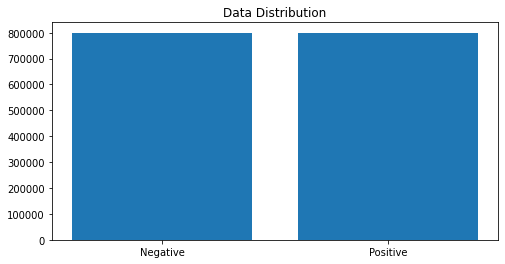

In [4]:
instances = df.label.value_counts()

plt.figure(figsize=(8,4))
plt.bar(instances.index, instances.values)
plt.title("Data Distribution")

## Preprocess

In [5]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer

stop_words = stopwords.words('english')
stemmer = SnowballStemmer('english')

punctuations_and_dummies = "@\S+|https?:\S+|http?:\S|[^A-Za-z0-9]+"



'''
def preprocess(df, will_be_stemmed=False):
    for index, row in df.iterrows():
        tweet = row.tweet
        tweet = re.sub(punctuations_and_dummies, ' ', str(tweet).lower()).strip()
        tokens = []
        for token in tweet.split():
            if token not in stop_words:
                if will_be_stemmed:
                    tokens.append(stemmer.stem(token))
                else:
                    tokens.append(token)
        df.tweet = " ".join(tokens)


preprocess(df.tweet)
'''


def preprocess(tweet, will_be_stemmed=False):
        tweet = re.sub(punctuations_and_dummies, ' ', str(tweet).lower()).strip()
        tokens = []
        for token in tweet.split():
            if token not in stop_words:
                if will_be_stemmed:
                    tokens.append(stemmer.stem(token))
                else:
                    tokens.append(token)
        return " ".join(tokens)
    
df.tweet = df.tweet.apply(lambda tw: preprocess(tw))

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\gokse\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [6]:
# Remove 0 length tweets
df = df[df.iloc[:,1].astype(str).str.len()!=0]

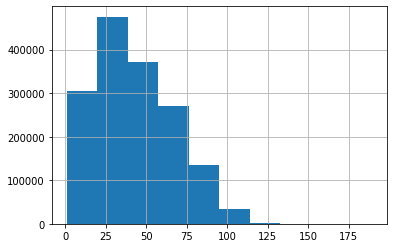

count    1.592328e+06
mean     4.279740e+01
std      2.415896e+01
min      1.000000e+00
25%      2.300000e+01
50%      3.900000e+01
75%      6.000000e+01
max      1.890000e+02
dtype: float64

In [7]:
tweets_len = [len(x) for x in df['tweet']]
pd.Series(tweets_len).hist()
plt.show()
pd.Series(tweets_len).describe()

### Number of Letters

In [8]:
all_str = ""
for i in df.tweet:
    all_str += i

In [9]:
from collections import Counter

letter_list = list(all_str)
my_counter = Counter(letter_list)

letter_df = pd.DataFrame.from_dict(my_counter, orient='index').reset_index()
letter_df = letter_df.rename(columns={'index':'letter', 0:'frequency'})
letter_df = letter_df.loc[letter_df['letter'].isin(['a','b','c','d','e','f','g','h','i','j','k','l','m','n','o','p','q','r','s','t','u','v','w','x','y','z'])]
letter_df['all_tweets_relative_freq']=letter_df['frequency']/letter_df['frequency'].sum()
letter_df = letter_df.sort_values('letter')

english = pd.read_csv('../data/letter_frequency_en_US.csv')
english['expected_relative_frequency'] = english['count']/english['count'].sum()
english = english.drop(['count'], axis=1)

letter_df = pd.merge(letter_df, english, on='letter')
letter_df['expected'] = np.round(letter_df['expected_relative_frequency']*letter_df['frequency'].sum(),0)
letter_df = letter_df.reset_index().drop(['index'], axis=1)
letter_df

,letter,frequency,all_tweets_relative_freq,expected_relative_frequency,expected
0,a,4547601,0.078816,0.081238,4687379.0
1,b,975326,0.016904,0.014893,859300.0
2,c,1705409,0.029557,0.027114,1564464.0
3,d,2289515,0.039680,0.043192,2492128.0
4,e,6471295,0.112156,0.120195,6935169.0
5,f,878849,0.015232,0.023039,1329304.0
6,g,2231747,0.038679,0.020257,1168838.0
7,h,2234047,0.038719,0.059215,3416628.0
8,i,3779579,0.065505,0.073054,4215160.0
9,j,143817,0.002493,0.001031,59502.0


<AxesSubplot:ylabel='letter'>

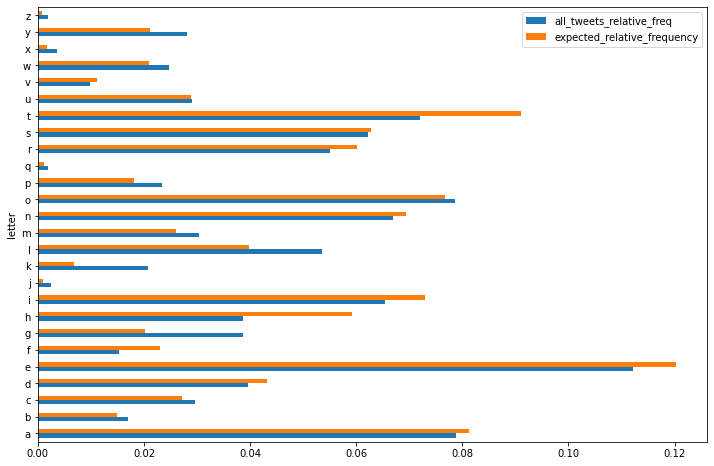

In [10]:
letter_df.plot(x="letter", y=["all_tweets_relative_freq", "expected_relative_frequency"], kind="barh", figsize=(12,8))

#### Compare the Observed Frequencies with the Expected Frequencies in English 

In [11]:
from scipy.stats import chi2_contingency
# Chi-square test of independence.
c, p, dof, expected = chi2_contingency(letter_df[['frequency', 'expected']])
p

0.0

We get that the p-value (p) is 0 which implies that the letter frequency does not follow the same distribution with what we see in English tests, although the Pearson correlation is too high (~96.7%).

In [12]:
letter_df[['frequency', 'expected']].corr()

,frequency,expected
frequency,1.000000,0.967421
expected,0.967421,1.000000


In [13]:
df1 = df.copy()

df1['number_of_characters'] = [len(tw) for tw in df1.tweet]
df1

,label,tweet,number_of_characters
0,Negative,awww bummer shoulda got david carr third day,44
1,Negative,upset update facebook texting might cry result...,69
2,Negative,dived many times ball managed save 50 rest go ...,52
3,Negative,whole body feels itchy like fire,32
4,Negative,behaving mad see,16
...,...,...,...
1599995,Positive,woke school best feeling ever,29
1599996,Positive,thewdb com cool hear old walt interviews,40
1599997,Positive,ready mojo makeover ask details,31
1599998,Positive,happy 38th birthday boo alll time tupac amaru ...,52


In [14]:
df1.number_of_characters.max()

189

In [15]:
df1.number_of_characters.min()

1

In [16]:
df1.number_of_characters.mean()

42.7974010379771

In [17]:
df1.number_of_characters.std()

24.158961650697616

## Number of Words

In [18]:
df1['number_of_words'] = [len(tw.split()) for tw in df1.tweet]
df1

,label,tweet,number_of_characters,number_of_words
0,Negative,awww bummer shoulda got david carr third day,44,8
1,Negative,upset update facebook texting might cry result...,69,11
2,Negative,dived many times ball managed save 50 rest go ...,52,10
3,Negative,whole body feels itchy like fire,32,6
4,Negative,behaving mad see,16,3
...,...,...,...,...
1599995,Positive,woke school best feeling ever,29,5
1599996,Positive,thewdb com cool hear old walt interviews,40,7
1599997,Positive,ready mojo makeover ask details,31,5
1599998,Positive,happy 38th birthday boo alll time tupac amaru ...,52,9


In [19]:
df1.number_of_words.max()

50

In [20]:
df1.number_of_words.min()

1

In [21]:
df1.number_of_words.mean()

7.244474128445898

In [22]:
df1.number_of_words.std()

4.030421805719796

### Positives + Negatives

<BarContainer object of 20 artists>

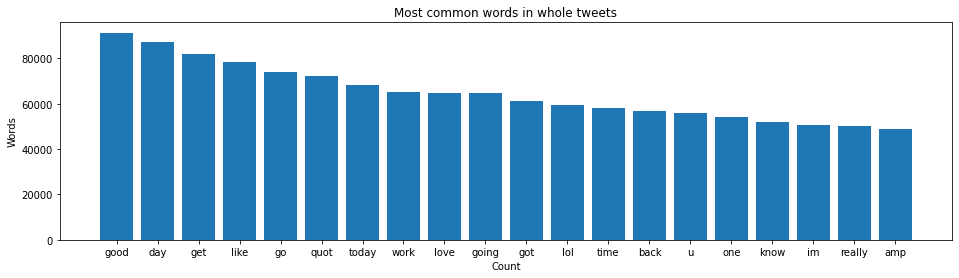

In [23]:
import collections
from wordcloud import WordCloud
from nltk import word_tokenize, sent_tokenize
from nltk.util import ngrams

all_tweets = ' '.join(df['tweet'].str.lower())

f_words = [word for word in all_tweets.split()]
counted_words = collections.Counter(f_words)

words = []
counts = []
for letter, count in counted_words.most_common(20):
    words.append(letter)
    counts.append(count)
    
plt.figure(figsize = (16, 4))
plt.title('Most common words in whole tweets')
plt.xlabel('Count')
plt.ylabel('Words')
plt.bar(words, counts)

### Positives

<BarContainer object of 20 artists>

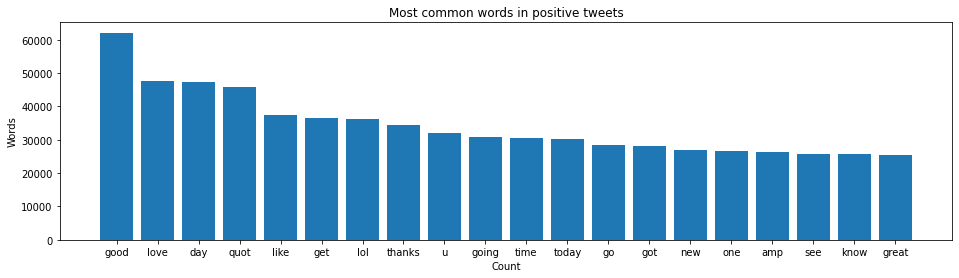

In [24]:
all_tweets = ' '.join(df[df.label == 'Positive'].tweet.str.lower())

f_words = [word for word in all_tweets.split()]
counted_words = collections.Counter(f_words)

words = []
counts = []
for letter, count in counted_words.most_common(20):
    words.append(letter)
    counts.append(count)
    
plt.figure(figsize = (16, 4))
plt.title('Most common words in positive tweets')
plt.xlabel('Count')
plt.ylabel('Words')
plt.bar(words, counts)

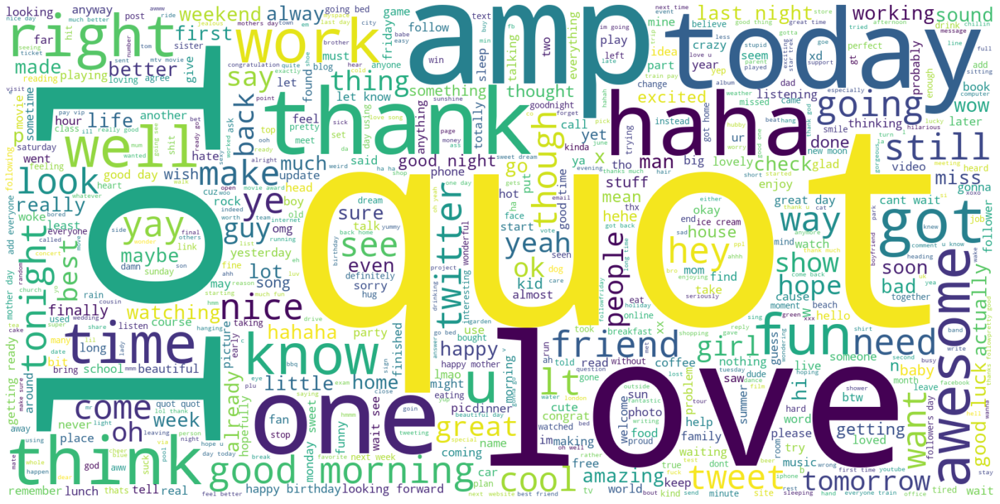

In [25]:
plt.figure(figsize = (25, 25))
plt.axis('off')
wordcloud_fig = WordCloud(max_words = 2000 , width = 1600 , height = 800, background_color ='white', min_font_size = 10).generate(" ".join(df[df.label == 'Positive'].tweet))
plt.imshow(wordcloud_fig, interpolation = 'bilinear')

### Negatives

<BarContainer object of 20 artists>

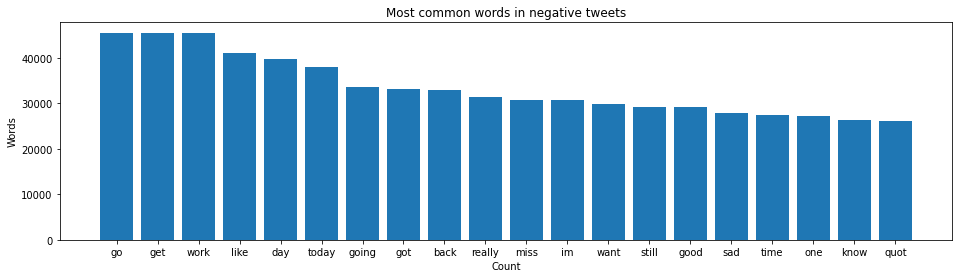

In [26]:
all_tweets = ' '.join(df[df.label == 'Negative'].tweet.str.lower())

f_words = [word for word in all_tweets.split()]
counted_words = collections.Counter(f_words)

words = []
counts = []
for letter, count in counted_words.most_common(20):
    words.append(letter)
    counts.append(count)
    
plt.figure(figsize = (16, 4))
plt.title('Most common words in negative tweets')
plt.xlabel('Count')
plt.ylabel('Words')
plt.bar(words, counts)

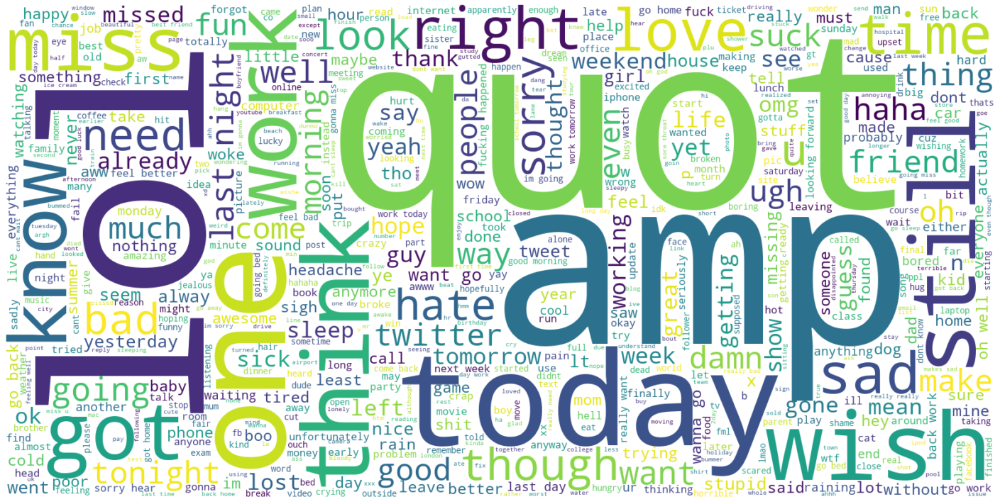

In [27]:
from wordcloud import WordCloud

plt.figure(figsize = (25, 25))
plt.axis('off')
wordcloud_fig = WordCloud(max_words = 2000 , width = 1600 , height = 800, background_color ='white', min_font_size = 10).generate(" ".join(df[df.label == 'Negative'].tweet))
plt.imshow(wordcloud_fig, interpolation = 'bilinear')

### Training Data and Test Data Splitting

In [8]:
from sklearn.model_selection import train_test_split

train_data, test_data = train_test_split(df, test_size=0.2, random_state=7)
print('Training Data', len(train_data), 'Test Data', len(test_data))

train_data.head(10)

Training Data 1273862 Test Data 318466


,label,tweet
927561,Positive,thank
810082,Positive,shakin money tree headed back car business
1153331,Positive,tasmania okay chat ya later
988182,Positive,yeah 100 tab storm towelled raiders awesome
543405,Negative,happy mari asleep gotta start laundry b4 wakes...
22855,Negative,wanting go city raining gotta homework 2
483675,Negative,sitting home bored x
667231,Negative,miss amy cards
1370823,Positive,dinner hubby two us 10 coupo
94439,Negative,know prob running around


In [9]:
test_data.head(10)

,label,tweet
1414233,Positive,nice job thanks
181653,Negative,way wanna shower n get pretty
788422,Negative,woke early think anyone completely bored
76646,Negative,lucky u scheduled today happy camper lol
972366,Positive,way cute curt hope school raised tons money lo...
797869,Negative,stupid braces making lips dry
1129919,Positive,good miss
1036078,Positive,past days sucked hopefully weekend happier
550532,Negative,marcus doubt megan fox good 2 years might get ...
1365388,Positive,going school contempt fash exams going conquer...


### Tokenization

In [10]:
from keras.preprocessing.text import Tokenizer

tokenizer = Tokenizer()
tokenizer.fit_on_texts(train_data.tweet)
word_index = tokenizer.word_index
vocab_size = len(tokenizer.word_index) + 1
print("Vocabulary Size :", vocab_size)

Using TensorFlow backend.


Vocabulary Size : 290458


In [11]:
from keras.preprocessing.sequence import pad_sequences

X_train = pad_sequences(tokenizer.texts_to_sequences(train_data.tweet), maxlen = 30)
X_test = pad_sequences(tokenizer.texts_to_sequences(test_data.tweet), maxlen = 30)

print("X_train, X_test", X_train.shape, X_test.shape)

labels = train_data.label.unique().tolist()

X_train, X_test (1273862, 30) (318466, 30)


In [12]:
encoder = LabelEncoder()
encoder.fit(train_data.label.to_list())

y_train = encoder.transform(train_data.label.to_list())
y_test = encoder.transform(test_data.label.to_list())

y_train = y_train.reshape(-1,1)
y_test = y_test.reshape(-1,1)

print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

y_train shape: (1273862, 1)
y_test shape: (318466, 1)


### GLOVE Embedding

In [13]:
MODELS_PATH = '../models'
EMBEDDING_DIMENSION = 300

In [14]:
import tensorflow as tf

BATCH_SIZE = 1024
EPOCHS = 10
LR = 1e-3

embeddings_index = {}

glove_file = open('../glove/glove.6B.300d.txt', encoding='utf8')
for line in glove_file:
    values = line.split()
    word = value = values[0]
    coefficients = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefficients
glove_file.close()

print('%s word vectors.' % len(embeddings_index))


embedding_matrix = np.zeros((vocab_size, EMBEDDING_DIMENSION))
for word, i in word_index.items():
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector
        
embedding_layer = tf.keras.layers.Embedding(vocab_size, EMBEDDING_DIMENSION, weights=[embedding_matrix], input_length=30, trainable=False)

400000 word vectors.


## Feature Extraction

### Bag of Words

In [15]:
from sklearn.feature_extraction.text import CountVectorizer

K = 20000
shuffled_df = df.sample(frac=1).reset_index(drop=True)
first_K_tweets = shuffled_df['tweet'].head(K)

vectorizer = CountVectorizer(stop_words='english')
vectorizer.fit(first_K_tweets)

# Dictionary
vectorizer.get_feature_names()

['00',
 '000',
 '000th',
 '001',
 '00p',
 '00pm',
 '01253',
 '02',
 '021',
 '03',
 '03xyou',
 '04',
 '05',
 '05pm',
 '06',
 '060594',
 '06am',
 '07',
 '071',
 '076',
 '08',
 '09',
 '095',
 '09am',
 '0b5',
 '0k',
 '0r',
 '0ut',
 '10',
 '100',
 '1000',
 '1000s',
 '1000th',
 '1008ha',
 '100s',
 '100th',
 '101',
 '1010',
 '102',
 '103',
 '1030',
 '104',
 '105',
 '1055th',
 '106',
 '108',
 '10am',
 '10c',
 '10days',
 '10hrs',
 '10ish',
 '10kg',
 '10mins',
 '10more',
 '10pm',
 '10shoe',
 '10th',
 '10v',
 '10yo',
 '11',
 '110',
 '111',
 '1130',
 '115',
 '116',
 '117',
 '118',
 '119',
 '11am',
 '11pm',
 '11th',
 '12',
 '120',
 '1200',
 '12169',
 '123',
 '1245',
 '1260',
 '127',
 '1276',
 '12am',
 '12pm',
 '13',
 '130',
 '134',
 '135',
 '135154',
 '136',
 '13pm',
 '14',
 '140',
 '140chars',
 '145',
 '146',
 '148',
 '14am',
 '14th',
 '15',
 '150',
 '1500',
 '15a',
 '15am',
 '15mins',
 '15th',
 '16',
 '160',
 '16035',
 '16th',
 '17',
 '170',
 '1700',
 '17c',
 '17k',
 '17th',
 '18',
 '1800',
 '182

In [16]:
# Transform each tweets in vector space
vector = vectorizer.transform(first_K_tweets)
vector_spaces = vector.toarray()

vector_spaces

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [17]:
for i, v in zip(first_K_tweets, vector_spaces):
    print(i)
    print(v)

get better omg still dont believe tgot picture soo sad gonna see u
[0 0 0 ... 0 0 0]
finally fell tweeting hype fml
[0 0 0 ... 0 0 0]
soooo could dance flash flash song
[0 0 0 ... 0 0 0]
jack whitehall looks dead bored lmaooo
[0 0 0 ... 0 0 0]
welcome
[0 0 0 ... 0 0 0]
amazing mother day girls got gc finish line get new kiks wear believers never die concert fri night
[0 0 0 ... 0 0 0]
nope coquitlam
[0 0 0 ... 0 0 0]
reading new moon page downloading itunes agin get free audio chapter nm
[0 0 0 ... 0 0 0]
use phone mainly portable comp clarifying
[0 0 0 ... 0 0 0]
someone buy brand new ticket lt 3
[0 0 0 ... 0 0 0]
mmmm homemade alfredo pasta garlic bread lt 3
[0 0 0 ... 0 0 0]
updated friendster account answered comments wolla almost finished
[0 0 0 ... 0 0 0]
booozle today damn money
[0 0 0 ... 0 0 0]
get 100 followers day using www tweeterfollow com add everyone train pay vip
[0 0 0 ... 0 0 0]
ano kaya gagawin ko bukas thinking haaay
[0 0 0 ... 0 0 0]
rain weekend
[0 0 0 ... 0 0 0]


[0 0 0 ... 0 0 0]
oh pissin yrly physical work canada karen230683
[0 0 0 ... 0 0 0]
ugh 92 degrees tomorrow
[0 0 0 ... 0 0 0]
guess time lmao cause
[0 0 0 ... 0 0 0]
work sucks give another three days please
[0 0 0 ... 0 0 0]
wait trying get 5 star upgrade dte michigan sold
[0 0 0 ... 0 0 0]
allowed means go see katie allowed spent night deerinfested house huh
[0 0 0 ... 0 0 0]
sprained ankle drunk walk home
[0 0 0 ... 0 0 0]
feeling sorry emasculation poor bun bun losing ball balls tomorrow
[0 0 0 ... 0 0 0]
hopefully im one
[0 0 0 ... 0 0 0]
still sick voice quite enjoyed eurovision last nite uk well best bit natalie aiden bgt though
[0 0 0 ... 0 0 0]
jammin bullet ferry goes met rain cool wanna skate john 3 3
[0 0 0 ... 0 0 0]
eating ur right forgot bite lunch thx
[0 0 0 ... 0 0 0]
wish interest pursuing field could wear scrubs work every day
[0 0 0 ... 0 0 0]
bb back commish bitches
[0 0 0 ... 0 0 0]
looking little pink
[0 0 0 ... 0 0 0]
currently experimenting home made version kf

[0 0 0 ... 0 0 0]
investigating javahelp seems cool seems use latex instead html humm needs researching
[0 0 0 ... 0 0 0]
woken mess looking forward week partying
[0 0 0 ... 0 0 0]
diamonds forever lt 3 oli sykes beautiful
[0 0 0 ... 0 0 0]
right back
[0 0 0 ... 0 0 0]
glad hear theory least well founded would apl de ap
[0 0 0 ... 0 0 0]
biking bibles twitter visit new website www biblica com beta version officially launches july
[0 0 0 ... 0 0 0]
u feeling better need careful
[0 0 0 ... 0 0 0]
sucks sorry manage
[0 0 0 ... 0 0 0]
throwin old school know love
[0 0 0 ... 0 0 0]
oh goodness feel sick bad morning already
[0 0 0 ... 0 0 0]
wait vid nyc life treating
[0 0 0 ... 0 0 0]
hi david glad philippines
[0 0 0 ... 0 0 0]
new amp ad great backing track lol 6 days go top hats ready
[0 0 0 ... 0 0 0]
alot hot guys save mart today aunt mtv awards tonight still study history dang
[0 0 0 ... 0 0 0]
congrats looks great wait get new layout
[0 0 0 ... 0 0 0]
everyone else love michaelsheen t

[0 0 0 ... 0 0 0]
leaving work
[0 0 0 ... 0 0 0]
clean
[0 0 0 ... 0 0 0]
enjoyed everything today love patient sleep well tonight america
[0 0 0 ... 0 0 0]
enjoing weekend stuff 4 school work
[0 0 0 ... 0 0 0]
documentary dateline amazing amazing role model love music
[0 0 0 ... 0 0 0]
dreadfully sorry x
[0 0 0 ... 0 0 0]
hello everyone
[0 0 0 ... 0 0 0]
tower burger finished
[0 0 0 ... 0 0 0]
lighter note appears laptops status might moving money approved account
[0 0 0 ... 0 0 0]
probably bit early twitters time come soon enough
[0 0 0 ... 0 0 0]
surgery effin hurts
[0 0 0 ... 0 0 0]
ok jus woke weirdest dream ever dreams sad real
[0 0 0 ... 0 0 0]
good morning tweeple ready productive day programming final 3pm channel force towards
[0 0 0 ... 0 0 0]
darn oh well
[0 0 0 ... 0 0 0]
shit know kobr biased lol glad pick gone
[0 0 0 ... 0 0 0]
exams exams sheesh sick got new lipstick la mac today
[0 0 0 ... 0 0 0]
people signing never know ask tom thanks spell disaster benjamindyer pretti

[0 0 0 ... 0 0 0]
yup well absorbing researching info mo steep learning kurb mixed larger mountain climb surf today
[0 0 0 ... 0 0 0]
looks like still sick get well soon know pink bass much cooler blue one
[0 0 0 ... 0 0 0]
watch concert live mentioned ashley yay
[0 0 0 ... 0 0 0]
becoming quite th little cook
[0 0 0 ... 0 0 0]
thunderstorms today got 3 dogs freaking seems ones lived outside kennel arriving poor little guys
[0 0 0 ... 0 0 0]
checking muchmusic site bad awards weekend
[0 0 0 ... 0 0 0]
aww thanks well ur ever summer wknd excellent evening hun
[0 0 0 ... 0 0 0]
hello hahaha chatting denise phillip facebook 80 away finish assignment
[0 0 0 ... 0 0 0]
bad man totally misread arg
[0 0 0 ... 0 0 0]
yay giants
[0 0 0 ... 0 0 0]
thanks following im following back
[0 0 0 ... 0 0 0]
koehlerbear tomwitcomb silly silly drunky mcstumbles suffering twat schoolnight sympathy deserved
[0 0 0 ... 0 0 0]
reason lived hes reason im begging die
[0 0 0 ... 0 0 0]
twitter twat
[0 0 0 ... 0 

[0 0 0 ... 0 0 0]
sorry dev
[0 0 0 ... 0 0 0]
climb cancelled project airport tomorrow find new company climb fuji
[0 0 0 ... 0 0 0]
going go look parrots
[0 0 0 ... 0 0 0]
thats well least right hee hee
[0 0 0 ... 0 0 0]
cant believe sean smith tweeted
[0 0 0 ... 0 0 0]
decoraters gone enjoy nice peacful evening revising
[0 0 0 ... 0 0 0]
havin dry savanna drink kreuzberg yeeehaaa cidre rules
[0 0 0 ... 0 0 0]
sounds like frustrating experience
[0 0 0 ... 0 0 0]
happens viewed site atm oh love
[0 0 0 ... 0 0 0]
manchester run soaked stood next colin jackson amp jonathan edwards got good photos
[0 0 0 ... 0 0 0]
sure time however since rained day today bad
[0 0 0 ... 0 0 0]
going wish said getting ready meant making coffee getting lots pillows
[0 0 0 ... 0 0 0]
like request song demi bout friendship
[0 0 0 ... 0 0 0]
could super power
[0 0 0 ... 0 0 0]
love vegas n girls gonna go wander thestripand see trouble get anyone else
[0 0 0 ... 0 0 0]
gtd folks need faster way input blackberry

[0 0 0 ... 0 0 0]
twiggas way hospitak excruciating pain back n deal wish luck n let hope nothin serious
[0 0 0 ... 0 0 0]
know feels
[0 0 0 ... 0 0 0]
yeah need mellow onself cos dotn want u think dont care
[0 0 0 ... 0 0 0]
oh thank
[0 0 0 ... 0 0 0]
oh well carry
[0 0 0 ... 0 0 0]
reboot requested get look antil done
[0 0 0 ... 0 0 0]
gotcha return favor babylove
[0 0 0 ... 0 0 0]
bridge terabithia depressing
[0 0 0 ... 0 0 0]
think joined late today deal perhaps next time formspring blastmediapr could yats tweetup
[0 0 0 ... 0 0 0]
aw gonna subscribe coz hilarious bird
[0 0 0 ... 0 0 0]
u mean hq one 12 min home unreal find lots things barns ppl always ringing
[0 0 0 ... 0 0 0]
rain go away already cold miss summer dammm xx
[0 0 0 ... 0 0 0]
eating ice cream laundry uploading photos
[0 0 0 ... 0 0 0]
oh soo cool sleeping wake tomorrow listen del haha nighty
[0 0 0 ... 0 0 0]
man work busy today 2people called sick old perverts keep rolling sadness abounds
[0 0 0 ... 0 0 0]
hard any

[0 0 0 ... 0 0 0]
vck 85 realized find new coffee shop north move sure exist dahhhh
[0 0 0 ... 0 0 0]
list wanna see
[0 0 0 ... 0 0 0]
wishing bought another toyota
[0 0 0 ... 0 0 0]
heyyy myspace twitter
[0 0 0 ... 0 0 0]
rib factory yum
[0 0 0 ... 0 0 0]
internet new days think also twitpic favourite monkey end
[0 0 0 ... 0 0 0]
upset miss used
[0 0 0 ... 0 0 0]
line inside costco wasnt bad 5 min tops yay
[0 0 0 ... 0 0 0]
well let forget moving lol
[0 0 0 ... 0 0 0]
miu mius big hope someone else enjoy
[0 0 0 ... 0 0 0]
got chocolates theyre give sister
[0 0 0 ... 0 0 0]
picture anymore either
[0 0 0 ... 0 0 0]
sad day icey hot fails work wonders
[0 0 0 ... 0 0 0]
batti net damn wlink
[0 0 0 ... 0 0 0]
says goodnight
[0 0 0 ... 0 0 0]
headed 2 napa
[0 0 0 ... 0 0 0]
tmmrw candelaria hm lunch
[0 0 0 ... 0 0 0]
mouth watering 40 min wait inside 1 hour outside
[0 0 0 ... 0 0 0]
yeah pretty cloudy today hope rain weird like june 18th still somewhat cold
[0 0 0 ... 0 0 0]
want work today

[0 0 0 ... 0 0 0]
us pro life period find man disgusting
[0 0 0 ... 0 0 0]
apparently going nice weather two days going rain thursday nbd like day grad
[0 0 0 ... 0 0 0]
still searching jobs send positive karma way please
[0 0 0 ... 0 0 0]
weird la fitness different cities though gt c renee
[0 0 0 ... 0 0 0]
im learning ai difficult use
[0 0 0 ... 0 0 0]
maybe twittering hehe rant person next
[0 0 0 ... 0 0 0]
home airsofting cold feet tired
[0 0 0 ... 0 0 0]
poorly sick
[0 0 0 ... 0 0 0]
oh dear red ring death xbox getting ready introduce daughter tetris
[0 0 0 ... 0 0 0]
heading church good day
[0 0 0 ... 0 0 0]
playing quot fly quot jb keyboard love song well love every song jonas brothers breakfast time
[0 0 0 ... 0 0 0]
used neato thats pretty nifty
[0 0 0 ... 0 0 0]
waitinn ridee
[0 0 0 ... 0 0 0]
yes thank u 4 spoiling us many tweets today xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
[0 0 0 ... 0 0 0]
coz arr fuggeddit kamplecks shtuff ittiz
[0 0 0 ... 

[0 0 0 ... 0 0 0]
ayeeee girl
[0 0 0 ... 0 0 0]
favourite tori song
[0 0 0 ... 0 0 0]
5 year old daughter sang happy bday say number hope get hear soooo cute
[0 0 0 ... 0 0 0]
wifi working home last night morning hope working get home
[0 0 0 ... 0 0 0]
iconfess sometimes forget boyfriend
[0 0 0 ... 0 0 0]
well almost pizza time wait
[0 0 0 ... 0 0 0]
add u fb pg
[0 0 0 ... 0 0 0]
20 lbs amp counting
[0 0 0 ... 0 0 0]
didnt close pretty sure crying school year though weill crying
[0 0 0 ... 0 0 0]
sounds like fun ya
[0 0 0 ... 0 0 0]
looking tweet best dad ever luckey never met dad really mean step dad
[0 0 0 ... 0 0 0]
2012 end world
[0 0 0 ... 0 0 0]
get go waverley rain
[0 0 0 ... 0 0 0]
sooo true good adive trace haha
[0 0 0 ... 0 0 0]
tweet tweet dumb question one really looks anyway
[0 0 0 ... 0 0 0]
think ima get sick throat feels scratchy mannn shouda turned tht dang fan b4 fell asleep
[0 0 0 ... 0 0 0]
cute smiley shit look mad happy reason looks fat 0
[0 0 0 ... 0 0 0]
god bac

[0 0 0 ... 0 0 0]
let embrace heat jakarta jemur karpet hahaha another tweet ibu ibu
[0 0 0 ... 0 0 0]
gonna get guess yay
[0 0 0 ... 0 0 0]
damn sucks hope find dog poor daisy
[0 0 0 ... 0 0 0]
chillen thinking make breakfast lil bit
[0 0 0 ... 0 0 0]
oh got home hot uniform take mmmm one ladies
[0 0 0 ... 0 0 0]
got home fifteen minutes ago
[0 0 0 ... 0 0 0]
feel horrible
[0 0 0 ... 0 0 0]
sigh bad mood igda
[0 0 0 ... 0 0 0]
going madies house
[0 0 0 ... 0 0 0]
hm thanks
[0 0 0 ... 0 0 0]
sittin kaylee eating buffalo wild wings yum
[0 0 0 ... 0 0 0]
morning
[0 0 0 ... 0 0 0]
youuu fun
[0 0 0 ... 0 0 0]
trapped thunder storm w dog
[0 0 0 ... 0 0 0]
missith keithington shalt happy returniths
[0 0 0 ... 0 0 0]
im done 2 000th post
[0 0 1 ... 0 0 0]
lmao eminem getting ass balls face lmfao hahahahahahahahahahaha dead please tell staged
[0 0 0 ... 0 0 0]
hello twitter
[0 0 0 ... 0 0 0]
going cousins game weeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeee
[0 0 0 ... 0 0 0]
know lol know

yey congrats
[0 0 0 ... 0 0 0]
venn genius hilarious thanks sharing
[0 0 0 ... 0 0 0]
twitter much busy hate coz suppose chillaxing shit
[0 0 0 ... 0 0 0]
funny thing found women dangerous expensive fun
[0 0 0 ... 0 0 0]
tama think
[0 0 0 ... 0 0 0]
could get easton could join us
[0 0 0 ... 0 0 0]
one day cousin christisum get married could see mini kennedys running around
[0 0 0 ... 0 0 0]
yey david top 3 mr twitter universe
[0 0 0 ... 0 0 0]
per diddy new word tweetassness vote tweet earlier falls category tweetassness
[0 0 0 ... 0 0 0]
much
[0 0 0 ... 0 0 0]
need crediiiiit run fast
[0 0 0 ... 0 0 0]
bostonnnnnnn lt 3 lovers minus laukemp
[0 0 0 ... 0 0 0]
cleaning house finally running errands wish back beach
[0 0 0 ... 0 0 0]
played like crap
[0 0 0 ... 0 0 0]
lovely days sun shined last 4 days hot hot hot
[0 0 0 ... 0 0 0]
dad bought blackberry storm
[0 0 0 ... 0 0 0]
lls dog stole toilet paper mom would kill knew typing right
[0 0 0 ... 0 0 0]
need sumone italian translate sumth

[0 0 0 ... 0 0 0]
played netball rain today really fun tired 4 hrs sleep conpared 12 usually hav
[0 0 0 ... 0 0 0]
leaving delhi short break jabalpur
[0 0 0 ... 0 0 0]
never uncomfortable car 3 hours left one times stumps come handy ash stay away
[0 0 0 ... 0 0 0]
miley post gone happened see
[0 0 0 ... 0 0 0]
yawn morning bro er mean afternoon
[0 0 0 ... 0 0 0]
wow strange perez awesome though
[0 0 0 ... 0 0 0]
still bus gradnight
[0 0 0 ... 0 0 0]
major headache
[0 0 0 ... 0 0 0]
perrilewis thanks since kitten last 3
[0 0 0 ... 0 0 0]
listen quot los angeloser quot yo yo baby
[0 0 0 ... 0 0 0]
sad morning two nuborn wild rabbits found dead hole think drowned upsets good way start day
[0 0 0 ... 0 0 0]
take look facebook group come x
[0 0 0 ... 0 0 0]
gosh mistook hrishita bhatt genelia apologies ladies seems like anesthesia crawled jaw eyes nd brain
[0 0 0 ... 0 0 0]
first day summer friday dont want end school
[0 0 0 ... 0 0 0]
power nap headed 2 work got graveyard shift today see m

[0 0 0 ... 0 0 0]
time sweetest dreams g night tweets
[0 0 0 ... 0 0 0]
goodmorning twitter world getting phone today thank lord dying last night knowing receiving certain texts
[0 0 0 ... 0 0 0]
disappointed
[0 0 0 ... 0 0 0]
shiraz dorm universities danger fiance leave
[0 0 0 ... 0 0 0]
idea top old noggin
[0 0 0 ... 0 0 0]
yeah except spurs champs like usually
[0 0 0 ... 0 0 0]
ahh workout good
[0 0 0 ... 0 0 0]
ohh sonds fam luv sooo borde sittin home watchin telly best mate town right u get
[0 0 0 ... 0 0 0]
favorite people mcad gone miss terribly
[0 0 0 ... 0 0 0]
birthday two days god turning 23 already turned 22 little ago swear haha day go
[0 0 0 ... 0 0 0]
made twitter
[0 0 0 ... 0 0 0]
home party nice piece penis cake kids know best mom ever
[0 0 0 ... 0 0 0]
much much lil time
[0 0 0 ... 0 0 0]
welcome back
[0 0 0 ... 0 0 0]
tests nexttt week
[0 0 0 ... 0 0 0]
quiet time hotel room head go shopping
[0 0 0 ... 0 0 0]
someone please reply something funny something make feel b

[0 0 0 ... 0 0 0]
sorry hear
[0 0 0 ... 0 0 0]
happy b day
[0 0 0 ... 0 0 0]
late missed 1st day international
[0 0 0 ... 0 0 0]
sure mean packs mine go get problem grabs car keys mars snickers
[0 0 0 ... 0 0 0]
nite twits got early game tomorrow u see dj send em nancydee online party spot tonight
[0 0 0 ... 0 0 0]
goodnight twitter world missed
[0 0 0 ... 0 0 0]
made redundant 2day im soooo sad kno msg dr cullen wud make day
[0 0 0 ... 0 0 0]
stop cupertino say hi
[0 0 0 ... 0 0 0]
cute roy
[0 0 0 ... 0 0 0]
12 hours away big day asu go wooo
[0 0 0 ... 0 0 0]
umm kinda fell love one today pretty good price offered
[0 0 0 ... 0 0 0]
shozu app improved since last used still needs tumblr twitter login fails
[0 0 0 ... 0 0 0]
crap insurance company want cover loss glasses
[0 0 0 ... 0 0 0]
huzzah looks like ready fun mind ouzo
[0 0 0 ... 0 0 0]
57 chemistry
[0 0 0 ... 0 0 0]
glad see back woke nap
[0 0 0 ... 0 0 0]
bout get lifted go cute outside somewhere nigga stop flow matter hard trie

[0 0 0 ... 0 0 0]
thanks scared dentists looks like going get go
[0 0 0 ... 0 0 0]
cat lovers poem cats
[0 0 0 ... 0 0 0]
aww think rach staying
[0 0 0 ... 0 0 0]
ugh still awake
[0 0 0 ... 0 0 0]
hi kuya zig miss u like crazy haha twitter na
[0 0 0 ... 0 0 0]
back india
[0 0 0 ... 0 0 0]
getting ready go class 6 8 40 dont wanna go
[0 0 0 ... 0 0 0]
back room cleaning
[0 0 0 ... 0 0 0]
day bored
[0 0 0 ... 0 0 0]
couch oh ok muay thai maybe muay thai couch yay
[0 0 0 ... 0 0 0]
welcome wallpaper currently escape new york
[0 0 0 ... 0 0 0]
hello tom youuuuu tweet backkkk xx
[0 0 0 ... 0 0 0]
shattered bed uncharacteristically early
[0 0 0 ... 0 0 0]
thanks
[0 0 0 ... 0 0 0]
heard gayweed pollen really high right know wonder getting reactions
[0 0 0 ... 0 0 0]
turkey burger love em
[0 0 0 ... 0 0 0]
personally like one already way many purses would buy lol
[0 0 0 ... 0 0 0]
interview st ignatius
[0 0 0 ... 0 0 0]
yeah lolzzz got really stressed took cool
[0 0 0 ... 0 0 0]
saw bra thats n

[0 0 0 ... 0 0 0]
ate much popcorn
[0 0 0 ... 0 0 0]
excellent camera catch moving quot high velocity quot
[0 0 0 ... 0 0 0]
awesome
[0 0 0 ... 0 0 0]
hahaa cute came babysit
[0 0 0 ... 0 0 0]
look forward sitting sun guess clouds
[0 0 0 ... 0 0 0]
thats great needing summer goodies
[0 0 0 ... 0 0 0]
howz things girls glad see ur getting things ur gunna amaze woteva u xx
[0 0 0 ... 0 0 0]
happy needs sleep get better waking hurts like bitch makes want stay hate sick
[0 0 0 ... 0 0 0]
packing apt become internet less sad times
[0 0 0 ... 0 0 0]
ahahha mean time help us come ideas plans
[0 0 0 ... 0 0 0]
wahhh north american house hippo real really wanted one makes sad
[0 0 0 ... 0 0 0]
yesss gonna amazing love cannot wait l
[0 0 0 ... 0 0 0]
got twitter side bar well good
[0 0 0 ... 0 0 0]
lol certainly sounds like hope great time
[0 0 0 ... 0 0 0]
hahaha almost grounded buttttt talk way anything stupid old bish
[0 0 0 ... 0 0 0]
second time insurance agent butt dialed sometimes definit

[0 0 0 ... 0 0 0]
kids allowed wake least 9am bad think 7 30am good time get
[0 0 0 ... 0 0 0]
heyy sweetie well sick x
[0 0 0 ... 0 0 0]
never mind found gig work
[0 0 0 ... 0 0 0]
brilliant check thanks
[0 0 0 ... 0 0 0]
sounds like party street guess forgot invite
[0 0 0 ... 0 0 0]
still work
[0 0 0 ... 0 0 0]
nph gay
[0 0 0 ... 0 0 0]
three new awesome design clients week excited happy
[0 0 0 ... 0 0 0]
guess made th background page meeee
[0 0 0 ... 0 0 0]
arbor mist peach chardonnay
[0 0 0 ... 0 0 0]
studying weekend hate civics x
[0 0 0 ... 0 0 0]
welcome twibes victor m2e galleryvittoria wayofthewizard mysticmoons wow green namaste
[0 0 0 ... 0 0 0]
biggest loser makes cry
[0 0 0 ... 0 0 0]
getting lonely hollywood apartment stop airing show mtv
[0 0 0 ... 0 0 0]
day dreaming fuzzball snl
[0 0 0 ... 0 0 0]
going v fest mtl wait also see mtl looks summer
[0 0 0 ... 0 0 0]
enjoying merienda mom prepared saging na saba cooked salabat sarap cold rainy day
[0 0 0 ... 0 0 0]
lemonjat 

wow realize 10 30 bed work tomorrow night ladies clothdiapers
[0 0 0 ... 0 0 0]
fuuuuuck finish little less hour away done page
[0 0 0 ... 0 0 0]
tracecyrus cute
[0 0 0 ... 0 0 0]
peom writing good im almost finished post twitter
[0 0 0 ... 0 0 0]
ps dog beyond adorable staring bed think missed
[0 0 0 ... 0 0 0]
good luck tomorrow night cannot wait til london show
[0 0 0 ... 0 0 0]
phone calls like often different subject result feeling beaten pulp left dead
[0 0 0 ... 0 0 0]
lol sounds like plan
[0 0 0 ... 0 0 0]
yeah wont sitting us austins trouble getting tickets
[0 0 0 ... 0 0 0]
pc hmmmmmm surprised
[0 0 0 ... 0 0 0]
everyday holiday
[0 0 0 ... 0 0 0]
one step throwing revision window know nothing want curl evaporate
[0 0 0 ... 0 0 0]
home work going go visit son new apt leave tweet 2
[0 0 0 ... 0 0 0]
hic nhi u vi c qu
[0 0 0 ... 0 0 0]
2 cats 2 dogs 2 everything mismatched furniture every room
[0 0 0 ... 0 0 0]
sunday may 31st spring chester craftshow chester nj farmers market r

finally left school uni come yn cant wait til bulgariaaaa love katie price xxxxx
[0 0 0 ... 0 0 0]
add bb pin 207b7dc9 thank
[0 0 0 ... 0 0 0]
verify annie make wpv page made someone grabbed name end
[0 0 0 ... 0 0 0]
watching poor puppy
[0 0 0 ... 0 0 0]
sucks hairy donkey balls knowing hit x
[0 0 0 ... 0 0 0]
con seannery alright many billionaires
[0 0 0 ... 0 0 0]
overslept today rough day swear someones get
[0 0 0 ... 0 0 0]
still
[0 0 0 ... 0 0 0]
twitter really helping one replying think cancel acount
[0 0 0 ... 0 0 0]
went shopping summer clothes
[0 0 0 ... 0 0 0]
grrrrrrrr made super nice nice nice background twitter toooooooo big ah
[0 0 0 ... 0 0 0]
really eat chips dang nothing seems interesting anymore chips gone lol
[0 0 0 ... 0 0 0]
usually chat practices rather tools approachable
[0 0 0 ... 0 0 0]
still catch movie
[0 0 0 ... 0 0 0]
new piercing ouchies still sexy though cba college work need sleep
[0 0 0 ... 0 0 0]
miss redheaded man blanket hard almost push bed sleep p

[0 0 0 ... 0 0 0]
awww shit nigga playin hooky work damnit many ppl house
[0 0 0 ... 0 0 0]
cant make nati tonight babe got hella stuff plus work morn
[0 0 0 ... 0 0 0]
looking forward jazz concert tonight hoping kathy already keen eager always xx
[0 0 0 ... 0 0 0]
go feed herman minute clean room let herman pretty much every morning
[0 0 0 ... 0 0 0]
real like santa clause believe
[0 0 0 ... 0 0 0]
want sam max want magic gethering waiting day work soon though go work
[0 0 0 ... 0 0 0]
crying sun amp jin like sap daddio found
[0 0 0 ... 0 0 0]
amazing work getting ready babysitting hours lataaaa
[0 0 0 ... 0 0 0]
echipa bravo te salut weekend pl cut
[0 0 0 ... 0 0 0]
shopping sounds great done papers stressing life holloween ganna bad ass
[0 0 0 ... 0 0 0]
paid bills seems like moment paid another one mail
[0 0 0 ... 0 0 0]
ruined appetite eating cake first
[0 0 0 ... 0 0 0]
sheesh harsh words
[0 0 0 ... 0 0 0]
almost finished 600 word essay feel confident
[0 0 0 ... 0 0 0]
riding hor

[0 0 0 ... 0 0 0]
yo theze jersey cop really getin popin today pullin everybdy
[0 0 0 ... 0 0 0]
attempting begin end mind ye little faith victorious delicious chex party mix ever
[0 0 0 ... 0 0 0]
oh going miss thank goodness asb photobucket
[0 0 0 ... 0 0 0]
2 exams go better get revising genetics module hard sounds time next week peru
[0 0 0 ... 0 0 0]
depressed want know kiss
[0 0 0 ... 0 0 0]
work day get little break get hair done
[0 0 0 ... 0 0 0]
come could fly away together lets go rock rock rock love britney spears
[0 0 0 ... 0 0 0]
wants go home lotsa work finish
[0 0 0 ... 0 0 0]
left house alone brothers lmao
[0 0 0 ... 0 0 0]
love love love friends
[0 0 0 ... 0 0 0]
hey watched video posted site thanks plug hope happy final interview
[0 0 0 ... 0 0 0]
good yea issue last night way overloaded complain saw smoked camera
[0 0 0 ... 0 0 0]
buy sims 3 online 12am hoping play night realize download 7am tomorrow
[0 0 0 ... 0 0 0]
hungry gonna take ages cook roast
[0 0 0 ... 0 0 

[0 0 0 ... 0 0 0]
haha movie thaat good ugh pay classes soon lol
[0 0 0 ... 0 0 0]
probably able finish faster
[0 0 0 ... 0 0 0]
found copy ones walk away omelas score
[0 0 0 ... 0 0 0]
writing memo sec 120 54 florida apa ughh
[0 0 0 ... 0 0 0]
nasty bruise form falling last night 4 inch heels whie wine go well together
[0 0 0 ... 0 0 0]
sleep either
[0 0 0 ... 0 0 0]
caan wait love u guys please come back chile
[0 0 0 ... 0 0 0]
amazing still see sun im work yay
[0 0 0 ... 0 0 0]
woke wat dis fine day
[0 0 0 ... 0 0 0]
great night olive garden cream puffs bonfire best friends could better lovin summer 09
[0 0 0 ... 0 0 0]
well sticks travel humi ready go la however way feeling right may going ride
[0 0 0 ... 0 0 0]
daughter pushing bounce house photo
[0 0 0 ... 0 0 0]
loling amount people replying quot lt 3 u shaun lt 3 quot
[0 0 0 ... 0 0 0]
nope cherry grape
[0 0 0 ... 0 0 0]
see u eat man talked hop eating cereal lol
[0 0 0 ... 0 0 0]
found cell phone
[0 0 0 ... 0 0 0]
would much r

5 hours without water water whole city well 0 water available almost nothing
[0 0 0 ... 0 0 0]
amazon com u suck sending books time
[0 0 0 ... 0 0 0]
um tweet see tweet lol
[0 0 0 ... 0 0 0]
thanks cheered little bit great friend think
[0 0 0 ... 0 0 0]
vodka sunrises jonasbrothes
[0 0 0 ... 0 0 0]
revising watching tv multitasker
[0 0 0 ... 0 0 0]
always notice lol
[0 0 0 ... 0 0 0]
feels graduation
[0 0 0 ... 0 0 0]
raining chicago forever needed sunshine supposed rain tomorrow
[0 0 0 ... 0 0 0]
blasting twilight soundtrack meyers playlist inspiration sparkling new items coming soon
[0 0 0 ... 0 0 0]
ok soo lyf going really hill good argh wish would get better soon live life bck 2 normiii xoxox
[0 0 0 ... 0 0 0]
saying quot answer damn phone quot
[0 0 0 ... 0 0 0]
alert team start practicing
[0 0 0 ... 0 0 0]
woo hoo upgrated row dd row x houston
[0 0 0 ... 0 0 0]
awesome keep
[0 0 0 ... 0 0 0]
lolz taco bell yesterday nachos yum
[0 0 0 ... 0 0 0]
gutted cannot believe left stylophon

lol kno bout anything stuck bout jus buy drinks get talkative
[0 0 0 ... 0 0 0]
ive argument gave nosebleed laptop givin shocks someone buy bo plaeseeeee
[0 0 0 ... 0 0 0]
tired long day nothing hard
[0 0 0 ... 0 0 0]
goes heidelberg quot swr3 rock ring tour quot
[0 0 0 ... 0 0 0]
yes michigan two hours ahead new mexico
[0 0 0 ... 0 0 0]
mac store fixing computer lets hope one doesnt cost arm leg make free battery last time
[0 0 0 ... 0 0 0]
basset hound sitting w amac84 perma sadface
[0 0 0 ... 0 0 0]
brianssexmonkey awww thanks feel special blushes ktbspa bsb
[0 0 0 ... 0 0 0]
idea time go sale
[0 0 0 ... 0 0 0]
hell gaaahhhhhh back back double shifts starting get g night zzzzzzzzzzzzzzzzzzzz
[0 0 0 ... 0 0 1]
hi carl messaged kanina
[0 0 0 ... 0 0 0]
wonder buy means loan dont even know next offer
[0 0 0 ... 0 0 0]
need custom build frame painting today first need go get
[0 0 0 ... 0 0 0]
yeeep last week go back finals 17th amp amp 18th
[0 0 0 ... 0 0 0]
think letting relax today pr

[0 0 0 ... 0 0 0]
trying figure helps remember screen name
[0 0 0 ... 0 0 0]
darren daddy boy cute miss momma boy
[0 0 0 ... 0 0 0]
great wedding band awesome played ton great 80 songs food
[0 0 0 ... 0 0 0]
chik fil food hands mouth hour
[0 0 0 ... 0 0 0]
hey jashale iamzafrina need help account plezzzz going crazy
[0 0 0 ... 0 0 0]
want things back together already sad family falling apart loosing people closest
[0 0 0 ... 0 0 0]
dang think go get rady school go extra early coz dang traffic plus heavy rain gt lt
[0 0 0 ... 0 0 0]
made new twitter hope problems reason one suspended
[0 0 0 ... 0 0 0]
hoping tan comes nice colour
[0 0 0 ... 0 0 0]
little bit
[0 0 0 ... 0 0 0]
aw man sucks apparently worse get older x
[0 0 0 ... 0 0 0]
ordered bunch lunch lunch
[0 0 0 ... 0 0 0]
running late always dm want reach otherwise promise tweeting mitm4e weekend
[0 0 0 ... 0 0 0]
get see
[0 0 0 ... 0 0 0]
drag hell tonight
[0 0 0 ... 0 0 0]
looking fwd 500 boyscout swim test morning fun fun
[0 0 

[0 0 0 ... 0 0 0]
passed used side pockets
[0 0 0 ... 0 0 0]
oh snap angies dancing everyone back away
[0 0 0 ... 0 0 0]
haha dating enemy
[0 0 0 ... 0 0 0]
one wants hang old lady
[0 0 0 ... 0 0 0]
blowed ashleys swimming
[0 0 0 ... 0 0 0]
tom song wrote brazil finished miss bad
[0 0 0 ... 0 0 0]
says screen name change thanks moymoy
[0 0 0 ... 0 0 0]
imm trying ipics computerr butt working
[0 0 0 ... 0 0 0]
like ok still cute lol
[0 0 0 ... 0 0 0]
mindliving ny haha
[0 0 0 ... 0 0 0]
1 bus developers webonyx reached amp wants test give feedback new km e2 0 product dev amp
[0 0 0 ... 0 0 0]
dying step sisters hair
[0 0 0 ... 0 0 0]
actually impressive impressive
[0 0 0 ... 0 0 0]
fuckkkkkkkkkkkking stomach hurts soooo badd fml
[0 0 0 ... 0 0 0]
hummer
[0 0 0 ... 0 0 0]
muah talk u soon dear wish facebook worked reason log
[0 0 0 ... 0 0 0]
took stalker picture hot guy samia iphone hahaha
[0 0 0 ... 0 0 0]
sure like tweetdeck access followees reason need look support
[0 0 0 ... 0 0 0]


[0 0 0 ... 0 0 0]
wish could fun poop convos roommate
[0 0 0 ... 0 0 0]
hope could hang someday kina
[0 0 0 ... 0 0 0]
lot lately
[0 0 0 ... 0 0 0]
yes happy hot today finally
[0 0 0 ... 0 0 0]
pepperoni
[0 0 0 ... 0 0 0]
ahh nevermind searched phrase found
[0 0 0 ... 0 0 0]
sunday sunny time golf
[0 0 0 ... 0 0 0]
nathion another good game today even tho daddy missed call game odessa little gamer
[0 0 0 ... 0 0 0]
rascal flatts concert excited
[0 0 0 ... 0 0 0]
yes hate lol mac apparently working correctly certain types macs
[0 0 0 ... 0 0 0]
boooo forgot clean crib first need maid
[0 0 0 ... 0 0 0]
cool nice drunk high pictures tweets
[0 0 0 ... 0 0 0]
assignments fine sure worried munday btw relevant reader thingies
[0 0 0 ... 0 0 0]
aww damn johnny rockets gonna treat
[0 0 0 ... 0 0 0]
miss hair dryer
[0 0 0 ... 0 0 0]
im sorry im failure tweeting im new
[0 0 0 ... 0 0 0]
know gonna say amazon also apple ipod classic 160 gb silver 6th generation 332 75 black 499 95
[0 0 0 ... 0 0 0

going dinner tonight daddy
[0 0 0 ... 0 0 0]
haha needed sleep minimum 8 hours sleep getting 4 6
[0 0 0 ... 0 0 0]
good mood trying silly sorry
[0 0 0 ... 0 0 0]
thank happy sunday
[0 0 0 ... 0 0 0]
poor mom tell want come mexico nurse back health
[0 0 0 ... 0 0 0]
u lucky lamborghinibow answer u
[0 0 0 ... 0 0 0]
thursday
[0 0 0 ... 0 0 0]
failed manly sometimes easier dad things
[0 0 0 ... 0 0 0]
yeah excellent time hoping persuade kev host events enjoy
[0 0 0 ... 0 0 0]
got drunk enjoyed show
[0 0 0 ... 0 0 0]
yw drakkardnoir heavy rotation ride reason remember groupie big fan
[0 0 0 ... 0 0 0]
im bed goodnight stay positive love im peace sign minus index finger
[0 0 0 ... 0 0 0]
going bed wake 6 hours
[0 0 0 ... 0 0 0]
oh 2 get braces soon nnnnnoooooooooooo
[0 0 0 ... 0 0 0]
ahhh hot love
[0 0 0 ... 0 0 0]
happens time
[0 0 0 ... 0 0 0]
ahhh yay found missing sunglasses cleaning office happy
[0 0 0 ... 0 0 0]
would soooooo much geeky ultimate level work 9 530am
[0 0 0 ... 0 0 0]
ye

[0 0 0 ... 0 0 0]
going eat dinner early
[0 0 0 ... 0 0 0]
lol yup time
[0 0 0 ... 0 0 0]
didnt get buckle job gave fabulous interview job hunting luck change
[0 0 0 ... 0 0 0]
went quot let frank quot today enjoy idea support
[0 0 0 ... 0 0 0]
leighton meester apparently sex tape omg makes sad
[0 0 0 ... 0 0 0]
sorry hear rest get well
[0 0 0 ... 0 0 0]
love song
[0 0 0 ... 0 0 0]
sitting office great day checking war files
[0 0 0 ... 0 0 0]
cold might nice hot shower
[0 0 0 ... 0 0 0]
yikes violence occurring angel stadium ridiculous
[0 0 0 ... 0 0 0]
figure really early super late kid cudi poker face track really like
[0 0 0 ... 0 0 0]
ughhh dry boo mmva
[0 0 0 ... 0 0 0]
may 17 release palm pre would awesome since birthday hint hint sprint
[0 0 0 ... 0 0 0]
enjoying public holiday office
[0 0 0 ... 0 0 0]
cold south dakota
[0 0 0 ... 0 0 0]
ok sir figuring works think need take twitter 101 class
[0 0 0 ... 0 0 0]
laying tired hell thanks bestie keeping night miss bestie already
[0 

[0 0 0 ... 0 0 0]
breakfast bed day excellent idea
[0 0 0 ... 0 0 0]
leg hurts feels like growing pain except know short change
[0 0 0 ... 0 0 0]
throw hunger cause feel like gonna happen anytime soon gimme food
[0 0 0 ... 0 0 0]
prizes good
[0 0 0 ... 0 0 0]
last sunday powerhouse tears
[0 0 0 ... 0 0 0]
problem house family discussion
[0 0 0 ... 0 0 0]
hard complicated
[0 0 0 ... 0 0 0]
philly miss u
[0 0 0 ... 0 0 0]
shampooing
[0 0 0 ... 0 0 0]
man sucks want something none friends
[0 0 0 ... 0 0 0]
home fro gym dont wat
[0 0 0 ... 0 0 0]
read another twitter see anny news guess announced long ago sad
[0 0 0 ... 0 0 0]
homework blows wish could city
[0 0 0 ... 0 0 0]
oooo u phones
[0 0 0 ... 0 0 0]
thanks simplicity genius comment joined group
[0 0 0 ... 0 0 0]
day working
[0 0 0 ... 0 0 0]
certain
[0 0 0 ... 0 0 0]
hey im bad vampire gets offended almost leaves
[0 0 0 ... 0 0 0]
wishes bissell would work properly
[0 0 0 ... 0 0 0]
lets hope sleep tonight cause seeing lot tweet gru

[0 0 0 ... 0 0 0]
reload windows vista
[0 0 0 ... 0 0 0]
yesterday ended money note started universe suddenly throwing pitches sweet spot bat haha
[0 0 0 ... 0 0 0]
petted horsies today
[0 0 0 ... 0 0 0]
accompanied mtv mvie awards pls answer
[0 0 0 ... 0 0 0]
yeah check make sure policy work involved mate start pointing fingers
[0 0 0 ... 0 0 0]
thanks jukiar ilostthegame
[0 0 0 ... 0 0 0]
sooooo baby bluebird hopped road driving stop traffic let cross sure feel great
[0 0 0 ... 0 0 0]
guys get 98 emma sing live radio calidornia sunday
[0 0 0 ... 0 0 0]
body hurts spent yesterday shoveling hauling amp spreading river rock mother flower beds young used
[0 0 0 ... 0 0 0]
lucy uk uti least think abdomen hurting tummy looks swollen
[0 0 0 ... 0 0 0]
thinking glad tht exams excited bout birthday tomorrow yay x
[0 0 0 ... 0 0 0]
broken ym acoustic guitar one pegs damaged
[0 0 0 ... 0 0 0]
happy mothers day love mum lt 3
[0 0 0 ... 0 0 0]
looking back year makes one cry really handle end tom

broke brand new bottle tapatio dinner good
[0 0 0 ... 0 0 0]
haha ok whoever think awkward messed lol eyes burning look l
[0 0 0 ... 0 0 0]
cya later crew got bit work
[0 0 0 ... 0 0 0]
welcome good know another gothic rock fan
[0 0 0 ... 0 0 0]
thanks much followfriday shout hope blessed amp glorious day
[0 0 0 ... 0 0 0]
ok little sleepy
[0 0 0 ... 0 0 0]
super annoying want come work week get spearmint gum
[0 0 0 ... 0 0 0]
one petty
[0 0 0 ... 0 0 0]
food always sounds wonderful need roommate
[0 0 0 ... 0 0 0]
hello kate name kathleen cute name smiles
[0 0 0 ... 0 0 0]
finished geometry work hopefully see justin today
[0 0 0 ... 0 0 0]
opening partially frozen beer beer toaster oven counter kitchen smells like run speakeasy
[0 0 0 ... 0 0 0]
exams done happy goodbye chemistry eating jam doughnut watching scrubs see rosie soon
[0 0 0 ... 0 0 0]
bestiee hurry miss
[0 0 0 ... 0 0 0]
making space mobile phone record first time watching hillywood show episode 16
[0 0 0 ... 0 0 0]
listen

[0 0 0 ... 0 0 0]
log on2 mymaths
[0 0 0 ... 0 0 0]
ahahaha ok believed u wont stuff like u look pretty
[0 0 0 ... 0 0 0]
tweeting fun used
[0 0 0 ... 0 0 0]
bravo must want leave room today real housewives ny
[0 0 0 ... 0 0 0]
might watch terminator rise machines head bed work 8am tomorrow
[0 0 0 ... 0 0 0]
right missing
[0 0 0 ... 0 0 0]
finished reading week secret posts love reading wish came every day
[0 0 0 ... 0 0 0]
something need webcam haha
[0 0 0 ... 0 0 0]
hopefully tracey baca xxx
[0 0 0 ... 0 0 0]
yaaawn college glad finishe early
[0 0 0 ... 0 0 0]
stress looking forward today
[0 0 0 ... 0 0 0]
also stuffwotimadeup opening shop boszi jewelry nyc amp rome italy w00t
[0 0 0 ... 0 0 0]
chance getting browser shortener visit completely different page
[0 0 0 ... 0 0 0]
gosh raining summer cause global warming
[0 0 0 ... 0 0 0]
headed atl
[0 0 0 ... 0 0 0]
managed lose around 9lbs week
[0 0 0 ... 0 0 0]
thanks like youtube video fish
[0 0 0 ... 0 0 0]
im awake however jq still 

[0 0 0 ... 0 0 0]
omg omg shayne friday x xx x
[0 0 0 ... 0 0 0]
cant dm u bck cuz ur following
[0 0 0 ... 0 0 0]
wow immature much forum become hateful sad really like little world
[0 0 0 ... 0 0 0]
aww hun replied yayy
[0 0 0 ... 0 0 0]
headache
[0 0 0 ... 0 0 0]
sleep tomorrow alotta work done
[0 0 0 ... 0 0 0]
hey ykai heard abt happened get well
[0 0 0 ... 0 0 0]
bored gonna try get costume sorted today honey bee
[0 0 0 ... 0 0 0]
thank completely agree
[0 0 0 ... 0 0 0]
favorite little cartoon movie world
[0 0 0 ... 0 0 0]
ugh home stinkin public bus way home lol history revision time looking 4wrd
[0 0 0 ... 0 0 0]
yep first found horrified dislike nick past girlfriends
[0 0 0 ... 0 0 0]
fuuuuuck dont want work
[0 0 0 ... 0 0 0]
finally relaxin sweetheart back work tomorrow
[0 0 0 ... 0 0 0]
ipod using new twitter app really handy
[0 0 0 ... 0 0 0]
yeah kelly clarkson rove rocks
[0 0 0 ... 0 0 0]
tryi send twit pic jeezy blackberry dyin hold tweets let try send b4 dies cross ya f

[0 0 0 ... 0 0 0]
hell wish would rain damn awwwww miss daygo weather
[0 0 0 ... 0 0 0]
ur kidding hopes dashed entered many times nothing
[0 0 0 ... 0 0 0]
reading quot story quot whole thing fascinating
[0 0 0 ... 0 0 0]
waking feeling really tired hayfever exist outside uk pollution thing england never cyprus
[0 0 0 ... 0 0 0]
im sorry yo fair still talk mom
[0 0 0 ... 0 0 0]
except throwing mushrooms seem make paint faster
[0 0 0 ... 0 0 0]
brothers birthday today lying bed wishing could still fall asleep
[0 0 0 ... 0 0 0]
thanks lot
[0 0 0 ... 0 0 0]
hot car shopping sucks
[0 0 0 ... 0 0 0]
writing
[0 0 0 ... 0 0 0]
think getting sick nooooooo got concert go may allergies still feel shitty
[0 0 0 ... 0 0 0]
lovessss summer sunny days
[0 0 0 ... 0 0 0]
yeah shop closed day busy usual freaky weather keeping people away
[0 0 0 ... 0 0 0]
hey going release new stuff
[0 0 0 ... 0 0 0]
heyy chica could u link ppl total kaos coming show check things thanks
[0 0 0 ... 0 0 0]
woke late amp

[0 0 0 ... 0 0 0]
kqraoke moved indigo girls really
[0 0 0 ... 0 0 0]
well goody lokizilla thanks smashpop pinging
[0 0 0 ... 0 0 0]
tweet tweet twiddly dee tomorrow officially first day last week school yahoo
[0 0 0 ... 0 0 0]
5 swag bucks thats awesome
[0 0 0 ... 0 0 0]
really glad able part tonight oh maybe speak loud starting feel better
[0 0 0 ... 0 0 0]
way cake class cake needs lot help
[0 0 0 ... 0 0 0]
little birdy broken wing
[0 0 0 ... 0 0 0]
ffs 18
[0 0 0 ... 0 0 0]
addicted stumble
[0 0 0 ... 0 0 0]
nymphglamour l sd g ezt itt props planetdamage photo
[0 0 0 ... 0 0 0]
save farm please vegas needs every venue get
[0 0 0 ... 0 0 0]
oh dear poor u hehehe u go blast mcfly songs beat
[0 0 0 ... 0 0 0]
need new roomy help
[0 0 0 ... 0 0 0]
good god bought iphone friday yeay yeay yeay jumps like crazy lol xx
[0 0 0 ... 0 0 0]
dude picture ask 99 followers follow like 2
[0 0 0 ... 0 0 0]
actually hot outside
[0 0 0 ... 0 0 0]
shower time goin see baby hours
[0 0 0 ... 0 0 0]
okaa

[0 0 0 ... 0 0 0]
adore juicy couture storefront ima gonna model room love room makeovers need find giant chess piece
[0 0 0 ... 0 0 0]
watching desperate housewives finale madison adorable tell said hi
[0 0 0 ... 0 0 0]
least understood cause like quot hop plain know quot hope wrong though
[0 0 0 ... 0 0 0]
going see land lost tonight ryan drugged ibprophen dayquil
[0 0 0 ... 0 0 0]
going watch quiz show season 2
[0 0 0 ... 0 0 0]
gina buy us miley cyrus tickets also im positive first joined twitter selenagomez
[0 0 0 ... 0 0 0]
8 45am early highschool classes starting 7 50am haha
[0 0 0 ... 0 0 0]
glad could help charity bowling
[0 0 0 ... 0 0 0]
oh gosh makin chocolate strawberrys cos bad cramp gonna watch notebook twilight hmm one
[0 0 0 ... 0 0 0]
still packing someone come keep company
[0 0 0 ... 0 0 0]
curled blankets cold
[0 0 0 ... 0 0 0]
noo wait single guys x
[0 0 0 ... 0 0 0]
amen praise jesus greig hoping say one day soon till faith faith faith good old works
[0 0 0 ... 0 

[0 0 0 ... 0 0 0]
oh god wish could go 1 nyc pay get amp 2 college
[0 0 0 ... 0 0 0]
alexgrim confidential247 know terrible im stayin strong though thank u
[0 0 0 ... 0 0 0]
omg cheated goodbye fakekristen
[0 0 0 ... 0 0 0]
afternoooon come ireland
[0 0 0 ... 0 0 0]
wow evening lifecycle lift swim walk 2 hours around kabuki ku saphora martini ny club
[0 0 0 ... 0 0 0]
awake woke half 6 though
[0 0 0 ... 0 0 0]
love network 2 solid f5 network engineers 1 day praise 1 tough client little dance
[0 0 0 ... 0 0 0]
problem listening cd everyday 2 weeks songs get stuck head dont leave
[0 0 0 ... 0 0 0]
hate going cus never listen songs put itunes
[0 0 0 ... 0 0 0]
work 6 coloring pic captain hook amp peter pan fighting right want disney princess coloring book 4 birthday
[0 0 0 ... 0 0 0]
vacuuming time yes love vacuuming laundry
[0 0 0 ... 0 0 0]
ugh need sleep amp anna damn shut
[0 0 0 ... 0 0 0]
make sure steady hand
[0 0 0 ... 0 0 0]
yes lol
[0 0 0 ... 0 0 0]
cool check thanks recommendati

[0 0 0 ... 0 0 0]
late make sense sorry
[0 0 0 ... 0 0 0]
tweetquest po pls play remix tamia ft fabolous dedicated stephen
[0 0 0 ... 0 0 0]
usually yes blog tweet eye ulcers much either
[0 0 0 ... 0 0 0]
url found looking forward seeing
[0 0 0 ... 0 0 0]
sure thing brother able hear trust
[0 0 0 ... 0 0 0]
thank much would mean lot could spread word let ddlovato know thank x
[0 0 0 ... 0 0 0]
hermes watch friend family 20 saks
[0 0 0 ... 0 0 0]
haha thinking perl script tor sound really serious
[0 0 0 ... 0 0 0]
come spain loss usa strange result brasil spain final
[0 0 0 ... 0 0 0]
new horoscopes sorry
[0 0 0 ... 0 0 0]
ok brother got mac book much prettier mine lol
[0 0 0 ... 0 0 0]
hass accreditation review looms large amp qicsa still negotiating review arrangements going long week
[0 0 0 ... 0 0 0]
dont know anyone see hels sad dont know get
[0 0 0 ... 0 0 0]
longest pageant ever loving every minute opening number great tomorrow kat last day going cry day
[0 0 0 ... 0 0 0]
agree a

[0 0 0 ... 0 0 0]
2 work really miss mak txt phone kinda works agn
[0 0 0 ... 0 0 0]
day started bad today went peace pagoda saw monks felt much better walk around lake
[0 0 0 ... 0 0 0]
ill feck cant make new video sorry people
[0 0 0 ... 0 0 0]
back hang ann great beautiful dirty rich
[0 0 0 ... 0 0 0]
veronicas concert last night whooooo tooo effin awesome girls gorgeous wish could go lol
[0 0 0 ... 0 0 0]
head hung low given whole f1 season noooo ferrari lt weeps gt
[0 0 0 ... 0 0 0]
getting nails toes done gina
[0 0 0 ... 0 0 0]
apparently housemates wer picked youtube fun
[0 0 0 ... 0 0 0]
well tell want sell might buy brand new wii console 17 nieces amp nephews next weeks
[0 0 0 ... 0 0 0]
hey dan kinda random ever considered maybe quot quot reunion would awesome
[0 0 0 ... 0 0 0]
police ambulance come building front omg hope happened something really bad
[0 0 0 ... 0 0 0]
tweetdeck pre yet
[0 0 0 ... 0 0 0]
dont need learn things need learn right things im sayin
[0 0 0 ... 0 0 

[0 0 0 ... 0 0 0]
joke right
[0 0 0 ... 0 0 0]
taking sat tomorrow wish luck
[0 0 0 ... 0 0 0]
well day didnt spend haha actually work day
[0 0 0 ... 0 0 0]
freaking sonic la irvine totally agree sonic commercials aired
[0 0 0 ... 0 0 0]
soooooo rated miss lots
[0 0 0 ... 0 0 0]
truly sounds like title book could make millions
[0 0 0 ... 0 0 0]
milko got another mouse
[0 0 0 ... 0 0 0]
absolutely pitch bucks gas tolls u also passing prospect cds show
[0 0 0 ... 0 0 0]
got one la lt 3 going vegas show
[0 0 0 ... 0 0 0]
hi cant tweet class hope ok missing much
[0 0 0 ... 0 0 0]
got rug burn britney spears lol lindsay
[0 0 0 ... 0 0 0]
weird today feel like back breaking
[0 0 0 ... 0 0 0]
trying contain excitement bc niece way yay marisa lee
[0 0 0 ... 0 0 0]
remembered took hand stamper bouncer last night stamped guy forehead
[0 0 0 ... 0 0 0]
fuck popped movie watching true life im street racer missing lil rice rocket back day dohc ivtec
[0 0 0 ... 0 0 0]
draw touching
[0 0 0 ... 0 0 0]

[0 0 0 ... 0 0 0]
meant run hurt fan may remember get 2 miles today 50 yard dash end woot
[0 0 0 ... 0 0 0]
saddened good possibility china producing cars shipping autos back us sell
[0 0 0 ... 0 0 0]
hope one day reply forgive english sucks
[0 0 0 ... 0 0 0]
jeez thanks wanna watch friends nutella depresseeeed
[0 0 0 ... 0 0 0]
im thinkin twitter sucks
[0 0 0 ... 0 0 0]
really need pint
[0 0 0 ... 0 0 0]
working
[0 0 0 ... 0 0 0]
lady working old navy told dresses left went looked large sizes
[0 0 0 ... 0 0 0]
musicmonday quot dance quot frank sinatra
[0 0 0 ... 0 0 0]
work paper today would rather something fun
[0 0 0 ... 0 0 0]
gonna miss rest peace panda bear
[0 0 0 ... 0 0 0]
song sound like summer
[0 0 0 ... 0 0 0]
screwed screwed screwed screwed screwed screwed screwed screwed screwed fail
[0 0 0 ... 0 0 0]
lmao slp always sleep 4 like 3 hrs 4 whole day
[0 0 0 ... 0 0 0]
hills season finally tomorrow yes going miss seeing lc show
[0 0 0 ... 0 0 0]
gunna miss corporal believe gon

hi bea musta
[0 0 0 ... 0 0 0]
sun day hammock
[0 0 0 ... 0 0 0]
ohhh remy foster clothes
[0 0 0 ... 0 0 0]
awesome
[0 0 0 ... 0 0 0]
really really worried going lose one two things matter
[0 0 0 ... 0 0 0]
going gymmy babies
[0 0 0 ... 0 0 0]
listen ipod selena gomez demi lovato rockin one
[0 0 0 ... 0 0 0]
early tummy hurt
[0 0 0 ... 0 0 0]
reading quot blue moon quot freezing cold room pug feet homework worry life truly wonderful
[0 0 0 ... 0 0 0]
physiology sub yesssss
[0 0 0 ... 0 0 0]
yes love lol great friend dang better luck next time something hit sis window tho
[0 0 0 ... 0 0 0]
aparently day back tommorrow
[0 0 0 ... 0 0 0]
3hotwords right nsfw gt gt
[0 0 0 ... 0 0 0]
oh grats say sleep sleepy need soon morning otherwise read 48hbc
[0 0 0 ... 0 0 0]
oh aah goy nap soo nice time homework first need find good movie
[0 0 0 ... 0 0 0]
happy mah baby shower relax tired ass body
[0 0 0 ... 0 0 0]
discovered loosey speller
[0 0 0 ... 0 0 0]
nooooo lightweight alot liquor drink
[0 0

[0 0 0 ... 0 0 0]
really want get 7am tomorrow
[0 0 0 ... 0 0 0]
outside playin volleyball new volleyball court back lol need tisa calvin
[0 0 0 ... 0 0 0]
omfg still bejeweled please make something productive like work
[0 0 0 ... 0 0 0]
like one bish
[0 0 0 ... 0 0 0]
neighborhood dry cleaners closing apparently get giving business like 2 months
[0 0 0 ... 0 0 0]
gotta get touch famo brother driving jerz next week get amp wanna go idk
[0 0 0 ... 0 0 0]
missed 8am class first time quarter today
[0 0 0 ... 0 0 0]
enjoying switching routine
[0 0 0 ... 0 0 0]
sister come help
[0 0 0 ... 0 0 0]
damn woke late 5 mins coffee birthday tomorrow mcfly
[0 0 0 ... 0 0 0]
pray kids today joyce always melancholy josh thinks father day rip happens every year
[0 0 0 ... 0 0 0]
sad cant post comment amp printscreen ed
[0 0 0 ... 0 0 0]
random ass allergies due show tonight
[0 0 0 ... 0 0 0]
quite sad amy last day day wish well new venture hope comes make us tea
[0 0 0 ... 0 0 0]
long time tweet miss t

[0 0 0 ... 0 0 0]
agh stats final exam well whole lotta inappropriate words frustrated going email head dept
[0 0 0 ... 0 0 0]
another great band thanks remedywaloni
[0 0 0 ... 0 0 0]
time enjoy sunday evening daughter
[0 0 0 ... 0 0 0]
found andy samberg girlfriend soooooo jealous
[0 0 0 ... 0 0 0]
aw happy fun wait till see concert sometime xx
[0 0 0 ... 0 0 0]
found another one lt mobile gt
[0 0 0 ... 0 0 0]
greetings june warriors
[0 0 0 ... 0 0 0]
awww cool yeah suck lol
[0 0 0 ... 0 0 0]
haha yeh l get em tomoz
[0 0 0 ... 0 0 0]
editing binge new videos soon
[0 0 0 ... 0 0 0]
morning lover life p bad bday
[0 0 0 ... 0 0 0]
um one updated haha think supposed dl apple know itunes puts tho
[0 0 0 ... 0 0 0]
never 2 much tea sweet dreams love new profile pic definitely like
[0 0 0 ... 0 0 0]
got headache think drank alot today
[0 0 0 ... 0 0 0]
getting work done rwf site little behind long haha
[0 0 0 ... 0 0 0]
sad lost bestfriend time feel like second 2 anybody sorry
[0 0 0 ... 0 0

[0 0 0 ... 0 0 0]
back ome tired bad headache
[0 0 0 ... 0 0 0]
thank much retweet
[0 0 0 ... 0 0 0]
bout 2 b 200 3k posts tear
[0 0 0 ... 0 0 0]
neither reason beyond quot like stuff quot
[0 0 0 ... 0 0 0]
frowining hard wtf need pass 1day able slap ignorance directly head hammer
[0 0 0 ... 0 0 0]
baccckkk something tells going watching lost
[0 0 0 ... 0 0 0]
big big fan wheredidjengo artworks check seen yet
[0 0 0 ... 0 0 0]
yaa man mon im jamaican ladies hahaaaa
[0 0 0 ... 0 0 0]
bed stayed till 5am watching smurfs
[0 0 0 ... 0 0 0]
makati tomorrow let eat ice cream fiorgellato treat
[0 0 0 ... 0 0 0]
oh wikipedia tell things makes want enough money problems
[0 0 0 ... 0 0 0]
questionmark button broke
[0 0 0 ... 0 0 0]
h li n ko ph l c h nay ti n b h n l c c c c n th c n b n n l l
[0 0 0 ... 0 0 0]
oh man highlarious lovin em
[0 0 0 ... 0 0 0]
morning
[0 0 0 ... 0 0 0]
loving weather boiling lol sitting front fan watchin jls tmf might go outside done xxx
[0 0 0 ... 0 0 0]
oh god saw

[0 0 0 ... 0 0 0]
lol thx whit
[0 0 0 ... 0 0 0]
leave sherwood say terminator sucked never trust liberal
[0 0 0 ... 0 0 0]
muscle pain legs killing arggghhh
[0 0 0 ... 0 0 0]
itunes launched filling hard drive fast sure
[0 0 0 ... 0 0 0]
yay really much easier isnt see replies mutual followers one changed
[0 0 0 ... 0 0 0]
please follow
[0 0 0 ... 0 0 0]
watching benny amp joone good movie oh mention officially sophmore
[0 0 0 ... 0 0 0]
watching hgtv also glad get 6 30 take mom thanks dad
[0 0 0 ... 0 0 0]
cant wait
[0 0 0 ... 0 0 0]
sad
[0 0 0 ... 0 0 0]
great thanks guess see works one thing struggle terribly
[0 0 0 ... 0 0 0]
wheee attending another party casa kemang andiens et les autres gars
[0 0 0 ... 0 0 0]
close end sprint finish feels like work day tomorrow breaks might happen
[0 0 0 ... 0 0 0]
sitting bus going washingtonnn c
[0 0 0 ... 0 0 0]
get alot sewing done today tv bulb burned waiting new one hopefully couple days
[0 0 0 ... 0 0 0]
lmfao chilling carly anna amazing


[0 0 0 ... 0 0 0]
essieincinci hey double impressive considering also smoking 4 days thanks
[0 0 0 ... 0 0 0]
watching movie listing ebay going bed early work
[0 0 0 ... 0 0 0]
twit pic twit pic lol
[0 0 0 ... 0 0 0]
saw cobie smulders robin met mother extras s01e01 14 42 backround
[0 0 0 ... 0 0 0]
preparing another 6 months quot omg going nationals quot great
[0 0 0 ... 0 0 0]
yay stay warm
[0 0 0 ... 0 0 0]
ashton kutcher pretty smart huh wonder could give away get million people follow ramblings
[0 0 0 ... 0 0 0]
aww sounds fun wish could im trying dont think
[0 0 0 ... 0 0 0]
freakin miss bestieeee
[0 0 0 ... 0 0 0]
ahh good like
[0 0 0 ... 0 0 0]
got home dogs sure happy see
[0 0 0 ... 0 0 0]
good morning hitting gym help start day doctors
[0 0 0 ... 0 0 0]
well 2 nice rest days cyclone challenge saturday time get moving l3 velotron
[0 0 0 ... 0 0 0]
relaxin beach
[0 0 0 ... 0 0 0]
wait ur office fml fml officially blows looking least 7 30
[0 0 0 ... 0 0 0]
scary found entertaini

[0 0 0 ... 0 0 0]
well feel pretty ill right coffee plus alcohol equals bad
[0 0 0 ... 0 0 0]
anybody want mobile number im alone nobody talk
[0 0 0 ... 0 0 0]
definitely last vector back home
[0 0 0 ... 0 0 0]
love boys play nicely together lack yelling arguing fighting wonders mood
[0 0 0 ... 0 0 0]
gah sneezing nose whole day stupid flu
[0 0 0 ... 0 0 0]
ruin
[0 0 0 ... 0 0 0]
cheer listening playlist called genius ballads cellos love ipod taste music
[0 0 0 ... 0 0 0]
yay im bed kinda call u want nite ntie sweet dreams lt 33333 meant said earlier
[0 0 0 ... 0 0 0]
oh yeah saw beautiful moths last night saved well water others fortunate
[0 0 0 ... 0 0 0]
leavin work bbl
[0 0 0 ... 0 0 0]
getting ready start making adjustments new position bunch apps ie
[0 0 0 ... 0 0 0]
woke throat hurts
[0 0 0 ... 0 0 0]
kids kick butt
[0 0 0 ... 0 0 0]
cute jam bottle
[0 0 0 ... 0 0 0]
fun last night bought goodies lookin forward delivery survived little challenge proud
[0 0 0 ... 0 0 0]
time make

[0 0 0 ... 0 0 0]
ouch glad ya otherwise poor kevy would awful lonely lol
[0 0 0 ... 0 0 0]
oh excellent yeah got go sodding asda mum taxi say hi peter
[0 0 0 ... 0 0 0]
cant stop shaking bad fucked everything
[0 0 0 ... 0 0 0]
max v warned b4 go head ask offended reply seem elusive cass
[0 0 0 ... 0 0 0]
big wave new followers hope entertain inform generally amuse
[0 0 0 ... 0 0 0]
small things make big difference complex simplicity completely underappreciated area
[0 0 0 ... 0 0 0]
lol yeah im slacking write today
[0 0 0 ... 0 0 0]
dropped nephews airport feeling really sad
[0 0 0 ... 0 0 0]
great night tomorrow mothers day
[0 0 0 ... 0 0 0]
srt homework get 4 pics bugs draw good detail easy boring
[0 0 0 ... 0 0 0]
sure ace
[0 0 0 ... 0 0 0]
welcome
[0 0 0 ... 0 0 0]
bsnl server problem 2 30pm net time play age mythology
[0 0 0 ... 0 0 0]
im waching tv hearing songs fell boring
[0 0 0 ... 0 0 0]
hope fonolo start voice vendor recording rogers rogers usually puts things right painful

[0 0 0 ... 0 0 0]
thank actually took morning think better get opinion pls
[0 0 0 ... 0 0 0]
need think something else first
[0 0 0 ... 0 0 0]
salty love really left blalock stranded third amp got triple
[0 0 0 ... 0 0 0]
hain abhi tweet kiya killzone addiction anyways also twitter detox
[0 0 0 ... 0 0 0]
saw cried twice friends laughing also tweeted aim name mistake haha
[0 0 0 ... 0 0 0]
think another bull
[0 0 0 ... 0 0 0]
filming final project video abi luke
[0 0 0 ... 0 0 0]
think choose b new bangs really cute get used
[0 0 0 ... 0 0 0]
sickk sara aughhh
[0 0 0 ... 0 0 0]
win ill angry think rove better school tomorrow 9 6 9 9 wont less crowded coridoors
[0 0 0 ... 0 0 0]
huge craving macs shall order mcdelivery lunch tmrw cook noodles sleep hungry
[0 0 0 ... 0 0 0]
hmmm doess anyone want kitten seriously lol
[0 0 0 ... 0 0 0]
desperate need fun fetti cup cakes
[0 0 0 ... 0 0 0]
lol fruitgrrl know love play game anyway even made photos hand fans
[0 0 0 ... 0 0 0]
need someone rap

man 1st sunday 2 well guess take communion home lol really funny though wanna go 2 church
[0 0 0 ... 0 0 0]
please turn dragqueen someone
[0 0 0 ... 0 0 0]
lookin pics n sexy mama holdin kissin listenin 2 wait 4 simple things
[0 0 0 ... 0 0 0]
pasta bryan said carbs night
[0 0 0 ... 0 0 0]
follow pghpenguins usually live tweet games
[0 0 0 ... 0 0 0]
guys sleep really need cause work gt lt fml
[0 0 0 ... 0 0 0]
winter park seventy degrees boooo
[0 0 0 ... 0 0 0]
thats weird kalemeow waking cold shit
[0 0 0 ... 0 0 0]
yes
[0 0 0 ... 0 0 0]
today gonna epic shit man
[0 0 0 ... 0 0 0]
long day way home
[0 0 0 ... 0 0 0]
follow friday soooooo get iamspectacular follow kaye lovely bi sexual brat twit sis charming diznee date
[0 0 0 ... 0 0 0]
sooooo much fun bjs lots laughs good times
[0 0 0 ... 0 0 0]
morning hon weather looking bit crappy
[0 0 0 ... 0 0 0]
watching phineas amp ferb amp totally feel like ultimate ice cream sundae
[0 0 0 ... 0 0 0]
way home mt saint helens hanging w david
[

beach momma baby wish hubby
[0 0 0 ... 0 0 0]
10 00 dad awake w went n looks good mom made dad pucker 2 lazy kisses got god 3rd kiss colors really good
[1 0 0 ... 0 0 0]
new time low song makes tap feet goddamn lt 3
[0 0 0 ... 0 0 0]
truth hurts
[0 0 0 ... 0 0 0]
think going bed bored
[0 0 0 ... 0 0 0]
wishing maid mist right
[0 0 0 ... 0 0 0]
bollocks sorry drop soon completely slipped mind really sorry
[0 0 0 ... 0 0 0]
get 100 followers day using www tweeteradder com add everyone train pay vip
[0 0 0 ... 0 0 0]
max started barking apparently saw someone like hahaha
[0 0 0 ... 0 0 0]
eyyy wat
[0 0 0 ... 0 0 0]
went state games yestarday dogs lost last two homegame missed perfect chance get picture danny muno gt
[0 0 0 ... 0 0 0]
ellen comin anymore sorry big fat sad sad face put us london see us miss drunk limpwrist sweaty
[0 0 0 ... 0 0 0]
finished today painting house least fall get bee stung eq2 tea
[0 0 0 ... 0 0 0]
innocent longer custom
[0 0 0 ... 0 0 0]
oo nga e grabe day laha

sorry hear feeloing twitter back cheer
[0 0 0 ... 0 0 0]
mastered pirouette feel happy master damn glissades
[0 0 0 ... 0 0 0]
going class shopping get stuff room going gym
[0 0 0 ... 0 0 0]
sad always join party everyone seen something
[0 0 0 ... 0 0 0]
weekend almost bbq pat right
[0 0 0 ... 0 0 0]
agrres jamie muhahaha like tights though
[0 0 0 ... 0 0 0]
mom still hospital worried
[0 0 0 ... 0 0 0]
central europe showing true colors
[0 0 0 ... 0 0 0]
whitening teeth burns
[0 0 0 ... 0 0 0]
need new camera
[0 0 0 ... 0 0 0]
weekend almost
[0 0 0 ... 0 0 0]
video describes alot imagine
[0 0 0 ... 0 0 0]
voted hahaha hope win
[0 0 0 ... 0 0 0]
play heaven remix didnt mean rofl
[0 0 0 ... 0 0 0]
agree w aplusk doll museum esp also liddle kiddles dawn dolls crissy dolls go4it visit
[0 0 0 ... 0 0 0]
back college havnt sleep tierd hope nice sunny 2day
[0 0 0 ... 0 0 0]
pondering next major move
[0 0 0 ... 0 0 0]
followfriday miksago design skils fixaction pink
[0 0 0 ... 0 0 0]
thank
[0 

[0 0 0 ... 0 0 0]
joeduenwald hashtag
[0 0 0 ... 0 0 0]
strike school morning
[0 0 0 ... 0 0 0]
omg ive bean woken horrable brother gt lt bean screeming
[0 0 0 ... 0 0 0]
taking nap work sleep right nap felt soooo good seems like bad idea
[0 0 0 ... 0 0 0]
saw wolverine today need see land lost kathy coleman
[0 0 0 ... 0 0 0]
movie thought agree ha like
[0 0 0 ... 0 0 0]
spoke soon half term
[0 0 0 ... 0 0 0]
sorry hear bought miss bo peep propaganda
[0 0 0 ... 0 0 0]
sleeping day working night
[0 0 0 ... 0 0 0]
6am going soon wonderful weather photographing
[0 0 0 ... 0 0 0]
thy new gallery
[0 0 0 ... 0 0 0]
oh yeah forgot place thanks ice cream sounds good tonight
[0 0 0 ... 0 0 0]
happy birthday solimander
[0 0 0 ... 0 0 0]
tweetdeck iphone crashes lot
[0 0 0 ... 0 0 0]
work got robbed night bastard took cash till pays nobody luckily
[0 0 0 ... 0 0 0]
well miss farrah
[0 0 0 ... 0 0 0]
awww cheers love yi ken need hahaha
[0 0 0 ... 0 0 0]
yet iam ready hearing make new mix better sa

[0 0 0 ... 0 0 0]
morning way early way little sleep really dragging gym mp3 player gonna suck
[0 0 0 ... 0 0 0]
still raining place 5 30 headed back bed even commute caught train
[0 0 0 ... 0 0 0]
wow look good football costume u sang soooooo well
[0 0 0 ... 0 0 0]
think hypermedia fundamental part rest adding comment good enough 2 cents
[0 0 0 ... 0 0 0]
target shopping al alone
[0 0 0 ... 0 0 0]
last cookie
[0 0 0 ... 0 0 0]
know might damage future chance guys ever wanting come back
[0 0 0 ... 0 0 0]
feeeel girrrrl friends falling aparty including
[0 0 0 ... 0 0 0]
missed live webcast stephan pastis noooo
[0 0 0 ... 0 0 0]
pain killers knocked twice last 24 hours like lol
[0 0 0 ... 0 0 0]
coppin chain 2day wait show yall twitpics get 2 iceefresh
[0 0 0 ... 0 0 0]
kevin wolf great thing best today still outdone later
[0 0 0 ... 0 0 0]
wasup miss keri baby return favor
[0 0 0 ... 0 0 0]
sad thing catholic church still agree
[0 0 0 ... 0 0 0]
sleep fight sucks someone bring iced coff

[0 0 0 ... 0 0 0]
sure maybe get lucky
[0 0 0 ... 0 0 0]
boys laying floor decided would walk jump mom felt bad hurt mommy
[0 0 0 ... 0 0 0]
naw come
[0 0 0 ... 0 0 0]
lol song quot cry dry ur eyes quot z 80s lol might making never sure
[0 0 0 ... 0 0 0]
grrr got exam tomorrow know anything
[0 0 0 ... 0 0 0]
see one piece videos hulu anymore looks like funimation removed hope catch jerks
[0 0 0 ... 0 0 0]
think person enjoying today brain based learning lecture fine used weird ha thirsty
[0 0 0 ... 0 0 0]
u mean
[0 0 0 ... 0 0 0]
really wish coming
[0 0 0 ... 0 0 0]
going back grind lunch almost
[0 0 0 ... 0 0 0]
jasmine dentist first installment fillings
[0 0 0 ... 0 0 0]
lol luv bff fashioned life like country song since stepped foot oklahoma
[0 0 0 ... 0 0 0]
great idea tea break drink coffe long need support acts
[0 0 0 ... 0 0 0]
alright like ending
[0 0 0 ... 0 0 0]
makeing brownies lt 3mjcg
[0 0 0 ... 0 0 0]
larry name first laptop sadly deceased
[0 0 0 ... 0 0 0]
lmfao yes frie

[0 0 0 ... 0 0 0]
hey morning gig last night fun apart bad sound uni boo may closed get oh well xxx
[0 0 0 ... 0 0 0]
finaalllly china wok
[0 0 0 ... 0 0 0]
kicking b tt taking names amp sparing peeps deets turning spymaster notifications welcome
[0 0 0 ... 0 0 0]
seem feeling well
[0 0 0 ... 0 0 0]
lol someone following yet still got tweets
[0 0 0 ... 0 0 0]
still sooooooo sleepy want go work
[0 0 0 ... 0 0 0]
erica jerk talk ericajoy 7070 yes nope said something flapjack
[0 0 0 ... 0 0 0]
guardian crowd sourced mp expenses investigation app super slow today insert gag
[0 0 0 ... 0 0 0]
wishing could watch bro graduate next friday get two tickets parents get go
[0 0 0 ... 0 0 0]
dirty martini damn good though
[0 0 0 ... 0 0 0]
glad hear scary stuff friends cysts ovaries glad going alright
[0 0 0 ... 0 0 0]
looking new pic chris brown ri ri mediatakeout com cuddling damn want cuddle
[0 0 0 ... 0 0 0]
yup yup
[0 0 0 ... 0 0 0]
ran lye cp batches 4 5 days
[0 0 0 ... 0 0 0]
hate laptop
[0

[0 0 0 ... 0 0 0]
omg yay really want like like dm email thank much
[0 0 0 ... 0 0 0]
using name twit apparently im climbing everest year well uhmmm thanx
[0 0 0 ... 0 0 0]
imagine passengers air france
[0 0 0 ... 0 0 0]
getting ready work tonight
[0 0 0 ... 0 0 0]
hot ac working work
[0 0 0 ... 0 0 0]
hahaha thats sweet thanks
[0 0 0 ... 0 0 0]
huum going watch another episode h ouse thn think wht
[0 0 0 ... 0 0 0]
jizzle need u hit ugghh sick damn phone like seriously
[0 0 0 ... 0 0 0]
home chilling bout 2 home alone
[0 0 0 ... 0 0 0]
yes haha good
[0 0 0 ... 0 0 0]
lollll let come clean room
[0 0 0 ... 0 0 0]
even see anyone tbs
[0 0 0 ... 0 0 0]
watching sex amp city painting nails missing meesh
[0 0 0 ... 0 0 0]
today kino clara good luck guys
[0 0 0 ... 0 0 0]
give try worse could happen
[0 0 0 ... 0 0 0]
yeah great one bad linux version
[0 0 0 ... 0 0 0]
favorite wifey gno hop get back work like missing gno
[0 0 0 ... 0 0 0]
hiiiiiiiiiiiiiii following u lol ps miss u guys neighb

want eat pussy
[0 0 0 ... 0 0 0]
work
[0 0 0 ... 0 0 0]
sorry whatever
[0 0 0 ... 0 0 0]
pfft wont family looking suits shit want kevin scarf get
[0 0 0 ... 0 0 0]
missing rosa x
[0 0 0 ... 0 0 0]
dropped iphone volume mute screenlock work insurance claim thinks
[0 0 0 ... 0 0 0]
yeahh u missed
[0 0 0 ... 0 0 0]
happy mothers day yummy mummies twitter
[0 0 0 ... 0 0 0]
cork day rain rain go away peace
[0 0 0 ... 0 0 0]
feeling good today
[0 0 0 ... 0 0 0]
demi cd wanna finish lol
[0 0 0 ... 0 0 0]
ahh working day night
[0 0 0 ... 0 0 0]
exciting enough twitter
[0 0 0 ... 0 0 0]
nah going small calibre pistol mouth full water
[0 0 0 ... 0 0 0]
yay back n im ready 2 partay actually lyf suks sum1 lyten mood doin english essay listnin 2 jbs n searchin 4 phenomenal woman
[0 0 0 ... 0 0 0]
feeling weak today
[0 0 0 ... 0 0 0]
gonna cryyy car looked good clean fuckin raining always wash right rains
[0 0 0 ... 0 0 0]
finished stupid midterm self assessment headed outside wonderous day
[0 0 0 .

[0 0 0 ... 0 0 0]
woo hoo mum finally bought sea patrol 2 dvd yay
[0 0 0 ... 0 0 0]
soooooo cant wait im leaving house 7 bhours 20 mins
[0 0 0 ... 0 0 0]
wishing ashley amp roger
[0 0 0 ... 0 0 0]
back school damnit
[0 0 0 ... 0 0 0]
522 work time kick monday ass
[0 0 0 ... 0 0 0]
storm last night amazing bet friends power reminds last year like random memories
[0 0 0 ... 0 0 0]
omg memories wont like 2 months time
[0 0 0 ... 0 0 0]
oh wow fucked woulda knocked sings
[0 0 0 ... 0 0 0]
thanks man
[0 0 0 ... 0 0 0]
miss twittering soon mma going touch world
[0 0 0 ... 0 0 0]
know heart set coupla others mind certain weave special story around
[0 0 0 ... 0 0 0]
worst day ever haaaaate sixth year
[0 0 0 ... 0 0 0]
thank stephen
[0 0 0 ... 0 0 0]
hey finally
[0 0 0 ... 0 0 0]
thanks see day happens
[0 0 0 ... 0 0 0]
needed husband team today
[0 0 0 ... 0 0 0]
xdisneyfan great problem would follow selena site twitter com isupportselena
[0 0 0 ... 0 0 0]
thank much biatch que jmmmmmmmmmmmm gr

[0 0 0 ... 0 0 0]
never lucky prize draws etc wrote back show store find works
[0 0 0 ... 0 0 0]
hiiiiiii let know gotten magazine okay
[0 0 0 ... 0 0 0]
grey gardens makes sad worried could end like parent house hills
[0 0 0 ... 0 0 0]
sweet memories sun man sticky weather 2day
[0 0 0 ... 0 0 0]
butterflymaven therealjmac mldswtnsxy09 keykeepaero87 holdemtalkradio thatdope mot mot prettybrown83 dee486 lt
[0 0 0 ... 0 0 0]
eyelid scratched damn
[0 0 0 ... 0 0 0]
cleaned patio chores
[0 0 0 ... 0 0 0]
know excited
[0 0 0 ... 0 0 0]
hurt breathe
[0 0 0 ... 0 0 0]
haha thx need motivation lol
[0 0 0 ... 0 0 0]
alright probably give try
[0 0 0 ... 0 0 0]
always right ask dcpincus
[0 0 0 ... 0 0 0]
nothing like pound sugar morning coca cola rocks sugar rush
[0 0 0 ... 0 0 0]
mmmmm light lime
[0 0 0 ... 0 0 0]
know right reminds ex neighbor mrs byrd miss
[0 0 0 ... 0 0 0]
got really mean reply
[0 0 0 ... 0 0 0]
swam got darker hung bestie day cant get better get worse
[0 0 0 ... 0 0 0]
hungr

[0 0 0 ... 0 0 0]
believe discovering friends youngin lol show amazing lt 3
[0 0 0 ... 0 0 0]
downloading aion 452 go quot 452 quot ask know tell
[0 0 0 ... 0 0 0]
500 saved buying couch going towards paying visit er uti
[0 0 0 ... 0 0 0]
n tell soccerjunki add bcuz one first say yes bein accepted tfc
[0 0 0 ... 0 0 0]
prea obosit tot incerc sa dorm sa fiu fresh mai pe seara da nu merge ales calea mai usoara facut comanda
[0 0 0 ... 0 0 0]
anyone mind another interesting fact two today plus obligatory champagne plug course
[0 0 0 ... 0 0 0]
send cheerio 3 hours bro 6pr com au instructions bush u cld teach simba wot 2
[0 0 0 ... 0 0 0]
thank everyone hollywdknights making happen incredible
[0 0 0 ... 0 0 0]
miss nirvana music could go back life
[0 0 0 ... 0 0 0]
made yummiest vanilla milkshake love hot weather
[0 0 0 ... 0 0 0]
used deen dear moved back home update location til recently still visit tho
[0 0 0 ... 0 0 0]
glad diversity
[0 0 0 ... 0 0 0]
tweet included longest poem world 

[0 0 0 ... 0 0 0]
take teh satz best start summer cares ha still summer
[0 0 0 ... 0 0 0]
thanks got follow
[0 0 0 ... 0 0 0]
thats great may sleep night
[0 0 0 ... 0 0 0]
tired get sleep mr jaylin cole moved alllll night
[0 0 0 ... 0 0 0]
want go school tomorrow last day also twyla day
[0 0 0 ... 0 0 0]
guys stay dreams make sad
[0 0 0 ... 0 0 0]
even write wait miss going keep talking singing la la la la la lalalala
[0 0 0 ... 0 0 0]
definitely going check saw hulu lab thing earlier watching snl shorts overlooked haste
[0 0 0 ... 0 0 0]
little heartburn morning celebrated tough late last night
[0 0 0 ... 0 0 0]
single happy lol
[0 0 0 ... 0 0 0]
wow sux ass dude
[0 0 0 ... 0 0 0]
building fanbase check blog leave comment spare minute
[0 0 0 ... 0 0 0]
got changed go mother comes room says uhm going get changed look like tramp
[0 0 0 ... 0 0 0]
thanx rehearsal pic keep forgetting light u bed time please bring full service uk
[0 0 0 ... 0 0 0]
eating cut wolfgang puck tye birthday
[0 0

[0 0 0 ... 0 0 0]
omg love tweetie wish mac
[0 0 0 ... 0 0 0]
lol ur cute met
[0 0 0 ... 0 0 0]
ive got nutn
[0 0 0 ... 0 0 0]
guess never got many notifications phone except mail one app store fb like wtf
[0 0 0 ... 0 0 0]
sad phone fell quot ring fire quot gonna look tomorrow one staff people taken
[0 0 0 ... 0 0 0]
thanks 4 ff luv tusccouple freshbtp monaypink pworld12 carlosimon icumonstuff cc stina lgrafx djeightmile
[0 0 0 ... 0 0 0]
love leave laptop bed creates nice toasty spot
[0 0 0 ... 0 0 0]
girfriend got mad tweeting texting much
[0 0 0 ... 0 0 0]
cooking eggs bacon supper baby boy
[0 0 0 ... 0 0 0]
returned wake hubby grandmother passed away sat
[0 0 0 ... 0 0 0]
cleaning room like bomb hit hopefully money box turn
[0 0 0 ... 0 0 0]
skyping mumsy
[0 0 0 ... 0 0 0]
isnt courage cowardly dog anymore matter powerpuff girls loved shows wrong
[0 0 0 ... 0 0 0]
haha one funny quot hit block liked quot haha god let never sing version
[0 0 0 ... 0 0 0]
surprisingly bummed evil pe

[0 0 0 ... 0 0 0]
cbf homework im gonna get creative cover school books photos short stack ftsk friends much fun
[0 0 0 ... 0 0 0]
formatted friggin memory card nooooooooooooo
[0 0 0 ... 0 0 0]
going bed gonna sleep like baby nighty night lt 3
[0 0 0 ... 0 0 0]
think funny new addiction
[0 0 0 ... 0 0 0]
sam fussy leading wife go couch w mia turn woke wanting water awake went back sleep
[0 0 0 ... 0 0 0]
want go dentist
[0 0 0 ... 0 0 0]
haha oh heck case
[0 0 0 ... 0 0 0]
yes lol
[0 0 0 ... 0 0 0]
look like justin lee collins brother
[0 0 0 ... 0 0 0]
preparing go alabama til friday beach retreat 09 yay
[0 0 0 ... 0 0 0]
wow someone bored lol
[0 0 0 ... 0 0 0]
yes agree part impatient generation
[0 0 0 ... 0 0 0]
lol done caught hubby snoring front fairly often lol good night
[0 0 0 ... 0 0 0]
sadly prob bottom ocean hope find floating around soon get answers
[0 0 0 ... 0 0 0]
tonight show conan brien
[0 0 0 ... 0 0 0]
know gloominess making sleepy
[0 0 0 ... 0 0 0]
watching cartoons 

[0 0 0 ... 0 0 0]
needs turn phone back get chance harass
[0 0 0 ... 0 0 0]
misses andycherry
[0 0 0 ... 0 0 0]
feel well today studying get work alex game 9
[0 0 0 ... 0 0 0]
football match want first league goal
[0 0 0 ... 0 0 0]
sorry left sleepy hehehe
[0 0 0 ... 0 0 0]
scrubs tonight 8 00pm woo
[0 0 0 ... 0 0 0]
gonna bad week deadlines deadlines deadlines
[0 0 0 ... 0 0 0]
fun shopping american apparel sam got cool stuff
[0 0 0 ... 0 0 0]
love shopping
[0 0 0 ... 0 0 0]
follow fridays truly rock breedval forestj krisstein angelicarenea megan11151 songstress 504 futuamd trinajayepr
[0 0 0 ... 0 0 0]
hi neighbour moved 4 months ago sounds like similar boats
[0 0 0 ... 0 0 0]
ear infections seem thing past since put ranger mostly raw diet direct message details
[0 0 0 ... 0 0 0]
yard means basically facing elements want
[0 0 0 ... 0 0 0]
winter slowly creeping cape town looking forward
[0 0 0 ... 0 0 0]
yes quite like rain cold amp rain
[0 0 0 ... 0 0 0]
sorry happened last night de

[0 0 0 ... 0 0 0]
twas kids honest
[0 0 0 ... 0 0 0]
im bout 2 go 2 sleep peepz gudnight twiggaz twitches got love 4 ya nite
[0 0 0 ... 0 0 0]
lalalaa im excited tuesday thats gonne fuuunnn bored doo please tell
[0 0 0 ... 0 0 0]
febri house
[0 0 0 ... 0 0 0]
new need friends
[0 0 0 ... 0 0 0]
b tch makes unattractive
[0 0 0 ... 0 0 0]
shall see sending box ship back repairs replacement
[0 0 0 ... 0 0 0]
one drunk ones
[0 0 0 ... 0 0 0]
thanks
[0 0 0 ... 0 0 0]
5 new clients matter hour time record courtanay mims
[0 0 0 ... 0 0 0]
u cant see
[0 0 0 ... 0 0 0]
nah yet
[0 0 0 ... 0 0 0]
thankyou following jeneaz
[0 0 0 ... 0 0 0]
lol yeah twitter would kill ya
[0 0 0 ... 0 0 0]
really see
[0 0 0 ... 0 0 0]
welcome spambot spammer goodura 1 200th follower
[0 0 0 ... 0 0 0]
think im starting get winter cold
[0 0 0 ... 0 0 0]
alot pix gone myspace
[0 0 0 ... 0 0 0]
quot like cats much get cat scan quot know maybe
[0 0 0 ... 0 0 0]
woohoo plymouth third sector consortium website truly launch

[0 0 0 ... 0 0 0]
need coffee redbull whatever get going
[0 0 0 ... 0 0 0]
alrite working jp finally w00t minus 15 hours deadline guess 15 pages go
[0 0 0 ... 0 0 0]
yogi tea girl done lost mind solution tho get right back track
[0 0 0 ... 0 0 0]
receive dm already following person mua film television skype webcam
[0 0 0 ... 0 0 0]
underground electro movement
[0 0 0 ... 0 0 0]
laughed much long seriously actually love emma vicky noddy clive andjob papa smurf
[0 0 0 ... 0 0 0]
sweet four day weekend
[0 0 0 ... 0 0 0]
two days east coast jesus scared gained like 4 pounds back
[0 0 0 ... 0 0 0]
oh birthday sunday happy happy birthday
[0 0 0 ... 0 0 0]
know 3 weeks last summer
[0 0 0 ... 0 0 0]
hmmm wrong migrain suddenly came uuh hate headache thing
[0 0 0 ... 0 0 0]
hope much blood shed iran freedom expensive though iranelection
[0 0 0 ... 0 0 0]
hi jen day
[0 0 0 ... 0 0 0]
get dallas 5
[0 0 0 ... 0 0 0]
lol actually hot cookies last night kind thinking
[0 0 0 ... 0 0 0]
would join im 

[0 0 0 ... 0 0 0]
shit read wrong thought joking letting put specific time
[0 0 0 ... 0 0 0]
car cleaned actually ferry passengers amazing although still share backseat ton books lol
[0 0 0 ... 0 0 0]
cool ohhkatrina gettin famous sellin cd autographed pics hey u see
[0 0 0 ... 0 0 0]
never got bath husband came home amp wanted 2 take shower heard electric razor god knows got trimmed
[0 0 0 ... 0 0 0]
leaving one time burd tonight morning
[0 0 0 ... 0 0 0]
wish going amazing guys world show tonight instead work
[0 0 0 ... 0 0 0]
want tell see facial expression shit bricks finds omfg believe gemini
[0 0 0 ... 0 0 0]
come people update bored entertain
[0 0 0 ... 0 0 0]
clearout part 1 finished part 2 coming dude ave many clothes
[0 0 0 ... 0 0 0]
library using wireless signal wireless internet working home whaaaaaa
[0 0 0 ... 0 0 0]
happy bday honey fun
[0 0 0 ... 0 0 0]
waiting best friend get home chill superman
[0 0 0 ... 0 0 0]
twitter wont open computer
[0 0 0 ... 0 0 0]
really miss

wish could free hugs campaign hear illegal
[0 0 0 ... 0 0 0]
thanks good news noon monday morning
[0 0 0 ... 0 0 0]
thanks
[0 0 0 ... 0 0 0]
youtube surfing
[0 0 0 ... 0 0 0]
need get hands one lt 3
[0 0 0 ... 0 0 0]
mama e guess likes daughter
[0 0 0 ... 0 0 0]
ok thanks mom said one
[0 0 0 ... 0 0 0]
yes thinking staying office slightly less ridiculously hot
[0 0 0 ... 0 0 0]
hey twitters link brian fan page juneybug84 page cool check ok bsb
[0 0 0 ... 0 0 0]
oh quick video
[0 0 0 ... 0 0 0]
cds cause wuuuuv yuuuuuu
[0 0 0 ... 0 0 0]
today amazing amp beautiful day wish love peace hope amp happiness
[0 0 0 ... 0 0 0]
less three lots friday awesome glad caught
[0 0 0 ... 0 0 0]
going shopping
[0 0 0 ... 0 0 0]
awww nooo sucks lt 3
[0 0 0 ... 0 0 0]
amazing master dance class jimmy think dance amazing cant feel legs viva la xtreme
[0 0 0 ... 0 0 0]
need go sleep early tonight super sad see drp d3
[0 0 0 ... 0 0 0]
find dmv paperwork appointment tomorrow ugh
[0 0 0 ... 0 0 0]
wish could

salad
[0 0 0 ... 0 0 0]
wow amazing morning adore song lt 3 rock xxx
[0 0 0 ... 0 0 0]
way
[0 0 0 ... 0 0 0]
sorry honestly though apple much less evil microsoft days
[0 0 0 ... 0 0 0]
going sick
[0 0 0 ... 0 0 0]
toooo long missed u twit freaks much
[0 0 0 ... 0 0 0]
dressed dh even threw shower morning going make coffee smells like cinnamon roll
[0 0 0 ... 0 0 0]
buy couch tonight
[0 0 0 ... 0 0 0]
finished cooking spag bol scratch words cooking past 4 hours hungry anymore
[0 0 0 ... 0 0 0]
ew creepy worse 500 comments recent post
[0 0 0 ... 0 0 0]
total low pressure deal lots fun good food laura made amazing french chocolate macaroons simple good tasty
[0 0 0 ... 0 0 0]
noticed
[0 0 0 ... 0 0 0]
epic come long island cause bunch places
[0 0 0 ... 0 0 0]
cooking lessons nannette
[0 0 0 ... 0 0 0]
look cute amp pretty hope fun sure looks like
[0 0 0 ... 0 0 0]
audition today yay goin movie bro
[0 0 0 ... 0 0 0]
got rehearsal pulling stops new songs time show little
[0 0 0 ... 0 0 0]
m

havent able listen yet speakers busted
[0 0 0 ... 0 0 0]
wants go drive
[0 0 0 ... 0 0 0]
phew harley made stinky
[0 0 0 ... 0 0 0]
yep downtown la want u shoot team talk
[0 0 0 ... 0 0 0]
yay mean yay yay peeshee
[0 0 0 ... 0 0 0]
oh say prayer
[0 0 0 ... 0 0 0]
woohoo hubby home early today
[0 0 0 ... 0 0 0]
10 types people world understand binary
[0 0 0 ... 0 0 0]
need oral surgeon stat thats willing payment plan wisdom teeth need go ive since 3am pain
[0 0 0 ... 0 0 0]
cant wait toy story come
[0 0 0 ... 0 0 0]
thankyee different like change things x
[0 0 0 ... 0 0 0]
try
[0 0 0 ... 0 0 0]
yayy idk yet possibly clubbing
[0 0 0 ... 0 0 0]
jammed neck apparently weights tonight cries
[0 0 0 ... 0 0 0]
still even twitter thinks go bed quot quot seems like quot crazy quot goodnight
[0 0 0 ... 0 0 0]
good morning although afternoon
[0 0 0 ... 0 0 0]
ready go bad everyone else still snoring like bears hibernation
[0 0 0 ... 0 0 0]
watching absolutely terrible film tv shadow warriors 2 st

[0 0 0 ... 0 0 0]
wish best
[0 0 0 ... 0 0 0]
gona hurt like bitch thoooo
[0 0 0 ... 0 0 0]
way joe alyssa wedding loveee weddings
[0 0 0 ... 0 0 0]
got manicure pedicure mom somehow makes feel 100 percent prettier prom tomorrow
[0 0 0 ... 0 0 0]
power back whoo getting dressed school
[0 0 0 ... 0 0 0]
eddie bauer filed chapter 11 love eb eddie bauer home stores closed 2005 clothing goes
[0 0 0 ... 0 0 0]
hearing dogs gonna attacked owl wtf shit keeps happening dogs cool
[0 0 0 ... 0 0 0]
good girls brush teeth bed deserve migraines
[0 0 0 ... 0 0 0]
yay going home tweetcha later
[0 0 0 ... 0 0 0]
awww ur life complete hes nice funny hell rite
[0 0 0 ... 0 0 0]
ok nuthin much guys today signing tweet soon
[0 0 0 ... 0 0 0]
upgraded laptop ubuntu 8 04 ubuntu 8 10 lts enroute ubuntu 9 10 lts black screen 8 10 morning though
[0 0 0 ... 0 0 0]
ya know six art business hope venture capital scaling need job
[0 0 0 ... 0 0 0]
drat competition oh noooooo hehehehe p good luck us 6 digicams
[0 0

[0 0 0 ... 0 0 0]
good meal excellent iced peach tea good pissed anymore
[0 0 0 ... 0 0 0]
said meant
[0 0 0 ... 0 0 0]
100 graphic design links
[0 0 0 ... 0 0 0]
one last thing lol thanks sharing music us
[0 0 0 ... 0 0 0]
hate sleeping
[0 0 0 ... 0 0 0]
40 mins delays trains reading oxford hear bugger leave
[0 0 0 ... 0 0 0]
used 3g coverage home orange o2
[0 0 0 ... 0 0 0]
awww yeah kinda feeling sorry love everything might able cope front
[0 0 0 ... 0 0 0]
makeup overhaul new stash pls
[0 0 0 ... 0 0 0]
organize unorganized road early busy friday mine busy last one
[0 0 0 ... 0 0 0]
ich liebe dich lt 33 going six flags today woot haha im soo stoked message aim angiiieexxx
[0 0 0 ... 0 0 0]
say 3 languages becomes easier brain learn languages u take french coc
[0 0 0 ... 0 0 0]
cry iv e never lost voice hope comes back
[0 0 0 ... 0 0 0]
sun gone
[0 0 0 ... 0 0 0]
wait hear think
[0 0 0 ... 0 0 0]
sad bunny crying fucking makeup makeup actually looked good today
[0 0 0 ... 0 0 0]
oh 

[0 0 0 ... 0 0 0]
nice day seriously two flat tires car probably disgruntled church member
[0 0 0 ... 0 0 0]
want cereal milk
[0 0 0 ... 0 0 0]
26 nous formadors en rodatge
[0 0 0 ... 0 0 0]
want iphone period
[0 0 0 ... 0 0 0]
10 days without noah miss sooo much
[0 0 0 ... 0 0 0]
thought nausicaa would finally miyazaki film really liked b c loved manga wrong
[0 0 0 ... 0 0 0]
little man across way eagerly bobbing away headphones stop cool
[0 0 0 ... 0 0 0]
well think everyone actually talks gone sleep passed goodnight
[0 0 0 ... 0 0 0]
jumbafund great helping less fortunate
[0 0 0 ... 0 0 0]
class work great day everyone
[0 0 0 ... 0 0 0]
hahaha yes like title quot chaotic whores quot title
[0 0 0 ... 0 0 0]
dam high yesterday going work fucking sucks
[0 0 0 ... 0 0 0]
watching maneater boyfriend quot take wrong way awkward title us quot oi vey child
[0 0 0 ... 0 0 0]
needs rapidshare account
[0 0 0 ... 0 0 0]
good luck hope successful mine much window amp seem 2 get back track ha can

[0 0 0 ... 0 0 0]
got bit animal face interview conduct tomorrow
[0 0 0 ... 0 0 0]
got back fire last nite amp seen results brock drove shelby home told home fri amp fun
[0 0 0 ... 0 0 0]
homebound
[0 0 0 ... 0 0 0]
amp graphics card stuffed desktop always blank restart compuer wish could desktop
[0 0 0 ... 0 0 0]
work spinvox happily help whatever need charge voicemail service
[0 0 0 ... 0 0 0]
thinks got form food poisioning cheesecake factory last nite cant eat anything without tummy upset
[0 0 0 ... 0 0 0]
wish people would pick actual favorites least favorites rather ganging ships though
[0 0 0 ... 0 0 0]
older lol 23
[0 0 0 ... 0 0 0]
thanks volleyball weather looking horrible
[0 0 0 ... 0 0 0]
love
[0 0 0 ... 0 0 0]
damn miss free 5 vip parking first pay park guess due
[0 0 0 ... 0 0 0]
pantry proved far solitary confinement nap every goddamn person office needs coffee today
[0 0 0 ... 0 0 0]
smueller94 thx following
[0 0 0 ... 0 0 0]
islandboybob ftw two meanings win using ptw 

ahhh bugger wanted go shut taste dier
[0 0 0 ... 0 0 0]
thing pajama pants
[0 0 0 ... 0 0 0]
happy father day spending great dad buy sadly mine love daddy
[0 0 0 ... 0 0 0]
actually right sometimes grown ups actually worse little kids lol
[0 0 0 ... 0 0 0]
bein crybaby mornin 2 early 4
[0 0 0 ... 0 0 0]
exactly sadly everyone pretty good last night jason bottom 3 might go home
[0 0 0 ... 0 0 0]
okay first day winter starts tomorw anyone tell story weather tonight storms drive safe
[0 0 0 ... 0 0 0]
knight
[0 0 0 ... 0 0 0]
actually stoked attend last weekly staff meeting 11am good vibes palpable even mind husband golfing day
[0 0 0 ... 0 0 0]
nobody talk except twitter fed lonely need hug
[0 0 0 ... 0 0 0]
missing tony awards tv
[0 0 0 ... 0 0 0]
believe accidentally sent guys text oh god feel bad got typing fast forward email save
[0 0 0 ... 0 0 0]
long day assorted bouquet stressors erase hard drive tomorrow get start
[0 0 0 ... 0 0 0]
try dl sims 3 realize pc meet standard requireme

sigh know friend would deliberately try quot push buttons quot make upset life sucks enough already thanks
[0 0 0 ... 0 0 0]
ps fb
[0 0 0 ... 0 0 0]
hi wanted tell u u amazin ang love way make people laugh wish friend like u
[0 0 0 ... 0 0 0]
one thing gonna add myspace quot band quot said giddown quot bands quot
[0 0 0 ... 0 0 0]
surgery chris really upset keep updated though talk next week love xx
[0 0 0 ... 0 0 0]
oh hangover get talked going work night
[0 0 0 ... 0 0 0]
alright good pull come garon
[0 0 0 ... 0 0 0]
wish better math
[0 0 0 ... 0 0 0]
dont see limo driver willing drive maybe
[0 0 0 ... 0 0 0]
well make something soon
[0 0 0 ... 0 0 0]
things lookin cirrusly
[0 0 0 ... 0 0 0]
draw teen bishounen wolverine horrify
[0 0 0 ... 0 0 0]
ate bad food last night feeling incredibly nauseous healthy remedies pass
[0 0 0 ... 0 0 0]
want mcfly phone
[0 0 0 ... 0 0 0]
babe nvm last twitter days fucking great lt 3
[0 0 0 ... 0 0 0]
sad jon amp kate
[0 0 0 ... 0 0 0]
lisa amp saw c

[0 0 0 ... 0 0 0]
oh know econ gets much harder people around get interviews get phone call
[0 0 0 ... 0 0 0]
top got latest uni mark amp disappointed disappointed farcical project x test
[0 0 0 ... 0 0 0]
jon im sure wake early
[0 0 0 ... 0 0 0]
bound determined get one
[0 0 0 ... 0 0 0]
quiktip throw dish cleaning sponges dishwasher week kills germs
[0 0 0 ... 0 0 0]
thank much carlos nice nice day
[0 0 0 ... 0 0 0]
movies wine
[0 0 0 ... 0 0 0]
library nat bored one save us
[0 0 0 ... 0 0 0]
watching mtv awards icepack face fun
[0 0 0 ... 0 0 0]
feels abit ill today weather rubbish gonna lonnnng day
[0 0 0 ... 0 0 0]
today didnt twit anything come say quot hello quot everyone go sleep
[0 0 0 ... 0 0 0]
chatting someone weird odd strange cool totally awesome otherwise known kittie86
[0 0 0 ... 0 0 0]
wait
[0 0 0 ... 0 0 0]
know real though lots fakes
[0 0 0 ... 0 0 0]
congrats mannnn time gonna fly starting already
[0 0 0 ... 0 0 0]
amazing day gonna depressed tomorrow though
[0 0 0 

[0 0 0 ... 0 0 0]
wanted say happy birthday actually birthday well
[0 0 0 ... 0 0 0]
dontyouhate low gpas
[0 0 0 ... 0 0 0]
waiting boyfriend call miss
[0 0 0 ... 0 0 0]
love pregnant love labor love feeling popping cute ass kids know stop expensive darn
[0 0 0 ... 0 0 0]
really emotionally draining day listen chamcircuit atm
[0 0 0 ... 0 0 0]
podcast week neon nights available
[0 0 0 ... 0 0 0]
haha nice choice words agree
[0 0 0 ... 0 0 0]
apparently mumbling quot twitter quot sleeping sure sign finally get one win christopher hello twitter world
[0 0 0 ... 0 0 0]
nah antivirus programs crashing laptop need new one
[0 0 0 ... 0 0 0]
already saw pict want hype using blackberry
[0 0 0 ... 0 0 0]
ohmygosh hate spiders lol
[0 0 0 ... 0 0 0]
ahhhhh ear
[0 0 0 ... 0 0 0]
hell yeah im gonan take wii itouch
[0 0 0 ... 0 0 0]
rex look twitpic page ee pic used 2 dakus died 2 months tomorrow
[0 0 0 ... 0 0 0]
nighty night amp sweet lemon drop dreams
[0 0 0 ... 0 0 0]
jaw drops gasp whatever u m

power hot sticky
[0 0 0 ... 0 0 0]
said get early
[0 0 0 ... 0 0 0]
www youtube com watch v cyjvgnp9 va sowwwwyy u girls make twisted time
[0 0 0 ... 0 0 0]
calves destroyed 2 games itg doubles disgustingly practice shaaaame
[0 0 0 ... 0 0 0]
yaaay wait hear trip
[0 0 0 ... 0 0 0]
hey leavin morning
[0 0 0 ... 0 0 0]
fed go home fancyed night aswell
[0 0 0 ... 0 0 0]
watching eat bulaga
[0 0 0 ... 0 0 0]
thank thank
[0 0 0 ... 0 0 0]
fun
[0 0 0 ... 0 0 0]
great hear love homm thanks keeping good old games alive hoping get 2 3 4 sometime
[0 0 0 ... 0 0 0]
god bless air france plane souls
[0 0 0 ... 0 0 0]
haha btw mind check someone playing ping pong
[0 0 0 ... 0 0 0]
seriously problem ears
[0 0 0 ... 0 0 0]
excited week ahead glad weekend went well
[0 0 0 ... 0 0 0]
well said got much better day planned tomorrow feeling brighter already
[0 0 0 ... 0 0 0]
spring break almost time go back procrastination
[0 0 0 ... 0 0 0]
get 100 followers day using www tweeteradder com add everyone trai

awake definately kicking tired still oh well back work today
[0 0 0 ... 0 0 0]
show enkeli today coming flu c ya next time
[0 0 0 ... 0 0 0]
happy boo coming get ahhhhhhhhhhh smiling ear ear
[0 0 0 ... 0 0 0]
im gal shoot
[0 0 0 ... 0 0 0]
huu dame hajui kuingisha wasee box
[0 0 0 ... 0 0 0]
girl talented proud smile imgaysowhat
[0 0 0 ... 0 0 0]
got home good afternoon although forgot get lightbulb
[0 0 0 ... 0 0 0]
david carradine death ruled suicide closet bangkok hotel room rope lost legend film
[0 0 0 ... 0 0 0]
yeah pretty bad last couple days
[0 0 0 ... 0 0 0]
free spring break week
[0 0 0 ... 0 0 0]
yeah noticing 4 smtime crazytwism prateekgupta radha fraands
[0 0 0 ... 0 0 0]
twitmorning lovely friends remember young say god angry heard sounds thunder n heavy rains
[0 0 0 ... 0 0 0]
omg found new band owl city mmitchelldaviss thank best life great hows
[0 0 0 ... 0 0 0]
twittering working paper advanced micro econ class
[0 0 0 ... 0 0 0]
guess study
[0 0 0 ... 0 0 0]
need get 

[0 0 0 ... 0 0 0]
hey
[0 0 0 ... 0 0 0]
lol yeah lot people tell good quality helps photos toes kids
[0 0 0 ... 0 0 0]
know
[0 0 0 ... 0 0 0]
kak zaza anyway saw sister 17 rockin
[0 0 0 ... 0 0 0]
awe sorry hear hate bad dreams strange ones
[0 0 0 ... 0 0 0]
yay finished work busy busy hope well
[0 0 0 ... 0 0 0]
hehe needz 20 pooey cos get paid wednesday
[0 0 0 ... 0 0 0]
damn internet wont work stupid planned power outage
[0 0 0 ... 0 0 0]
omg still waiting 2 grades annoying
[0 0 0 ... 0 0 0]
always appreciate good rant
[0 0 0 ... 0 0 0]
booooooooooooooooo guys mzyummyyumyumm moananu veasgirlfriendsylvia lmfao nah family time best time tear lmfao
[0 0 0 ... 0 0 0]
little sister returned home day alton towers completely sunburnt laughed ages funniest thing ive seen long time
[0 0 0 ... 0 0 0]
yeap serious
[0 0 0 ... 0 0 0]
cuz neglecting u forgot home
[0 0 0 ... 0 0 0]
happy awesome friends awesome class
[0 0 0 ... 0 0 0]
lovely summer weather going tesco sunbathing think
[0 0 0 ... 0

[0 0 0 ... 0 0 0]
missing big bang alot wait taeyang shi comeback
[0 0 0 ... 0 0 0]
true look identical said quot hi quot lot random ppl thinking friends back aus
[0 0 0 ... 0 0 0]
5 hours ahead feel like days toooo short learn sooo much need time
[0 0 0 ... 0 0 0]
finished work time
[0 0 0 ... 0 0 0]
cancel fun things today tonight sick
[0 0 0 ... 0 0 0]
offtopic remember post ml
[0 0 0 ... 0 0 0]
great day keep ur energy work starts
[0 0 0 ... 0 0 0]
dont get rudd money stupid government
[0 0 0 ... 0 0 0]
rocks good ok busy beaver really able focus personal projects good thanks
[0 0 0 ... 0 0 0]
go listen dime cake sad sad
[0 0 0 ... 0 0 0]
well theroser made night
[0 0 0 ... 0 0 0]
tired
[0 0 0 ... 0 0 0]
amp energy shot bad like poop
[0 0 0 ... 0 0 0]
maybe subtle attributions ideas come twitter could help
[0 0 0 ... 0 0 0]
mobile site day www justjared com everyone needs daily dose celeb gossip
[0 0 0 ... 0 0 0]
way line ok im gona put songs ipod cus wont get chance next2weeks sug

[0 0 0 ... 0 0 0]
andre please see dm info
[0 0 0 ... 0 0 0]
yes sunshine cleaning recommend
[0 0 0 ... 0 0 0]
starting move today sarahmuerte driving help yay seester time
[0 0 0 ... 0 0 0]
going spiki release urban outfitters see ya
[0 0 0 ... 0 0 0]
working life away
[0 0 0 ... 0 0 0]
annabelle misses sarah face
[0 0 0 ... 0 0 0]
scuse 3 5 letter roots never got hang though read arabic training wheels
[0 0 0 ... 0 0 0]
wish school like revision sessions classes 10 non uniform able laugh learn time
[0 0 0 ... 0 0 0]
woohoo queensland 18 2 liking odds
[0 0 0 ... 0 0 0]
lol hanging yana008
[0 0 0 ... 0 0 0]
know sorry still upset picture last one tweet cook chicken mine come
[0 0 0 ... 0 0 0]
aww recovering p birthday party amazing ill post pics soon
[0 0 0 ... 0 0 0]
get 100 followers day using www tweeterfollow com add everyone train pay vip
[0 0 0 ... 0 0 0]
tv im watching 70 show marathon
[0 0 0 ... 0 0 0]
want go unfair
[0 0 0 ... 0 0 0]
great compliment wish told look like always

[0 0 0 ... 0 0 0]
wish could come
[0 0 0 ... 0 0 0]
next three days yes
[0 0 0 ... 0 0 0]
followfriday illoannounce much fun participate illustration friday amazing see different entries
[0 0 0 ... 0 0 0]
already rised shined
[0 0 0 ... 0 0 0]
dying go got late
[0 0 0 ... 0 0 0]
ps laundry late learn last time wait till drive 45 mins wash clothes home
[0 0 0 ... 0 0 0]
raduceuca ghiucristi simpatic site si aveti dreptate eram aici inainte
[0 0 0 ... 0 0 0]
superstar watch tv
[0 0 0 ... 0 0 0]
achieved much today apart eating b l sandwiches watching telly must tomorrow
[0 0 0 ... 0 0 0]
besties house everything changed got nice ass coach purse
[0 0 0 ... 0 0 0]
hmmm much green moment drought hitting outback hard moment still lots horses though
[0 0 0 ... 0 0 0]
finally happy finally
[0 0 0 ... 0 0 0]
lol yes like teach piss woodland creatures smckc
[0 0 0 ... 0 0 0]
horrible horrible horrible wish could kind misinformation hope everything could okay even tho likely
[0 0 0 ... 0 0 0]
mar

[0 0 0 ... 0 0 0]
landed las vegas airport sure wish blackjack instead dumb slot machines 3 hour layover ftl
[0 0 0 ... 0 0 0]
dear tomtom awful support forms website autofollow email links ask personal information fail
[0 0 0 ... 0 0 0]
yesss cool favorite tune 2003 interestingly waiting remix
[0 0 0 ... 0 0 0]
feeling
[0 0 0 ... 0 0 0]
omg sooooo hot outside broke sweat walking car xxx brits xxx house
[0 0 0 ... 0 0 0]
alright oh upload one get caught house
[0 0 0 ... 0 0 0]
waved see
[0 0 0 ... 0 0 0]
upset millionth time heck
[0 0 0 ... 0 0 0]
want u back
[0 0 0 ... 0 0 0]
come back sis bbq fed watered amp content
[0 0 0 ... 0 0 0]
well ttyl im gonna go eat
[0 0 0 ... 0 0 0]
sweet maybe fat fingers get skinny enough rings knuckles still swollen
[0 0 0 ... 0 0 0]
hey lavvy r u today
[0 0 0 ... 0 0 0]
everyone gets hear good mister prozac sounds soon epicccccccccccccc lt 3
[0 0 0 ... 0 0 0]
32 ready settle methinks
[0 0 0 ... 0 0 0]
accidentilly cut chunk tounghn nail clippers long s

### tf-idf

In [18]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(stop_words='english')

# Learn vocabulary from tweets 
vectorizer.fit(first_K_tweets)

# Vocabulary
vectorizer.vocabulary_

{'better': 2217,
 'omg': 13417,
 'dont': 5661,
 'believe': 2136,
 'tgot': 18662,
 'picture': 14244,
 'soo': 17351,
 'sad': 16079,
 'gonna': 7936,
 'finally': 6983,
 'fell': 6877,
 'tweeting': 19544,
 'hype': 9181,
 'fml': 7149,
 'soooo': 17359,
 'dance': 4897,
 'flash': 7062,
 'song': 17335,
 'jack': 9778,
 'whitehall': 20718,
 'looks': 11245,
 'dead': 5020,
 'bored': 2658,
 'lmaooo': 11150,
 'welcome': 20605,
 'amazing': 1074,
 'mother': 12431,
 'day': 4991,
 'girls': 7802,
 'got': 8000,
 'gc': 7653,
 'finish': 7002,
 'line': 11065,
 'new': 12890,
 'kiks': 10387,
 'wear': 20529,
 'believers': 2138,
 'die': 5359,
 'concert': 4221,
 'fri': 7364,
 'night': 12971,
 'nope': 13105,
 'coquitlam': 4414,
 'reading': 15272,
 'moon': 12383,
 'page': 13750,
 'downloading': 5714,
 'itunes': 9749,
 'agin': 848,
 'free': 7321,
 'audio': 1601,
 'chapter': 3552,
 'nm': 13038,
 'use': 19969,
 'phone': 14188,
 'mainly': 11535,
 'portable': 14567,
 'comp': 4167,
 'clarifying': 3876,
 'buy': 3114,
 'brand

In [19]:
# Transform to document by term matrix
vector_spaces = vectorizer.transform(first_K_tweets)
vector_spaces.toarray()

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [20]:
for i, v in zip(first_K_tweets, vector_spaces):
    print(i)
    print(v)

get better omg still dont believe tgot picture soo sad gonna see u
  (0, 18662)	0.5222560431989777
  (0, 17351)	0.3389609532392021
  (0, 16079)	0.25911334216880955
  (0, 14244)	0.3527371897192753
  (0, 13417)	0.29748230348592064
  (0, 7936)	0.2693113072866657
  (0, 5661)	0.28159699883861705
  (0, 2217)	0.268409176869372
  (0, 2136)	0.3292813254923885
finally fell tweeting hype fml
  (0, 19544)	0.43099809709744924
  (0, 9181)	0.5532807444464459
  (0, 7149)	0.4486348965378708
  (0, 6983)	0.34405987590954407
  (0, 6877)	0.4341319955045092
soooo could dance flash flash song
  (0, 17359)	0.3181625174925406
  (0, 17335)	0.27742379217424107
  (0, 7062)	0.8407599599835841
  (0, 4897)	0.3390152528823359
jack whitehall looks dead bored lmaooo
  (0, 20718)	0.5125212952720177
  (0, 11245)	0.2989063345291441
  (0, 11150)	0.49216854725260734
  (0, 9778)	0.4429347901735916
  (0, 5020)	0.3434963356292669
  (0, 2658)	0.30259888504329435
welcome
  (0, 20605)	1.0
amazing mother day girls got gc finish li

  (0, 178)	0.4317001445432423
ah page lookin good
  (0, 13750)	0.5421161624180332
  (0, 11243)	0.5910351545683012
  (0, 7941)	0.2979543198612616
  (0, 862)	0.5176975331074911
prov 4 23 google
  (0, 14884)	0.6717849526583737
  (0, 7960)	0.5030260394229272
  (0, 184)	0.5437552584060867
dont want revision aa cram looking foward mtv movie awards tonight
  (0, 20410)	0.18901881149633534
  (0, 19137)	0.20477258605133966
  (0, 15696)	0.31187701827069936
  (0, 12520)	0.29822151050416407
  (0, 12468)	0.23131176813686605
  (0, 11244)	0.2367948149693865
  (0, 7276)	0.3862511498849984
  (0, 5661)	0.22343207205928814
  (0, 4561)	0.4143820792078359
  (0, 1681)	0.2898671382291448
  (0, 532)	0.4143820792078359
yess good dedicate one
  (0, 21272)	0.6409600986489886
  (0, 7941)	0.2935016710442079
  (0, 5089)	0.7092439079993118
cant find episode one season 1 know find
  (0, 16419)	0.6233186334913459
  (0, 10503)	0.38973341580688853
  (0, 6316)	0.6779245870640598
atb autumn leaves list yeah
  (0, 21229)	0

  (0, 118)	0.5974472727310658
quot want bad driving mad quot
  (0, 20410)	0.3022700037059013
  (0, 15093)	0.6243394892705074
  (0, 11481)	0.4463983172644099
  (0, 5802)	0.4577691659306567
  (0, 1809)	0.3316760167147012
haha pillow go well
  (0, 14269)	0.8665862296868683
  (0, 8314)	0.4990273604894808
hotel staying tonight actually really nice time go swimming tho
  (0, 19137)	0.2704125326948405
  (0, 18948)	0.23380285557271505
  (0, 18809)	0.33596855147609467
  (0, 18274)	0.40389496492205057
  (0, 17736)	0.4187004013702309
  (0, 15295)	0.24297429017057243
  (0, 12940)	0.28067606992967487
  (0, 9010)	0.4265574217864984
  (0, 701)	0.31801014844416153
aaaargh io lo matoo jaja pfff q suerte q vives ai io odio vivir aqi
  (0, 20245)	0.265936185176693
  (0, 20243)	0.265936185176693
  (0, 18041)	0.265936185176693
  (0, 14156)	0.25537558561512386
  (0, 13313)	0.265936185176693
  (0, 11756)	0.265936185176693
  (0, 11159)	0.2192686572272367
  (0, 9810)	0.2478827209827494
  (0, 9646)	0.5318723703

man suck poker
  (0, 18029)	0.570750008259143
  (0, 14477)	0.6838922990265001
  (0, 11591)	0.4544620461649536
sorry quick reminder get back booth
  (0, 17385)	0.3203406100010571
  (0, 15529)	0.5711493736478355
  (0, 15071)	0.5058684018183658
  (0, 2642)	0.5614868178395359
saddened cowboys staffer faces life paralyzed prayers go man family
  (0, 17650)	0.40166451425960215
  (0, 16087)	0.3584464241312694
  (0, 14667)	0.3346017684152208
  (0, 13853)	0.40166451425960215
  (0, 11591)	0.22759635344239829
  (0, 10990)	0.2227280508385978
  (0, 6734)	0.24937610831327756
  (0, 6669)	0.3346017684152208
  (0, 4515)	0.40166451425960215
funny mood today even thought love boobs probably weather
  (0, 20533)	0.3334275234636576
  (0, 19063)	0.23079582547662422
  (0, 18823)	0.33700777400755394
  (0, 14788)	0.34713293170262677
  (0, 12379)	0.40434839307389836
  (0, 11324)	0.2331260815130383
  (0, 7497)	0.3494024055685378
  (0, 2609)	0.5114258769805454
bangkok phone booth waiting rain storm good cover hum

  (0, 910)	0.6493100186595616
leave training got done hour everyone else keep around trouble kuz looooves trouble
  (0, 19401)	0.6341575256764276
  (0, 19291)	0.320792081320279
  (0, 11264)	0.41677135503470863
  (0, 10846)	0.25628069432413625
  (0, 10608)	0.4002209356687627
  (0, 9022)	0.2550974707074936
  (0, 8000)	0.17408905657876797
done cleaning gonna watch tv
  (0, 20467)	0.44800003646776676
  (0, 19504)	0.5326556966676457
  (0, 7936)	0.42231437468471866
  (0, 3907)	0.5807102935776496
according text book yes definitely know wish could assignment brain explodes
  (0, 21270)	0.23292621737776625
  (0, 20851)	0.21630039152176542
  (0, 18645)	0.302927409947739
  (0, 10503)	0.1900186607311848
  (0, 6604)	0.4344508999221581
  (0, 5128)	0.3001209062369367
  (0, 2752)	0.33052932308602234
  (0, 2616)	0.2926659930178275
  (0, 1514)	0.37546423918954663
  (0, 647)	0.395462837899144
idea becky granger love youtube barrowman sold gutted
  (0, 21338)	0.3112846567652259
  (0, 17294)	0.318467190807

  (0, 8000)	0.5185638058563498
goodbye manhattan hello brooklyn way airport
  (0, 20503)	0.2733832506182642
  (0, 11610)	0.5305104035823344
  (0, 8645)	0.34963249218969467
  (0, 7942)	0.39927885671875135
  (0, 2898)	0.458481464991486
  (0, 924)	0.3898058121862101
talking marianne jeremy niki aka cb jesuit st francis haha hard believe talk private school kids
  (0, 18387)	0.20636255325106764
  (0, 18382)	0.19262331870361923
  (0, 17633)	0.2427543238421834
  (0, 16310)	0.16274643193045185
  (0, 14776)	0.2694442908886728
  (0, 12997)	0.3071272413554178
  (0, 11653)	0.3071272413554178
  (0, 10383)	0.19542346676797176
  (0, 9953)	0.3071272413554178
  (0, 9931)	0.3071272413554178
  (0, 8450)	0.18798648589611505
  (0, 8314)	0.14898245046874772
  (0, 7294)	0.3071272413554178
  (0, 3407)	0.29493090256741517
  (0, 2136)	0.19364307305832756
  (0, 938)	0.26542768361294133
gotcha
  (0, 8002)	1.0
6th grade 1st year ok 1st year second year mmm 2nd third ohmieffingawd old ah munna miss internet
  (0, 

urban outfitters isnt canada sadly dont think one near border
  (0, 19946)	0.3911097496945797
  (0, 18788)	0.19049502703893392
  (0, 16095)	0.3143299598657238
  (0, 13628)	0.40049996734789933
  (0, 12779)	0.3251000227859502
  (0, 9709)	0.3143299598657238
  (0, 5661)	0.2316744884535912
  (0, 3233)	0.35090038497755327
  (0, 2655)	0.41260606344330664
happy birthdayyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyy big 3 0 enjoy love
  (0, 11324)	0.28213438617130776
  (0, 8442)	0.33658445312057006
  (0, 6261)	0.43513660928346914
  (0, 2340)	0.6799592368897728
  (0, 2270)	0.3942368088938799
lives toronto hates
  (0, 19193)	0.6332454829399847
  (0, 11128)	0.5590299470198725
  (0, 8502)	0.5352435676129736
homework art thingo weird
  (0, 20598)	0.4288700592117869
  (0, 18782)	0.6280997800855949
  (0, 8886)	0.43656956331592245
  (0, 1446)	0.4805914636718493
bet loving front 9 surcharge parking tickets hot
  (0, 18904)	0.3601320202955832
  (0, 18171)	0.522882898323067
  (0, 13873)	0.4587278260785494
  (0, 11347)	

f

toomm watch draw
  (0, 20467)	0.3874700973322179
  (0, 19161)	0.7083124779944163
  (0, 5750)	0.5900511479446261
checking facebook group created afl umpires bringing game disrepute 52 memebers 24 hrs
  (0, 19756)	0.32291301950721774
  (0, 11945)	0.32291301950721774
  (0, 9055)	0.23623142399746921
  (0, 8167)	0.24707736828457677
  (0, 7580)	0.1921345604552193
  (0, 6664)	0.2258830136680274
  (0, 5498)	0.32291301950721774
  (0, 4607)	0.28816839187587256
  (0, 3613)	0.2552314518385512
  (0, 2855)	0.28816839187587256
  (0, 809)	0.32291301950721774
  (0, 394)	0.3009916001578411
  (0, 188)	0.2372684324087476
following kinda awkward pretty cool well
  (0, 14737)	0.38101325427328325
  (0, 10417)	0.42459739067683944
  (0, 7181)	0.4287536667764643
  (0, 4382)	0.3707222862337394
  (0, 1704)	0.5943746592965313
tedi trying get someone cover saturday come yo party going beach
  (0, 21302)	0.36280757632060334
  (0, 19431)	0.2849763589875227
  (0, 18535)	0.4937668647296297
  (0, 16222)	0.32395114576

  (0, 12201)	0.6248115465162262
cracked home wep protected network beware next step find neighbor networks 8
  (0, 20629)	0.3877235366227592
  (0, 17761)	0.302234266728817
  (0, 14874)	0.3614023611839321
  (0, 12875)	0.3723266360161426
  (0, 12873)	0.32660765988088725
  (0, 12827)	0.3306085599706989
  (0, 8868)	0.1796840759133763
  (0, 4543)	0.3196842851384883
  (0, 2226)	0.3723266360161426
every friday beautiful
  (0, 7368)	0.6947203192854385
  (0, 2063)	0.7192799718968534
blasphemy love epic shoulda never broken piz go someone else
  (0, 16793)	0.42551824968487645
  (0, 14327)	0.4990295492650545
  (0, 11324)	0.20706152358080893
  (0, 6309)	0.3700464700814845
  (0, 2891)	0.3755853731688434
  (0, 2409)	0.4990295492650545
loving new room
  (0, 15915)	0.5973107959636702
  (0, 12890)	0.4304018216866959
  (0, 11347)	0.676737825833624
kimi would sound monotonous language love impressions kimi really winds wife
  (0, 20814)	0.3196690986816766
  (0, 20770)	0.24249397985822954
  (0, 17405)	0.2

  (0, 20409)	0.3873338898630703
  (0, 15815)	0.5016194273096504
  (0, 10503)	0.29990091269446784
  (0, 6572)	0.5599798702941587
  (0, 1714)	0.4413982276124854
non old teachers kennedy anymore
  (0, 18499)	0.5237985020870061
  (0, 13392)	0.3274290173201775
  (0, 13073)	0.44566948066240375
  (0, 10306)	0.5363744655983242
  (0, 1268)	0.3634645986727831
good morning tweeties time rise shine get day started watched much news morning great day
  (0, 20470)	0.27714002507382934
  (0, 19542)	0.37827786803619035
  (0, 18948)	0.17755781842495713
  (0, 17706)	0.2845606696204779
  (0, 16713)	0.37085722348954175
  (0, 15781)	0.35006618020346797
  (0, 12906)	0.27851984745462094
  (0, 12412)	0.40066932691251633
  (0, 8105)	0.19803682674038459
  (0, 7941)	0.16029860373890026
  (0, 4991)	0.3232535455026778
relax free movie quot unity spirit matter quot pls enjoy
  (0, 19843)	0.41158284877965473
  (0, 17533)	0.35704264804828534
  (0, 15479)	0.336369887240375
  (0, 15093)	0.4038175078170725
  (0, 14419)	0

49 either taking sabatical birthdays
  (0, 18371)	0.36441960068527607
  (0, 16069)	0.5614816010495938
  (0, 2337)	0.5110936757617762
  (0, 364)	0.5391845889076254
found great grandfather gonna tv ine onf othe old classic malay shows granma gave nice history lesson
  (0, 19504)	0.2022914717597635
  (0, 16816)	0.22853364866432135
  (0, 13601)	0.31102532182649056
  (0, 13437)	0.31102532182649056
  (0, 13392)	0.1769756997349561
  (0, 12940)	0.15953102991338086
  (0, 11567)	0.31102532182649056
  (0, 10931)	0.24964805439016705
  (0, 9444)	0.2986741862518587
  (0, 8788)	0.23533096907432166
  (0, 8105)	0.14821622631190112
  (0, 8078)	0.31102532182649056
  (0, 8070)	0.2986741862518587
  (0, 7936)	0.1603861498801936
  (0, 7639)	0.22133285681365983
  (0, 3885)	0.26520864495138124
watching dinner looks like much fun love bus btw
  (0, 20475)	0.3247867932021965
  (0, 11324)	0.2608050174953829
  (0, 11245)	0.3665776673293579
  (0, 11021)	0.24666231460852134
  (0, 7471)	0.31257453056284407
  (0, 5409

still mms o2 keep texting saying enabled
  (0, 18648)	0.431978808092361
  (0, 16253)	0.35972660927346706
  (0, 13248)	0.46591145032164977
  (0, 12270)	0.46591145032164977
  (0, 6210)	0.4998440925509385
ha ha well kids view anything special mama easy stay fairly ordinary
  (0, 20182)	0.2991406046322567
  (0, 17733)	0.25204022283945315
  (0, 17480)	0.2892305372435343
  (0, 13550)	0.368519821564366
  (0, 11581)	0.2991406046322567
  (0, 10383)	0.25156510917027786
  (0, 8289)	0.5260412411249615
  (0, 6700)	0.33711956703583035
  (0, 5989)	0.2905002010962287
glad everyone ok la earthquake
  (0, 13372)	0.4000291009539311
  (0, 10625)	0.4844849895981851
  (0, 7826)	0.4229799297716072
  (0, 5976)	0.6529463930939831
yep u got em
  (0, 21267)	0.6686380332576063
  (0, 8000)	0.37840094560489196
  (0, 6154)	0.6401061668557206
watching game
  (0, 20475)	0.655691202384513
  (0, 7580)	0.7550291697117084
waitin kiara get train go visit alexis northwestern
  (0, 20362)	0.42761388502611847
  (0, 20227)	0.3

decoraters gone enjoy nice peacful evening revising
  (0, 15695)	0.4106803255466642
  (0, 13998)	0.4875281501371081
  (0, 12940)	0.2500628162568914
  (0, 7934)	0.29979040380377026
  (0, 6448)	0.3259294781449374
  (0, 6261)	0.31199127046389874
  (0, 5082)	0.4875281501371081
havin dry savanna drink kreuzberg yeeehaaa cidre rules
  (0, 21249)	0.38835037043822057
  (0, 16235)	0.38835037043822057
  (0, 16003)	0.340701755133431
  (0, 10562)	0.38835037043822057
  (0, 8518)	0.3356229125125316
  (0, 5843)	0.3027228897828286
  (0, 5789)	0.27635916081998413
  (0, 3819)	0.38835037043822057
sounds like frustrating experience
  (0, 17413)	0.4357146126849973
  (0, 11021)	0.2846701465659112
  (0, 7418)	0.6364035141085599
  (0, 6582)	0.5693033033253729
happens viewed site atm oh love
  (0, 20183)	0.5545263594461616
  (0, 16971)	0.4001271099063648
  (0, 13347)	0.2637349564402896
  (0, 11324)	0.23960363203026716
  (0, 8436)	0.4323947870984592
  (0, 1564)	0.4674051058308916
manchester run soaked stood nex

coming party awesome wish could come
  (0, 20851)	0.4040889645803917
  (0, 13905)	0.48420784473887774
  (0, 4130)	0.49236792757962805
  (0, 4104)	0.41575503908270134
  (0, 1689)	0.4324077279211849
camp tacky cool like original batman tv series kapow
  (0, 19504)	0.2763355138959131
  (0, 18342)	0.4248688360112088
  (0, 16535)	0.3334392025953748
  (0, 13572)	0.34389675267325065
  (0, 11021)	0.16673043370590868
  (0, 10217)	0.4248688360112088
  (0, 4382)	0.23648525836748766
  (0, 3223)	0.32508901012408536
  (0, 1975)	0.37915401930329173
yes twilight top topics bloody brilliant think number one fan
  (0, 21270)	0.2708429963991901
  (0, 19571)	0.37118835444144704
  (0, 19178)	0.42082807356597257
  (0, 18788)	0.2239700334494064
  (0, 13207)	0.3649957398679405
  (0, 6739)	0.3307013523141075
  (0, 2851)	0.4022896119961719
  (0, 2495)	0.3964621381416236
nacho germany mean happy nacho sad
  (0, 16079)	0.21264912345830944
  (0, 12656)	0.8572101218525054
  (0, 11834)	0.2596314914529809
  (0, 8442)

  (0, 4986)	0.7323786741117948
oh love vampires cool pic vampire halloween
  (0, 20052)	0.5028991046411326
  (0, 20051)	0.452591923307889
  (0, 14227)	0.33848996309300433
  (0, 13347)	0.23918082738006774
  (0, 11324)	0.21729616629429796
  (0, 8370)	0.4881437594669181
  (0, 4382)	0.2914929920495514
apparently sucked vortex unable function normally help
  (0, 20287)	0.4396632379737322
  (0, 19757)	0.39235658087486175
  (0, 18032)	0.3590627343629873
  (0, 13111)	0.40981606046805247
  (0, 8651)	0.2543285811565645
  (0, 7472)	0.4396632379737322
  (0, 1308)	0.31287459144872076
love
  (0, 11324)	1.0
want go france neighbour country beach weekend party time see us
  (0, 20576)	0.2936411871150662
  (0, 20410)	0.2433331449749836
  (0, 18948)	0.22792452136147245
  (0, 13905)	0.3182501680610686
  (0, 12831)	0.485581557481381
  (0, 7290)	0.4058508869000475
  (0, 4482)	0.4216439192823664
  (0, 2029)	0.35077498606099317
conorrrr sry something annoy tonight seemed rather frustrated
  (0, 19137)	0.2565

yeah ellia congrats mom dad
  (0, 21229)	0.32375949640308066
  (0, 12323)	0.3728816301452627
  (0, 6136)	0.6299536979760425
  (0, 4849)	0.40634158418259025
  (0, 4270)	0.44066306148726286
nope working yet
  (0, 20994)	0.6025323661181772
  (0, 13105)	0.7980944479070325
ooohhh tell ya think want take kids see
  (0, 21171)	0.3832644958894557
  (0, 20410)	0.29304290932577676
  (0, 18788)	0.2848243613682149
  (0, 18568)	0.37204921804298996
  (0, 13464)	0.6169203487546887
  (0, 10383)	0.40877613103221605
youre killin smileys iphone apparently doesnt look wack ass frown smh
  (0, 21334)	0.30023302653334055
  (0, 20329)	0.3486541562623861
  (0, 17162)	0.3486541562623861
  (0, 17156)	0.3115952248798248
  (0, 11240)	0.20626881481649384
  (0, 10394)	0.3486541562623861
  (0, 9655)	0.24078774290772
  (0, 7408)	0.3740468714189647
  (0, 5597)	0.27363909083611676
  (0, 1504)	0.24884206269432366
  (0, 1308)	0.2661804580642986
knew bikers fond dd bright amp early
  (0, 10482)	0.32976643803517053
  (0, 7

  (0, 3968)	0.8487972719852468
need followers
  (0, 12799)	0.5833360239419417
  (0, 7178)	0.8122309297063284
dancer dark
  (0, 4937)	0.6059986124230936
  (0, 4899)	0.7954657011721404
lol thanks learned little real estate last night tonight fun
  (0, 19137)	0.27206443717419554
  (0, 18679)	0.2506137210613623
  (0, 15278)	0.34125716248946103
  (0, 12971)	0.24928479306414678
  (0, 11201)	0.23213178638850765
  (0, 11119)	0.2947034098729188
  (0, 10839)	0.43516059535793916
  (0, 7471)	0.2737863015543761
  (0, 6403)	0.5286921572368248
branded content
  (0, 4324)	0.6442553390093142
  (0, 2763)	0.7648104720504248
wel cafe leopold fix wanderblah amp r fine amp assured forget celebrate yr blog 3rd birthdate
  (0, 21353)	0.2536944165603068
  (0, 20603)	0.29830646820518764
  (0, 20401)	0.31064239745916394
  (0, 10920)	0.31064239745916394
  (0, 7234)	0.22725468306528238
  (0, 7044)	0.22535255465711038
  (0, 6993)	0.2087244296689451
  (0, 3440)	0.2514397448675699
  (0, 3159)	0.282765035342327
  (0, 

  (0, 8450)	0.3305615086005606
braai chilling sun outside today dont feel like going anywhere
  (0, 19063)	0.2228913210231441
  (0, 18094)	0.3203600394660798
  (0, 13639)	0.3415032734996649
  (0, 11021)	0.21293298045879241
  (0, 7918)	0.2269993592480172
  (0, 6861)	0.265038623158674
  (0, 5661)	0.2925684412984163
  (0, 3709)	0.4288758238108828
  (0, 2742)	0.5426039238613132
impact fun 3 day weekend cya tuesday
  (0, 20576)	0.3164354313613872
  (0, 19457)	0.40480866464896575
  (0, 9354)	0.5748643022531442
  (0, 7471)	0.2858749679369473
  (0, 4991)	0.2235798636025706
  (0, 4819)	0.5232753998591612
boyfriend thinks im faaat
  (0, 18791)	0.4786263598873085
  (0, 9323)	0.29395742815345033
  (0, 6655)	0.6597734831485519
  (0, 2727)	0.4992041556201845
silly joke gutzinho giggles smooth hair three
  (0, 17178)	0.4477311687050895
  (0, 16902)	0.37966201103966035
  (0, 10048)	0.40014120495204314
  (0, 8348)	0.29491113426899174
  (0, 8269)	0.4803397288769474
  (0, 7770)	0.4214044871491284
geekery

ohmyjonas rosie dad twitter
  (0, 19603)	0.30544977139743734
  (0, 15933)	0.578526832603676
  (0, 13363)	0.6355628872462679
  (0, 4849)	0.40995970224645156
sitting desk history revision fair
  (0, 16979)	0.3915482897094291
  (0, 15696)	0.45869497360630496
  (0, 8788)	0.46113162525938345
  (0, 6697)	0.4337022891090543
  (0, 5262)	0.4853337064547837
wish could see u guys tonight chance u guys gonna come brazil
  (0, 20851)	0.27217432202175473
  (0, 19137)	0.2701477751438049
  (0, 8274)	0.6040356100207708
  (0, 7936)	0.2819042733881443
  (0, 4104)	0.2800320122747379
  (0, 3528)	0.37879851555603894
  (0, 2781)	0.4320949400341207
get signed book excited read la candy
  (0, 16887)	0.48820334102635793
  (0, 15268)	0.36041654264156914
  (0, 10625)	0.3914392072545535
  (0, 6531)	0.34529500202793123
  (0, 3251)	0.45483966240966023
  (0, 2616)	0.3904164490624386
song would u sing w susan
  (0, 18201)	0.6508501420927373
  (0, 17335)	0.469346182904231
  (0, 16934)	0.5967480650417658
suffers consequ

  (0, 8514)	0.7212831846882131
  (0, 7494)	0.6926402872242049
congrats say congrads
  (0, 16250)	0.42677045540609126
  (0, 4270)	0.5428302321097567
  (0, 4267)	0.7233272547748668
waitingg meet v factory
  (0, 20364)	0.6750448192391788
  (0, 11880)	0.4399882540777253
  (0, 6679)	0.5922202531929989
dead phone knows forgot much hate living home decided cannot stay home school next year
  (0, 21238)	0.26113025465101186
  (0, 17733)	0.2854380142036255
  (0, 16310)	0.23726142004026093
  (0, 14188)	0.2506659771213661
  (0, 11133)	0.34064599046550587
  (0, 10508)	0.3222344648216348
  (0, 8868)	0.4150031652211517
  (0, 8495)	0.23744225421739565
  (0, 7239)	0.2937592606382387
  (0, 5071)	0.32616415744006527
  (0, 5020)	0.3000849270586944
mine anyway go play drums need go drink cocoa rest sleepy head night night
  (0, 17073)	0.3156158606912877
  (0, 15640)	0.2890794051838282
  (0, 14369)	0.26676640940479124
  (0, 12971)	0.40163683239844045
  (0, 12799)	0.20673506753874485
  (0, 8547)	0.2727261038

fun excited see week less people
  (0, 20574)	0.4909774819909856
  (0, 14062)	0.4830464521280852
  (0, 7471)	0.4645661777727469
  (0, 6531)	0.5565837796180204
would require knowing lol developer site completely overhauled shortly
  (0, 16971)	0.2978340614349666
  (0, 16785)	0.37147066126916417
  (0, 15598)	0.4006502895550703
  (0, 13662)	0.42982991784097635
  (0, 11201)	0.18123009885188188
  (0, 10505)	0.35103209065712243
  (0, 5300)	0.41276092950873894
  (0, 4191)	0.31873271646282064
miss hanging diapers line youngest 4 get use cd anymore clothdiapers
  (0, 21330)	0.392371566957823
  (0, 19969)	0.2663242094024973
  (0, 12199)	0.20119953575635902
  (0, 11065)	0.31672836343398364
  (0, 8413)	0.31270462729492565
  (0, 5340)	0.4310548654186515
  (0, 3967)	0.41393723315763414
  (0, 3424)	0.3244254828655835
  (0, 1268)	0.2722672431225228
graduation party amazing
  (0, 13905)	0.5322775760529295
  (0, 8050)	0.6715048339781727
  (0, 1074)	0.515520940384738
tv week boring
  (0, 20574)	0.4814204

  (0, 1450)	0.4148130227314197
gonna head cant find emma much love youu fellas reading keeping gay fuckking awesome life yes x
  (0, 21343)	0.3355490342307557
  (0, 21270)	0.20816407830700415
  (0, 15272)	0.2530676249667024
  (0, 11324)	0.16110212088892228
  (0, 10990)	0.2152977873744145
  (0, 10289)	0.30265625354877657
  (0, 8547)	0.23875151991754037
  (0, 7936)	0.2002162067552415
  (0, 7642)	0.3047122379647475
  (0, 7444)	0.3882648856366013
  (0, 6879)	0.34648856180067433
  (0, 6184)	0.3355490342307557
  (0, 1689)	0.20685269150178415
work back nine
  (0, 20986)	1.0
hates thesis grouping drama
  (0, 18755)	0.522619758056517
  (0, 8502)	0.42574626869391435
  (0, 8169)	0.574144021751698
  (0, 5746)	0.46472286953510555
help cant seem upload phot
  (0, 19927)	0.5705875119755768
  (0, 14195)	0.7108694076382526
  (0, 8651)	0.4112111093605825
say rock looking forward heart money
  (0, 16250)	0.35762637622991433
  (0, 15846)	0.45638110791355563
  (0, 12348)	0.40927304820008875
  (0, 11244)	0.

  (0, 21238)	0.2612669992233068
  (0, 17359)	0.30257227445747836
  (0, 16250)	0.24637105905283574
  (0, 16184)	0.38715888595186637
  (0, 13392)	0.2549055218551731
  (0, 13207)	0.32367504116069595
  (0, 8949)	0.2122431350501225
  (0, 8571)	0.2618937983069374
  (0, 8442)	0.22175454389720767
  (0, 4969)	0.34695645631213673
  (0, 4792)	0.2725609999002164
  (0, 2025)	0.3199650697242672
wifi working home last night morning hope working get home
  (0, 20994)	0.593002839796185
  (0, 20774)	0.45415347435316633
  (0, 12971)	0.24411434445910252
  (0, 12412)	0.2599013803308573
  (0, 8949)	0.2554293152284909
  (0, 8868)	0.49970749241924517
iconfess sometimes forget boyfriend
  (0, 9222)	0.688808199953822
  (0, 7234)	0.5039070341125959
  (0, 2727)	0.5211726821776281
well almost pizza time wait
  (0, 20357)	0.5207838835698159
  (0, 18948)	0.43323791983885
  (0, 14328)	0.7355875552425057
add u fb pg
  (0, 14161)	0.6845582353256471
  (0, 6821)	0.5171613234873823
  (0, 717)	0.5137355233353198
20 lbs amp

  (0, 18500)	0.6643784411379771
  (0, 11021)	0.31924591912762174
  (0, 6861)	0.39736680843099725
  (0, 4568)	0.546610418514681
ugh really feeling well today hope feeling better
  (0, 19703)	0.37608757611180826
  (0, 19063)	0.2579115741399135
  (0, 15295)	0.2787821480395725
  (0, 8949)	0.29746296506450065
  (0, 6863)	0.7222966842395596
  (0, 2217)	0.3226818143388814
wednesday im going arizona
  (0, 20557)	0.5403605903937949
  (0, 9323)	0.31988276508221
  (0, 7918)	0.30036059814224364
  (0, 1408)	0.7179616703113493
even swallow excedrin
  (0, 18230)	0.6731456014541078
  (0, 6522)	0.7395099723756181
delta goodrem love guys much best couple
  (0, 11324)	0.23775197206297044
  (0, 8274)	0.3165577763880967
  (0, 7955)	0.5502409725682718
  (0, 5176)	0.5215740342178675
  (0, 4488)	0.4139985724765579
  (0, 2193)	0.3115537753142874
yea thanks shall look
  (0, 21222)	0.5554645062458308
  (0, 18679)	0.3723625454819358
  (0, 16608)	0.5910305517383325
  (0, 11240)	0.4510966680603739
nooo poor duke br

dont wanna wear
  (0, 20529)	0.6903179360240214
  (0, 20409)	0.5233609898148673
  (0, 5661)	0.4995542228262488
finished blow drying hair jamming music
  (0, 12594)	0.3180625078638659
  (0, 9830)	0.48728039520307814
  (0, 8348)	0.32096138062489277
  (0, 7004)	0.3256427883734228
  (0, 5845)	0.5227693519659081
  (0, 2507)	0.4231392545190878
ate whataburger also good meal
  (0, 20664)	0.6539145179450275
  (0, 11832)	0.5447355848701594
  (0, 7941)	0.25223466014446744
  (0, 1549)	0.46047434458251046
sorry getting hair cut cant ring back ring later tonight
  (0, 19137)	0.23844638693671621
  (0, 17385)	0.24151437047081228
  (0, 15766)	0.7384095472257628
  (0, 10746)	0.2863542426031271
  (0, 8348)	0.29625286382063254
  (0, 7732)	0.24495013113445602
  (0, 4791)	0.3313614214980871
stinkers lots pain got fixed friday
  (0, 17811)	0.5819261866842506
  (0, 13761)	0.3930390282470144
  (0, 11302)	0.3709759227513961
  (0, 8000)	0.243075680740833
  (0, 7368)	0.3495329353353766
  (0, 7046)	0.433589714837

  (0, 9231)	0.3904811599975847
hey santa panties comfyyy maayte
  (0, 16188)	0.43102050273803255
  (0, 13825)	0.49873523428926514
  (0, 11457)	0.49873523428926514
  (0, 8692)	0.2607888503267516
  (0, 4123)	0.49873523428926514
oh shiet restaurant city maintenance staff probably game comes back
  (0, 17649)	0.37547261831294704
  (0, 16703)	0.4457322633841338
  (0, 15643)	0.36751341232543805
  (0, 14788)	0.275392536250975
  (0, 13347)	0.20357362642850005
  (0, 11539)	0.38007210759889315
  (0, 7580)	0.2652125102812906
  (0, 4117)	0.30981246252770644
  (0, 3850)	0.31179711210135524
emotion vam eli lep provod na era njem ot koncertu sre uskrs pravoslavnim vernicima
  (0, 20130)	0.2764125113777979
  (0, 20049)	0.2764125113777979
  (0, 19980)	0.2764125113777979
  (0, 17616)	0.2764125113777979
  (0, 14895)	0.2764125113777979
  (0, 14664)	0.2764125113777979
  (0, 13597)	0.24667122130803693
  (0, 13029)	0.2764125113777979
  (0, 12648)	0.21029405231887116
  (0, 10922)	0.2764125113777979
  (0, 1053

hurry hurry put head flurry flurry freckle freckle makes special makes special
  (0, 17480)	0.38189174098053896
  (0, 11559)	0.3070501253187986
  (0, 9145)	0.4348634639407045
  (0, 8547)	0.16050042554980842
  (0, 7316)	0.5220212159675051
  (0, 7135)	0.5220212159675051
getting ready shopping friend lt 3
  (0, 16771)	0.5041934263376783
  (0, 15276)	0.4468324962173149
  (0, 11366)	0.421878122199295
  (0, 7732)	0.4007274382014833
  (0, 7374)	0.45559420479649254
good morning hopefully contest works us states well
  (0, 21000)	0.41214885248384314
  (0, 17721)	0.537138105910471
  (0, 12412)	0.29015851616583305
  (0, 8952)	0.3743116512718442
  (0, 7941)	0.23217152839099042
  (0, 4325)	0.5132359917214904
tell audio books book people really good ones allowed headphones new job gonna get book time
  (0, 18948)	0.16228366045897805
  (0, 18568)	0.21996530822217508
  (0, 15295)	0.1686495963007561
  (0, 14062)	0.19639618456900743
  (0, 13436)	0.2656922995409365
  (0, 12890)	0.17318267266534393
  (0, 

eat na zombieman831 eevea
  (0, 21438)	0.5800474649943115
  (0, 12648)	0.4412988809476158
  (0, 6059)	0.5800474649943115
  (0, 5990)	0.3637927629595293
ooooooooh looks gooood think maison bertaux soho
  (0, 18788)	0.1924649818831703
  (0, 17286)	0.4341119542866111
  (0, 13473)	0.4341119542866111
  (0, 11541)	0.4341119542866111
  (0, 11245)	0.2531774079011206
  (0, 7971)	0.3808486253868033
  (0, 2184)	0.4341119542866111
watching degrassi lt 3 awe jt cute
  (0, 20475)	0.2802060709466717
  (0, 11366)	0.2898128801617675
  (0, 10111)	0.4936134174210871
  (0, 5137)	0.520743574364889
  (0, 4792)	0.3299319236252507
  (0, 1685)	0.4623958282353622
miss
  (0, 12199)	1.0
trying app facebook letting stupid glitches
  (0, 19431)	0.31573478198060817
  (0, 17980)	0.35008885205609724
  (0, 10945)	0.4428011440014318
  (0, 7851)	0.5099227125373202
  (0, 6664)	0.3826780514316771
  (0, 1303)	0.41858431190831913
lol idk kinda happy got first kiss though 18 soon
  (0, 17352)	0.3058216487641286
  (0, 11201)	0

evening hope well x
  (0, 8949)	0.5782040540825438
  (0, 6448)	0.8158921937624546
chrono cross jacob life good
  (0, 10990)	0.3172786378407851
  (0, 9793)	0.5208280409710896
  (0, 7941)	0.22070550463117497
  (0, 4657)	0.5019726184288118
  (0, 3794)	0.5721756620840612
sunday caught man whuirua good word day going see sick nan
  (0, 20979)	0.33210342559464123
  (0, 20751)	0.477802636989419
  (0, 18108)	0.2971369846822006
  (0, 16854)	0.2647006586781669
  (0, 12692)	0.4349241463497612
  (0, 11591)	0.270738723445381
  (0, 7941)	0.1843029669013833
  (0, 7918)	0.19988962053900133
  (0, 4991)	0.18583002630071305
  (0, 3393)	0.36351123268734287
sad cant listen work asot400
  (0, 20986)	0.3132209552755306
  (0, 16079)	0.37271837848512906
  (0, 11099)	0.5221548532884996
  (0, 1498)	0.70023421274811
blame joey today every day noone blame today lol
  (0, 19063)	0.39462483522158665
  (0, 11201)	0.20252464346959778
  (0, 10024)	0.40462097311112954
  (0, 4991)	0.18681491035051515
  (0, 2400)	0.777584

  (0, 4578)	0.44498729238324886
watching drumline seriously missing otani
  (0, 20475)	0.2944008042067734
  (0, 16537)	0.38380885534887926
  (0, 13598)	0.5697488146299827
  (0, 12203)	0.34174772200213316
  (0, 5832)	0.5697488146299827
besides new france land social anarchy
  (0, 17258)	0.44794183180225977
  (0, 12890)	0.26024555927467674
  (0, 10688)	0.46613318212729876
  (0, 7290)	0.43423930702013913
  (0, 1138)	0.5707682935815499
emailed excitedly awaiting reply
  (0, 15577)	0.39875882264792745
  (0, 6534)	0.5419245654073247
  (0, 6156)	0.5036138721050117
  (0, 1675)	0.5419245654073247
last day school
  (0, 16310)	0.8061628307927807
  (0, 4991)	0.5916937470078337
today job three years hangs head shame
  (0, 21241)	0.38288525730311734
  (0, 19063)	0.24529587220759994
  (0, 16613)	0.44492937831495416
  (0, 10009)	0.3627800949810368
  (0, 8547)	0.367196084750525
  (0, 8417)	0.5734320370885656
hope good weekend 2 determined mine heaps better friday kavee lions vino heaven
  (0, 20576)	0.

okay tim realised sent probably away maybe next time looking forward stories
  (0, 18948)	0.19178120060318093
  (0, 18941)	0.3827402325455796
  (0, 17858)	0.37009337461170555
  (0, 16513)	0.3205925337983748
  (0, 15283)	0.37810845461792447
  (0, 14788)	0.27732580544229885
  (0, 13374)	0.2800742772743437
  (0, 11778)	0.2581886873162857
  (0, 11244)	0.2564976622735098
  (0, 7265)	0.2815157582376345
  (0, 1684)	0.2587671329069875
yes attached foreheads fun
  (0, 21270)	0.33675234289711214
  (0, 7471)	0.3123516045185983
  (0, 7226)	0.6281060160147979
  (0, 1571)	0.6281060160147979
sucks one live without music
  (0, 18035)	0.5683338941067838
  (0, 12594)	0.5878747302526417
  (0, 11122)	0.5756734198656411
im sorry ill cant spending together sooo sorry
  (0, 17511)	0.4775064057737377
  (0, 17385)	0.6210213072079221
  (0, 17356)	0.39255740676927986
  (0, 9323)	0.2764031619493125
  (0, 9301)	0.3947406020335511
follows whereever go
  (0, 20688)	0.7477567053600425
  (0, 7183)	0.6639728229295945
s

wonder dog thinking thing fml
  (0, 20921)	0.4832805858909107
  (0, 18790)	0.41941019354548587
  (0, 18777)	0.372122962885371
  (0, 7149)	0.4994253772932945
  (0, 5599)	0.45014859531041473
hey thanks adding
  (0, 18679)	0.4070963494786215
  (0, 8692)	0.4676406536773423
  (0, 726)	0.7845921113989155
time sweetest dreams g night tweets
  (0, 19549)	0.4569706047151213
  (0, 18948)	0.292771510127183
  (0, 18259)	0.62373475668408
  (0, 12971)	0.31026288539013586
  (0, 5769)	0.46920635602875643
goodmorning twitter world getting phone today thank lord dying last night knowing receiving certain texts
  (0, 21005)	0.2275036516006106
  (0, 19603)	0.18228353779949702
  (0, 19063)	0.1558032102515603
  (0, 18673)	0.20351312920956438
  (0, 18650)	0.32778875582069145
  (0, 15328)	0.3792854420917878
  (0, 14188)	0.2123379286311071
  (0, 12971)	0.17173587733137993
  (0, 11281)	0.3327490473909267
  (0, 10505)	0.3097535936122281
  (0, 7949)	0.32341346857624637
  (0, 7732)	0.1925413238897303
  (0, 5943)	0

feet freezing keep getting stabbing pain behind ear feel like broke left wrist foot
  (0, 21064)	0.3548781259196695
  (0, 17637)	0.4045093680464048
  (0, 13761)	0.27320985474063003
  (0, 11021)	0.15874080811778066
  (0, 10869)	0.23346160934741803
  (0, 7732)	0.20534605499202024
  (0, 7345)	0.333524472829607
  (0, 7211)	0.3174609895845452
  (0, 6868)	0.29592434575646676
  (0, 6861)	0.19758538640647008
  (0, 5958)	0.31531898553631915
  (0, 2889)	0.275431974942236
know miss damn lovable
  (0, 12199)	0.3594420400521024
  (0, 11322)	0.7394969525171994
  (0, 10503)	0.33681389468424455
  (0, 4886)	0.4588050538176189
visiting doctor evening
  (0, 20229)	0.6611052355523905
  (0, 6448)	0.49526057024548303
  (0, 5585)	0.5636105349311147
shhh equations calculator
  (0, 16697)	0.5617593680693155
  (0, 6332)	0.5849899197363846
  (0, 3181)	0.5849899197363846
tryin 2 discreetly text work dont think workin tho speak soon
  (0, 20993)	0.39570305125983535
  (0, 20986)	0.18805940416330807
  (0, 19429)	0.3

  (0, 179)	0.43246206871458875
foot hurts jammed door
  (0, 9827)	0.5925884289370442
  (0, 9150)	0.3885379481497382
  (0, 7211)	0.4989374794187731
  (0, 5673)	0.4989374794187731
think fucked precious thing life
  (0, 18788)	0.2951762667610409
  (0, 18777)	0.3661506376876502
  (0, 14676)	0.5840931391404501
  (0, 10990)	0.36918403266434685
  (0, 7436)	0.5489472077501506
getting back capoiera classes missed dearly soreness going major prob mind body
  (0, 17380)	0.39547853565925134
  (0, 14786)	0.3125874608008451
  (0, 12200)	0.23064610303874378
  (0, 12139)	0.2606398387220609
  (0, 11545)	0.3062926232950272
  (0, 7918)	0.1654491798587505
  (0, 7732)	0.20076162271310352
  (0, 5042)	0.36863090084696076
  (0, 3884)	0.3103735468381784
  (0, 3272)	0.39547853565925134
  (0, 2557)	0.2731985974492802
garrymcshane milomarnes ryanhayden 04 17 09 shitty camera quality
  (0, 16741)	0.30966578798805744
  (0, 16045)	0.3825780321339261
  (0, 15041)	0.30966578798805744
  (0, 12130)	0.3825780321339261
  

im new ppl tlk meh
  (0, 19019)	0.5716966681828732
  (0, 14637)	0.47071634536338414
  (0, 12890)	0.292097850879152
  (0, 11895)	0.5336661305373354
  (0, 9323)	0.2854266077740991
really sad best weather day weekend today stuck office
  (0, 20576)	0.34200570681952536
  (0, 20533)	0.3687205251539683
  (0, 19063)	0.25522535479096403
  (0, 17949)	0.41747083617779457
  (0, 16079)	0.3082619278423047
  (0, 15295)	0.2758785559743349
  (0, 13334)	0.40496926352542645
  (0, 4991)	0.24164673643856965
  (0, 2193)	0.33782798375892703
mean coming party us miss face run marc time u
  (0, 18948)	0.23594085053587754
  (0, 16009)	0.371040955110667
  (0, 13905)	0.3294433389044165
  (0, 12199)	0.25775299383994127
  (0, 11834)	0.3345102029802042
  (0, 11642)	0.5302873125781052
  (0, 6663)	0.35548202437011583
  (0, 4130)	0.3349952624554345
epic might start playing one ff games soon actualy since lost saves got ps3 amp sold ps2
  (0, 17705)	0.21464037717401335
  (0, 17352)	0.19484463210402514
  (0, 17294)	0.26

  (0, 1109)	0.2367008710412165
missing someone
  (0, 12203)	1.0
dont feel hot moment someday would like get closet
  (0, 17313)	0.4786177278356326
  (0, 12324)	0.4028833822898282
  (0, 11021)	0.22296904986843027
  (0, 9007)	0.3279226925588377
  (0, 6861)	0.27753056316967695
  (0, 5661)	0.3063579312008915
  (0, 3962)	0.5296066142703729
woohoo da vinci code pro7 evening otr
  (0, 20942)	0.3331554808786568
  (0, 20201)	0.4205131781356983
  (0, 14785)	0.43790274681336633
  (0, 13604)	0.43790274681336633
  (0, 6448)	0.2927531747797051
  (0, 4844)	0.321760015878114
  (0, 4023)	0.37339594545182525
yo q de q 51 follower make feel awesome happy best world
  (0, 21302)	0.37837641368905
  (0, 21005)	0.3088814656340831
  (0, 11553)	0.2632657092643235
  (0, 8442)	0.25490645041447163
  (0, 7177)	0.4070223772581389
  (0, 6861)	0.2515335313254608
  (0, 2193)	0.279995908019134
  (0, 1689)	0.27434857727824663
  (0, 393)	0.494506030582257
get email never get invited anything
  (0, 9639)	0.759165342544481

oh got favorite candy hershey awesome
  (0, 13347)	0.2759631276844321
  (0, 8685)	0.6042318529731019
  (0, 8000)	0.25239295351804575
  (0, 6806)	0.40810450837693546
  (0, 3251)	0.47420420177101813
  (0, 1689)	0.32191163739586465
buying house stressful
  (0, 17907)	0.6716457204247741
  (0, 9025)	0.4401135201073716
  (0, 3116)	0.5959799624599674
silly tell yah havin fun sons
  (0, 21188)	0.4408645855988235
  (0, 18568)	0.30648815038614435
  (0, 17349)	0.5082090418573377
  (0, 16902)	0.41830117241906195
  (0, 8518)	0.4573706844453568
  (0, 7471)	0.26317900139435263
sunday cleaning day
  (0, 18108)	0.6095729000544716
  (0, 4991)	0.38122803248635784
  (0, 3907)	0.6950439315365338
ok settings changed recieve copy every e mail recieves mischievious grin
  (0, 16558)	0.3370169283186538
  (0, 15335)	0.389963390689584
  (0, 15334)	0.389963390689584
  (0, 13372)	0.21747176253559328
  (0, 12186)	0.389963390689584
  (0, 11526)	0.2878301678964413
  (0, 8140)	0.35496768262306944
  (0, 4410)	0.3020212

  (0, 1210)	0.3320834437609882
sky might fall worried
  (0, 21015)	0.5925836323124389
  (0, 17031)	0.5961122105060391
  (0, 6716)	0.5417516693107643
many books want read summer think hardbacks right available library
  (0, 20410)	0.22316683260068063
  (0, 18788)	0.21690799726326973
  (0, 18082)	0.28432208822427724
  (0, 15759)	0.24217915570694692
  (0, 15268)	0.3042522203078508
  (0, 10977)	0.3867000443414998
  (0, 8451)	0.48924408830647
  (0, 2623)	0.36110878980351907
  (0, 1654)	0.3896049516714432
tell watching britains got talent last night wow yes amazing strong voice xxxxx
  (0, 21270)	0.2303662329650681
  (0, 21163)	0.3911164886035588
  (0, 21042)	0.24999763779493875
  (0, 20475)	0.22202235734725004
  (0, 20264)	0.3057674766850256
  (0, 18568)	0.24883667491519015
  (0, 18378)	0.34488442768564276
  (0, 17934)	0.35090643107013203
  (0, 12971)	0.19455213771141705
  (0, 8000)	0.1794794613980083
  (0, 2865)	0.3911164886035588
  (0, 1074)	0.24826798740442058
im still schedule mcds
  (0

wanna go see hangover tonight wanna go alone wanna go rain
  (0, 20409)	0.8454402826307625
  (0, 19137)	0.24652971310411614
  (0, 15152)	0.2889160456928194
  (0, 8415)	0.37547482952022665
good got cup
  (0, 8000)	0.4456758911116217
  (0, 7941)	0.4115563585792433
  (0, 4745)	0.7949807317129486
sweet dreams twitter
  (0, 19603)	0.4610510410093853
  (0, 18257)	0.5965899064682696
  (0, 5769)	0.6568960504405118
ideas want pass others guys
  (0, 20410)	0.3511547580793557
  (0, 13914)	0.5793978812711005
  (0, 9236)	0.6000895047417464
  (0, 8274)	0.42530109023560536
thank god putting life barley hitting dad im like really sad
  (0, 18673)	0.254952166761342
  (0, 16079)	0.23574297017638504
  (0, 15295)	0.21097782216762107
  (0, 15009)	0.3576142839535097
  (0, 11021)	0.18646290753280023
  (0, 10990)	0.26347772232404987
  (0, 9323)	0.21170057183588584
  (0, 8796)	0.40025489269311565
  (0, 7899)	0.27948182723536413
  (0, 4849)	0.3064891387042465
  (0, 1925)	0.47515187672614423
damn dana im soo sor

sounds like party street guess forgot invite
  (0, 17898)	0.4753519633432488
  (0, 17413)	0.3496111826002504
  (0, 13905)	0.3472454369720696
  (0, 11021)	0.22841526011395508
  (0, 9638)	0.4671943153818054
  (0, 8220)	0.33905689966368235
  (0, 7239)	0.38187628606801605
still work
  (0, 20986)	1.0
nph gay
  (0, 13172)	0.7743072865873429
  (0, 7642)	0.6328097865375869
three new awesome design clients week excited happy
  (0, 20574)	0.32258622715452184
  (0, 12890)	0.2798623875697347
  (0, 8442)	0.30383109673137626
  (0, 6531)	0.3656914383003772
  (0, 5254)	0.4724401779685043
  (0, 3931)	0.511311798453017
  (0, 1689)	0.3270047854246458
guess made th background page meeee
  (0, 18665)	0.48940518772501046
  (0, 13750)	0.4077470440593797
  (0, 11872)	0.5184718186017939
  (0, 8220)	0.3384323288392967
  (0, 1789)	0.4592117620454036
arbor mist peach chardonnay
  (0, 13999)	0.4899376444344108
  (0, 12216)	0.478450449695647
  (0, 3558)	0.5047472141918241
  (0, 1370)	0.5256201304342205
studying wee

  (0, 5419)	0.5271958976106843
hrm possible migraine coming
  (0, 14586)	0.470463493975401
  (0, 12089)	0.529486680834128
  (0, 9053)	0.6035376852212189
  (0, 4130)	0.3661286907270846
laker omg havnt watched hills yet damn need find website
  (0, 20549)	0.365718157439792
  (0, 20470)	0.334809347076258
  (0, 13417)	0.28597096371159175
  (0, 12799)	0.23401826184833638
  (0, 10667)	0.4338825215057671
  (0, 8759)	0.38195620558089743
  (0, 8520)	0.4404482861199589
  (0, 4886)	0.2991148830609938
looks like 5 list quot 100 incredible twitter backgrounds quot
  (0, 19603)	0.23193703895942988
  (0, 15093)	0.4546933992321124
  (0, 11245)	0.28145698884609893
  (0, 11097)	0.3277050044937227
  (0, 11021)	0.18938642072035344
  (0, 9418)	0.40653040599843715
  (0, 1790)	0.48260168428347405
  (0, 29)	0.3446910835591313
loves new background twitter
  (0, 19603)	0.3848500892596628
  (0, 12890)	0.36511847114477874
  (0, 11341)	0.5638904966230698
  (0, 1789)	0.6329347664996106
last day valley view today
  

  (0, 18082)	0.284230592981693
  (0, 15207)	0.45588429133900216
  (0, 15073)	0.4074277209305732
  (0, 10663)	0.41199316208924647
  (0, 7918)	0.2046103078695483
  (0, 7732)	0.24828105806742465
  (0, 6866)	0.3201708886488365
  (0, 3534)	0.33121317396647093
  (0, 1809)	0.2447985765970732
wish massive box money money solve everything saving 1000 taking forever
  (0, 20851)	0.19806066155523183
  (0, 18371)	0.2581949948981311
  (0, 17307)	0.3820177672122126
  (0, 16241)	0.3392138291598764
  (0, 12348)	0.5007529973721295
  (0, 11731)	0.3490054975498555
  (0, 7231)	0.2810962351736805
  (0, 2719)	0.2820826631389951
  (0, 30)	0.3193111313830896
chc airport free 15 min wireless nope takes long try get activated give waiting
  (0, 20842)	0.3373757871470158
  (0, 20363)	0.2270485183536091
  (0, 19426)	0.2285142099480281
  (0, 18369)	0.28516306046184325
  (0, 13105)	0.2801337980609182
  (0, 12137)	0.27785046134826186
  (0, 11225)	0.21206588553603128
  (0, 7321)	0.2456230629030158
  (0, 3596)	0.38455

sad im seeing dane cook tonight san jose glad umbrella sending pics tho
  (0, 19748)	0.33323368341128534
  (0, 19137)	0.19312025000864727
  (0, 18809)	0.2399383268575275
  (0, 16505)	0.30463409043032247
  (0, 16453)	0.256973520848091
  (0, 16164)	0.3222226668143244
  (0, 16079)	0.1938935075970708
  (0, 14242)	0.2699681392647003
  (0, 10084)	0.3642719959263335
  (0, 9323)	0.1741191535970449
  (0, 7826)	0.23044334799360594
  (0, 4905)	0.3487528396688094
  (0, 4370)	0.2884492661107659
havent moms home cooking year
  (0, 21238)	0.3835018511681306
  (0, 12337)	0.5236524527461799
  (0, 8868)	0.30474155956315296
  (0, 8515)	0.48535189986056215
  (0, 4378)	0.5002804753938406
made 1500 duuuude wtf hate bro xx
  (0, 21158)	0.3283833051760555
  (0, 21088)	0.3974251148416496
  (0, 8495)	0.2800250725319459
  (0, 5921)	0.5280473897392262
  (0, 2877)	0.3670267458414825
  (0, 99)	0.49220012571598487
tired still blastin cb ipod time 4 coffe lol
  (0, 18988)	0.27766741493500113
  (0, 18948)	0.2161067995

  (0, 2515)	0.5741605992220778
approve culver frozen custard thin watery deserve called custard miss freddy
  (0, 20489)	0.30351635012537664
  (0, 12199)	0.14752804011818585
  (0, 7410)	0.2772878224042895
  (0, 7320)	0.31606772470702454
  (0, 5249)	0.2536953970990637
  (0, 4787)	0.6321354494140491
  (0, 4740)	0.31606772470702454
  (0, 3196)	0.213475444518015
  (0, 1343)	0.31606772470702454
hopeing doesnt rain first half day tomorrow since outside concert
  (0, 19117)	0.25121791418349854
  (0, 15152)	0.30868819965369243
  (0, 13639)	0.33547389196797817
  (0, 8953)	0.5330240271767991
  (0, 8364)	0.3497070311110647
  (0, 5597)	0.389940997600521
  (0, 4991)	0.20730707895061298
  (0, 4221)	0.3572374491101103
hoppus day amazing
  (0, 8962)	0.8205768786358574
  (0, 4991)	0.31914395428930054
  (0, 1074)	0.47413154576427663
oh fuccck poor car
  (0, 14533)	0.434529883889952
  (0, 13347)	0.3261855602703078
  (0, 7433)	0.7141957954635694
  (0, 3285)	0.4412608367166631
great green treasury miss sor

  (0, 698)	0.2979607434617339
today wonder love mondays movie theatre come
  (0, 20921)	0.4193237696398868
  (0, 19063)	0.24116734012532873
  (0, 18703)	0.5239249162598895
  (0, 12468)	0.32772157133979096
  (0, 12346)	0.4840691301268035
  (0, 11324)	0.24360231332708576
  (0, 4104)	0.3007359876577581
11 already
  (0, 59)	1.0
mika wonder ever send message
  (0, 20921)	0.45306530047320204
  (0, 16504)	0.43073863354533326
  (0, 12096)	0.6343363304936097
  (0, 12002)	0.45476750422004475
finally sent another draft gkwc newsletter review hopefully many errors correct
  (0, 16513)	0.28182399565019617
  (0, 15689)	0.3142213087992433
  (0, 12909)	0.3789122909853494
  (0, 8952)	0.24538325414003193
  (0, 7823)	0.3945815295478945
  (0, 6983)	0.2233521831512445
  (0, 6369)	0.3945815295478945
  (0, 5731)	0.3789122909853494
  (0, 4441)	0.336456312173254
throw bread sticks
  (0, 18852)	0.5539622957349284
  (0, 17796)	0.6100231305957996
  (0, 2787)	0.5665664612754516
tru dat btw u2 rocks
  (0, 19674)	0.

  (0, 8548)	0.759928432547342
mood work today
  (0, 20986)	0.4494654664945139
  (0, 19063)	0.44282308565939654
  (0, 12379)	0.7758147389911847
want long hair asap stupid short ish hair
  (0, 20410)	0.21980125435106285
  (0, 17980)	0.30836767692183586
  (0, 16777)	0.33707312025477526
  (0, 11225)	0.2657257553335598
  (0, 9701)	0.40141247993878043
  (0, 8348)	0.5916961727681235
  (0, 1461)	0.40141247993878043
says wow bad marry guy
  (0, 21042)	0.39566040907992456
  (0, 16258)	0.4377601127508186
  (0, 11695)	0.5965934562630011
  (0, 8272)	0.4243154783143158
  (0, 1809)	0.3403697213004667
way twickenham army vs navy rugby match stuck m25 though
  (0, 20503)	0.2038967238579013
  (0, 20305)	0.3105231846107032
  (0, 19564)	0.3956692043800888
  (0, 17949)	0.2658549821186459
  (0, 15996)	0.3799567731307404
  (0, 12757)	0.34194804710939986
  (0, 11737)	0.3105231846107032
  (0, 11446)	0.3956692043800888
  (0, 1420)	0.34712260537418366
awww thxs
  (0, 18891)	0.8408418571012194
  (0, 1714)	0.54128

  (0, 19936)	0.245528053037804
  (0, 19028)	0.3509967557661813
  (0, 16310)	0.1859928457274328
  (0, 13392)	0.19971974015373795
  (0, 12164)	0.26282295726434035
  (0, 11296)	0.2082988287404246
  (0, 11105)	0.2165153761585295
  (0, 9754)	0.2396625571307689
  (0, 9526)	0.3370583134192186
  (0, 9323)	0.15638413220678074
  (0, 8989)	0.2894024642672509
  (0, 6180)	0.2923936046575018
  (0, 5374)	0.25677646432364915
  (0, 4771)	0.25790366132740083
  (0, 4081)	0.2923936046575018
minus one hour
  (0, 12167)	0.8123727558402885
  (0, 9022)	0.5831384960439973
hates havin hand hurts
  (0, 9150)	0.4145848250901641
  (0, 8518)	0.5862625927825783
  (0, 8502)	0.5030304899980508
  (0, 8392)	0.4810155103955876
boa noite giselelopo
  (0, 13067)	0.5773502691896257
  (0, 7808)	0.5773502691896257
  (0, 2541)	0.5773502691896257
watch hope 1 day norris bend rita cabin amp give good sorting
  (0, 20467)	0.2292542689374884
  (0, 17393)	0.39063661891397194
  (0, 15787)	0.41908694487637477
  (0, 13115)	0.419086944

  (0, 4300)	0.46104518706989056
missing friend cousin two months passed quickly
  (0, 15073)	0.4814615675349974
  (0, 13916)	0.42101648804954594
  (0, 12373)	0.38833757309979533
  (0, 12203)	0.3466722319300707
  (0, 7374)	0.3335675149721441
  (0, 4502)	0.45682040416345526
walmart got early got saturday read yet p finish truth forever first
  (0, 20396)	0.4199670755812017
  (0, 19424)	0.39686019898515335
  (0, 16222)	0.318819549646479
  (0, 15268)	0.3022007484141307
  (0, 8000)	0.40596722349569064
  (0, 7231)	0.3433687551777707
  (0, 7002)	0.3399267825706472
  (0, 5966)	0.2736726771463115
well guess quot exhausted quot appropriate
  (0, 15093)	0.5637131885633991
  (0, 8220)	0.3485265390054278
  (0, 6553)	0.45030916649014335
  (0, 1341)	0.598312917480089
time ice cream
  (0, 18948)	0.3985148839601182
  (0, 9208)	0.6424036513153312
  (0, 4601)	0.6546017384937073
well known still tickets available think touring uk check
  (0, 19729)	0.36960197305851394
  (0, 19230)	0.4892540907402375
  (0,

  (0, 15759)	0.2446772850725042
  (0, 10936)	0.27358087707405454
  (0, 9423)	0.46073509970724813
  (0, 8016)	0.4499325947896465
  (0, 2557)	0.3414585775269313
  (0, 2350)	0.29942120380650766
  (0, 1357)	0.494290744862671
everybody suggesting bad 20
  (0, 18055)	0.6538756602799279
  (0, 6473)	0.5168253492839021
  (0, 1809)	0.3272790849527299
  (0, 145)	0.44522643652816085
wanted stay ubi conf 1am work early
  (0, 20986)	0.2110956659757696
  (0, 20412)	0.31538015285849413
  (0, 19682)	0.5062942709595097
  (0, 17733)	0.3227608391764316
  (0, 5966)	0.2851327401621155
  (0, 4243)	0.47192374900029144
  (0, 131)	0.437553227041073
preordered
  (0, 14704)	1.0
sorry havent tweeted holiday ill im better
  (0, 19533)	0.4832451233810212
  (0, 17385)	0.29616953325004197
  (0, 9323)	0.26363731650822614
  (0, 9301)	0.3765092711061364
  (0, 8847)	0.42925865123884754
  (0, 8515)	0.4367468420056698
  (0, 2217)	0.3041103397667713
oh god wish famous hehe
  (0, 20851)	0.35482464146043297
  (0, 13347)	0.3254

  (0, 20986)	0.243881447758436
  (0, 12169)	0.40530334099430465
  (0, 11545)	0.45301864916053686
  (0, 9047)	0.4927273405582534
  (0, 8548)	0.37884692490896665
  (0, 188)	0.429790553740164
looks wicked stay crunchy mine always went mush
  (0, 20761)	0.429972623539175
  (0, 20626)	0.2989705618765601
  (0, 17733)	0.3324447701160469
  (0, 12590)	0.521484833630016
  (0, 11245)	0.3041339385715842
  (0, 4683)	0.500776134278933
waiting hearing begin bit nervous cuz totally overdressed
  (0, 20363)	0.2788056138659301
  (0, 19209)	0.3045991909827086
  (0, 13657)	0.4722218798897161
  (0, 12857)	0.3657292756170013
  (0, 8573)	0.3613212607766614
  (0, 4808)	0.3134028892007373
  (0, 2350)	0.2860527841354468
  (0, 2109)	0.40265957815425313
yet still work soon
  (0, 20986)	0.6145012316171437
  (0, 17352)	0.7889158613825771
yay got live internet working gods good wait xboxe3 kick
  (0, 21211)	0.27412019510982166
  (0, 21125)	0.4749568342417386
  (0, 20994)	0.261205596753444
  (0, 20357)	0.243937776158

hey watched video posted site thanks plug hope happy final interview
  (0, 20470)	0.3086295188794032
  (0, 20171)	0.2887654309181659
  (0, 18679)	0.2106629119228378
  (0, 16971)	0.3206726259460724
  (0, 14592)	0.3520898116819455
  (0, 14422)	0.40600820683031674
  (0, 9600)	0.3431738353585706
  (0, 8949)	0.21925851266303914
  (0, 8692)	0.2419931840787526
  (0, 8442)	0.22908430682429423
  (0, 6977)	0.3293322844248623
good yea issue last night way overloaded complain saw smoked camera
  (0, 21222)	0.2936989644256168
  (0, 20503)	0.22288773599164413
  (0, 17171)	0.4031595900664109
  (0, 16244)	0.2540921895439826
  (0, 13669)	0.4153460797968565
  (0, 12971)	0.1958407366837182
  (0, 9719)	0.37945372617802625
  (0, 7941)	0.1668368413847613
  (0, 4184)	0.39370701426517946
  (0, 3218)	0.3150724431101439
buy sims 3 online 12am hoping play night realize download 7am tomorrow
  (0, 19117)	0.20009230896713726
  (0, 16921)	0.3119471210396594
  (0, 15287)	0.3436368857916835
  (0, 14369)	0.25535774919

  (0, 7941)	0.4930077539094026
atexasattitude create4you dctfitz derring1 tanya jolene wendywings eleanorpyc03 denaontheradio many thx
  (0, 20623)	0.3121830633528224
  (0, 18890)	0.23887010596578295
  (0, 18419)	0.3250928343242017
  (0, 10052)	0.3250928343242017
  (0, 6102)	0.3250928343242017
  (0, 5238)	0.3250928343242017
  (0, 5194)	0.3250928343242017
  (0, 5012)	0.3250928343242017
  (0, 4606)	0.3250928343242017
  (0, 1550)	0.3250928343242017
last night great show disappointing maybe trent reznor let us watch stage irvine
  (0, 20467)	0.23387029603480775
  (0, 19353)	0.4105477791382621
  (0, 17653)	0.35250143447518223
  (0, 15704)	0.4105477791382621
  (0, 12971)	0.19357827946666997
  (0, 11778)	0.245916000900429
  (0, 10936)	0.23662739622966045
  (0, 9696)	0.3985020742726409
  (0, 8105)	0.2037331826637776
  (0, 5446)	0.36013552736482063
cassendraaa michealllllll
  (0, 12054)	0.7071067811865476
  (0, 3361)	0.7071067811865476
geometry english2 exams ugh wanna c paramore 2day wont r r


wala parin ate may
  (0, 20379)	0.6175490312969788
  (0, 13867)	0.643086664479311
  (0, 1549)	0.4528495731620349
oh good morning twitters early tryin get kids ready school lexi got 12 mth checkup today shots
  (0, 19627)	0.2835454563284265
  (0, 19429)	0.29578297963387806
  (0, 19063)	0.14736158538752653
  (0, 16790)	0.31472026205714915
  (0, 16310)	0.19009346806750627
  (0, 15276)	0.20306146119323543
  (0, 13347)	0.16384058861660203
  (0, 12517)	0.3587352530850371
  (0, 12412)	0.17293551940624247
  (0, 10955)	0.34448950704663284
  (0, 10383)	0.2282613762959422
  (0, 8000)	0.14984686691319918
  (0, 7941)	0.13837506609900754
  (0, 5966)	0.20203105500490032
  (0, 3616)	0.3587352530850371
  (0, 71)	0.25817373485511086
getting ready night town boudros get culture watching quot wicked quot majestic passing fights
  (0, 20761)	0.30137260333437227
  (0, 20475)	0.18886879474545148
  (0, 19244)	0.2540560024370704
  (0, 15276)	0.20689885967217306
  (0, 15093)	0.3443772578101974
  (0, 13920)	0.31

woo hoo upgrated row dd row x houston
  (0, 20934)	0.296662753961811
  (0, 19923)	0.39618937889252825
  (0, 15961)	0.6413661313637893
  (0, 9033)	0.32355864539946816
  (0, 8922)	0.33004077307931823
  (0, 5013)	0.36063494436404886
awesome keep
  (0, 1689)	1.0
lolz taco bell yesterday nachos yum
  (0, 21367)	0.3686320668055759
  (0, 21280)	0.2966953748971737
  (0, 18343)	0.4232905579343253
  (0, 12657)	0.47034078962872905
  (0, 11216)	0.4370906236660727
  (0, 2141)	0.4296960387477988
gutted cannot believe left stylophone battery flat mgmt tonight
  (0, 19137)	0.2229032187143298
  (0, 17988)	0.45107160589262235
  (0, 12032)	0.45107160589262235
  (0, 10869)	0.2603348929870398
  (0, 8267)	0.3620578161946628
  (0, 7067)	0.37191578600593106
  (0, 2136)	0.2843996890309104
  (0, 1982)	0.3540032683834764
fro yo
  (0, 21302)	0.6190710793221196
  (0, 7401)	0.7853349595853645
dont get go nashville show im going state shows even home state one hope u fun
  (0, 17717)	0.6867895687917558
  (0, 16816)	

interesting exactly one collect worm poop
  (0, 21011)	0.5149645685067594
  (0, 14529)	0.44672491513155776
  (0, 9577)	0.36616134480733414
  (0, 6507)	0.4036061881218841
  (0, 4066)	0.48813549129514905
friday follow friday thku dancingqueen teamwinnipeg zup2u2 parkplacemtg matt 369 valenzetti triplebeamsheme annamartins
  (0, 21452)	0.2955329623438485
  (0, 20039)	0.2955329623438485
  (0, 19381)	0.2955329623438485
  (0, 18802)	0.2955329623438485
  (0, 18509)	0.2955329623438485
  (0, 13875)	0.2955329623438485
  (0, 11759)	0.23920988654313616
  (0, 7368)	0.35502270281042975
  (0, 7174)	0.17515685594238656
  (0, 4903)	0.2955329623438485
  (0, 1205)	0.2955329623438485
  (0, 297)	0.2955329623438485
haha funny hiba brother btw
  (0, 8711)	0.6306949052741153
  (0, 8314)	0.3059398836495781
  (0, 7497)	0.3922179743259283
  (0, 2959)	0.4185778210091736
  (0, 2905)	0.42377162768245197
watching old episodes hills love feeling ill really want caramel light frappacino x
  (0, 20475)	0.21899275906320

yeah would fun take meds relax rest evening
  (0, 21229)	0.3154571063723707
  (0, 15640)	0.4000690024420797
  (0, 15479)	0.4817128271168232
  (0, 11869)	0.4968206367970255
  (0, 7471)	0.3052370286551374
  (0, 6448)	0.41034615960877296
must shoes best dressed lol taking tessa x
  (0, 18630)	0.5639607339064062
  (0, 18371)	0.3660286375691855
  (0, 16757)	0.4143842805665162
  (0, 11201)	0.23778395898503074
  (0, 5777)	0.4750650351801908
  (0, 2193)	0.3066414784549109
miss busted dougie poynter rule world goin newcastle thenight gona crease x x
  (0, 21005)	0.21193204836094554
  (0, 18728)	0.35332505694068445
  (0, 16001)	0.3216173099046981
  (0, 14635)	0.3392941553582615
  (0, 12897)	0.32933907225769155
  (0, 12199)	0.1649183042128791
  (0, 7932)	0.30127726909284575
  (0, 7917)	0.23992122933512264
  (0, 5705)	0.3153081706752686
  (0, 4604)	0.35332505694068445
  (0, 3088)	0.3216173099046981
christina caroline start finals today bridget starts new job kelly learns new job dad continues curr

tweeting date would even better
  (0, 19544)	0.6126842722729464
  (0, 4961)	0.653770459118289
  (0, 2217)	0.44407450871856147
let clarify bought one make 5 returns hopefully one work longer 2 months
  (0, 20986)	0.19393360714213115
  (0, 15679)	0.4651325918450814
  (0, 12373)	0.3125282825119365
  (0, 11553)	0.23779428652704004
  (0, 11228)	0.3449107853144466
  (0, 10936)	0.2574423732494929
  (0, 8952)	0.28925770834815395
  (0, 3875)	0.4651325918450814
  (0, 2698)	0.32643989147107216
good concert
  (0, 7941)	0.4988211548676827
  (0, 4221)	0.8667049414053617
warm likes getting emails friends spoke
  (0, 20428)	0.4162929587272181
  (0, 17558)	0.5128431396240942
  (0, 11026)	0.44161942480997574
  (0, 7732)	0.2793016555900722
  (0, 7379)	0.3092365423107327
  (0, 6157)	0.44161942480997574
trying find diary elementary
  (0, 19431)	0.39600479262500543
  (0, 6116)	0.6588939075969487
  (0, 5341)	0.6395615863618219
lol mite add sum flavor good damn dem things nasty aftertaste ugh
  (0, 19703)	0.2

good thats way
  (0, 20503)	0.5853194231466692
  (0, 18695)	0.682236799177977
  (0, 7941)	0.43812569284925457
get better
  (0, 2217)	1.0
believe canucks lost
  (0, 11296)	0.4664673730381778
  (0, 3262)	0.732666554815076
  (0, 2136)	0.4955884475512609
omg went first drive ever
  (0, 20626)	0.5412377354477013
  (0, 13417)	0.5377482238473823
  (0, 5796)	0.646443007137079
loves reading celebrity tweets funny
  (0, 19549)	0.41512618672304114
  (0, 15272)	0.40572830594624004
  (0, 11341)	0.4383401908388276
  (0, 7497)	0.387110546121107
  (0, 3447)	0.5666198840739526
nosespray amp last minute attempt zzzz gets 2 sauna level acless apartment class really shortening life
  (0, 21457)	0.3103045433881545
  (0, 16781)	0.3196842610594803
  (0, 16228)	0.3329042306155104
  (0, 15295)	0.14781675713790418
  (0, 13126)	0.3329042306155104
  (0, 12168)	0.24927545038183677
  (0, 10990)	0.18459960431802855
  (0, 10949)	0.2744848866047685
  (0, 7728)	0.22425951298611874
  (0, 3883)	0.21103954343008868
  (0, 

wait till england wc t20
  (0, 20513)	0.5092587519420145
  (0, 20357)	0.29813486935391137
  (0, 18938)	0.3653421626066577
  (0, 18330)	0.52838786097843
  (0, 6253)	0.48898107922323303
got love saturday afternoon naps
  (0, 16222)	0.4482964914625024
  (0, 12712)	0.6561599259232552
  (0, 11324)	0.28351817504391724
  (0, 8000)	0.285418008625403
  (0, 820)	0.4545749796533844
one misspelled references two crushed english major heart
  (0, 15411)	0.4524557029286039
  (0, 12213)	0.46613228885903585
  (0, 11545)	0.37594201640825414
  (0, 8575)	0.32699326435461445
  (0, 6255)	0.3535977494603315
  (0, 4687)	0.4524557029286039
stays warm sunny rain hate week nice warm bloody rain wkend bet happens
  (0, 20882)	0.3446037252678564
  (0, 20574)	0.18111096394561305
  (0, 20428)	0.5214747669911348
  (0, 18120)	0.2327489575289894
  (0, 17737)	0.30232260083025886
  (0, 15152)	0.3991381180706385
  (0, 12940)	0.1767540561685758
  (0, 8495)	0.18274436165770122
  (0, 8436)	0.2580359181995971
  (0, 2495)	0.2

  (0, 19704)	0.48228000518670033
  (0, 19432)	0.50790809777348
  (0, 17957)	0.4063132107773322
  (0, 7732)	0.2938950489157344
  (0, 5520)	0.50790809777348
beating
  (0, 2054)	1.0
course besides friend bobby z friend mine let know
  (0, 10936)	0.3174346819627823
  (0, 10503)	0.2508457039802456
  (0, 7374)	0.662015263507638
  (0, 4494)	0.38063437436618114
  (0, 2554)	0.5031549656076355
hey demi wen selena gonna another video miss
  (0, 20620)	0.4826678369379463
  (0, 20171)	0.34848293677188125
  (0, 16479)	0.47622524123337084
  (0, 12199)	0.26068431728705477
  (0, 8692)	0.2920380573200981
  (0, 7936)	0.2879994086587522
  (0, 5185)	0.4273344380999515
alright art bet continue way least another 12 years love ya way
  (0, 21241)	0.2911967237974565
  (0, 21171)	0.2709376048710596
  (0, 20503)	0.4680646530292741
  (0, 11324)	0.18843908844713364
  (0, 4332)	0.36759623104203676
  (0, 2208)	0.34180645505775176
  (0, 1446)	0.3474923620123369
  (0, 1045)	0.3281298276475902
  (0, 71)	0.3268404895384

hoping snooky ankle gets feeling better really soon quot hurting amp likey quot
  (0, 17352)	0.21383079595507504
  (0, 17227)	0.3994717008468957
  (0, 15295)	0.1773741693771072
  (0, 15093)	0.3763707244925759
  (0, 11028)	0.37235298421590585
  (0, 9149)	0.3181155509539262
  (0, 8958)	0.2664031252453194
  (0, 7728)	0.26910240497102134
  (0, 6863)	0.2297793730907129
  (0, 2217)	0.2053051789504562
  (0, 1200)	0.33277507170777415
  (0, 1109)	0.1807297137705812
make dinner since war mum means doesnt cook food ahh family love
  (0, 20422)	0.3898730752232812
  (0, 12560)	0.32862273919496576
  (0, 11843)	0.32220819468144835
  (0, 11553)	0.23063223604409802
  (0, 11324)	0.18718390723414563
  (0, 7198)	0.28101319441940154
  (0, 6734)	0.2800829963142407
  (0, 5597)	0.330025484885036
  (0, 5409)	0.2744717971686723
  (0, 4370)	0.33297209508038733
  (0, 878)	0.30890453520615935
crazy productive day tomorrow lets see dat takes us higher level hope follow yo dreams
  (0, 21302)	0.2962076983181845
  (0

someone wanted quot cuzzy quot memorabilia
  (0, 20412)	0.3441742259655584
  (0, 15093)	0.5205672167397419
  (0, 11948)	0.552518721418943
  (0, 4811)	0.552518721418943
decent part saying around long time
  (0, 18948)	0.3278355225538201
  (0, 16253)	0.5522047841623655
  (0, 11225)	0.42312599876562
  (0, 5069)	0.6391855252339929
u think u movin u betta leave momma lol
  (0, 18788)	0.24976858599557783
  (0, 12473)	0.5409906738319918
  (0, 12327)	0.4645013278691969
  (0, 11201)	0.23753167096800593
  (0, 10846)	0.3464223211633615
  (0, 2216)	0.5027460008505944
says vommitted everything stomach
  (0, 20284)	0.7105163258608743
  (0, 17836)	0.5347569894088021
  (0, 16258)	0.45738551897015506
exhausted back work tonight
  (0, 20986)	0.4202134548700088
  (0, 19137)	0.49804031604733445
  (0, 6553)	0.7585357578504011
hi chico scarry missed u morning rush
  (0, 16284)	0.5195967591631201
  (0, 16024)	0.4558448794802411
  (0, 12412)	0.2504820327941792
  (0, 12200)	0.30303279911957687
  (0, 8710)	0.31

  (0, 2511)	0.3818957294639134
oohh bbq time power towers
  (0, 19242)	0.5408653613400661
  (0, 18948)	0.24064734409645927
  (0, 14628)	0.39937603593627646
  (0, 13457)	0.5632318788130566
  (0, 2010)	0.4157188344185772
hey tom say hi please please please please hand fall haha mom kill
  (0, 19091)	0.38493122057967205
  (0, 16250)	0.29060911241377907
  (0, 12323)	0.31278307860322135
  (0, 10389)	0.3865743223685634
  (0, 8710)	0.31783619739302094
  (0, 8692)	0.2763120721752333
  (0, 8392)	0.3746930738206007
  (0, 8314)	0.25632895408550094
  (0, 6716)	0.3696399550308011
yeah supposed go pool party otday weather fails
  (0, 21229)	0.26401705419866434
  (0, 20533)	0.3048609653355633
  (0, 18165)	0.36970565646128617
  (0, 14520)	0.36426116235794304
  (0, 13905)	0.3064711021891647
  (0, 13600)	0.5137100887200641
  (0, 6693)	0.4584361769704483
twitter great read waiting line doc ear lobe sliced open
  (0, 20363)	0.2507519531702639
  (0, 19603)	0.20411277691406407
  (0, 17082)	0.424706508130142

  (0, 10503)	0.6921004123981962
im dark theater quot writing quot song nick j rockin faded egg plant shirt
  (0, 21072)	0.2521431885814781
  (0, 18702)	0.3021949444567592
  (0, 17335)	0.21364114337512996
  (0, 16728)	0.2744768763500819
  (0, 15856)	0.3237301994670076
  (0, 15093)	0.3417844059036443
  (0, 14357)	0.3483568610254705
  (0, 12950)	0.27163305799896814
  (0, 9323)	0.16162629207127602
  (0, 6682)	0.3483568610254705
  (0, 6074)	0.29910353790854477
  (0, 4937)	0.26538388028350235
accomplished weekend flowers beds check good times family check rest check overall priceless
  (0, 20576)	0.1809887760836166
  (0, 18955)	0.2048156907941459
  (0, 15640)	0.21430897173779578
  (0, 14748)	0.3157430641847543
  (0, 13651)	0.29929320420194644
  (0, 7941)	0.12682815146225687
  (0, 7124)	0.27110092590035034
  (0, 6734)	0.20413771847374457
  (0, 3608)	0.6154803173897011
  (0, 2086)	0.3064789834667446
  (0, 643)	0.2934219950425523
go relax couch im tired im getting impression supposed update twi

  (0, 7936)	0.40755841166675205
wall dive blue bay freaking amazing see videos scuba photos get damn thing work
  (0, 20986)	0.16085253141897268
  (0, 20388)	0.3384560201524589
  (0, 20173)	0.29518820995465095
  (0, 18777)	0.21216802476128382
  (0, 16396)	0.38579055969869264
  (0, 14206)	0.2776448336557683
  (0, 7311)	0.29518820995465095
  (0, 5537)	0.37047041959476296
  (0, 4886)	0.22985044119712958
  (0, 2519)	0.2776448336557683
  (0, 1997)	0.31226606765970505
  (0, 1074)	0.2229108316033578
shopping sve sweetness lt 3 idk go shoppin 3 try samyice love u missed u much lt 3
  (0, 19426)	0.23012773251412805
  (0, 18263)	0.36098389840941963
  (0, 18223)	0.3872745969247799
  (0, 16771)	0.24735738986167077
  (0, 16770)	0.36098389840941963
  (0, 16163)	0.3872745969247799
  (0, 12200)	0.22586150329929094
  (0, 11366)	0.41394697231562133
  (0, 11324)	0.1606912219957473
  (0, 9248)	0.2776443558801969
best wishes good night
  (0, 20853)	0.6771163516255976
  (0, 12971)	0.41345491372533094
  (0, 

oh see goes know matt going pwn royally got nothing guys
  (0, 15968)	0.4900807639833936
  (0, 15011)	0.4900807639833936
  (0, 13347)	0.22382835294327624
  (0, 11759)	0.3966805023022883
  (0, 10503)	0.21434986194970648
  (0, 8274)	0.27075074355584156
  (0, 8000)	0.2047110407627837
  (0, 7918)	0.20502619776933922
  (0, 7911)	0.33014081332512885
goodnight twitter peeps lostgirl66 would say quot dream dangerously quot
  (0, 19603)	0.21492288522077285
  (0, 16250)	0.24594031442133185
  (0, 15093)	0.4213385567576383
  (0, 14020)	0.35612320087273985
  (0, 11298)	0.44719957995476384
  (0, 7952)	0.28787883475163994
  (0, 5763)	0.3257644078453985
  (0, 4911)	0.44719957995476384
writing teacher aids three sis programs need break movie two redbox free movie codes summer
  (0, 21072)	0.24680759439901315
  (0, 18497)	0.27867338171296757
  (0, 18082)	0.20635676909871728
  (0, 16963)	0.2645725461934626
  (0, 15377)	0.35508612782814447
  (0, 14831)	0.316879754770556
  (0, 12799)	0.16551569351170503
  

saw year one weekend pretty funny movie monday fuck hate work
  (0, 21238)	0.3205107023177253
  (0, 20986)	0.22913721791430422
  (0, 20576)	0.3025095550671332
  (0, 16244)	0.3228512504560156
  (0, 14737)	0.3143836252719568
  (0, 12468)	0.30677226660562656
  (0, 12344)	0.34349206002701943
  (0, 8495)	0.2914361024953968
  (0, 7497)	0.3417649345458096
  (0, 7434)	0.369259677214365
reunion fun rained lot though
  (0, 15682)	0.5887308136726561
  (0, 15156)	0.5887308136726561
  (0, 11299)	0.4281067479028028
  (0, 7471)	0.35144938535264325
yay
  (0, 21211)	1.0
new implementation test discovery unittest time loader good start think
  (0, 19842)	0.423357354798614
  (0, 18948)	0.1808843335549265
  (0, 18788)	0.18769689435372272
  (0, 18631)	0.29812031255661087
  (0, 17705)	0.24964008398895549
  (0, 12890)	0.19303257173109117
  (0, 11163)	0.423357354798614
  (0, 9361)	0.423357354798614
  (0, 7941)	0.16330177045597605
  (0, 5460)	0.423357354798614
writing well writing typing message friend birthda

still watching universe
  (0, 20475)	0.5346766757565176
  (0, 19846)	0.8450567154942678
painted nails feel pretty mirror time
  (0, 18948)	0.2365840671020676
  (0, 14737)	0.31676138555110095
  (0, 13768)	0.5161316226139359
  (0, 12673)	0.4444512029001257
  (0, 12181)	0.5537218335462708
  (0, 6861)	0.27046924270586475
trying find program site would run facebook chat proxy ban fb work
  (0, 20986)	0.1779831178042351
  (0, 19431)	0.24637089291793413
  (0, 16971)	0.29578778111113674
  (0, 16009)	0.2868237173699898
  (0, 14897)	0.40992503973699806
  (0, 14824)	0.35196674267217076
  (0, 6821)	0.3005986081517443
  (0, 6664)	0.298607371160989
  (0, 3582)	0.3136583920612593
  (0, 1872)	0.40992503973699806
really tired half way done done today
  (0, 20503)	0.4413547633568591
  (0, 19063)	0.3518196143249939
  (0, 18988)	0.47017566844309094
  (0, 15295)	0.38028936130942365
  (0, 8364)	0.5619108241682008
looks like going late stupid britain got talent blame
  (0, 18378)	0.4166791919663685
  (0, 179

  (0, 18413)	0.5966398690675202
  (0, 18094)	0.40152910618757787
  (0, 9438)	0.6339141466690595
  (0, 7918)	0.2845137925938481
bumpin favorite e c harlem finest
  (0, 8464)	0.5484072648057932
  (0, 6994)	0.511177841091635
  (0, 6806)	0.37039999810117774
  (0, 3037)	0.5484072648057932
dropped baby daycare first time cry
  (0, 18948)	0.30524334284346977
  (0, 5812)	0.5734357878187393
  (0, 4994)	0.626762498299711
  (0, 1760)	0.430309969235609
sad able share happiness giovanan
  (0, 16633)	0.4207123101810833
  (0, 16079)	0.28654265204018503
  (0, 8440)	0.5153992251917763
  (0, 7791)	0.5775412042068988
  (0, 594)	0.37643625853367946
hear ya man aint mad shall see
  (0, 21171)	0.37437683563307805
  (0, 16608)	0.45340404706830634
  (0, 11591)	0.3555816725301192
  (0, 11481)	0.4227358641913384
  (0, 8571)	0.36686087264758577
  (0, 910)	0.4631802224305152
work
  (0, 20986)	1.0
goin gym hate lol gotta keep curves control hehe
  (0, 11201)	0.21582477189033303
  (0, 8616)	0.33153463841110514
  (0

  (0, 21211)	0.2693035054600305
  (0, 16321)	0.38870478107642986
  (0, 15657)	0.4247369977643602
  (0, 13916)	0.33990484984031527
  (0, 13417)	0.26578641366769246
  (0, 11746)	0.3570282051928272
  (0, 8000)	0.1949075782172503
  (0, 6517)	0.3111776610703964
  (0, 4991)	0.1814773636457591
  (0, 225)	0.33849859614967154
going eat dinner early
  (0, 7918)	0.3733335413951656
  (0, 5990)	0.5596877878306378
  (0, 5966)	0.502573266519962
  (0, 5409)	0.5429472891561818
lol yup time
  (0, 21380)	0.7744260599111168
  (0, 18948)	0.4503180952233089
  (0, 11201)	0.4443848454267926
didnt get buckle job gave fabulous interview job hunting luck change
  (0, 11376)	0.25040924592295566
  (0, 10009)	0.4884413783081853
  (0, 9600)	0.29809110537292083
  (0, 9139)	0.33862827214585656
  (0, 7639)	0.28606791830915906
  (0, 6661)	0.3314500864679952
  (0, 5357)	0.26036363122116496
  (0, 3534)	0.2722330250420885
  (0, 2978)	0.4019934845518573
went quot let frank quot today enjoy idea support
  (0, 20626)	0.292953

quite tasty worth three hours takes complete
  (0, 21023)	0.39280865435860646
  (0, 18451)	0.4707832488113193
  (0, 18369)	0.41906967754120317
  (0, 15086)	0.376885588673589
  (0, 9023)	0.326912290882589
  (0, 4189)	0.4466886009125504
aha see well good luck packing hope goes well
  (0, 13735)	0.49882847906404615
  (0, 11376)	0.3959321832032405
  (0, 8949)	0.30113536184309814
  (0, 7941)	0.24517333952969725
  (0, 7911)	0.4281747164608432
  (0, 863)	0.5101781986656472
right amp u know ol skool going break sweater lol
  (0, 18244)	0.4763691253000772
  (0, 17026)	0.4560742715246938
  (0, 15759)	0.2529798670534257
  (0, 13391)	0.4357794177493105
  (0, 11201)	0.21548074697260616
  (0, 10503)	0.22352717916221618
  (0, 7918)	0.21380432543729855
  (0, 2790)	0.33999501687956923
  (0, 1109)	0.23121623651256717
cloudy days long time finally got sunshine love early summer
  (0, 18948)	0.23504440649957964
  (0, 18129)	0.407930406952179
  (0, 18082)	0.31969886090058575
  (0, 11324)	0.2282596873842844

quests working except 6 1 one
  (0, 20994)	0.48188948364494105
  (0, 15068)	0.8762320044100262
okay trying determine worth time
  (0, 21023)	0.457293366844077
  (0, 19431)	0.37971432360228796
  (0, 18948)	0.281101998990906
  (0, 13374)	0.41051697955865996
  (0, 5288)	0.631788955861858
know even coffee yet
  (0, 10503)	0.5692928664660024
  (0, 4031)	0.8221348017149758
need different medicine food plz thnx
  (0, 18808)	0.48349806180703153
  (0, 14436)	0.44608465942949155
  (0, 12799)	0.25689139814317413
  (0, 11865)	0.4699330815369549
  (0, 7198)	0.3433012909953866
  (0, 5374)	0.4031774211047118
looked people updates 1000 haveb long even 200
  (0, 19915)	0.379549317792869
  (0, 14062)	0.2593802930371953
  (0, 11242)	0.3654156352579647
  (0, 11225)	0.2766256368067382
  (0, 8513)	0.5016315922205289
  (0, 146)	0.4060299579101186
  (0, 30)	0.40264037115395573
claire roche back groove taking reins till 12am quot friday night project quot sweeeeet 99 5fm www powerfm org
  (0, 21112)	0.18618681

heyy first post finished eating pizza made heated microwave oven nothing would rather
  (0, 14589)	0.29736158179573374
  (0, 14328)	0.32503469763340553
  (0, 13649)	0.3872182753833232
  (0, 12068)	0.43025894622181493
  (0, 8696)	0.37324391422283026
  (0, 8584)	0.41763490452596214
  (0, 7004)	0.2790996645272862
  (0, 5995)	0.2814981806149467
banana fritter plus cookies n creme ice cream yummy work good hehe
  (0, 21376)	0.3066647267618442
  (0, 20986)	0.16988605083634906
  (0, 14432)	0.29558553242962815
  (0, 9208)	0.28063298560542804
  (0, 8616)	0.263902025085682
  (0, 7941)	0.15716838890805887
  (0, 7396)	0.40745665647276913
  (0, 4624)	0.39127613337153805
  (0, 4601)	0.2859617000617266
  (0, 4375)	0.32980301010448515
  (0, 1873)	0.3270497750453119
finished watching 500 days summer great indie movie much watch lol love ending
  (0, 20475)	0.24015296039396086
  (0, 20467)	0.25424105505116856
  (0, 18082)	0.2700955297652654
  (0, 12468)	0.25943534665238843
  (0, 11324)	0.192843731173892

  (0, 12199)	0.46969863128945305
shampooing
  (0, 16618)	1.0
man sucks want something none friends
  (0, 20410)	0.4179702022086119
  (0, 18035)	0.5389672587685588
  (0, 11591)	0.5192100532749534
  (0, 7379)	0.5150108004881233
home fro gym dont wat
  (0, 20466)	0.4888549102936102
  (0, 8868)	0.29778177460493827
  (0, 8281)	0.4399867596741221
  (0, 7401)	0.598934746513921
  (0, 5661)	0.34646170369137674
read another twitter see anny news guess announced long ago sad
  (0, 19603)	0.23571269011663434
  (0, 16079)	0.24333691133129784
  (0, 15268)	0.3050070366226643
  (0, 12906)	0.32870921755732063
  (0, 11225)	0.2704638562270219
  (0, 8220)	0.28569929159933616
  (0, 1227)	0.4904578491112592
  (0, 1217)	0.4238669621908828
  (0, 852)	0.3303948351108331
homework blows wish could city
  (0, 20851)	0.3529332549682335
  (0, 8886)	0.4927206796042108
  (0, 3850)	0.4958770338668059
  (0, 2513)	0.6219086884031699
oooo u phones
  (0, 14192)	0.6885321136617728
  (0, 13466)	0.7252058524698015
thanks sim

picking elliot goes away 10days kinda sad day time hang
  (0, 18948)	0.19467676816791143
  (0, 16079)	0.22606148950235921
  (0, 14235)	0.3937750187568311
  (0, 10417)	0.29046787372622784
  (0, 8409)	0.3242428620884102
  (0, 7911)	0.3069388369418116
  (0, 6138)	0.42470669082036006
  (0, 4991)	0.17720975650496879
  (0, 1684)	0.26267407328752107
  (0, 48)	0.4375444946421203
yeah called
  (0, 21229)	0.6055535311637552
  (0, 3196)	0.7958045745628175
damn proud mistress
  (0, 14883)	0.5304886136760372
  (0, 12222)	0.7282388115257074
  (0, 4886)	0.43387793692201215
good thing abundance mtgs right
  (0, 18777)	0.3349241811197029
  (0, 15759)	0.3014597546882227
  (0, 12516)	0.6090012264391627
  (0, 7941)	0.2349102415728284
  (0, 612)	0.6090012264391627
wtf sign
  (0, 21088)	0.7170717989426098
  (0, 16882)	0.696999307862791
like hashtag try ignore family soap opera like stuff really use
  (0, 19969)	0.2675163109865624
  (0, 19426)	0.2572895335526888
  (0, 17962)	0.2604321744278546
  (0, 17245)	0

cross meet gosselin bucket list longer family
  (0, 11880)	0.30681183678282214
  (0, 11228)	0.3490548202846994
  (0, 11097)	0.3196376116237819
  (0, 7996)	0.4707210680785894
  (0, 6734)	0.2922503330295172
  (0, 4657)	0.41296598711026966
  (0, 2976)	0.452028250093443
feels great solving minor long term problem 3ds max maybe try animating avatar xd
  (0, 21127)	0.23396560181914164
  (0, 19426)	0.20185739264136407
  (0, 18610)	0.2829824345178006
  (0, 17308)	0.33969934660817996
  (0, 14790)	0.23538155876936867
  (0, 12162)	0.32620953600390995
  (0, 11778)	0.1953978285257023
  (0, 11770)	0.27495898094228816
  (0, 11225)	0.18732781095854398
  (0, 8105)	0.16188056631276712
  (0, 6866)	0.2223774497342422
  (0, 1656)	0.3031485524577179
  (0, 1195)	0.33969934660817996
  (0, 307)	0.33969934660817996
nothing really going work
  (0, 20986)	0.564253259059158
  (0, 15295)	0.6008998954572903
  (0, 7918)	0.5661603794690478
london tourist thing
  (0, 19232)	0.7266086571173647
  (0, 18777)	0.41612802372

really chilly
  (0, 15295)	0.4454635633604853
  (0, 3712)	0.8953000690931388
pitted back 6th
  (0, 14318)	0.7745283099563857
  (0, 450)	0.6325392454829225
oh charlie charlie charlie another unhappy ending
  (0, 19822)	0.32791482241649167
  (0, 13347)	0.1497643653886756
  (0, 6230)	0.26113190040203005
  (0, 3567)	0.8954622463798864
positive
  (0, 14581)	1.0
yeh alot peeps trouble noticed needs wifi cos intense app power hungry
  (0, 21255)	0.32592786152183045
  (0, 20774)	0.3176858047249585
  (0, 19401)	0.2869213741266594
  (0, 14628)	0.2674166126103288
  (0, 14020)	0.3003256946784682
  (0, 13145)	0.28099893890011
  (0, 12805)	0.24581143562190527
  (0, 9565)	0.3215774132840459
  (0, 9127)	0.2629610828816377
  (0, 4449)	0.27835952209277803
  (0, 1303)	0.2885632497250001
  (0, 1038)	0.27589620153862265
wants watch
  (0, 20467)	0.6403905360136313
  (0, 20418)	0.7680494524340044
smile world smiles back u
  (0, 21005)	0.48748597924507
  (0, 17160)	0.670099129473753
  (0, 17157)	0.55975403233

  (0, 20606)	0.47235804745751847
  (0, 19603)	0.4870951096947079
  (0, 12412)	0.24429391198543354
  (0, 8651)	0.293141639862894
  (0, 8525)	0.5067601996635566
  (0, 7941)	0.19547277699013443
  (0, 6734)	0.3146254696487322
tenspot see 5 times tells amazing live
  (0, 18955)	0.365448985326079
  (0, 18601)	0.5866720715351333
  (0, 18571)	0.5340235280143806
  (0, 11122)	0.34953378482278435
  (0, 1074)	0.3389807139047119
missing childhood friends lot
  (0, 12203)	0.44231308970068306
  (0, 11299)	0.44669147815268057
  (0, 7379)	0.41446004745872517
  (0, 3695)	0.6580643760953179
bored
  (0, 2658)	1.0
producers awesome one best shows walnut seen
  (0, 20398)	0.5230963917233947
  (0, 16816)	0.400252624787873
  (0, 16461)	0.3472622750790969
  (0, 14808)	0.5230963917233947
  (0, 2193)	0.2961841517072486
  (0, 1689)	0.29021031488679877
yes brought computer along stack work
  (0, 21270)	0.3498007188242831
  (0, 20986)	0.2720315828555256
  (0, 17643)	0.5723921537127594
  (0, 4207)	0.4319895614260041

  (0, 10503)	0.35713822869628453
eyes open sure brain working yet fog almost gone
  (0, 20994)	0.30027516077138006
  (0, 18172)	0.3044879481475726
  (0, 13490)	0.3687727718790098
  (0, 7934)	0.3357446500936165
  (0, 7160)	0.49699961080191885
  (0, 6646)	0.3858020040342914
  (0, 2752)	0.4153941386883735
wow twitter amazing hahahaha
  (0, 21042)	0.4733300607401149
  (0, 19603)	0.39097645526844227
  (0, 8323)	0.6341483494701811
  (0, 1074)	0.47005524769938256
huh course r responding waiting see sales go nz decide many order
  (0, 20363)	0.2631913258161641
  (0, 16128)	0.38010894672284606
  (0, 15635)	0.41551335169588177
  (0, 13547)	0.33550467155155295
  (0, 13247)	0.40577112665620935
  (0, 9090)	0.33728691914437986
  (0, 5070)	0.36754903417687185
  (0, 4494)	0.29585100808989856
maaan commercials usually online air tv find one though
  (0, 19986)	0.38963752092456827
  (0, 19504)	0.33493402024687924
  (0, 13443)	0.35261952436362687
  (0, 11453)	0.5149646721718414
  (0, 4148)	0.459555770402

water high one would like fishing today
  (0, 20481)	0.4816059027730784
  (0, 19063)	0.28372928187848795
  (0, 11021)	0.27105282231938505
  (0, 8727)	0.46775207807873337
  (0, 7033)	0.6287223631974356
omg june summer oh hell green bay wi gotta chilly actually need freaking jacket
  (0, 20758)	0.34402276594049624
  (0, 18082)	0.22403269823055752
  (0, 13417)	0.2195857016792297
  (0, 13347)	0.17606532731533064
  (0, 12799)	0.17969329321680952
  (0, 10154)	0.261770460140464
  (0, 9785)	0.32871409328324624
  (0, 8635)	0.24529278288323095
  (0, 8115)	0.2774370106656249
  (0, 8008)	0.23091640036794167
  (0, 7311)	0.2949672553788351
  (0, 3712)	0.34402276594049624
  (0, 1997)	0.3120323299486629
  (0, 701)	0.22403269823055752
atlantic owns everything pacific
  (0, 13727)	0.6141734864357787
  (0, 13702)	0.5821757357231622
  (0, 1558)	0.5327873321453083
one week left ty gone need monies
  (0, 20574)	0.3129224885027428
  (0, 19655)	0.4959943943796738
  (0, 12799)	0.27753481683119435
  (0, 12351)	

  (0, 820)	0.49494514159178277
tried quicker lol
  (0, 19367)	0.5325330369092679
  (0, 15072)	0.7799189432476762
  (0, 11201)	0.32883887629600683
lost trivial pursuit today quite last place b c someone quit stuck though help
  (0, 19390)	0.4545254552583171
  (0, 19063)	0.18671036958270604
  (0, 17949)	0.30540121758904865
  (0, 15086)	0.3031178467151942
  (0, 15084)	0.3786369363485052
  (0, 14995)	0.4545254552583171
  (0, 14337)	0.28556556352071943
  (0, 11296)	0.26973787765173957
  (0, 8651)	0.26292581264730575
clean sheets feel great goodnight
  (0, 16675)	0.6368301960757301
  (0, 8105)	0.3160251967145868
  (0, 7952)	0.42690383479177607
  (0, 6861)	0.32392759272319677
  (0, 3902)	0.45541125032248
wat surgery nvr tell
  (0, 20466)	0.4735454898313151
  (0, 18568)	0.36046711713059204
  (0, 18183)	0.5083263133681817
  (0, 13232)	0.6224327157737557
finished nails waiting dryy
  (0, 20363)	0.3826367392726492
  (0, 12673)	0.5201920325954782
  (0, 7004)	0.4037035837461144
  (0, 5846)	0.648083

monday getting faster text books oh
  (0, 18645)	0.43394158952696044
  (0, 13347)	0.28423715495000845
  (0, 12344)	0.3889831380605358
  (0, 7732)	0.31593023092103195
  (0, 6782)	0.5184396061429307
  (0, 2623)	0.4593522819164657
2am feedings baby fun smiles coos
  (0, 17160)	0.4103743213549989
  (0, 7471)	0.24750948308312157
  (0, 6855)	0.49771537298430896
  (0, 4397)	0.49771537298430896
  (0, 1760)	0.29978514366910014
  (0, 222)	0.4301391109650776
set thats playing right damn good deeeeep
  (0, 18695)	0.34727302970836404
  (0, 16553)	0.40061626324083277
  (0, 15759)	0.2861949899724181
  (0, 14379)	0.3665180582314037
  (0, 7941)	0.22301528872696466
  (0, 5097)	0.578163742202354
  (0, 4886)	0.34446460103426135
360 old ones remade
  (0, 15508)	0.6222404239108613
  (0, 13436)	0.4352674983298857
  (0, 13392)	0.35405938583493546
  (0, 295)	0.5458946886085838
houston
  (0, 9033)	1.0
either apple ups incapable handling tracking data track macbook reference number
  (0, 19935)	0.302366582398792

awww sufferring
  (0, 18046)	0.8408418571012194
  (0, 1714)	0.5412808617959558
real men play softball
  (0, 17279)	0.6327621087497319
  (0, 15278)	0.4207774844130476
  (0, 14369)	0.4083138483403821
  (0, 11956)	0.5058045310147857
loves pray people get holy ghost especially little
  (0, 14665)	0.3992154882936445
  (0, 14062)	0.27132523362311356
  (0, 11341)	0.36950689611592863
  (0, 11119)	0.28088097436871196
  (0, 8865)	0.42853694473169723
  (0, 7751)	0.46827273989260965
  (0, 6384)	0.3855604641813989
hey kerry nutella chocolate hazelnut spread really nice loaded calories
  (0, 17584)	0.334151871629903
  (0, 15295)	0.17613434697914931
  (0, 13218)	0.36975028523556086
  (0, 12940)	0.20346472153507214
  (0, 11162)	0.3539977362693888
  (0, 10320)	0.38092689659462653
  (0, 8692)	0.20742383822846858
  (0, 8536)	0.3966794455607986
  (0, 3748)	0.2793342290028772
  (0, 3205)	0.3610810319551407
sure nobody safe donated jade think wonderfull young people get involved xx
  (0, 21327)	0.3031358649

love stripper
  (0, 17925)	0.9135728810008532
  (0, 11324)	0.40667504361566226
blegh like stupid shit keep around
  (0, 17980)	0.457144852188917
  (0, 16731)	0.44959661121506994
  (0, 11021)	0.280330977355307
  (0, 2429)	0.7143500643494874
victoria got quot stage fright quot hip hop moment chapel unlike cubanpastor
  (0, 20166)	0.3100085780752084
  (0, 19855)	0.3238036530311308
  (0, 17653)	0.2864257416730193
  (0, 15093)	0.32729753929944044
  (0, 12324)	0.2463245499883135
  (0, 8948)	0.283702461346425
  (0, 8772)	0.29262883903394465
  (0, 8000)	0.1451063886303327
  (0, 7388)	0.34738648943331984
  (0, 4718)	0.34738648943331984
  (0, 3549)	0.34738648943331984
watch angels demons tomorrow nlang
  (0, 20467)	0.3005689870521609
  (0, 19117)	0.2589611933437625
  (0, 13034)	0.5494534042575406
  (0, 5191)	0.5276340441871933
  (0, 1176)	0.5121529618472188
last night dream hayley williams really nice good mood woke
  (0, 20904)	0.3092837915256829
  (0, 20793)	0.43775081117733095
  (0, 15295)	0.

  (0, 2029)	0.3614741534527631
accepting some1 dat already gone easy forgetting much drama get angel
  (0, 17311)	0.374858320693695
  (0, 7934)	0.2703293852513842
  (0, 7236)	0.3662182591500252
  (0, 5989)	0.3230201631474541
  (0, 5746)	0.35583480476423585
  (0, 4956)	0.3528642531630221
  (0, 1169)	0.35902559173395304
  (0, 629)	0.409773667748203
already got tickets concert philippines im excited
  (0, 18904)	0.44657859437634145
  (0, 14176)	0.5528821022405066
  (0, 9323)	0.28888845417903414
  (0, 8000)	0.270840877777806
  (0, 6531)	0.38630857492648
  (0, 4221)	0.4345610486132378
knew truck soon hit saw ex amp new girl sorry dent baby
  (0, 19410)	0.3503833400037376
  (0, 17385)	0.2184912710826024
  (0, 17352)	0.23366584948326605
  (0, 16244)	0.2564449501008986
  (0, 12890)	0.199037312184051
  (0, 10482)	0.29977337592673275
  (0, 8789)	0.2948348299350392
  (0, 7794)	0.2587213236753829
  (0, 6502)	0.3565013595198127
  (0, 5202)	0.43652689925227595
  (0, 1760)	0.26292995215941617
  (0, 1

hope time life testing slide show swim proud
  (0, 18948)	0.23108577834901403
  (0, 18634)	0.4459421218814745
  (0, 18272)	0.42749201661793945
  (0, 17086)	0.5041365600111394
  (0, 14883)	0.39398675248600273
  (0, 10990)	0.29990991586577254
  (0, 8949)	0.25624280047575815
riff song 2 quite good
  (0, 17335)	0.431531015558488
  (0, 15756)	0.7036415722187523
  (0, 15086)	0.4886555615709628
  (0, 7941)	0.28263981071736727
lolllll yea got weird status comment quot quot like hmmm think hacked lol sucks
  (0, 21222)	0.26771250011731457
  (0, 20598)	0.26919779354966866
  (0, 18788)	0.17479314126630616
  (0, 18035)	0.23189721581599182
  (0, 17731)	0.32197680703363907
  (0, 15093)	0.3714533041182188
  (0, 11211)	0.394252457816312
  (0, 11201)	0.1662294990110066
  (0, 11021)	0.15471570920207478
  (0, 8808)	0.2826469140341141
  (0, 8305)	0.3518318862937563
  (0, 8000)	0.1646827153689254
  (0, 4141)	0.30345911488566096
get starbucks yet hopefully brewing oakridge mall
  (0, 17688)	0.42318923896057

  (0, 18035)	0.4910294495403369
  (0, 7290)	0.6351198813023501
  (0, 913)	0.5962489547652076
cook one large batch put bags microwave week pot mess clean
  (0, 20574)	0.21736861944606728
  (0, 14603)	0.3628463177389523
  (0, 12068)	0.397167784223819
  (0, 12001)	0.3146598751773202
  (0, 10720)	0.3526663324815072
  (0, 4370)	0.3052702948420521
  (0, 3902)	0.2840233995117738
  (0, 1969)	0.37647578753013733
  (0, 1833)	0.3526663324815072
put ton mandy moore ipod like gone back time eight years god getting old wanna 21
  (0, 21241)	0.2614705150655534
  (0, 20409)	0.23035484513243193
  (0, 19131)	0.3477170754548616
  (0, 18948)	0.17423200523613305
  (0, 13392)	0.2320341885902621
  (0, 12396)	0.39159400168269687
  (0, 11603)	0.3801044114057299
  (0, 11021)	0.1600273055099487
  (0, 9659)	0.27542405391100117
  (0, 7934)	0.2507564539988693
  (0, 7899)	0.23985855601658956
  (0, 7732)	0.2070102594733482
  (0, 173)	0.3330306995457899
matt still keep pet snake tot heard someone say 1 pets post pics 

  (0, 5990)	0.42112246884735527
saw newcastle
  (0, 16244)	0.5331903422684399
  (0, 12897)	0.8459953066723621
oh glad sukie alright gorgeous bunnies
  (0, 18067)	0.5257173688841091
  (0, 13347)	0.2401042061609874
  (0, 7987)	0.38628400984121913
  (0, 7826)	0.3099984602490514
  (0, 3049)	0.5257173688841091
  (0, 1045)	0.37983955122544477
1 class 1 go wanna go home
  (0, 20409)	0.583962322728143
  (0, 8868)	0.4790810478122529
  (0, 3883)	0.655339114704033
ill mate invited show well gonna phone back walked dog amp tel feel like going
  (0, 20384)	0.355083968331574
  (0, 18558)	0.4423832014054147
  (0, 14188)	0.24766237303906657
  (0, 11740)	0.3347202307438305
  (0, 11021)	0.17360356134142832
  (0, 9639)	0.36852197854792185
  (0, 9301)	0.28148613088512986
  (0, 7936)	0.22812335030608943
  (0, 7918)	0.18507183388298293
  (0, 6861)	0.2160851211223191
  (0, 5599)	0.2943041547745998
  (0, 1109)	0.2001438129344658
finished cleaning room ha posters gone kept signed bmth iktpq poster
  (0, 16887)

finished watching wanted amazing film officially cleared sky planner hurrah
  (0, 20475)	0.21693184194489518
  (0, 20412)	0.26151649583900255
  (0, 17031)	0.32314208244642345
  (0, 14352)	0.3913240704057108
  (0, 13338)	0.29367417661399003
  (0, 9141)	0.3913240704057108
  (0, 7004)	0.26151649583900255
  (0, 6964)	0.3128086925076033
  (0, 3911)	0.4031528024581713
  (0, 1074)	0.24257571375732473
umadamgotlost happy easy least
  (0, 19746)	0.7484966771015586
  (0, 8442)	0.37051095279941376
  (0, 5989)	0.5499766888001669
thoughts exactly
  (0, 18826)	0.7171527410544847
  (0, 6507)	0.6969160250690462
home soo exhausted sickk going bed lt 3 night
  (0, 17351)	0.3788797014892488
  (0, 16855)	0.5209498622465115
  (0, 12971)	0.26431998414499547
  (0, 11366)	0.3119829385965037
  (0, 8868)	0.2705344431234738
  (0, 7918)	0.24421753393786505
  (0, 6553)	0.4393569983526457
  (0, 2079)	0.3033106394948437
u laugh cant sin
  (0, 16926)	0.8023926724111019
  (0, 10762)	0.5967964470914433
exciting
  (0, 6

  (0, 19468)	0.5462824402220426
  (0, 16854)	0.40617449533783523
  (0, 9150)	0.44807969627482597
  (0, 8593)	0.579501821074244
going sound geeky dang stargate dialing simulator stopped working dial atlantis anywhere matter
  (0, 20994)	0.19191606922405996
  (0, 17850)	0.26130227944843115
  (0, 17694)	0.3351081142995547
  (0, 17405)	0.2492437168008222
  (0, 16924)	0.3489659096578145
  (0, 11760)	0.26130227944843115
  (0, 7918)	0.14599053638980375
  (0, 7670)	0.3351081142995547
  (0, 5334)	0.3489659096578145
  (0, 5332)	0.31141805666137196
  (0, 4908)	0.2564114462617744
  (0, 1559)	0.3351081142995547
yeah guess wait
  (0, 21229)	0.5518777992604835
  (0, 20357)	0.5515107177538217
  (0, 8220)	0.6255132475704012
thanks course dont forget cuz awesome 74 followers cant believe
  (0, 18679)	0.22936171515431386
  (0, 7234)	0.36861170513064123
  (0, 7178)	0.32702669704566245
  (0, 5661)	0.27168243288240096
  (0, 4808)	0.33440587582766024
  (0, 4494)	0.33440587582766024
  (0, 2136)	0.317687873029

  (0, 519)	0.48881959531273717
actually hot outside
  (0, 13639)	0.6093130991297271
  (0, 9007)	0.5587473352070375
  (0, 701)	0.562617954413083
shower time goin see baby hours
  (0, 18948)	0.3168581591766179
  (0, 16808)	0.5123026444512678
  (0, 9023)	0.42898890892112956
  (0, 7917)	0.5035763087300781
  (0, 1760)	0.4466836965458789
okaay like cold amp stay till like 6
  (0, 18938)	0.3720861834629883
  (0, 17733)	0.3768854971253601
  (0, 13373)	0.5510619479149815
  (0, 11021)	0.4640038686621191
  (0, 4046)	0.35916585374198984
  (0, 1109)	0.26747004143462216
missed 24 watch 2morrow
  (0, 20467)	0.40259674189796374
  (0, 12200)	0.42922020786326026
  (0, 240)	0.6010452046489655
  (0, 188)	0.5407684703673535
currently hate computer slow gonna watch bof urgh lee min ho supposed mine got millions rivals
  (0, 20467)	0.18629612592432426
  (0, 19953)	0.2903905323909911
  (0, 18165)	0.24509165526631255
  (0, 17111)	0.24509165526631255
  (0, 15795)	0.34055755915811653
  (0, 12137)	0.2460585061353

road 11 days 4 days worth sleep need sweet soft shoulder sleep
  (0, 21023)	0.28648805411383166
  (0, 18257)	0.2563243555661434
  (0, 17278)	0.375186049802893
  (0, 17064)	0.41018058111388456
  (0, 16794)	0.3562128504719343
  (0, 15815)	0.30153228363347345
  (0, 12799)	0.19212645816242083
  (0, 4999)	0.4444841184904547
  (0, 59)	0.30153228363347345
dinner may family time great laughed hard best time
  (0, 18948)	0.48124901769055717
  (0, 10763)	0.49407930378139664
  (0, 8450)	0.34471033609778545
  (0, 8105)	0.2683774479230966
  (0, 6734)	0.3496531084400155
  (0, 5409)	0.34264813759514956
  (0, 2193)	0.30621611933601983
added u thanks dearie
  (0, 18679)	0.3345377210299837
  (0, 5041)	0.7349218780857293
  (0, 718)	0.5898935042183541
like ruts lmao xd thanks ya drool worthy make sure drool comp hehe
  (0, 21171)	0.1975141719326297
  (0, 21127)	0.22802587271678154
  (0, 21028)	0.2954524626677181
  (0, 18679)	0.1507060700206997
  (0, 18172)	0.18463152779584296
  (0, 16035)	0.33107533487563

3hrs pandoraradio iphone battery life dropped 25 makes ears happy
  (0, 13810)	0.419742443285437
  (0, 11559)	0.24689029079698332
  (0, 10990)	0.23275249101734943
  (0, 9655)	0.27020366495210235
  (0, 8442)	0.20777536808081218
  (0, 5972)	0.3342579670134637
  (0, 5812)	0.33691110323693074
  (0, 1982)	0.32941598376219355
  (0, 314)	0.3912476178614459
  (0, 194)	0.32508468215057024
lolz damn thats real sad
  (0, 18695)	0.41035618293060744
  (0, 16079)	0.33895893012833916
  (0, 15278)	0.4234690030604338
  (0, 11216)	0.6096794620839884
  (0, 4886)	0.4070375950411147
welcome
  (0, 20605)	1.0
put balls eminem practical guide hilarious eminem mtv mtvmusicawards
  (0, 14647)	0.36943315415454253
  (0, 12522)	0.36943315415454253
  (0, 12520)	0.26587277488664623
  (0, 8753)	0.2843555081180701
  (0, 8225)	0.3192741416369093
  (0, 6180)	0.6155036469635939
  (0, 1865)	0.30775182348179697
watching jersey girl 2004 movie j lo character dies within 15 minutes must good
  (0, 20475)	0.21514309562624548


quite possibly fabulous evening awhile
  (0, 15086)	0.39630579774430547
  (0, 14587)	0.4769903213838044
  (0, 6661)	0.4899776288748835
  (0, 6448)	0.39728399860347535
  (0, 1701)	0.46637891851605523
jboy sick finally admitted getting better heading doc afternoon
  (0, 16854)	0.253000141264837
  (0, 9881)	0.4566824097026905
  (0, 8555)	0.30844807234021704
  (0, 7732)	0.23183129644092423
  (0, 6983)	0.2585042775082204
  (0, 5579)	0.39467731230615927
  (0, 2217)	0.23470814991090258
  (0, 820)	0.3038169852765407
  (0, 749)	0.4566824097026905
yo heard webster hall crazy strata even crazier lmao sounds like great night fun
  (0, 21302)	0.2838492377358733
  (0, 20552)	0.38630766643331044
  (0, 17882)	0.38630766643331044
  (0, 17413)	0.2320350169501127
  (0, 12971)	0.17491545588693475
  (0, 11148)	0.26303836673776854
  (0, 11021)	0.1515979504946419
  (0, 8572)	0.2512552545109794
  (0, 8367)	0.3338575523642837
  (0, 8105)	0.1840913279274526
  (0, 7471)	0.19210740921392033
  (0, 4593)	0.24769769

  (0, 4046)	0.8073518583267312
facade damn kinda hurt
  (0, 10417)	0.42899091381151727
  (0, 9147)	0.44987743986793305
  (0, 6662)	0.6729305900637153
  (0, 4886)	0.4009258109944204
cleaning becusz mom sed
  (0, 16446)	0.592020594075553
  (0, 12323)	0.3504283011715163
  (0, 3907)	0.41978951644711626
  (0, 2078)	0.592020594075553
rofl initiative paying rent helps ace fans though
  (0, 15867)	0.3801985081050905
  (0, 15548)	0.39259369222771057
  (0, 13975)	0.37512366141395126
  (0, 9489)	0.4399289379778494
  (0, 8658)	0.3477211966158233
  (0, 6752)	0.32470950633789747
  (0, 658)	0.37512366141395126
wasted whole afternoon shopping tried somethings practice english provincials sleeping 10 15 life good
  (0, 20463)	0.3204871708028894
  (0, 19367)	0.25663495386830487
  (0, 17324)	0.37585360559609077
  (0, 17067)	0.2559201567529966
  (0, 16771)	0.24006265215584074
  (0, 14894)	0.37585360559609077
  (0, 14649)	0.3098973363038714
  (0, 10990)	0.20841557569352834
  (0, 7941)	0.1449781337926687
  

  (0, 12199)	0.5892827550678806
  (0, 7802)	0.8079268745249214
much paperwork today n kinda getting sick fun
  (0, 19063)	0.27032031045952265
  (0, 16854)	0.36456496405000893
  (0, 13841)	0.6319320618735422
  (0, 10417)	0.41951381996469717
  (0, 7732)	0.334061348069291
  (0, 7471)	0.3272496852577434
like rt
  (0, 15977)	0.9105261527937829
  (0, 11021)	0.41345147850570413
tomorrow birthday party
  (0, 19117)	0.48743768563940904
  (0, 13905)	0.617002209439686
  (0, 2336)	0.6178290832949211
silverstein
  (0, 16906)	1.0
mine dont know could making slow
  (0, 17111)	0.6167231726687118
  (0, 11562)	0.515435980431921
  (0, 10503)	0.3748071077218715
  (0, 5661)	0.4620583408735178
thanks following
  (0, 18679)	0.5773596339127571
  (0, 7181)	0.8164899589879395
cant find anything staying tonight renting movie
  (0, 19137)	0.33770460892322324
  (0, 17736)	0.5228938684594788
  (0, 15550)	0.683386095288114
  (0, 12468)	0.38147220633534895
love
  (0, 11324)	1.0
know
  (0, 10503)	1.0
town miss cell ph

  (0, 19137)	0.25797431728216924
  (0, 15184)	0.4866026190930327
  (0, 9818)	0.41572343134128464
  (0, 7459)	0.5220422129689067
  (0, 2095)	0.5013113795107332
sometimes shock fresh water temperature changes
  (0, 20481)	0.3714840710519652
  (0, 18580)	0.4966050664344653
  (0, 16750)	0.4754480966139436
  (0, 7355)	0.4211055459022145
  (0, 3538)	0.46043698763550156
even take old woman face mind movie sick
  (0, 20917)	0.5008843780696131
  (0, 16854)	0.358286419117136
  (0, 13392)	0.3679948634997408
  (0, 12468)	0.36101116200306665
  (0, 12139)	0.4262277756285202
  (0, 6663)	0.4163247366080995
really lucky met favourites many people say quot hey met amazing people world quot
  (0, 21005)	0.2280093318181388
  (0, 16250)	0.2090541343574327
  (0, 15295)	0.16878536213609127
  (0, 15093)	0.35814611143205966
  (0, 14062)	0.3931085737734188
  (0, 12009)	0.5430022579192414
  (0, 11382)	0.2567427568824246
  (0, 8692)	0.19876933858445314
  (0, 6811)	0.3801284929330066
  (0, 1074)	0.2196392740714199

  (0, 2154)	0.4292723037151647
got shows going busy life think buffy angel may end tragic sacrifice
  (0, 19283)	0.4110246899540026
  (0, 18788)	0.1897649267997623
  (0, 16816)	0.314499800820082
  (0, 16077)	0.4110246899540026
  (0, 10990)	0.2373435429038278
  (0, 8000)	0.1787884993699938
  (0, 7918)	0.17906374807205722
  (0, 6225)	0.26707116779807333
  (0, 3091)	0.26891411189908215
  (0, 2999)	0.37550577154958537
  (0, 1169)	0.3495555075863699
stella whole bed hate come crowd us
  (0, 17756)	0.5920363278159624
  (0, 8495)	0.33682440734254304
  (0, 4664)	0.5668136799477338
  (0, 4104)	0.3253543906135854
  (0, 2079)	0.3300137541029248
awww thats stupid vote xx
  (0, 21158)	0.427491018976055
  (0, 20288)	0.5073776104513545
  (0, 18695)	0.4128944344321199
  (0, 17980)	0.4399077073777729
  (0, 1714)	0.44251416261188675
hehe yeah love
  (0, 21229)	0.5555582664167932
  (0, 11324)	0.44852728843792045
  (0, 8616)	0.7001273342346332
girls byeeee
  (0, 7802)	0.5545517012543756
  (0, 3130)	0.8321

  (0, 6663)	0.6024908567988506
whoa tummy hurts
  (0, 20727)	0.6501129438667503
  (0, 19468)	0.5874903825140394
  (0, 9150)	0.4818798716178287
jus creating twitter page friends
  (0, 19603)	0.31448853393141063
  (0, 13750)	0.4592508766642244
  (0, 10167)	0.4747066298328281
  (0, 7379)	0.36778890114956436
  (0, 4609)	0.5740823408647644
stayed til almost 2 reading quot rules quot good book totally worth sleep deprivation
  (0, 21023)	0.28538087329942285
  (0, 19209)	0.26483945734515596
  (0, 18935)	0.27731146559248215
  (0, 17734)	0.3295584770531821
  (0, 17064)	0.20429768496077336
  (0, 16003)	0.3602057960131912
  (0, 15272)	0.2676138116554283
  (0, 15093)	0.38683865618439084
  (0, 7941)	0.15837398109283485
  (0, 5227)	0.4105821358652307
  (0, 2616)	0.2765869020639809
first ever cupcakecamp 1 year ago today june 1st happy 1 year anniversary us
  (0, 21238)	0.5299924534387725
  (0, 19063)	0.1866494499366486
  (0, 10154)	0.30853946822894707
  (0, 8442)	0.22491978537408938
  (0, 4748)	0.45

  (0, 21158)	0.2062200234400558
  (0, 20467)	0.1813994481518018
  (0, 15977)	0.2865830763983558
  (0, 14230)	0.31843779153785506
  (0, 13347)	0.15145028843003464
  (0, 12496)	0.2827577979030633
  (0, 12001)	0.25228530539772265
  (0, 11778)	0.1907425936998707
  (0, 8480)	0.6368755830757101
  (0, 2270)	0.1922635492652444
  (0, 1080)	0.3090946459897862
ashley deserved
  (0, 5250)	0.7230103963868535
  (0, 1479)	0.6908371492012607
bruce bowen leaving spurs
  (0, 17598)	0.5310100678430619
  (0, 10850)	0.3674655032846976
  (0, 2923)	0.5083873345302286
  (0, 2712)	0.5696838858825832
lol good talk advert used say
  (0, 19970)	0.4090579875680055
  (0, 18382)	0.40243669778393387
  (0, 16250)	0.3528867821180813
  (0, 11201)	0.270545765644091
  (0, 7941)	0.2475089106975796
  (0, 775)	0.6416630844199097
good movies vhs like army days thunder jumanji even spiderman bored good dvd
  (0, 20149)	0.3817721668415687
  (0, 18875)	0.30643382382057316
  (0, 17519)	0.3817721668415687
  (0, 12471)	0.2661963727

  (0, 18679)	0.3712917713184176
  (0, 18159)	0.6107614279919759
  (0, 8000)	0.3407101065504765
  (0, 6637)	0.6107614279919759
hey come home miss
  (0, 12199)	0.47430163533622616
  (0, 8868)	0.4709205300307319
  (0, 8692)	0.5313481440266735
  (0, 4104)	0.5205198967881685
awww sorry hubby pneumonia hope gets better soon
  (0, 17385)	0.27341592837565093
  (0, 17352)	0.29240511462812135
  (0, 14445)	0.5245690604885956
  (0, 9072)	0.3996251784429649
  (0, 8949)	0.25880521877172874
  (0, 7728)	0.3679868431523139
  (0, 2217)	0.2807466722303538
  (0, 1714)	0.35164875176407345
today great
  (0, 19063)	0.6529122067687682
  (0, 8105)	0.7574335946156185
psion v34 fax gold card envy oh 10 years late
  (0, 21241)	0.25077591752467693
  (0, 20018)	0.3911084467330061
  (0, 14910)	0.3911084467330061
  (0, 13347)	0.17862598552718995
  (0, 10742)	0.23524459865451158
  (0, 7921)	0.3490261628847132
  (0, 6818)	0.3911084467330061
  (0, 6305)	0.3490261628847132
  (0, 3290)	0.29592423292845815
  (0, 28)	0.2444

  (0, 13310)	0.8115292377302192
hahahahahaha ok great cool hate hate
  (0, 13372)	0.3308231480926775
  (0, 8495)	0.6291741448981857
  (0, 8328)	0.5529497598483887
  (0, 8105)	0.2826941732554439
  (0, 4382)	0.3301916224992959
awake mean get bed staying morning
  (0, 17736)	0.5541925187353777
  (0, 12412)	0.34915912229651963
  (0, 11834)	0.4387461523590762
  (0, 2079)	0.3763273237831667
  (0, 1677)	0.48666016752880836
sydney ford falcon 1988 2 499 00 new ad received posted hcc site soon
  (0, 18299)	0.272100508740833
  (0, 17352)	0.17834601417900647
  (0, 16971)	0.23086436195932056
  (0, 15326)	0.28794334935139176
  (0, 14592)	0.25348278321704765
  (0, 12890)	0.1519157009012147
  (0, 8542)	0.333180191866846
  (0, 7222)	0.31994926360556136
  (0, 6715)	0.31994926360556136
  (0, 707)	0.272100508740833
  (0, 365)	0.31994926360556136
  (0, 128)	0.333180191866846
  (0, 0)	0.25971719915321695
u smileys show little faces twitterfon mine work
  (0, 20986)	0.24830596972835975
  (0, 19613)	0.531461

police ambulance come building front omg hope happened something really bad
  (0, 15295)	0.21809565359951447
  (0, 14488)	0.4309166765996326
  (0, 13417)	0.27978235168573423
  (0, 8949)	0.23270995020162802
  (0, 8432)	0.33353152951161996
  (0, 4104)	0.2516053030575181
  (0, 3011)	0.3975720568661852
  (0, 1809)	0.24584746543596372
  (0, 1085)	0.49118223919901816
tweetdeck pre yet
  (0, 19531)	0.6867837983161671
  (0, 14672)	0.7268617573998636
dont need learn things need learn right things im sayin
  (0, 18783)	0.4845095797280992
  (0, 16252)	0.36266526412988886
  (0, 15759)	0.2046286731272091
  (0, 12799)	0.385381428054096
  (0, 10838)	0.5997732138327081
  (0, 9323)	0.1841810294935527
  (0, 5661)	0.22289476156689264
fatso crying sleeping maybe order
  (0, 17067)	0.4018491824881337
  (0, 13547)	0.4441807418915602
  (0, 11778)	0.3394707332192801
  (0, 6792)	0.5901702548962589
  (0, 4697)	0.421520337100751
tehe profile could call quot junkie quot like corinabecker whatevs fine
  (0, 20668)

  (0, 1753)	0.41799654060768804
yesterday good day tomke dome j ran
  (0, 21280)	0.3334012022274156
  (0, 19105)	0.5503856323201302
  (0, 15183)	0.4382944481209897
  (0, 7941)	0.2123004293480704
  (0, 5635)	0.5503856323201302
  (0, 4991)	0.2140594643303514
ps naughty ud priest belf pala next time ganking watch revenge coming
  (0, 20467)	0.19530188336645624
  (0, 19688)	0.332783628149608
  (0, 18948)	0.15254113633627722
  (0, 15686)	0.3186059774299408
  (0, 14904)	0.26733346499193383
  (0, 14754)	0.357020482139716
  (0, 13782)	0.357020482139716
  (0, 12751)	0.3132158847855027
  (0, 7597)	0.357020482139716
  (0, 4130)	0.21658207082902317
  (0, 2131)	0.357020482139716
pulled muscles killing haha
  (0, 14947)	0.5395512567870274
  (0, 12587)	0.6327625681841434
  (0, 10395)	0.4629060877215413
  (0, 8314)	0.30694287343882587
mrssosbourne welcome twitterville love
  (0, 20605)	0.4160134377037122
  (0, 19629)	0.5725061855373929
  (0, 12499)	0.6525736538825448
  (0, 11324)	0.2707713305166345
ch

interested couple people tried last month twitter meltdown got way beatwittyparty
  (0, 20503)	0.2318184237420792
  (0, 19603)	0.21619777773674462
  (0, 19367)	0.3071616818743159
  (0, 14062)	0.2326066073132072
  (0, 12371)	0.3071616818743159
  (0, 11931)	0.4193134282148297
  (0, 9576)	0.37091045312679716
  (0, 8000)	0.1879072601648768
  (0, 4488)	0.3250257798179307
  (0, 2058)	0.4498523053592474
morning troops another day office studying watch celtic game mon hoops
  (0, 20467)	0.23271047098128855
  (0, 19397)	0.42540503510049466
  (0, 17959)	0.3038392265829086
  (0, 13334)	0.27727524652466334
  (0, 12412)	0.2050750241869757
  (0, 12342)	0.358349519417758
  (0, 8940)	0.4085117634150839
  (0, 7580)	0.25311772674636224
  (0, 4991)	0.16545121927180012
  (0, 3457)	0.4085117634150839
3 hrs whats goin lol
  (0, 20670)	0.5612492779165101
  (0, 11201)	0.3220587303602011
  (0, 9055)	0.5587962747246625
  (0, 7917)	0.5186753759248752
hehe lady afiya glad love really good job lol p already picked

  (0, 2231)	0.33517076426654474
listening jb thinking cover aww bless kev chorus high voice luv
  (0, 20264)	0.2823968044461088
  (0, 18790)	0.2459747256393096
  (0, 11416)	0.29030983486019607
  (0, 11105)	0.24479090504980852
  (0, 10326)	0.3612223502161538
  (0, 9880)	0.33837756817464315
  (0, 8727)	0.2687394545707152
  (0, 4506)	0.30025688282578133
  (0, 3769)	0.3968346961679068
  (0, 2435)	0.2956791543089127
  (0, 1711)	0.2515672839051962
iight goodnight th foreverrr
  (0, 18665)	0.4826463449734019
  (0, 9283)	0.572960682794098
  (0, 7952)	0.3688358869611498
  (0, 7232)	0.5502078245040859
try reset game mode get rid mobilesubstrate process still crash
  (0, 19426)	0.2594722781538945
  (0, 15742)	0.36003120141940814
  (0, 15616)	0.3723342140331585
  (0, 14800)	0.36375233030144033
  (0, 12294)	0.3723342140331585
  (0, 12288)	0.4366575937519166
  (0, 7580)	0.2598130449276696
  (0, 4575)	0.36782836581647216
bus wi fi
  (0, 20758)	0.6182995643844764
  (0, 6919)	0.5987782702444875
  (0, 3

  (0, 15511)	0.5520957408454666
  (0, 12756)	0.5749266705315327
  (0, 7918)	0.24052164034591642
  (0, 7092)	0.41880774217000943
  (0, 2136)	0.36249004410547603
gonna camp yeezys wensday already like 15 ppl infront store releasing
  (0, 21254)	0.39520936001271645
  (0, 20625)	0.39520936001271645
  (0, 17854)	0.27219774392614754
  (0, 15489)	0.3683799985801593
  (0, 14637)	0.29038998014567713
  (0, 11021)	0.15509122443100634
  (0, 9471)	0.39520936001271645
  (0, 7936)	0.2037972576535607
  (0, 3223)	0.30239501876508024
  (0, 97)	0.28333293500236434
thanks following guys
  (0, 18679)	0.4728314534874143
  (0, 8274)	0.5738580027131005
  (0, 7181)	0.6686683851619651
oh great year nighters
  (0, 21238)	0.44756743730759235
  (0, 13347)	0.3504957212764263
  (0, 12974)	0.736948635646169
  (0, 8105)	0.3657086912394646
trust secrets repay
  (0, 19422)	0.5030185112004961
  (0, 16438)	0.6111351640143268
  (0, 15560)	0.6111351640143268
looks casual yet cute fun tonight wondering going graduate
  (0, 2

  (0, 21442)	0.3559766504620145
  (0, 21280)	0.24579380827258926
  (0, 19237)	0.40576152600135307
  (0, 13871)	0.3559766504620145
  (0, 12203)	0.243384582163858
  (0, 6289)	0.33137599517485405
  (0, 3285)	0.250696897976796
  (0, 3217)	0.26504358999085087
  (0, 1684)	0.23392023477464854
  (0, 1387)	0.40576152600135307
already june 20th summer flying
  (0, 18082)	0.38834014789842
  (0, 10154)	0.45375509918542595
  (0, 7144)	0.5363641171483147
  (0, 172)	0.5963319321729857
lol maybe
  (0, 11778)	0.806530138660328
  (0, 11201)	0.5911929764743084
oh woah gotta show get yeh gotta love parentals workin july 3rd fly 2pm day
  (0, 21255)	0.3120142272298355
  (0, 20993)	0.3167358093879747
  (0, 20897)	0.304124018119596
  (0, 13864)	0.34669570407343614
  (0, 13347)	0.16488986475442857
  (0, 11324)	0.14980270728383857
  (0, 10138)	0.26647654720990205
  (0, 8008)	0.4325187089000912
  (0, 7140)	0.2814284871472986
  (0, 4991)	0.14041511675383792
  (0, 322)	0.2814284871472986
  (0, 256)	0.322186475970

  (0, 20994)	0.2565956502634708
  (0, 19504)	0.3034609262334312
  (0, 17850)	0.34936641096019083
  (0, 14628)	0.3308382594325595
  (0, 11119)	0.24974982176623842
  (0, 11004)	0.34936641096019083
  (0, 6690)	0.3213499618286973
  (0, 6111)	0.46657445033375433
  (0, 4117)	0.32429911694733493
especially ready put whatever times already find ccard
  (0, 18955)	0.4154330658517731
  (0, 15276)	0.37750539648891474
  (0, 6384)	0.4900316373005249
  (0, 3417)	0.6669138159187515
maybe scared tho dr appt tomorrow hopefully dont another knee surgery
  (0, 19117)	0.21461413216549433
  (0, 18809)	0.2795742433552169
  (0, 18183)	0.3718815882619006
  (0, 16274)	0.33928570977506406
  (0, 11778)	0.2619265477101693
  (0, 10480)	0.3754513063684335
  (0, 8952)	0.283180058321712
  (0, 5730)	0.34271799274032533
  (0, 5661)	0.2455268800329077
  (0, 1348)	0.3935341046651182
posted work detoxin awhile
  (0, 20986)	0.2709148861643735
  (0, 14592)	0.4943401197809671
  (0, 5291)	0.6497653760376784
  (0, 1701)	0.5099

  (0, 20467)	0.4135043903128233
  (0, 20409)	0.4270021751082535
  (0, 18568)	0.4377640235592692
  (0, 10262)	0.6745709164513694
feels like someone ripped heart stood sure ive ever felt gutted
  (0, 18172)	0.26039688713477555
  (0, 17843)	0.4035381790384763
  (0, 15777)	0.41669428018842125
  (0, 11021)	0.1832385113212058
  (0, 9754)	0.3188260791059548
  (0, 8575)	0.3145490024398297
  (0, 8267)	0.37479103106150874
  (0, 6884)	0.3572762628752808
  (0, 6866)	0.30566997795600975
know whats cool tonight dont get school clothes ready tomorrow
  (0, 20670)	0.4262338704726045
  (0, 19137)	0.28665822160801724
  (0, 19117)	0.2733992832458944
  (0, 16310)	0.30738784438573236
  (0, 15276)	0.32835754678240436
  (0, 10503)	0.2537167292448886
  (0, 5661)	0.31277936984519944
  (0, 4382)	0.3228811929334506
  (0, 3968)	0.43891142672801814
b gi mcq ownage
  (0, 13698)	0.5945883897445235
  (0, 11818)	0.5945883897445235
  (0, 7755)	0.5412294278418618
11 spend
  (0, 17509)	0.7189147708846676
  (0, 59)	0.6950

  (0, 4306)	0.48826895336904397
sarahs waiting boys go dinner take long lol hahahahaha
  (0, 20363)	0.31774226316600895
  (0, 16203)	0.5167988244265863
  (0, 11225)	0.29677486952625737
  (0, 11201)	0.22690980502645575
  (0, 8327)	0.5016356535844267
  (0, 5409)	0.32743261494544196
  (0, 2731)	0.36543809351637785
skye gracie pretty name
  (0, 17034)	0.655508569954792
  (0, 14737)	0.3749893724249355
  (0, 8038)	0.655508569954792
worst day young lives
  (0, 21327)	0.5415572924511131
  (0, 21022)	0.5465375508553082
  (0, 11128)	0.5708258381536282
  (0, 4991)	0.28665356616359877
love
  (0, 11324)	1.0
want yellow cake
  (0, 21264)	0.7079684058471373
  (0, 20410)	0.37367157442301785
  (0, 3173)	0.5992914906708471
lebron goooooo magic
  (0, 11510)	0.5085394529278744
  (0, 10852)	0.599714896332515
  (0, 7973)	0.6178427534030799
like ants leave couple dead ones scare rest warning
  (0, 20438)	0.37480092999534687
  (0, 16273)	0.40954428531768516
  (0, 15640)	0.2932542852135791
  (0, 13436)	0.31472

  (0, 3686)	0.24946870701683438
yeah thanks quot someone quot dad busy fun weekend help
  (0, 21229)	0.29405374172884396
  (0, 20576)	0.3149434558599208
  (0, 18679)	0.2604454302131067
  (0, 15093)	0.5390668680644691
  (0, 8651)	0.3309693966705045
  (0, 7471)	0.2845270833248815
  (0, 4849)	0.3690587135710029
  (0, 3091)	0.3594681758960939
true treat waitresses
  (0, 20368)	0.686999891301321
  (0, 19413)	0.4477804645118767
  (0, 19335)	0.5722969552194919
doesnt want nobody leela james
  (0, 20410)	0.3008021461423139
  (0, 10868)	0.633255263985846
  (0, 9818)	0.5251407847874128
  (0, 5597)	0.4824240827977545
aww man
  (0, 11591)	0.6664213006332256
  (0, 1711)	0.7455753818778622
feel ill want go home got stuff today
  (0, 20410)	0.34273434578975914
  (0, 19063)	0.3086482315642137
  (0, 17962)	0.451935055646899
  (0, 9301)	0.4780925092715484
  (0, 8868)	0.3482098000711501
  (0, 8000)	0.3138536434483275
  (0, 6861)	0.36701160888020684
try week
  (0, 20574)	0.6625056998907519
  (0, 19426)	0.

home finally went wally world saw buddy david gorgeous z 28 talked babydoll love much
  (0, 21005)	0.2321098222632534
  (0, 20626)	0.22184930180520557
  (0, 20395)	0.38696467477152385
  (0, 18384)	0.3081556977720185
  (0, 16244)	0.22732880123211907
  (0, 11324)	0.16056262649806757
  (0, 8868)	0.17933239390904698
  (0, 7987)	0.2843319910752254
  (0, 6983)	0.21904067585642098
  (0, 4978)	0.2715799938560912
  (0, 2986)	0.29440190372111413
  (0, 1763)	0.37159790934988823
  (0, 212)	0.339486077277397
final cut crashed deleted captured footage thats 6 hours drain
  (0, 18695)	0.25146623009995833
  (0, 9023)	0.2421778850732305
  (0, 7212)	0.3810872731244803
  (0, 6977)	0.297926825627032
  (0, 5739)	0.3618156482885334
  (0, 5154)	0.3526660619068505
  (0, 4791)	0.28750242753611926
  (0, 4576)	0.3618156482885334
  (0, 3283)	0.418658070723793
thought twitter fres
  (0, 19603)	0.3810473698841777
  (0, 18823)	0.47557595780708045
  (0, 7354)	0.7928621634686756
back swimming eating tuna rolls wholefo

keep tweets
  (0, 19549)	1.0
many cases arent part either ideally one stay nice looking
  (0, 17733)	0.332993921040988
  (0, 12940)	0.26792170807848165
  (0, 11244)	0.29848994488271907
  (0, 9235)	0.522346251539014
  (0, 3351)	0.501603344396366
  (0, 1389)	0.4514257835873911
15th june happy
  (0, 10154)	0.558961788576856
  (0, 8442)	0.4074732034792184
  (0, 103)	0.7221684757432616
found sexy
  (0, 16577)	1.0
rainy day
  (0, 15165)	0.8893821888297468
  (0, 4991)	0.4571644367100404
rejection hurts
  (0, 15468)	0.8532663853862882
  (0, 9150)	0.5214752875926322
wow whole body sore idea lol miss la
  (0, 21042)	0.3630104996871038
  (0, 17379)	0.4323168395554074
  (0, 12199)	0.2912184273789608
  (0, 11201)	0.2630619989885457
  (0, 10625)	0.4213977436883028
  (0, 9231)	0.4049399526234042
  (0, 2557)	0.4310026867440403
wings travel
  (0, 20825)	0.6991087284789904
  (0, 19321)	0.7150153744951848
super friendly new picture got
  (0, 18135)	0.46243996993375724
  (0, 14244)	0.49178559422066015
  (

ugh hard get sleep harder get
  (0, 19703)	0.4628316175853077
  (0, 17064)	0.38446608230345225
  (0, 8455)	0.6436642722460791
  (0, 8450)	0.4729366024696414
hmpf gonna emo like markcastro haha yeah iz guuhhrreat movie u see pre movie jason natalie p
  (0, 21229)	0.1721747805272206
  (0, 14672)	0.26291625267139707
  (0, 12731)	0.29896230906444343
  (0, 12468)	0.3740093080412732
  (0, 11670)	0.3350083654574899
  (0, 11021)	0.13146666767143464
  (0, 9858)	0.27359353556602783
  (0, 9767)	0.31226583598020224
  (0, 8814)	0.3350083654574899
  (0, 8314)	0.16250713220071772
  (0, 8270)	0.3350083654574899
  (0, 7936)	0.17275346456632878
  (0, 6188)	0.29896230906444343
shoutin ya jd looking forward cmt awards routin guys
  (0, 21171)	0.24956082404432298
  (0, 16799)	0.41831648121176124
  (0, 15956)	0.41831648121176124
  (0, 11244)	0.23904309268524646
  (0, 9887)	0.40170470329539054
  (0, 8274)	0.23110374177751933
  (0, 7265)	0.26235871661472926
  (0, 3993)	0.40170470329539054
  (0, 1681)	0.292619

love song never stand alone loved whitney houston need songs inspire
  (0, 20723)	0.41664695157366854
  (0, 17675)	0.36178609115587756
  (0, 17336)	0.31716185861340196
  (0, 17335)	0.2695663617844867
  (0, 12799)	0.21335788777880452
  (0, 11328)	0.3023573915360331
  (0, 11324)	0.18992248059129166
  (0, 9535)	0.4577235221964605
  (0, 9033)	0.3738121481785972
get rest
  (0, 15640)	1.0
whole twitterverse totally awe release new moon trailer books great movie ok bella
  (0, 19628)	0.35586914966487976
  (0, 19285)	0.325590804733952
  (0, 19209)	0.2616509604406181
  (0, 15487)	0.316199537419229
  (0, 13372)	0.22621360973420288
  (0, 12890)	0.18495376705238528
  (0, 12468)	0.22643129827322264
  (0, 12383)	0.29081013111018333
  (0, 8105)	0.19330349085797718
  (0, 2623)	0.2994002555140878
  (0, 2142)	0.3619932569632842
  (0, 1685)	0.3458849152381868
hey yes got e mail chance download songs yet
  (0, 21270)	0.3172307137784991
  (0, 17336)	0.4099919018073164
  (0, 11526)	0.43672698626117556
  (0,

lost found
  (0, 11296)	1.0
happy mother day mothersday
  (0, 12436)	0.7276146806971745
  (0, 12431)	0.5106553734653246
  (0, 8442)	0.36017422236247626
  (0, 4991)	0.282988507771118
night night tweetie yeah go zacharyxbinks buying jeans hot topic
  (0, 21395)	0.4415284583527022
  (0, 21229)	0.22691990186449526
  (0, 19541)	0.4019052490964542
  (0, 19176)	0.3605860164380344
  (0, 12971)	0.39983752998156397
  (0, 9895)	0.3543978989824288
  (0, 9007)	0.2548270883256308
  (0, 3116)	0.3340735068381268
still effing pink eye actually think worse today math class 11 skipping observation makes sad
  (0, 21020)	0.27412814520070367
  (0, 19063)	0.1552251539764929
  (0, 18788)	0.16753357230726068
  (0, 17020)	0.35222541649353034
  (0, 16079)	0.18748139366326927
  (0, 14284)	0.2829515429380159
  (0, 13273)	0.36287229561202855
  (0, 11746)	0.2891340785075836
  (0, 11559)	0.22226598076048132
  (0, 6637)	0.2829515429380159
  (0, 6068)	0.32657260406815214
  (0, 3883)	0.23955012153426647
  (0, 701)	0.21

  (0, 19979)	0.31345213641351893
  (0, 17263)	0.4071496866082982
  (0, 14246)	0.33667061640700635
  (0, 14188)	0.25981538271886223
  (0, 13392)	0.26407138774486655
  (0, 11245)	0.2706616104457505
  (0, 11119)	0.24842064875288683
  (0, 10503)	0.2029826926963852
  (0, 8274)	0.25639258395887404
  (0, 3697)	0.35943228000153943
  (0, 3218)	0.33806927596494535
yaaayyy lazy days fun coffee perfect thanks
  (0, 21184)	0.5657407275128107
  (0, 18679)	0.25752616614021
  (0, 14079)	0.38629094771196065
  (0, 10808)	0.405590041621028
  (0, 7471)	0.28133789435951256
  (0, 4999)	0.3050436525589163
  (0, 4031)	0.3573388924689271
orchestra sisters poem set orchestral work went watch
  (0, 20986)	0.19450198431742588
  (0, 20626)	0.26744499687986817
  (0, 20467)	0.25518846045607085
  (0, 16969)	0.37443821846302194
  (0, 16553)	0.3232402661146976
  (0, 14460)	0.40315830507742667
  (0, 13542)	0.4664957941934844
  (0, 13541)	0.44797076618212034
yeah got new htc magic
  (0, 21229)	0.34701996435025034
  (0, 1

  (0, 3095)	0.41735559145739215
im wishing sun would come play
  (0, 20858)	0.5294367412917766
  (0, 18094)	0.46280890709476485
  (0, 14369)	0.4714859606259221
  (0, 9323)	0.349249571865845
  (0, 4104)	0.40153502707518446
sudden craving visit havana definitely romanticising reading graham greene still sounds magical
  (0, 20227)	0.24551704546098774
  (0, 18036)	0.31811572451888903
  (0, 17413)	0.21411374757083892
  (0, 15899)	0.35647111915511037
  (0, 15272)	0.23234472864033323
  (0, 11511)	0.30807199978317606
  (0, 8512)	0.35647111915511037
  (0, 8117)	0.35647111915511037
  (0, 8057)	0.34231528420485613
  (0, 5128)	0.24625207439389699
  (0, 4582)	0.29112166701759884
oui
  (0, 13615)	1.0
class right teaching people use wordpress
  (0, 20982)	0.524995201283603
  (0, 19969)	0.3753233211868544
  (0, 18500)	0.4961096051620751
  (0, 15759)	0.30070360163021564
  (0, 14062)	0.314108401103076
  (0, 3883)	0.38509863566555785
hopes twatter got posted limited signal
  (0, 19513)	0.504657919913789

  (0, 1891)	0.36290096994415105
keep crying every time see exchange rate go supposed go dammit
  (0, 18948)	0.22497592452506782
  (0, 18165)	0.37894850709382377
  (0, 15221)	0.5056431649721107
  (0, 6530)	0.45506148336756835
  (0, 4884)	0.4489873741485641
  (0, 4697)	0.3760827519083074
need twitter sorry
  (0, 19603)	0.5749283074874529
  (0, 17385)	0.5987637474872457
  (0, 12799)	0.5576194185505403
woooo weekend sunny x
  (0, 20952)	0.7305331282496526
  (0, 20576)	0.431410647721582
  (0, 18120)	0.5293450685160123
hey got free ipod touch play want free ipod touch mostly want working ipod
  (0, 20994)	0.17476551934929466
  (0, 20410)	0.28990885020755
  (0, 19215)	0.4735528792216339
  (0, 14369)	0.1911392510855159
  (0, 9659)	0.6438970659486218
  (0, 8692)	0.16616761393024645
  (0, 8000)	0.13273975897555598
  (0, 7321)	0.405941348009626
lonely feeling clipper
  (0, 11221)	0.550479682215035
  (0, 6863)	0.42899659239215293
  (0, 3947)	0.7161941379153803
looking rain fall rotterdam
  (0, 159

like 2 weeks using opera mostly ever since last firefox update crashing
  (0, 20582)	0.341327146471024
  (0, 19979)	0.35445146895333646
  (0, 19913)	0.34829392068446824
  (0, 13504)	0.4285871875907623
  (0, 11021)	0.20594393519810167
  (0, 7021)	0.43717344208098374
  (0, 4579)	0.46832764148642475
think means time grow face lots kind summers loss brings pain u move loss
  (0, 18948)	0.15592761288942542
  (0, 18788)	0.16180024056338485
  (0, 18085)	0.3401715628475365
  (0, 13761)	0.2464886700951797
  (0, 11843)	0.2606576053759666
  (0, 11302)	0.23265211662098687
  (0, 11294)	0.581243436853216
  (0, 10416)	0.25287558948247274
  (0, 8173)	0.31539664063707223
  (0, 6663)	0.23492948914628084
  (0, 2856)	0.3074208971288749
wish could
  (0, 20851)	1.0
prob still round 200
  (0, 15952)	0.5727208884198209
  (0, 14786)	0.5727208884198209
  (0, 146)	0.5864994185293126
heavy raining stop anymore go outside
  (0, 17848)	0.4139381152180833
  (0, 15160)	0.4345627672275485
  (0, 13639)	0.41961980783668

blueberry fritters utmost fave amp chicken soup bread bowl topped iced capuccino
  (0, 19998)	0.33519865825033046
  (0, 19180)	0.3218875746119568
  (0, 17416)	0.28236214473838406
  (0, 9211)	0.28968776269048363
  (0, 7397)	0.3218875746119568
  (0, 6801)	0.2690510611000104
  (0, 3686)	0.2441768671306369
  (0, 3284)	0.33519865825033046
  (0, 2787)	0.2690510611000104
  (0, 2714)	0.28968776269048363
  (0, 2521)	0.30511759251830745
  (0, 1109)	0.15165118688866408
cup tea great friend afternoon
  (0, 18494)	0.4888900804688119
  (0, 8105)	0.3330528937330451
  (0, 7374)	0.40336675278817624
  (0, 4745)	0.5207440048513302
  (0, 820)	0.46495505519540686
twittering bed
  (0, 19619)	0.8320961370372777
  (0, 2079)	0.5546314260187929
birthday cake made big deal mmmmmmm
  (0, 12267)	0.5819551186013416
  (0, 5030)	0.45853330593066355
  (0, 3173)	0.44334280390124914
  (0, 2336)	0.36202671177057333
  (0, 2270)	0.35136770693898356
rainining lot
  (0, 15161)	0.8553120502293339
  (0, 11299)	0.51811320841346

  (0, 5599)	1.0
cold knee aches hate cold alone legs hurt last night grrrrr
  (0, 12971)	0.1935771956326772
  (0, 10886)	0.32711973503188146
  (0, 10480)	0.3524994608393061
  (0, 9147)	0.28581385568435563
  (0, 8495)	0.226716617149599
  (0, 8182)	0.427522852914164
  (0, 4046)	0.5194607862076034
  (0, 665)	0.3815224706717225
oh shit brissy poor friend
  (0, 16731)	0.42145027059689344
  (0, 14533)	0.4074147578408502
  (0, 13347)	0.3058312350327685
  (0, 7374)	0.3864748943599567
  (0, 2859)	0.6430375542805246
angry car got fixed car broke rents lend one 3 cars 3 people everyone get one
  (0, 15551)	0.3706321901785418
  (0, 14062)	0.2105378846194699
  (0, 10902)	0.3795307587716819
  (0, 8000)	0.17007942085876968
  (0, 7046)	0.30338159442812507
  (0, 3336)	0.335720051491981
  (0, 3285)	0.5031369922837787
  (0, 2889)	0.27724513294527
  (0, 1186)	0.33252809044081594
yet bb aaaargh packed stores
  (0, 17856)	0.49451561614530193
  (0, 13732)	0.4804945229446984
  (0, 2000)	0.4467840410028893
  (

tonys still teary eyed westsidestry performance show means much always always happy sigh
  (0, 20644)	0.4202900749845007
  (0, 19149)	0.38257281967650403
  (0, 18513)	0.40359992362858754
  (0, 16874)	0.2930535622428395
  (0, 14083)	0.3632260705899039
  (0, 11843)	0.30018594230695056
  (0, 8442)	0.20804644950149262
  (0, 6640)	0.40359992362858754
bed nighty night twitterers
  (0, 19611)	0.6484483018907422
  (0, 12986)	0.581782374254772
  (0, 12971)	0.3225560849623416
  (0, 2079)	0.3701373269953464
nothing

car towed poor thing looks rough getting rental tomorrow good thing got cat like reflexes could bad
  (0, 19238)	0.3639036685443208
  (0, 19117)	0.17151031832398922
  (0, 18777)	0.40026237354659217
  (0, 15950)	0.2945504101293354
  (0, 15549)	0.3391995394475431
  (0, 15418)	0.3639036685443208
  (0, 14533)	0.22140569833102197
  (0, 11245)	0.2122313993383647
  (0, 11021)	0.14280599408793815
  (0, 8000)	0.15200575945810282
  (0, 7941)	0.14036868067871539
  (0, 7732)	0.1847328854053326
  

  (0, 2805)	0.4169132280089556
site translate words sentences
  (0, 20984)	0.42533087923313867
  (0, 19307)	0.5352946796768702
  (0, 16971)	0.4156328475982594
  (0, 16515)	0.5998354650049998
clean clothes wearing one dark brown argyle sock 1 black christmas decorated nylonish sock brown tan canvas shoes
  (0, 20531)	0.2027551098951811
  (0, 18405)	0.2053371678687548
  (0, 17266)	0.4910716320143444
  (0, 16757)	0.1935532358167928
  (0, 13240)	0.2634183535436417
  (0, 5081)	0.2529577396670685
  (0, 4937)	0.1927072895965793
  (0, 3968)	0.19931012705766013
  (0, 3902)	0.18089563153633628
  (0, 3787)	0.22189638722983535
  (0, 3263)	0.2634183535436417
  (0, 2910)	0.4164133667850556
  (0, 2380)	0.1836724002320414
  (0, 1403)	0.2634183535436417
5 im awake job today counting money
  (0, 19063)	0.2721734239187361
  (0, 12348)	0.41701092174068566
  (0, 10009)	0.40253062431066006
  (0, 9323)	0.2952059256157054
  (0, 4479)	0.5519506582221378
  (0, 1677)	0.4451927080747499
awesome day wake amp find 

tell af currently performing protection ncis also freelance makeup artist amp cosmetic owner
  (0, 18568)	0.19683743202744705
  (0, 14876)	0.3168132006412117
  (0, 14087)	0.33988691772511775
  (0, 13700)	0.3033159413948775
  (0, 12774)	0.3033159413948775
  (0, 11560)	0.28024222431097146
  (0, 7331)	0.3033159413948775
  (0, 4771)	0.24974042944427358
  (0, 4450)	0.33988691772511775
  (0, 1453)	0.29818452158335546
  (0, 1109)	0.15377225777094233
  (0, 795)	0.3168132006412117
sings song nicely
  (0, 17335)	0.42476847473680795
  (0, 16944)	0.623329511604011
  (0, 12944)	0.6565303213357863
lolchick9 went six flags yesterday lost phone mzdrake 12 didnt wanna go everythings cool tho
  (0, 21280)	0.22805739892566207
  (0, 20626)	0.21583945649214178
  (0, 20409)	0.2126705503604613
  (0, 18809)	0.23114619798233066
  (0, 14188)	0.21076839877297993
  (0, 12645)	0.3764818929098127
  (0, 11296)	0.2234229691494141
  (0, 11203)	0.3764818929098127
  (0, 7057)	0.34269602805387733
  (0, 6479)	0.3615314095

asot400 also say means quot working quot swiss like details
  (0, 20994)	0.25864658091374354
  (0, 18283)	0.4280981807457904
  (0, 16250)	0.25864658091374354
  (0, 15093)	0.4431066023840219
  (0, 11843)	0.335907438211975
  (0, 11021)	0.1845603511394455
  (0, 5285)	0.38408609488563183
  (0, 1498)	0.43837645966195743
even shaun micallef making feel better
  (0, 16655)	0.5546774533326471
  (0, 12045)	0.6093622350132358
  (0, 11562)	0.366520272339614
  (0, 6861)	0.29764717996046053
  (0, 2217)	0.31317668420519984
mmm crackdown 2 hopefully wait long prototype keep busy long p
  (0, 20357)	0.23344345751406093
  (0, 14882)	0.45452396632105246
  (0, 12262)	0.3458008694225039
  (0, 11225)	0.5012961048601996
  (0, 8952)	0.28266039231052315
  (0, 4542)	0.45452396632105246
  (0, 3091)	0.2855646280633009
belgian concert talking even find google
  (0, 18387)	0.4352172347885239
  (0, 7960)	0.4850133881264385
  (0, 4221)	0.4341139330897113
  (0, 2133)	0.622007286917545
always shop across shakeaway cal

think choose b new bangs really cute get used
  (0, 19970)	0.3743048782910296
  (0, 18788)	0.2603140699132324
  (0, 15295)	0.2607065967724811
  (0, 12890)	0.267714042611924
  (0, 4792)	0.3572317283641231
  (0, 3758)	0.4891166325983054
  (0, 1888)	0.5344568428284122
sickk sara aughhh
  (0, 16855)	0.5412440687439379
  (0, 16197)	0.5824173498385884
  (0, 1609)	0.6065021753106103
win ill angry think rove better school tomorrow 9 6 9 9 wont less crowded coridoors
  (0, 20933)	0.2800315012645671
  (0, 20806)	0.2800315012645671
  (0, 19117)	0.20116532810292828
  (0, 18788)	0.18923405185441983
  (0, 16310)	0.22617387959679772
  (0, 15959)	0.3808992328452705
  (0, 9301)	0.2715861915919383
  (0, 4665)	0.3808992328452705
  (0, 4426)	0.4268244709469376
  (0, 2217)	0.2193629090681951
  (0, 1186)	0.3485776121232115
huge craving macs shall order mcdelivery lunch tmrw cook noodles sleep hungry
  (0, 19036)	0.3311336175865364
  (0, 17064)	0.18463153579397942
  (0, 16608)	0.2680960065552602
  (0, 13547)

whatever mean
  (0, 11834)	1.0
come happened vet
  (0, 20142)	0.7036702414138386
  (0, 8432)	0.5672300428753352
  (0, 4104)	0.42789983618626837
life would suck without
  (0, 18029)	0.788799751670542
  (0, 10990)	0.6146502678470833
nope family dance recital may try go medford sommerville feeling recital going run late
  (0, 19426)	0.20770282651694066
  (0, 17329)	0.3495364402225943
  (0, 16009)	0.2348578131340394
  (0, 15340)	0.6133001934956265
  (0, 13105)	0.25462128448559823
  (0, 11858)	0.3495364402225943
  (0, 10742)	0.21023979482453778
  (0, 7918)	0.14622921891114415
  (0, 6863)	0.2010562048236046
  (0, 6734)	0.21701204383728642
  (0, 4897)	0.2515535550637282
yeah pretty much coming later might slap oh shelbi feels like hang
  (0, 21229)	0.2439694551885838
  (0, 17049)	0.43210226980463745
  (0, 16678)	0.47470255605384726
  (0, 14737)	0.2715577213512579
  (0, 13347)	0.21680485966410273
  (0, 11021)	0.1862865815135317
  (0, 10746)	0.2817119668535389
  (0, 8409)	0.3378093855868032
  (

  (0, 8839)	0.3878135483693494
pasta bryan said carbs night
  (0, 16107)	0.34099092607620746
  (0, 13928)	0.4905841772502303
  (0, 12971)	0.2605052425795895
  (0, 3289)	0.5362785525983461
  (0, 2943)	0.5362785525983461
follow pghpenguins usually live tweet games
  (0, 19986)	0.42346437545204396
  (0, 19524)	0.3325703237420133
  (0, 14162)	0.5596719555233296
  (0, 11122)	0.33344736585355467
  (0, 7587)	0.419076917470274
  (0, 7174)	0.3317070938927504
guys sleep really need cause work gt lt fml
  (0, 20986)	0.25119804924323047
  (0, 17064)	0.2997804826121176
  (0, 15295)	0.26751264455436125
  (0, 12799)	0.2808312484909965
  (0, 11366)	0.3219850168429671
  (0, 8274)	0.33284494084433786
  (0, 8201)	0.3863034539967523
  (0, 7149)	0.4446849504638443
  (0, 3394)	0.3676504150954711
winter park seventy degrees boooo
  (0, 20836)	0.4305014074248505
  (0, 16567)	0.5271380865420421
  (0, 13870)	0.37936948603898474
  (0, 5139)	0.4305014074248505
  (0, 2629)	0.45556701723210485
thats weird kalemeow 

  (0, 3398)	0.5282139717143691
ughh nasty ass bug bites north carolina top bruises thighs bueno shorts week
  (0, 20574)	0.18292708546536218
  (0, 19704)	0.2899465915829692
  (0, 18774)	0.33423750582740125
  (0, 16787)	0.2967872018831451
  (0, 13116)	0.2817256819674726
  (0, 12728)	0.2817256819674726
  (0, 3320)	0.30535419300619826
  (0, 3000)	0.28425192904342156
  (0, 2994)	0.3106089947886755
  (0, 2929)	0.33423750582740125
  (0, 2358)	0.2967872018831451
  (0, 1504)	0.23155331712326996
college hill episode single mothers fuckin sad
  (0, 16942)	0.37356441270742907
  (0, 16079)	0.2544307236433081
  (0, 12435)	0.37515899460146557
  (0, 8756)	0.43198379113272634
  (0, 7441)	0.43198379113272634
  (0, 6316)	0.3901508380569706
  (0, 4072)	0.3599065116876206
seriously get work
  (0, 20986)	0.5262851206495445
  (0, 16537)	0.8503081628344481
hating couldnt go short road trip eureka springs friends today
  (0, 19379)	0.3180111531808717
  (0, 19063)	0.19237929965862366
  (0, 17587)	0.44972812915

bollocks sorry drop soon completely slipped mind really sorry
  (0, 17385)	0.454763828513923
  (0, 17352)	0.2431739624595681
  (0, 17097)	0.4135212339846839
  (0, 15295)	0.20171453514332782
  (0, 12139)	0.29939925717997634
  (0, 5808)	0.35907194397610154
  (0, 4191)	0.33687039129439755
  (0, 2579)	0.43624933573729197
get 100 followers day using www tweeteradder com add everyone train pay vip
  (0, 21112)	0.29164412028010767
  (0, 20213)	0.34272750899152454
  (0, 19979)	0.2988843125069812
  (0, 19535)	0.37733515852557603
  (0, 19288)	0.3085554451162776
  (0, 13969)	0.2996795716676487
  (0, 7178)	0.2872113132052711
  (0, 4991)	0.17210864699566497
  (0, 4096)	0.2700414593897745
  (0, 717)	0.3095518202212961
  (0, 29)	0.3160651122521324
max started barking apparently saw someone like hahaha
  (0, 17706)	0.3665302048639376
  (0, 16244)	0.314458972879073
  (0, 11770)	0.43326544039553994
  (0, 11021)	0.21005878719525584
  (0, 8319)	0.35441417108104983
  (0, 1924)	0.5140232837407264
  (0, 1308

angela please follow
  (0, 7174)	0.5252116553282649
  (0, 1170)	0.850971631200091
woken thinking coffee defo dont want go work tonight
  (0, 20986)	0.22550504491930937
  (0, 20906)	0.4826593744829434
  (0, 20410)	0.24670844806904044
  (0, 19137)	0.26727036590635583
  (0, 18790)	0.335243840150725
  (0, 5661)	0.29162483516972965
  (0, 5132)	0.5193760264449183
  (0, 4031)	0.34161961654277545
drinking strawberry smoothie talking em
  (0, 18387)	0.36733254852751807
  (0, 17886)	0.5466972108648694
  (0, 17180)	0.5095838766462858
  (0, 6154)	0.38629604901062836
  (0, 5792)	0.396596260201445
need full body massage carrying subwoofers hurts afterward praying rained showwww
  (0, 18018)	0.37569177796132347
  (0, 16817)	0.37569177796132347
  (0, 15156)	0.3129654943918466
  (0, 14669)	0.32034918175595173
  (0, 12799)	0.17512057020151853
  (0, 11728)	0.32034918175595173
  (0, 9150)	0.2296047064714437
  (0, 3335)	0.3501873959349463
  (0, 2557)	0.25952980391505853
  (0, 827)	0.37569177796132347
mobil

  (0, 19024)	0.3344869538918378
  (0, 14859)	0.2984970000700624
  (0, 14304)	0.3344869538918378
  (0, 11834)	0.20261857506494743
  (0, 11004)	0.2504605781791221
  (0, 10291)	0.31177982119601694
  (0, 10009)	0.40641770342912104
  (0, 8052)	0.3344869538918378
  (0, 6907)	0.3344869538918378
  (0, 2981)	0.31177982119601694
digesting enormous amount taco mesa ate getting ready tomorrow long day shooting amp missing nephews
  (0, 19117)	0.17229687482781014
  (0, 18343)	0.3159377049768293
  (0, 16767)	0.3159377049768293
  (0, 15276)	0.2069317024721363
  (0, 12847)	0.3327657027448753
  (0, 12203)	0.2192783623116821
  (0, 11997)	0.3510552901474023
  (0, 11225)	0.20159563645601442
  (0, 7732)	0.1855800813869218
  (0, 6271)	0.3510552901474023
  (0, 5379)	0.3655725523762377
  (0, 4991)	0.14218079132200243
  (0, 1549)	0.25742933798413553
  (0, 1109)	0.16539299933704346
make sure take fun fundamentals
  (0, 18172)	0.4225495651690741
  (0, 11553)	0.3873675766977426
  (0, 7475)	0.7276131907355371
  (0

ubcp apparantly promotion pay 400 bucks become union member want find monday
  (0, 20410)	0.17144942668719582
  (0, 19834)	0.3421345647286044
  (0, 19679)	0.37586507579436895
  (0, 14853)	0.360939086869598
  (0, 13969)	0.2545386692156083
  (0, 12344)	0.234925059161246
  (0, 11938)	0.32483278259140363
  (0, 2979)	0.3204969513433445
  (0, 1305)	0.37586507579436895
  (0, 331)	0.33542294026811537
yeah day saw vamp wknd leeds last year wait never seen blur seen grahamcoxon solo lot
  (0, 21238)	0.1960942717690379
  (0, 21229)	0.17280471566667233
  (0, 20883)	0.3134083216702194
  (0, 20357)	0.17268977461365262
  (0, 20050)	0.3362340591436717
  (0, 17302)	0.30606007549099185
  (0, 16461)	0.42869608966042766
  (0, 16244)	0.19752626165080922
  (0, 11299)	0.2036769002776239
  (0, 10866)	0.3134083216702194
  (0, 8058)	0.3228818586703964
  (0, 4991)	0.1307702788070793
  (0, 2528)	0.3362340591436717
back pero friends impressions voting stations around almost empty afternoon much interest eu09
  (0,

  (0, 1964)	0.39077592372027736
well miss farrah
  (0, 12199)	0.4846715053972226
  (0, 6770)	0.8746962511958022
awww cheers love yi ken need hahaha
  (0, 21290)	0.5091088120026359
  (0, 12799)	0.23731002561812153
  (0, 11324)	0.2112436957629744
  (0, 10304)	0.5091088120026359
  (0, 8319)	0.33708609816811264
  (0, 3629)	0.3995511600760452
  (0, 1714)	0.32773208681442834
yet iam ready hearing make new mix better say takes longer
  (0, 18369)	0.35041599730933787
  (0, 16250)	0.25988562502147156
  (0, 15276)	0.2674898893256015
  (0, 12890)	0.21546533500420567
  (0, 12244)	0.38592605585108153
  (0, 11553)	0.2415897838389371
  (0, 11228)	0.35041599730933787
  (0, 9197)	0.4145763926424241
  (0, 8573)	0.361577445655858
  (0, 2217)	0.2428666080447646
dare u good idea lol xo
  (0, 21142)	0.530799603782903
  (0, 11201)	0.2810382259380436
  (0, 9231)	0.43261134764535947
  (0, 7941)	0.2571079425349886
  (0, 4935)	0.6212988201818841
lauren meeting
  (0, 11881)	0.6544726957848097
  (0, 10779)	0.75608

  (0, 9659)	0.47338434746552294
thanks help advice dolt
  (0, 18679)	0.3033722026850693
  (0, 8651)	0.38551997171585045
  (0, 5632)	0.6664565905150434
  (0, 781)	0.5614047301237164
te ratat
  (0, 18493)	0.659485441579294
  (0, 15220)	0.7517173354027188
seep
  (0, 16462)	1.0
thanks putting quitting wanting breakfast good ride ps ill give 20 jacket haha
  (0, 20415)	0.33158808347437535
  (0, 18679)	0.18954134198663636
  (0, 15746)	0.30084852864725153
  (0, 15089)	0.37902251651831903
  (0, 15009)	0.3133880568660114
  (0, 14904)	0.3117885976417034
  (0, 9785)	0.35505199870981535
  (0, 9301)	0.2649466348153767
  (0, 8314)	0.2019839252217812
  (0, 7941)	0.16061415514184435
  (0, 2794)	0.28512083369194857
  (0, 145)	0.2835213744676406
haha youtube think probably thinking jordan1617
  (0, 21338)	0.4314842984315329
  (0, 18790)	0.37718209693309546
  (0, 18788)	0.2697864914086161
  (0, 14788)	0.37596577967279926
  (0, 10078)	0.6085135066108536
  (0, 8314)	0.29518004641373774
rain subject fuckin 

  (0, 4130)	0.3446233845156653
miss baby get see tomorrow well today yay
  (0, 21211)	0.5052932021747534
  (0, 19117)	0.41262960464031573
  (0, 19063)	0.3596390093323197
  (0, 12199)	0.40864951461736093
  (0, 1760)	0.5273338092516197
im sorry hope feel better soon
  (0, 17385)	0.41384547423049206
  (0, 17352)	0.44258772358147985
  (0, 9323)	0.3683873526014874
  (0, 8949)	0.39173053717908635
  (0, 6861)	0.403869787818032
  (0, 2217)	0.42494137191661224
margo sad gunna make feel better
  (0, 16079)	0.30615757210957184
  (0, 11649)	0.617076067434545
  (0, 11553)	0.31547383640960175
  (0, 8249)	0.48428440597755723
  (0, 6861)	0.30141505452662953
  (0, 2217)	0.31714114462202847
pushing live rdf pit pips virtuoso triple store using sparql update quite happy morning hack
  (0, 20223)	0.3193780552774275
  (0, 19979)	0.2157112763818138
  (0, 19913)	0.2119639295295567
  (0, 19380)	0.28501378089427787
  (0, 17854)	0.21996945138961027
  (0, 17463)	0.3193780552774275
  (0, 15257)	0.3193780552774275

really go uni pick speakers sure left daves tasty apples scotts desk
  (0, 19824)	0.3076799257089376
  (0, 18451)	0.31384394138686755
  (0, 18172)	0.21010095120823966
  (0, 17475)	0.3617853054091539
  (0, 16350)	0.37674628818471245
  (0, 15295)	0.16728358927803869
  (0, 14232)	0.2652976732661151
  (0, 10869)	0.2174382145463166
  (0, 5262)	0.30001838123111646
  (0, 4976)	0.3617853054091539
  (0, 1325)	0.3511703192001805
first case canceled word however stuck ob pager word
  (0, 20979)	0.5899527325020198
  (0, 17949)	0.28515104141839137
  (0, 13752)	0.42438732871222573
  (0, 13259)	0.3955771784944997
  (0, 3350)	0.3211040205415344
  (0, 3239)	0.3618714634594733
hey tom guess twitter fell uuh xd kidding mi update number 1000 love ya mate
  (0, 21171)	0.22005933566098845
  (0, 21127)	0.2540537804076547
  (0, 20005)	0.35421773620757935
  (0, 19913)	0.24480780065985594
  (0, 19603)	0.17727587486974486
  (0, 19091)	0.2687018199243665
  (0, 13207)	0.2665116638830828
  (0, 12036)	0.314528707740

  (0, 477)	0.41221127450797607
grrr got exam tomorrow know anything
  (0, 19117)	0.3652936910413585
  (0, 10503)	0.3389954772538641
  (0, 8180)	0.6172160823636408
  (0, 8000)	0.3237516289084324
  (0, 6509)	0.5156275556422694
see one piece videos hulu anymore looks like funimation removed hope catch jerks
  (0, 20173)	0.30589848274431986
  (0, 15539)	0.33677055462670646
  (0, 14250)	0.3264976738861833
  (0, 11245)	0.23315950009807598
  (0, 11021)	0.15688806791245374
  (0, 9936)	0.399788144950105
  (0, 9097)	0.33303868164288025
  (0, 8949)	0.18940969741547234
  (0, 7485)	0.399788144950105
  (0, 3377)	0.27787835849260306
  (0, 1268)	0.2525182402312418
think person enjoying today brain based learning lecture fine used weird ha thirsty
  (0, 20598)	0.26031473109499265
  (0, 19970)	0.24304096546599288
  (0, 19063)	0.15660725848001383
  (0, 18794)	0.355361585612512
  (0, 18788)	0.16902526936050943
  (0, 14116)	0.25682258871649855
  (0, 10854)	0.38124280733028143
  (0, 10841)	0.295267249776014

  (0, 20930)	0.3939404831715489
  (0, 19603)	0.21215393973802124
  (0, 14823)	0.3322402418333717
  (0, 6856)	0.41147044484959455
  (0, 6168)	0.44143811227517177
  (0, 5442)	0.3815027774240172
  (0, 4705)	0.42390815059712617
yesterday two thieves stole cell phone
  (0, 21280)	0.34946958783067444
  (0, 18772)	0.5540019016085838
  (0, 17834)	0.4985826855750357
  (0, 14188)	0.3229763462790958
  (0, 3451)	0.46696304520221077
jealous enjoy
  (0, 9891)	0.7259083551973534
  (0, 6261)	0.6877914363051295
awww missed tonight tooo see bright ealry morning
  (0, 19163)	0.4371239512008588
  (0, 19137)	0.26449975449803476
  (0, 12412)	0.25802665303534583
  (0, 12200)	0.31216026971884964
  (0, 5957)	0.5352472239197993
  (0, 2842)	0.41198385855437314
  (0, 1714)	0.3445583449377757
want sitting hollys lounge room
  (0, 20410)	0.27416507818008906
  (0, 16979)	0.38614625848822004
  (0, 15915)	0.38032758350897466
  (0, 11318)	0.5194406709630547
  (0, 8859)	0.6010465003090277
babygirl sleep im hyperr kuya c

omg haha could actualyy imagine child like spawning belonging ine day
  (0, 17469)	0.4036000201179157
  (0, 13417)	0.22989463738172117
  (0, 11021)	0.15838395451578438
  (0, 9444)	0.3875726480148127
  (0, 9330)	0.31900670729834596
  (0, 8314)	0.19577983294819268
  (0, 4991)	0.15697067480843874
  (0, 3694)	0.3441463023307641
  (0, 2149)	0.4036000201179157
  (0, 703)	0.4036000201179157
bring picture guy adam sandler movie going quot
  (0, 16176)	0.49658331504311937
  (0, 15093)	0.2509707588986742
  (0, 14244)	0.35982478926756806
  (0, 12468)	0.29738568976193375
  (0, 8272)	0.33241785227374665
  (0, 7918)	0.22287687227700023
  (0, 2853)	0.35982478926756806
  (0, 710)	0.427617766555905
tried www peoplebrowsr com yet still getting hang multiple accounts
  (0, 21112)	0.31059299689874853
  (0, 19367)	0.3217887560468317
  (0, 14063)	0.45255953490988066
  (0, 12554)	0.4072880393421042
  (0, 8409)	0.33536977532902457
  (0, 7732)	0.2392387685875316
  (0, 4096)	0.2875867549746125
  (0, 652)	0.4205

  (0, 1847)	0.34551911349867725
love sushi salmon sashimi tapeworm outbreak somewhere recently groooosssscary
  (0, 18425)	0.39092593846075374
  (0, 18203)	0.3333392207640285
  (0, 16212)	0.39092593846075374
  (0, 16133)	0.39092593846075374
  (0, 15330)	0.3137812039684066
  (0, 13619)	0.39092593846075374
  (0, 11324)	0.1622062672323793
  (0, 8156)	0.39092593846075374
scared monday really scared bolsheviks coming get argh
  (0, 16274)	0.679422076311355
  (0, 15295)	0.20244308352863835
  (0, 12344)	0.28496791066993843
  (0, 4130)	0.2765845758461981
  (0, 2580)	0.45593043894650004
  (0, 1396)	0.3630759387326908
fruit salad mmmmmmm except kiwis fuck kiwis new zealanders hehe
  (0, 21414)	0.3475100943931315
  (0, 16123)	0.2691417329533264
  (0, 12890)	0.1584495142528702
  (0, 12267)	0.3337101109570655
  (0, 10461)	0.695020188786263
  (0, 8616)	0.22507576251657804
  (0, 7434)	0.2334962865651419
  (0, 7412)	0.2865276559482298
work forgot trial mix today shoot
  (0, 20986)	0.24226241533948284


  (0, 3751)	0.5935126563429021
men cannot plan
  (0, 14344)	0.6893828367037113
  (0, 11956)	0.7243972007526976
danime would work except money go
  (0, 20986)	0.33276084174240667
  (0, 12348)	0.5023054050242255
  (0, 4920)	0.7980974265629064
need find someone giving away macbook macbook air set oh happy bloomsday
  (0, 16553)	0.278558352883434
  (0, 13347)	0.18360559243532196
  (0, 12799)	0.18738893148812236
  (0, 11465)	0.6566268512846213
  (0, 8442)	0.1989984239912955
  (0, 7819)	0.29163538638279163
  (0, 2501)	0.4020114870573603
  (0, 1684)	0.2317583491990557
  (0, 913)	0.2871307324232733
one days grumble suddenly lost net connection seems missed mail bout update flat tire bike burnt food
  (0, 19913)	0.22952578089596476
  (0, 18987)	0.31480350637338883
  (0, 18037)	0.27992892837728
  (0, 12863)	0.2714165747013703
  (0, 12200)	0.20169623311239845
  (0, 11526)	0.25526252256055987
  (0, 11296)	0.20523825295556486
  (0, 8192)	0.34583949118741114
  (0, 7198)	0.21542987517611542
  (0, 706

hates stubborn cold cough seem go away
  (0, 17947)	0.574067392073333
  (0, 8502)	0.44329306924963363
  (0, 4471)	0.47250844312848267
  (0, 4046)	0.36318205044709495
  (0, 1684)	0.34463379625147433
oh always lt 3
  (0, 13347)	0.6496666529105534
  (0, 11366)	0.7602192052927881
actually course meant l v e h r e
  (0, 11844)	0.6490489750347262
  (0, 4494)	0.5723371679915148
  (0, 701)	0.5011642386900964
lab activity filled saturday
  (0, 16222)	0.4062697350062609
  (0, 10629)	0.5351613873644824
  (0, 6960)	0.49312358469411144
  (0, 693)	0.5526086518599708
oh bet heard 20 different sounds russian true many letters alphabet
  (0, 19413)	0.2743971824739149
  (0, 17413)	0.25286654621425453
  (0, 16030)	0.39240993444565553
  (0, 13347)	0.19227313874782986
  (0, 10944)	0.39240993444565553
  (0, 8572)	0.27381232911080233
  (0, 5374)	0.30798054682004
  (0, 2208)	0.3168499053818995
  (0, 1041)	0.404271489408193
  (0, 145)	0.2866532999763494
work soon meant
  (0, 20986)	0.41146058054878787
  (0, 17

  (0, 11201)	0.4706610609316526
congrats couponprincess knew princess would win sigjeans
  (0, 20806)	0.32397798761970104
  (0, 16880)	0.4938077771242854
  (0, 14761)	0.4159701108743018
  (0, 10482)	0.33910951343659007
  (0, 4490)	0.4938077771242854
  (0, 4270)	0.3454267314454008
ugh man cousins gone room mess ima clean jiffy watch v
  (0, 20467)	0.24301886031946093
  (0, 19703)	0.26610624304425334
  (0, 15915)	0.2811100885238033
  (0, 12001)	0.3379838693985174
  (0, 11591)	0.25172625525106945
  (0, 9978)	0.4442492268110919
  (0, 9324)	0.3511359663050514
  (0, 7934)	0.273177364338357
  (0, 4503)	0.3537737147544039
  (0, 3902)	0.3050764814313044
lestat de lioncourt lestatquotes following updates twitter wth
  (0, 21090)	0.3928331907484434
  (0, 19915)	0.33879801915131125
  (0, 19603)	0.21519828331939342
  (0, 11084)	0.4477726129935533
  (0, 10934)	0.4477726129935533
  (0, 10933)	0.4477726129935533
  (0, 7181)	0.28824771721681935
want see movie
  (0, 20410)	0.6327638858064774
  (0, 12468

went pee making tacquitos
  (0, 20626)	0.3612184388021167
  (0, 18346)	0.6300618237476863
  (0, 14015)	0.5735194400928025
  (0, 11562)	0.37897069749617784
r u tryina tho really tho cuz driving
  (0, 19430)	0.525396784627284
  (0, 18809)	0.6451490575554999
  (0, 15295)	0.23328765984948893
  (0, 5802)	0.36294678907228783
  (0, 4808)	0.3486938604315066
letting son stay 8 30 tonight since today last friday 1st grade 6 pm amp already regretting
  (0, 19137)	0.20695486704792362
  (0, 19063)	0.17203429129447848
  (0, 17733)	0.26698239056910544
  (0, 17333)	0.2920133220591845
  (0, 15451)	0.4021672815700322
  (0, 14438)	0.33615318633086655
  (0, 10945)	0.33898305752625485
  (0, 8041)	0.3488747687030505
  (0, 7368)	0.25155039164364257
  (0, 1109)	0.18947343851780182
  (0, 261)	0.2664791098555771
  (0, 141)	0.29912038460696505
work sucks
  (0, 20986)	0.578298728388108
  (0, 18035)	0.8158250920048348
ni ni please leave
  (0, 12932)	0.9558415129339931
  (0, 10846)	0.29388263329440684
got loads stu

battleground
  (0, 1988)	1.0
talk worry
  (0, 21018)	0.7551733754778629
  (0, 18382)	0.6555251123865284
work slow seriously considering quitting job week
  (0, 20986)	0.22905474864084685
  (0, 20574)	0.28872724712415127
  (0, 17111)	0.39536752715941753
  (0, 16537)	0.37007909755252427
  (0, 15089)	0.5000667438541808
  (0, 10009)	0.33375396533561014
  (0, 4301)	0.45764398961373653
installing steam l4d free 24h 24
  (0, 17744)	0.434238067888456
  (0, 10623)	0.447363981013875
  (0, 9540)	0.434238067888456
  (0, 7321)	0.29755342419633146
  (0, 190)	0.4658639165123181
  (0, 188)	0.3423051859456126
3 pretty good ha 2
  (0, 14737)	0.5968592991864243
  (0, 8289)	0.6941113485067408
  (0, 7941)	0.4024529945830249
home hw weekend
  (0, 20576)	0.5029962452334747
  (0, 9169)	0.7534320677664302
  (0, 8868)	0.4234795113606175
walla good luck weef lt 3
  (0, 20573)	0.5952341527068327
  (0, 20389)	0.5952341527068327
  (0, 11376)	0.3707824655244621
  (0, 11366)	0.3181145591376147
  (0, 7941)	0.229599863

  (0, 4494)	0.46848462425211684
good grand prix business thematic
  (0, 18721)	0.5576163280582741
  (0, 14778)	0.5075752762678953
  (0, 8065)	0.46451554180589427
  (0, 7941)	0.21508952797192463
  (0, 3083)	0.41157402248194436
teeth hurt fuck orthodontist text
  (0, 18645)	0.4036161085580732
  (0, 18547)	0.44831600175725983
  (0, 13587)	0.578856108189041
  (0, 9147)	0.3869853857874765
  (0, 7434)	0.38894050532180036
weird times square people sit lawn chairs like beach
  (0, 20598)	0.31464359594125
  (0, 18955)	0.28704709535895423
  (0, 17603)	0.404270877779069
  (0, 16970)	0.3616459385524573
  (0, 14062)	0.23827249192713051
  (0, 11021)	0.18083471803404558
  (0, 10793)	0.3982444099563582
  (0, 3510)	0.42952716001194424
  (0, 2029)	0.3030073896497719
wasted class 8am wasted
  (0, 20463)	0.8537560344271398
  (0, 3883)	0.31736306850526236
  (0, 491)	0.41277271764031187
thanks ff really get works yet still thanks
  (0, 21000)	0.47945851969752346
  (0, 18679)	0.6374645449345216
  (0, 15295)	

extras
  (0, 6630)	1.0
damn thunderstorm internet
  (0, 18879)	0.6924456828105007
  (0, 9583)	0.5351945278413244
  (0, 4886)	0.4838241351212252
hello sounds like perfect sunday
  (0, 18108)	0.4632554407552399
  (0, 17413)	0.4474376880861468
  (0, 14079)	0.5086387526434881
  (0, 11021)	0.29232931037518456
  (0, 8645)	0.49094205920417733
breakfast pool go gotta get rican glow
  (0, 15729)	0.5590774092485108
  (0, 14520)	0.39643018779003386
  (0, 8008)	0.3348885714758911
  (0, 7868)	0.5211236272808385
  (0, 2794)	0.38282550393257536
um facebook disabled account warning anything
  (0, 20438)	0.4645576535290126
  (0, 19745)	0.46976326552604075
  (0, 6664)	0.3900972332428296
  (0, 5436)	0.49766332825727205
  (0, 649)	0.40455410173932554
haha well thank advance
  (0, 18673)	0.4761096289001581
  (0, 8314)	0.43042499280359187
  (0, 767)	0.7668467557723522
wish holidayssssss
  (0, 20851)	0.44568807541939304
  (0, 8849)	0.8951883262358582
sick dog leaving bermuda tomorrow
  (0, 19117)	0.310107309

  (0, 1834)	0.3347852987691355
sos please someone help someone ever heart divided
  (0, 17395)	0.5988542402602385
  (0, 8651)	0.3464145648085282
  (0, 8575)	0.4034156010037083
  (0, 5540)	0.5988542402602385
song day hey mitchel musso wait mtv vma
  (0, 20357)	0.24756553899398612
  (0, 20254)	0.4820202369611412
  (0, 17335)	0.28387538608588414
  (0, 12607)	0.46287871735282954
  (0, 12520)	0.3468991792186759
  (0, 12231)	0.43876325464540394
  (0, 8692)	0.2520485716443598
  (0, 4991)	0.1874703619811718
sure
  (0, 18172)	1.0
nt fall horse incredible back pain cant move guys
  (0, 13761)	0.36264694662247376
  (0, 13178)	0.488743760586009
  (0, 9418)	0.45229360695840065
  (0, 8989)	0.4427059624564122
  (0, 8274)	0.29663217093747574
  (0, 6716)	0.3755902124239454
good point think shuffle relatively cheap may worth decoration lost stuff stays lost days
  (0, 21023)	0.24988313772588364
  (0, 18788)	0.15939038346599663
  (0, 17962)	0.21623928801078807
  (0, 17737)	0.3154007957652705
  (0, 16833)

  (0, 6309)	0.4161802801384005
never lucky prize draws etc wrote back show store find works
  (0, 21079)	0.4187230006657382
  (0, 21000)	0.35107956908195465
  (0, 17854)	0.3531294494263684
  (0, 14781)	0.4779092736109995
  (0, 11382)	0.3462935593217877
  (0, 5755)	0.4779092736109995
hiiiiiii let know gotten magazine okay
  (0, 13374)	0.3469820685446542
  (0, 11506)	0.45850610033585104
  (0, 10936)	0.3077862784854183
  (0, 10503)	0.24322126752106693
  (0, 8746)	0.5560911657209353
  (0, 8009)	0.45414671337790946
grey gardens makes sad worried could end like parent house hills
  (0, 21015)	0.3409352680436014
  (0, 16079)	0.22107051348531423
  (0, 13863)	0.4455787983529944
  (0, 11559)	0.2620870985485064
  (0, 11021)	0.1748576031064619
  (0, 9025)	0.2489664946360911
  (0, 8759)	0.338995404607256
  (0, 8133)	0.3606597820923759
  (0, 7610)	0.39090854600655117
  (0, 6225)	0.2780260911926635
sweet memories sun man sticky weather 2day
  (0, 20533)	0.3224895332316153
  (0, 18257)	0.3379403641045

  (0, 16722)	0.7175551585979048
  (0, 14757)	0.6965016829624575
yay got santa 3 pony
  (0, 21211)	0.39119675936172665
  (0, 16188)	0.5857822873343973
  (0, 14515)	0.6508940452627123
  (0, 8000)	0.28312744330373024
happens wife gives green apron sorry
  (0, 20770)	0.38854626117774643
  (0, 17385)	0.2669706809239814
  (0, 8436)	0.39939321605376504
  (0, 8115)	0.38386497618784216
  (0, 7817)	0.431731450026113
  (0, 1352)	0.5333846197038942
want dr come back tv
  (0, 20410)	0.3775169776601084
  (0, 19504)	0.5382874450637153
  (0, 5730)	0.6228949828175356
  (0, 4104)	0.4239450417753425
joy finding solution scanning requirements would like speak dave let know
  (0, 17472)	0.33385164928643224
  (0, 17305)	0.37544411866665023
  (0, 16270)	0.41245856650329965
  (0, 15600)	0.39607941240779326
  (0, 11021)	0.16186029628447088
  (0, 10936)	0.22828826465692892
  (0, 10503)	0.18039972854954148
  (0, 10099)	0.3137976024719787
  (0, 6991)	0.3215154630254818
  (0, 4973)	0.32845751989613914
hate pollen 

good morning beautiful one
  (0, 12412)	0.5501144031678802
  (0, 7941)	0.4401762990143928
  (0, 2063)	0.7096611650733319
everything good thank
  (0, 18673)	0.811964626916971
  (0, 7941)	0.5837066426173203
back yarnshopping friend making gazpacho lunch
  (0, 21204)	0.56965334864335
  (0, 11562)	0.34263610129925215
  (0, 11400)	0.3542573130121754
  (0, 7651)	0.56965334864335
  (0, 7374)	0.32877406075096294
loves legos napping baby new lego sets older 2 means silent household nothing better gloomy afternoon
  (0, 16895)	0.3173890261410913
  (0, 16555)	0.30085341338398686
  (0, 13393)	0.2725141693282365
  (0, 12890)	0.15070006982113193
  (0, 12709)	0.3173890261410913
  (0, 11843)	0.23606477184997257
  (0, 11341)	0.23274181924056453
  (0, 10885)	0.33051408037146707
  (0, 10883)	0.3173890261410913
  (0, 9026)	0.30807665196503964
  (0, 7860)	0.28182654350428826
  (0, 2217)	0.16986497985327018
  (0, 1760)	0.19907605118707972
  (0, 820)	0.21988101436900126
gave bum dollar way home work made fee

  (0, 10503)	1.0
goin dinner
  (0, 7917)	0.7447735574541847
  (0, 5409)	0.6673172769508056
playing new green day entirety radio station seattle bad far
  (0, 17723)	0.36492011891174325
  (0, 16424)	0.37129196412928894
  (0, 15124)	0.34399228717401814
  (0, 14379)	0.2882105634158457
  (0, 12890)	0.20729501473815184
  (0, 8115)	0.3271925228879115
  (0, 6757)	0.2963287876705547
  (0, 6291)	0.4546376205604292
  (0, 4991)	0.1768205414653438
  (0, 1809)	0.22755608364196392
back weekend geneva great place weather food look job tomorrow
  (0, 20576)	0.2917252941489968
  (0, 20533)	0.31451259880898863
  (0, 19117)	0.24978027580491602
  (0, 14337)	0.33296757687555556
  (0, 11240)	0.29225494499174287
  (0, 10009)	0.3219717438849159
  (0, 8105)	0.25255404288816374
  (0, 7692)	0.5299737041109994
  (0, 7198)	0.3301305138151097
sorry fallon
  (0, 17385)	0.47308438020983806
  (0, 6720)	0.8810171219683948
home busy rotterdam weekend saw terminator last nite scaryyy good
  (0, 20576)	0.2620180863589212


new iranian revolution
  (0, 15698)	0.6792158654128517
  (0, 12890)	0.3224997397856956
  (0, 9668)	0.6592872864007233
part sorry hugs must really hard
  (0, 17385)	0.43421531874779545
  (0, 15295)	0.38520012226804407
  (0, 9089)	0.6173510651239705
  (0, 8450)	0.5309949012558719
live life holding camera 2 degrees horizon thank god arbitrary image rotation
  (0, 18673)	0.20604295524631008
  (0, 15942)	0.3687512090686659
  (0, 11122)	0.22878379382926034
  (0, 10990)	0.2129329953882372
  (0, 9326)	0.32743374882360043
  (0, 8965)	0.35793183929249606
  (0, 8840)	0.33688537612343356
  (0, 7899)	0.22586692379483894
  (0, 5139)	0.3136040710194564
  (0, 3218)	0.27972659426064317
  (0, 1369)	0.38400025430311374
love disneyland right 11pm thursday 6am friday please bring joe patrick andy
  (0, 18885)	0.28952779496017406
  (0, 15759)	0.19674295552681248
  (0, 13949)	0.3704732345893235
  (0, 11324)	0.16491538000776965
  (0, 10017)	0.30592417274955663
  (0, 7368)	0.23873067186172175
  (0, 5487)	0.361

  (0, 20409)	0.5674872255300358
  (0, 17351)	0.652017161067699
  (0, 1809)	0.5028238961440082
twitter profile worth 36
  (0, 21023)	0.47409836093766106
  (0, 19603)	0.3278120517362758
  (0, 14823)	0.5133647552303043
  (0, 294)	0.6357881966347017
ok come back home moring piking
  (0, 14263)	0.5988815123739232
  (0, 13372)	0.33397960207400956
  (0, 12406)	0.5988815123739232
  (0, 8868)	0.2775417558341672
  (0, 4104)	0.3067736420235916
bed realy dont feel good
  (0, 15301)	0.6693797031230022
  (0, 7941)	0.2943104459164434
  (0, 6861)	0.3726903340448349
  (0, 5661)	0.411402039517858
  (0, 2079)	0.3964371971214632
omg miley nick j together yay niley back haha well like friends
  (0, 21211)	0.31344561095751494
  (0, 13417)	0.30935202523251715
  (0, 13007)	0.521527535194454
  (0, 12950)	0.4066637837949059
  (0, 12113)	0.4008554338016011
  (0, 11021)	0.2131254458643082
  (0, 8314)	0.2634462835322438
  (0, 7379)	0.30524628032055784
oceans eleven nearly entertaining thought makin miss someone ar

oh stay awake cause getting house phone installed mornning yucky cool time
  (0, 21364)	0.39207688132194785
  (0, 18948)	0.184034863217865
  (0, 17733)	0.2745895974823441
  (0, 14188)	0.2411391136962308
  (0, 13347)	0.19672234832502994
  (0, 12416)	0.43073112718731676
  (0, 9539)	0.37224951080460034
  (0, 9025)	0.2406703803297285
  (0, 7732)	0.21865732840094534
  (0, 4382)	0.23974825467576658
  (0, 3394)	0.2628459923009457
  (0, 1677)	0.2894135172731953
welcome
  (0, 20605)	1.0
fail imo
  (0, 9352)	0.8126022909290675
  (0, 6690)	0.5828185968007806
ah perhaps give whirl later week back home seem kicking spy ass rock
  (0, 20705)	0.448364026617293
  (0, 20574)	0.23564353808443544
  (0, 17600)	0.448364026617293
  (0, 15846)	0.31467135770445104
  (0, 10746)	0.2660813812647816
  (0, 10365)	0.38748834025660067
  (0, 8868)	0.20778691048079045
  (0, 1504)	0.2982830167730765
  (0, 862)	0.30049756291449814
huh plans cut short night start
  (0, 17705)	0.3607637512197638
  (0, 16777)	0.42797036851

due phone problems may able tweet daytime bumcakes
  (0, 19524)	0.3176833033387489
  (0, 14792)	0.40673705080468486
  (0, 14188)	0.2992993991565656
  (0, 5001)	0.48664181104466464
  (0, 3029)	0.534619065273645
  (0, 594)	0.3484599872813368
got back orpheum little ago robin thicke jennifer hudson maz ing great time
  (0, 18948)	0.15561670528137764
  (0, 18768)	0.3642188099744651
  (0, 15834)	0.30030426038841385
  (0, 13583)	0.3642188099744651
  (0, 11788)	0.3642188099744651
  (0, 11119)	0.19496048874936298
  (0, 9921)	0.3394932870439699
  (0, 9474)	0.3250297833189091
  (0, 9077)	0.3394932870439699
  (0, 8105)	0.17356508868542164
  (0, 8000)	0.1521373968021764
  (0, 852)	0.2453544456141007
took son yesterday amp blast laugh loud funny times wanna see 3
  (0, 21280)	0.28851787336928403
  (0, 20409)	0.2690518054109539
  (0, 19154)	0.3176332408269819
  (0, 18955)	0.2966907424144934
  (0, 17333)	0.33210125710935634
  (0, 11310)	0.39676871056087104
  (0, 10762)	0.3401839856295105
  (0, 7497)	

playing wii w gf losing
  (0, 20779)	0.5010150176117502
  (0, 14379)	0.39883786873633964
  (0, 11293)	0.5241029805442278
  (0, 7738)	0.5614520214354998
wow monday feeling slow today organizing images directory structures server today tomorrow creative
  (0, 21042)	0.21592833909410533
  (0, 19117)	0.1749116377110059
  (0, 19063)	0.30489837568447536
  (0, 17939)	0.37112045068851884
  (0, 17111)	0.2670870844484709
  (0, 16544)	0.2933347549156063
  (0, 13564)	0.3378157270660211
  (0, 12344)	0.2319595499786382
  (0, 9328)	0.33118882487415197
  (0, 6863)	0.21347150328687262
  (0, 5428)	0.34592639985375273
  (0, 4610)	0.3030854351534507
well getting lots people add friends thanks half past 12 noon time lunch ejoy meal
  (0, 18948)	0.16865641780525478
  (0, 18679)	0.17968546362771118
  (0, 14062)	0.20410851509232122
  (0, 13927)	0.2770355355522669
  (0, 13086)	0.3463057270739846
  (0, 11832)	0.3288317878403118
  (0, 11400)	0.24548061140362645
  (0, 11302)	0.2516441562658403
  (0, 8364)	0.25898

  (0, 21090)	0.42241690451296265
  (0, 18846)	0.3316255186211676
  (0, 17379)	0.3336325121890822
  (0, 17064)	0.23958191854618005
  (0, 17063)	0.4623731254310244
  (0, 8548)	0.3118544519825787
  (0, 4846)	0.4814937371917245
feel like going serious partying tonight someone go
  (0, 19137)	0.39835222212249854
  (0, 13907)	0.6873664375797299
  (0, 11021)	0.3163416658786885
  (0, 7918)	0.3372392351020017
  (0, 6861)	0.39375187155864017
headed back vancouver
  (0, 20055)	0.7552404928343861
  (0, 8552)	0.6554477843301275
sad veganrunnindad left next 4 days
  (0, 20093)	0.7312751462031924
  (0, 16079)	0.3628165717663159
  (0, 10869)	0.42205369268179815
  (0, 4999)	0.39429871454380333
state nicer especially right 80 degrees sunny killing
  (0, 18120)	0.3175980519733879
  (0, 17717)	0.36903863502768997
  (0, 15759)	0.23276690266575606
  (0, 12945)	0.41963416616834875
  (0, 10395)	0.34400294906264334
  (0, 6384)	0.34551305278062433
  (0, 5139)	0.38402565034227315
  (0, 475)	0.38402565034227315
w

  (0, 18260)	0.849572757078809
jenthegingerkid 3 omg cries many emails deleting like made 30 min still 535
  (0, 13417)	0.2435805428633437
  (0, 12137)	0.3089674943748005
  (0, 11021)	0.16781274265976123
  (0, 9926)	0.4276268168741324
  (0, 6157)	0.3432395864451278
  (0, 5155)	0.37515918135146037
  (0, 4635)	0.364633747445581
  (0, 400)	0.41064531594827813
  (0, 261)	0.27209672013361896
eating usual oatmeal co worker eating beautiful bean cheese burrito wait start new week
  (0, 20989)	0.33967983696268306
  (0, 20574)	0.19152511082117227
  (0, 20357)	0.18716552953438023
  (0, 19985)	0.2859978247762008
  (0, 17705)	0.21488601855475267
  (0, 13258)	0.3317156225767353
  (0, 12890)	0.16615921661248131
  (0, 5995)	0.45790835517021716
  (0, 3630)	0.28223740360529553
  (0, 3072)	0.3317156225767353
  (0, 2063)	0.22662567873425263
  (0, 2038)	0.31073693426192067
feels bad ebay sellers planning sell ff7 tomorrow ff7 psn
  (0, 19117)	0.1581802888656945
  (0, 16489)	0.3356205502510302
  (0, 16487)

membuat naskah yang mellow hate reality show
  (0, 21194)	0.4275912847267832
  (0, 15285)	0.3782327645606066
  (0, 12725)	0.4587330436918808
  (0, 11943)	0.4587330436918808
  (0, 11923)	0.44051628249080177
  (0, 8495)	0.2432674724442006
haha bad ass josh back lol xd
  (0, 21127)	0.4656021061069613
  (0, 11201)	0.2850304924255859
  (0, 10086)	0.5269618478316619
  (0, 8314)	0.32792491222221615
  (0, 1809)	0.3383613252100191
  (0, 1504)	0.4497336696895196
welcome kate
  (0, 20605)	0.6277970070943132
  (0, 10242)	0.7783771051896522
pat k cutessst bad dan died hair
  (0, 13938)	0.4740259573232945
  (0, 8348)	0.32612492903340523
  (0, 5360)	0.37037290435037196
  (0, 4895)	0.4229998544658205
  (0, 4795)	0.5311795377960762
  (0, 1809)	0.2658669891475854
beer getting ready play poker
  (0, 15276)	0.3814424648937454
  (0, 14477)	0.5746025099630212
  (0, 14369)	0.4053200199887628
  (0, 7732)	0.34208447924474533
  (0, 2097)	0.49297818610577515
sleep good sleep wish could go home still like hour no

  (0, 17413)	0.6998218149129103
  (0, 8105)	0.5552227802220739
  (0, 7941)	0.4494186152068813
looking forward seeing go
  (0, 16453)	0.6125670359680173
  (0, 11244)	0.5323453146468518
  (0, 7265)	0.5842688528570577
iphone marble blast commercial looks even fun one ia cheers
  (0, 11641)	0.45292852077048357
  (0, 11245)	0.2641513732133973
  (0, 9655)	0.29156676488466315
  (0, 9195)	0.4349422631474644
  (0, 7471)	0.22523737488220902
  (0, 4147)	0.3862082950287381
  (0, 3629)	0.3554605845330308
  (0, 2410)	0.35306218587607774
need laugh read background wish seven year old mind
  (0, 21238)	0.30001107625099194
  (0, 20851)	0.2561124493213873
  (0, 16565)	0.4285276528336341
  (0, 15268)	0.31990590359848864
  (0, 13392)	0.29270623607816587
  (0, 12799)	0.23978364470233246
  (0, 12139)	0.3390251883672855
  (0, 10762)	0.3674136619476197
  (0, 1789)	0.40659564285668093
flashing flash teeths presenting
  (0, 18549)	0.5279730353646217
  (0, 14721)	0.5070066828463011
  (0, 7066)	0.4921308189960977

  (0, 21202)	0.4108269973802666
  (0, 20410)	0.23152070716090015
  (0, 11843)	0.3625158447743134
  (0, 6674)	0.46200933943437267
  (0, 6117)	0.5075581168536886
  (0, 1953)	0.4184898218095027
winter slowly creeping cape town looking forward
  (0, 20836)	0.3898653771050535
  (0, 19244)	0.3318098709052899
  (0, 17115)	0.4070581148613802
  (0, 11244)	0.2727945640231903
  (0, 7265)	0.2994022161972139
  (0, 4620)	0.4584230323100001
  (0, 3269)	0.44497264034246803
yes quite like rain cold amp rain
  (0, 21270)	0.32031844831333767
  (0, 15152)	0.6920022658387667
  (0, 15086)	0.3984350865787727
  (0, 11021)	0.23445758222717286
  (0, 4046)	0.36296748098117776
  (0, 1109)	0.2703011050911217
sorry happened last night deserve one
  (0, 17385)	0.4006230031813721
  (0, 12971)	0.36241624882660495
  (0, 8432)	0.5435093779456756
  (0, 5249)	0.6424587364130832
micah watching lifetime
  (0, 20475)	0.355614603383194
  (0, 12044)	0.6608851087218616
  (0, 10998)	0.6608851087218616
nooooooo receipt break hear

  (0, 3337)	0.3772392142405881
smoke alarm sounded briefly guess one batteries dead wish would kindly beep alert amp sound sirens tho
  (0, 20851)	0.16064886784001253
  (0, 18809)	0.19810878102730312
  (0, 17410)	0.28308164585065493
  (0, 17405)	0.23046356776967966
  (0, 17170)	0.27513953140570074
  (0, 16960)	0.32267183944300076
  (0, 10423)	0.287953162179145
  (0, 8220)	0.18796134288597677
  (0, 5020)	0.216257539895196
  (0, 2839)	0.3007667929525893
  (0, 2096)	0.30985820866955643
  (0, 1980)	0.3007667929525893
  (0, 1109)	0.145983780730218
  (0, 974)	0.287953162179145
  (0, 953)	0.27513953140570074
raining perth
  (0, 15160)	0.5898106215330916
  (0, 14124)	0.8075415969018241
guess good night god bless
  (0, 12971)	0.3586033164227718
  (0, 8220)	0.4613461669304639
  (0, 7941)	0.3054943809708889
  (0, 7899)	0.46584406558847735
  (0, 2435)	0.5901066560041243
lunch bro frens yum
  (0, 21367)	0.48218812567265906
  (0, 11400)	0.398421047165389
  (0, 7350)	0.6406695792895419
  (0, 2877)	0.

oh dearly love god knew needed made icing cake
  (0, 13347)	0.22580596779928835
  (0, 12802)	0.3721091775888029
  (0, 11324)	0.20514508485744984
  (0, 10482)	0.33952364247795663
  (0, 9218)	0.47477726485342
  (0, 7899)	0.290809840518247
  (0, 5042)	0.46084703042045
  (0, 3173)	0.36169298473491585
glb team lost first time season 23 20 conf title game depressing oh well least conan back tonight
  (0, 19137)	0.18152252429429694
  (0, 19003)	0.29732598789723425
  (0, 18948)	0.15694718032417562
  (0, 18503)	0.2736974451153765
  (0, 16419)	0.2569553652466266
  (0, 13347)	0.16776722266918065
  (0, 11296)	0.21799342664603502
  (0, 7839)	0.3673327689540773
  (0, 7580)	0.2185644921084166
  (0, 5224)	0.3132215259145252
  (0, 4243)	0.34239585039533205
  (0, 4213)	0.29732598789723425
  (0, 184)	0.29732598789723425
  (0, 145)	0.25011828651250145
happy father day absolutely wonderful dad lt 3 wish around gettin lotsa sheeit done today
  (0, 20923)	0.2868199042455238
  (0, 20851)	0.2102963090875317
  

turned twitter back way san antonio riverwalk tonight fiesta texas tomorrow competition monday
  (0, 20503)	0.1952974642455472
  (0, 19603)	0.18213771401744042
  (0, 19483)	0.2784665355173624
  (0, 19137)	0.18727916146186105
  (0, 19117)	0.17861684979187398
  (0, 18643)	0.3324828537173123
  (0, 16164)	0.31247676430767485
  (0, 15798)	0.3789820200806039
  (0, 12344)	0.2368732271821734
  (0, 6934)	0.3639322540908924
  (0, 4180)	0.3449717912902914
  (0, 1257)	0.3532542751889951
beautiful day today wish harshly affected pollen
  (0, 20851)	0.25977478838151713
  (0, 19063)	0.2143337800893656
  (0, 14498)	0.4656302454827822
  (0, 8479)	0.5217715501827084
  (0, 4991)	0.2029306943644259
  (0, 2063)	0.32448047187667745
  (0, 801)	0.5010514650222867
hope said hired great provider
  (0, 16107)	0.3680032565519095
  (0, 14890)	0.5962554873600326
  (0, 8949)	0.29417295733439813
  (0, 8781)	0.5787610129280389
  (0, 8105)	0.295890111439845
back reality getting stuff done bummer
  (0, 17962)	0.42603031

  (0, 20359)	0.4414849145566691
  (0, 20296)	0.48501022106182873
  (0, 18948)	0.20722623478651722
  (0, 14519)	0.48501022106182873
  (0, 11481)	0.32672506374434723
  (0, 7911)	0.32672506374434723
  (0, 1684)	0.27960685651233685
got ton new ideas prob end instructify gets 4k hits day one stone many ripples
  (0, 19131)	0.3073873523768135
  (0, 17839)	0.30366746658244587
  (0, 15780)	0.3604907005045702
  (0, 14786)	0.2849329674117436
  (0, 12890)	0.1643681070254258
  (0, 9548)	0.3604907005045702
  (0, 9236)	0.2810060061831203
  (0, 8794)	0.3073873523768135
  (0, 8000)	0.15058013272297324
  (0, 7728)	0.24284302059396276
  (0, 6225)	0.22493399762973093
  (0, 4991)	0.1402043253214826
  (0, 371)	0.34617524384278175
orly
  (0, 13580)	1.0
rember back ipod stuffs get apps back
  (0, 17966)	0.5308820194238252
  (0, 15515)	0.5832208465312101
  (0, 9659)	0.39391345503825187
  (0, 1347)	0.4720698206449204
loooooooving sunshine
  (0, 18129)	0.5956379644207844
  (0, 11258)	0.8032530207479237
snt magz

bored lazy get ready head really want coffee bean drink need deposit cash
  (0, 20410)	0.19697123744057954
  (0, 15295)	0.19173575433837642
  (0, 15276)	0.24442870129222502
  (0, 12799)	0.20128166786623547
  (0, 10808)	0.30957692997860053
  (0, 8547)	0.26553194726250196
  (0, 5789)	0.307290328637999
  (0, 5218)	0.4146681616561337
  (0, 4031)	0.27274801139187627
  (0, 3352)	0.3413087212137987
  (0, 2658)	0.2549494966318855
  (0, 2038)	0.3682058454310734
isnt real eminem fake
  (0, 15278)	0.40668908832783307
  (0, 9709)	0.47999176242613373
  (0, 6712)	0.5526954284158596
  (0, 6180)	0.5465708159482534
back portland
  (0, 14571)	1.0
true dat u betta dat luv ya chica
  (0, 21171)	0.2530486302105708
  (0, 19413)	0.27646555472689965
  (0, 11416)	0.3103020663478952
  (0, 4956)	0.6809182725648913
  (0, 3680)	0.3953678723256485
  (0, 2216)	0.378523931922754
four hour tea finally arrived
  (0, 18494)	0.5258136807891926
  (0, 9022)	0.46008932245708456
  (0, 6983)	0.4254879975397784
  (0, 1433)	0.5

  (0, 10951)	0.7346461331756229
tell watched quot quarantine quot people getting form rabies turning zombies late
  (0, 21439)	0.34515268273448124
  (0, 20470)	0.25793113114333366
  (0, 19485)	0.3158643745926876
  (0, 18568)	0.2239874614384077
  (0, 15108)	0.38676793886824545
  (0, 15093)	0.36440160605552707
  (0, 15045)	0.38676793886824545
  (0, 14062)	0.19998736697774516
  (0, 10742)	0.23263386232515934
  (0, 7732)	0.19633975556006886
  (0, 7244)	0.3158643745926876
bah think bing fb fan page get 7500
  (0, 18788)	0.2215950992668007
  (0, 13750)	0.3507814563212016
  (0, 6821)	0.3519610725680693
  (0, 6739)	0.3271946602189701
  (0, 2306)	0.42103129129325956
  (0, 1834)	0.41210634014862796
  (0, 464)	0.499816021916339
reckon blinked restore sad apps photos gone black hole
  (0, 16079)	0.207469089132345
  (0, 15653)	0.4015586996179884
  (0, 15342)	0.38977673944766694
  (0, 14206)	0.3009435908011671
  (0, 8842)	0.335644500588147
  (0, 7934)	0.25713732885570184
  (0, 2449)	0.41816443981400

  (0, 15295)	0.851109774004651
  (0, 7941)	0.36968770783026256
  (0, 4991)	0.3727507897683897
ugh nearly 2am chelsea gonna get battered everton 2moro hopefully lol
  (0, 19703)	0.24415975927594288
  (0, 12784)	0.30085565447520646
  (0, 11201)	0.17186181410054924
  (0, 8952)	0.25348593955870835
  (0, 7936)	0.21019230811087414
  (0, 6470)	0.39142417614183284
  (0, 3641)	0.35226831599880387
  (0, 1979)	0.4076108212864507
  (0, 237)	0.37993956864262735
  (0, 222)	0.35226831599880387
lost cause girl
  (0, 11296)	0.5721508633211689
  (0, 7794)	0.5714102755664986
  (0, 3394)	0.5883312728198791
complaint like sidebars
  (0, 16861)	0.7102080750589479
  (0, 11021)	0.278705544722261
  (0, 4186)	0.6464732859617106
day going far
  (0, 7918)	0.4827128496978167
  (0, 6757)	0.7520654415648964
  (0, 4991)	0.448760377418072
got ditched god
  (0, 8000)	0.33875601481460066
  (0, 7899)	0.4770177398425986
  (0, 5529)	0.8109860900794716
contemplating lunch heater sweater study cold hungry lazy catch train co

  (0, 1672)	0.3640352987498795
got zero books mail week
  (0, 21422)	0.5837999605088998
  (0, 20574)	0.34381755539096237
  (0, 11526)	0.48285390399746403
  (0, 8000)	0.27326051581522953
  (0, 2623)	0.48285390399746403
liked jake bad gone
  (0, 11022)	0.5320053590082443
  (0, 9813)	0.6200915643239538
  (0, 7934)	0.447179539920729
  (0, 1809)	0.36398792413631825
soo sick throat hurts dont feel well hopefully get better exam days
  (0, 18846)	0.3687003604129193
  (0, 17351)	0.3474421156409332
  (0, 16854)	0.2965669442096966
  (0, 9150)	0.3271638859946305
  (0, 8952)	0.3329081536817199
  (0, 6861)	0.26148242218184276
  (0, 6509)	0.3561344846370993
  (0, 5661)	0.2886428542864716
  (0, 4999)	0.2886428542864716
  (0, 2217)	0.2751250590303997
meanie
  (0, 11837)	1.0
wish gt 5 hours sleep staffing ticketdesk goldcoast work amp tomorrow morning probably lunch nap car
  (0, 20986)	0.16070928318778285
  (0, 20851)	0.19190277931564423
  (0, 19117)	0.1816638355770571
  (0, 18902)	0.3854469914949531


sad missing tbs tonighy
  (0, 19140)	0.6356701055881875
  (0, 18483)	0.5925167171812215
  (0, 16079)	0.3153828619518744
  (0, 12203)	0.38128874505987687
donniewahlberg australia needs full service please please tell rumours cancelling tour true
  (0, 19413)	0.2760163828538859
  (0, 19227)	0.2908093959266865
  (0, 18568)	0.2452446983655413
  (0, 16547)	0.32217785006439165
  (0, 16008)	0.42347364399809356
  (0, 12805)	0.2760163828538859
  (0, 5657)	0.3947255205942822
  (0, 3243)	0.4066570698407596
  (0, 1629)	0.314019334856673
sounds sooo good right
  (0, 17413)	0.5588929859011518
  (0, 17356)	0.5887869929302754
  (0, 15759)	0.460595435902296
  (0, 7941)	0.3589155216657436
hates sore throat
  (0, 18846)	0.5615402947196207
  (0, 17379)	0.5649387296902256
  (0, 8502)	0.6045797954796336
john casablanca graduation 4 30 blood donations monday
  (0, 12344)	0.296884855874988
  (0, 10030)	0.3727798729277593
  (0, 8050)	0.35749756035622815
  (0, 5648)	0.4427509424526509
  (0, 3348)	0.474996789418

  (0, 5004)	0.48115003896861674
wishing easy way learn useful programming
  (0, 20858)	0.3671678725568834
  (0, 20503)	0.28013985188135665
  (0, 19971)	0.4635417169762432
  (0, 14829)	0.50671728232722
  (0, 10838)	0.39436526224692114
  (0, 5989)	0.39943976904721673
everyday life every step walk know always right beside guide way
  (0, 20503)	0.27686484424757146
  (0, 20383)	0.3628754536902749
  (0, 17761)	0.41880451216620407
  (0, 15759)	0.2659506092184526
  (0, 10990)	0.2979211027512214
  (0, 10503)	0.23498782795438505
  (0, 8225)	0.4643203236050254
  (0, 6474)	0.43124319300193953
whenever come back devizes bites
  (0, 5310)	0.708974375207231
  (0, 4104)	0.36316808365245645
  (0, 2358)	0.6045364160377097
ah fuck allergies horrible today keep sneezing head fb
  (0, 19063)	0.2094971977463992
  (0, 17217)	0.4407535999183679
  (0, 8980)	0.36036399933172614
  (0, 8547)	0.31360719642921453
  (0, 7434)	0.34267351843520855
  (0, 6821)	0.35913063130414036
  (0, 1013)	0.4128014252326921
  (0, 8

  (0, 2000)	0.33795658733852363
happy exams birthday tomorrow
  (0, 19117)	0.41842007529544567
  (0, 8442)	0.43946052300780747
  (0, 6517)	0.5920549149026518
  (0, 2336)	0.5303490049458673
way sat let bruno spread arse around face set
  (0, 20503)	0.24738424027420036
  (0, 17584)	0.4043879739324384
  (0, 16553)	0.3326379183810641
  (0, 16214)	0.3441627552697662
  (0, 10936)	0.2657035090050602
  (0, 6663)	0.309031237043788
  (0, 2934)	0.4609947422377011
  (0, 1441)	0.40934167245198655
weather makes feel sleepy want go since monday weather stopping
  (0, 20533)	0.5958930667206495
  (0, 20410)	0.22901222912440045
  (0, 17851)	0.4679758386838729
  (0, 17073)	0.35727674793629344
  (0, 12344)	0.3137993081414984
  (0, 11559)	0.2953083562020299
  (0, 6861)	0.24523409368417076
st bernard keyboard think
  (0, 18788)	0.28206831443149044
  (0, 17633)	0.5028667964030844
  (0, 10332)	0.5424956422160344
  (0, 2181)	0.610950840285607
damn day going slow
  (0, 17111)	0.6571961432564037
  (0, 7918)	0.38

  (0, 4130)	0.2641504271409089
screw opengl keypaths cleverness saved
  (0, 16383)	0.41892566893324434
  (0, 16238)	0.37475557862932257
  (0, 13495)	0.477514237203121
  (0, 10337)	0.477514237203121
  (0, 3925)	0.477514237203121
win conest go mmvas
  (0, 20806)	0.42083795504270366
  (0, 12272)	0.6414418974449188
  (0, 4242)	0.6414418974449188
ur fault u called beautiful
  (0, 19944)	0.4146808215714984
  (0, 6796)	0.6151950644499895
  (0, 3196)	0.49326059061569705
  (0, 2063)	0.4541682933039403
thinking gameloft thing could big hoax
  (0, 18790)	0.35651257372127704
  (0, 18777)	0.31631685943909443
  (0, 8821)	0.5751670563104059
  (0, 7583)	0.5751670563104059
  (0, 2270)	0.33347885072919364
excellent means fact smoking crack
  (0, 17175)	0.4788876492478628
  (0, 11843)	0.4060417136989395
  (0, 6676)	0.4402942928154464
  (0, 6526)	0.4431502236313122
  (0, 4540)	0.4642796152578192
yeah started 3 yesterday
  (0, 21280)	0.5775802995831812
  (0, 21229)	0.49003396707283897
  (0, 17706)	0.652891

look good support human rights issues follow peacekeepercaus donations tax deductible
  (0, 18463)	0.34636192344606537
  (0, 18159)	0.2782412513829571
  (0, 15761)	0.33824103926842514
  (0, 13997)	0.3715876937550581
  (0, 11240)	0.20491269690476552
  (0, 9720)	0.29825913927686654
  (0, 9099)	0.3034670216919499
  (0, 7941)	0.1433326422277917
  (0, 7174)	0.2202330719011017
  (0, 5648)	0.34636192344606537
  (0, 5093)	0.3715876937550581
yep
  (0, 21267)	1.0
hope otherwise cant dist upgrade
  (0, 19919)	0.6103831928104632
  (0, 8949)	0.339143061861734
  (0, 5514)	0.7158312241901389
think right knocking house next door
  (0, 18788)	0.2928567290050164
  (0, 15759)	0.32697639675982093
  (0, 10494)	0.6343181970989015
  (0, 9025)	0.36908093841698575
  (0, 5673)	0.5184024092969505
cool girl att store snuck free battery gotta pay forward
  (0, 17854)	0.3016165507232827
  (0, 17235)	0.42053273770816396
  (0, 13969)	0.29656484241205266
  (0, 8008)	0.26231688859523433
  (0, 7794)	0.25954883475956725


always uphill battle looks like amount artillery level field
  (0, 19924)	0.4617319763646549
  (0, 11245)	0.26928561576510873
  (0, 11021)	0.18119656268019219
  (0, 10949)	0.3807054327303676
  (0, 6931)	0.40507981123116094
  (0, 1986)	0.39904128463378263
  (0, 1452)	0.4617319763646549
thanks bunch tons enjoy day
  (0, 19144)	0.5727234263943278
  (0, 18679)	0.31619117392813584
  (0, 6261)	0.4445172005354959
  (0, 4991)	0.2701551004006549
  (0, 3042)	0.5490279578898382
startrek trending topics ages happy
  (0, 19350)	0.4813479456670229
  (0, 19178)	0.47025341836191764
  (0, 17710)	0.5420871782006109
  (0, 8442)	0.279433434305367
  (0, 842)	0.4185980467511467
feeling stress yet wierd tired early tomorrow
  (0, 20768)	0.5699613242487712
  (0, 19117)	0.2881909813718565
  (0, 18988)	0.3356811059005283
  (0, 17904)	0.48693999611050265
  (0, 6863)	0.35172366362960583
  (0, 5966)	0.34436629755070836
writing tape 48hoursnz
  (0, 21072)	0.4630902036778114
  (0, 18424)	0.5845093033500582
  (0, 363

  (0, 2079)	0.22040114971626992
good morning although afternoon
  (0, 12412)	0.5311399200778384
  (0, 7941)	0.42499378844170205
  (0, 820)	0.7329874931304607
ready go bad everyone else still snoring like bears hibernation
  (0, 17229)	0.5062433529978984
  (0, 15276)	0.30742838503393605
  (0, 11021)	0.2131329110676937
  (0, 8713)	0.543113394647173
  (0, 2047)	0.4846757612330454
  (0, 1809)	0.2718401458002
watching absolutely terrible film tv shadow warriors 2 stop watching
  (0, 20475)	0.4462425873389436
  (0, 20447)	0.40248924293513705
  (0, 19504)	0.2808453797322907
  (0, 18618)	0.33039454541294677
  (0, 17848)	0.2680876673291333
  (0, 16592)	0.41465546977556994
  (0, 6964)	0.3217336814992865
  (0, 604)	0.3217336814992865
excited
  (0, 6531)	1.0
dude miss face
  (0, 12199)	0.44930698603228997
  (0, 6663)	0.6196651863433897
  (0, 5879)	0.6435357714506565
hey awesome wait meet guys
  (0, 20357)	0.4123883544046899
  (0, 11880)	0.523347251469113
  (0, 8692)	0.4198560757399885
  (0, 8274)	

yay time go school birthday gt lt
  (0, 21211)	0.4243202843540499
  (0, 18948)	0.31412373126393794
  (0, 16310)	0.3895830374266281
  (0, 11366)	0.39291861680795376
  (0, 8201)	0.4714064657442281
  (0, 2336)	0.43919760850011724
jonathan rhys meyers god hes sexy cause love emma much vote mark owen
  (0, 20288)	0.2671069708197658
  (0, 16577)	0.2636179599004225
  (0, 15717)	0.34751590817610367
  (0, 13694)	0.3618868056081466
  (0, 12029)	0.34751590817610367
  (0, 11667)	0.2840105878901987
  (0, 11324)	0.15015710681536226
  (0, 10063)	0.32941071860984866
  (0, 8687)	0.28818517132735355
  (0, 7899)	0.21285990993154966
  (0, 6184)	0.3127523827542845
  (0, 3394)	0.2208349722524851
staying tonight
  (0, 19137)	0.5425280603007044
  (0, 17736)	0.8400376799801038
bored talking kairee missin ryan lt 333
  (0, 18387)	0.3219761997025067
  (0, 16044)	0.38463044202671304
  (0, 12202)	0.4276337796156394
  (0, 11366)	0.2560984326443408
  (0, 10196)	0.4791938287196026
  (0, 2658)	0.2829219383230102
  (0,

school pickin tj cant believe two days left
  (0, 19014)	0.5347908011109754
  (0, 16310)	0.2951040191190026
  (0, 14234)	0.556906116034836
  (0, 10869)	0.3214170260946773
  (0, 4999)	0.30028008857435357
  (0, 2136)	0.35112812278727823
dont think cause cousins birthday party
  (0, 18788)	0.2984605620346159
  (0, 13905)	0.401613598996894
  (0, 5661)	0.3629790189683469
  (0, 4503)	0.5360877160568341
  (0, 3394)	0.4108015528870906
  (0, 2336)	0.40215182038384656
hm usual stuff care anymore living 20 years
  (0, 21241)	0.32035919875020963
  (0, 19985)	0.3921121937066097
  (0, 17962)	0.30051837464758996
  (0, 11133)	0.380117495578018
  (0, 8804)	0.4119530178092294
  (0, 3295)	0.3518301270092023
  (0, 1268)	0.3155814073656305
  (0, 145)	0.34020002285282935
looooove baby dexter
  (0, 11260)	0.6351376487378739
  (0, 5314)	0.6543362455825837
  (0, 1760)	0.41041959611184964
nope know
  (0, 13105)	0.8573349905934137
  (0, 10503)	0.514758889096819
hardcore sorts old school liking textmate lot vario

  (0, 19524)	0.2477428087174341
  (0, 17796)	0.36031221658732226
  (0, 12483)	0.41691844498214436
  (0, 10936)	0.2307567257369053
  (0, 10503)	0.18235037506845939
  (0, 8000)	0.17415049734208332
  (0, 7826)	0.2458432679677825
  (0, 3497)	0.41691844498214436
  (0, 2788)	0.41691844498214436
  (0, 2472)	0.2729274032111509
  (0, 1109)	0.1886230014981155
yeah best kind
  (0, 21229)	0.5039848504876145
  (0, 10416)	0.6794872607387593
  (0, 2193)	0.533194460748341
hope u r well relaxed
  (0, 15481)	0.8870410316156988
  (0, 8949)	0.46169059794429085
cali bright early
  (0, 5966)	0.44473390390742873
  (0, 3188)	0.6578409904860285
  (0, 2842)	0.6078297343431126
ff gt barritz sorry
  (0, 17385)	0.33695934064435584
  (0, 8201)	0.4316612376731963
  (0, 6909)	0.49689759205073225
  (0, 1933)	0.6732159844040763
everyone anyone anything good bored need entertaining
  (0, 12799)	0.3855674110856452
  (0, 7941)	0.3190646068831688
  (0, 6284)	0.7148628453650727
  (0, 2658)	0.4883714369818879
know sorry sick

  (0, 5661)	0.4441917628160481
loves food spa
  (0, 17436)	0.6955901907756683
  (0, 11341)	0.5381123139872517
  (0, 7198)	0.47601410066504846
trying leave comment amp let
  (0, 19431)	0.4284342746135862
  (0, 10936)	0.41086635067395233
  (0, 10846)	0.456473264232116
  (0, 4141)	0.5713774456802353
  (0, 1109)	0.3358465242181396
didnt get chance see either
  (0, 5357)	0.6828611864106862
  (0, 3528)	0.7305481504280127
correction last tweet mileycyrus mtv movie award undying love lucky girl
  (0, 19803)	0.4218721821506025
  (0, 19524)	0.2506864366008546
  (0, 12520)	0.3036119699991636
  (0, 12468)	0.23549281032510586
  (0, 12114)	0.36459337047015083
  (0, 11382)	0.284936880846864
  (0, 11324)	0.17504674206390006
  (0, 7794)	0.25003574710924775
  (0, 4443)	0.4218721821506025
  (0, 1679)	0.35537354110930097
new zealand women 52 runs indian women t20 wc
  (0, 21413)	0.3483936460141397
  (0, 20919)	0.5778261092730613
  (0, 20513)	0.31828702276778803
  (0, 18330)	0.33024272728966997
  (0, 16018

makeup overhaul new stash pls
  (0, 17714)	0.5388478184731583
  (0, 14419)	0.4291064180278643
  (0, 13661)	0.5174496171274513
  (0, 12890)	0.24569120860328672
  (0, 11560)	0.4442886834972553
organize unorganized road early busy friday mine busy last one
  (0, 19866)	0.45681473037953607
  (0, 15815)	0.3341890470234375
  (0, 13562)	0.45681473037953607
  (0, 7368)	0.27438496027097464
  (0, 5966)	0.25726705453862797
  (0, 3091)	0.5740077014223977
ich liebe dich lt 33 going six flags today woot haha im soo stoked message aim angiiieexxx
  (0, 20973)	0.26439726607053116
  (0, 19063)	0.13531151313815432
  (0, 17833)	0.284677013189634
  (0, 17351)	0.21379164098810965
  (0, 12002)	0.23615348619557405
  (0, 11366)	0.17604359415578735
  (0, 10985)	0.30703885839709844
  (0, 9323)	0.1467621632828376
  (0, 9216)	0.30703885839709844
  (0, 8314)	0.1597869462590142
  (0, 7918)	0.13780539610176792
  (0, 7057)	0.29983995217129333
  (0, 5346)	0.31631986271126505
  (0, 1181)	0.32940070360456286
  (0, 905)	

  (0, 820)	0.367276916200994
bday girl tipaow
  (0, 18981)	0.7329592016931223
  (0, 7794)	0.4344112016622946
  (0, 2025)	0.523505221104529
wrote twitter 3 hours ago know came going bed sweet dreams twitter buddies xoxo
  (0, 21146)	0.31148942053972756
  (0, 21079)	0.34141485214301964
  (0, 19603)	0.40183105790747464
  (0, 18257)	0.25998027542484836
  (0, 10503)	0.1828469757517397
  (0, 9023)	0.24182836763987822
  (0, 7918)	0.17489360558019754
  (0, 5769)	0.28626031762758714
  (0, 3217)	0.273072942535966
  (0, 2985)	0.38967365950343463
  (0, 2079)	0.2172124601241169
  (0, 852)	0.2816201920525758
sounds cool find let know please
  (0, 17413)	0.5557198344147679
  (0, 10936)	0.5120813429369089
  (0, 10503)	0.4046609027403597
  (0, 4382)	0.5149735115977443
frustration turning nhl finals finding local nbc channel local telethon instead
  (0, 19485)	0.272960235258414
  (0, 18564)	0.33423290524620053
  (0, 12931)	0.2982702864188654
  (0, 12770)	0.2888531327771709
  (0, 11172)	0.541068682889616

last eval school going breakfast making new friends listenin go diego go theme laughing head
  (0, 18722)	0.3407964168993479
  (0, 16310)	0.20895861392487927
  (0, 12890)	0.17980039009238108
  (0, 11562)	0.23718630362779167
  (0, 11104)	0.3589484805897545
  (0, 10766)	0.3220455642550766
  (0, 8547)	0.24248516376660537
  (0, 7918)	0.16497146957767778
  (0, 7379)	0.2216369782141486
  (0, 6439)	0.3943366492951769
  (0, 5363)	0.3943366492951769
  (0, 2794)	0.27002007948850326
haha thanks
  (0, 18679)	0.6842896265231442
  (0, 8314)	0.7292103311341768
remind never tell vmail code
  (0, 20255)	0.6006183157157341
  (0, 18568)	0.3478338256894868
  (0, 15525)	0.505944375433619
  (0, 4023)	0.5121421262697454
clean
  (0, 3902)	1.0
haha know never end keep saying stuff haha u know loove haha yeah sarah great
  (0, 21229)	0.2089946251424717
  (0, 17962)	0.24459281545539274
  (0, 16253)	0.2926572123141612
  (0, 16198)	0.31698796062410833
  (0, 11275)	0.3628958638618556
  (0, 10503)	0.3557187670661408

  (0, 20449)	0.3296391774240254
  (0, 19344)	0.3010532692795686
  (0, 18568)	0.22916447608571355
  (0, 17686)	0.5554314967932573
  (0, 16730)	0.3231649372372538
  (0, 12850)	0.33741624126229103
  (0, 7378)	0.31761901338554177
  (0, 6957)	0.34715602089337555
feel got things
  (0, 18783)	0.6737725414527317
  (0, 8000)	0.48025274861043565
  (0, 6861)	0.5615940347229917
haha season hopefully next year first official tv season
  (0, 21238)	0.2907936972902307
  (0, 19504)	0.3242975080244056
  (0, 16419)	0.6975732188374271
  (0, 13337)	0.41111271408832917
  (0, 8952)	0.3100772866617423
  (0, 8314)	0.24186808156027712
cheese breakfast anything else
  (0, 3630)	0.7491776230965511
  (0, 2794)	0.6623691486259019
feel like shit bcz sadaf thing
  (0, 18777)	0.31280064314063133
  (0, 16731)	0.35797379949070385
  (0, 16080)	0.5687734300543665
  (0, 11021)	0.22320262781255157
  (0, 6861)	0.27782129867047517
  (0, 2022)	0.5687734300543665
purse party fun sooo tired gave away day tomorrow
  (0, 19117)	0

hope painkillers work watching politics show amp wondering lol sure rest day
  (0, 20986)	0.20062342017818116
  (0, 20927)	0.35355723710904313
  (0, 20475)	0.24863421235509567
  (0, 18172)	0.2683393494395363
  (0, 15640)	0.31362725742886066
  (0, 14496)	0.4620694619990327
  (0, 13764)	0.4620694619990327
  (0, 11201)	0.20287989557099692
  (0, 8949)	0.2279699608837195
  (0, 4991)	0.18714260572791583
  (0, 1109)	0.21769520746998366
haha honestly like trace prefer mason
  (0, 19259)	0.4932206816370535
  (0, 14685)	0.43265680467553214
  (0, 11723)	0.5136169387878962
  (0, 11021)	0.20155767546233458
  (0, 8901)	0.45059875265172156
  (0, 8314)	0.2491472583323411
aid weekends doubt going
  (0, 20577)	0.5518714863120412
  (0, 7918)	0.28001450876680173
  (0, 5696)	0.5217474919726074
  (0, 898)	0.587204642434066
didnt phone happened saved favorites laptop ahha
  (0, 16238)	0.3951778277161094
  (0, 14188)	0.28189812714521784
  (0, 10715)	0.34479400550489564
  (0, 8432)	0.3419204120800826
  (0, 680

uuuugh tim amp eric asgj amp tom goes mayor back back pain sleeping
  (0, 20009)	0.35866112221732993
  (0, 19091)	0.27207247527389644
  (0, 18941)	0.31847422575645457
  (0, 17067)	0.2543127500960368
  (0, 13761)	0.2522610148186316
  (0, 11783)	0.3734929099973436
  (0, 7911)	0.2516019034810972
  (0, 6346)	0.33330601353646816
  (0, 1466)	0.3734929099973436
  (0, 1109)	0.33795268388752453
miley gonna kill everything said lol believe love reunion sorry cant stop
  (0, 17848)	0.3195642667464695
  (0, 17385)	0.25762613227104547
  (0, 16107)	0.30506195338730635
  (0, 15682)	0.428777117017785
  (0, 12113)	0.379908758516768
  (0, 11324)	0.21356986625102567
  (0, 11201)	0.21702037990700265
  (0, 10389)	0.3765467860341234
  (0, 7936)	0.26542262921223225
  (0, 2136)	0.3245267198144336
monday morning blues
  (0, 12412)	0.4084881787815355
  (0, 12344)	0.529622854983206
  (0, 2524)	0.7433956142426332
best friend alabama 5 weeks like much
  (0, 20582)	0.4515593560443488
  (0, 11021)	0.272453895685641


  (0, 1109)	0.21724651583284108
agree zzz think twitter pass eventually
  (0, 21456)	0.5425663415802136
  (0, 19603)	0.2715389802563226
  (0, 18788)	0.2504960519658958
  (0, 13914)	0.42523922289141275
  (0, 6459)	0.48177342023584807
  (0, 856)	0.39522911077510364
uk love
  (0, 19729)	0.868041534492625
  (0, 11324)	0.4964915854228437
see however like view creates reality
  (0, 20182)	0.49584739176449405
  (0, 15285)	0.5403358968218603
  (0, 11021)	0.25717260322413665
  (0, 4608)	0.6293129069365931
thanku thanku p wana swim n cant
  (0, 20399)	0.36898640218372136
  (0, 18683)	0.8594946467340391
  (0, 18272)	0.3537202103909843
foot still bleeding wakeboard rather forbidden wakeboard still boat enjoying sun
  (0, 20373)	0.7087873629401183
  (0, 18094)	0.20923839432332614
  (0, 7217)	0.3403203437079607
  (0, 7211)	0.27812994632324195
  (0, 6264)	0.24481696980371193
  (0, 2548)	0.3109113791981182
  (0, 2427)	0.32259003499080313
still throbbing eh insert dirty minded giggle sorry hear
  (0, 1

big shout sister lou birth baby girl morning well done
  (0, 16967)	0.34376395229968243
  (0, 16797)	0.38431204847004885
  (0, 12412)	0.23766903833256878
  (0, 11308)	0.459548426628709
  (0, 7794)	0.292202331817569
  (0, 2334)	0.459548426628709
  (0, 2270)	0.28584905209200534
  (0, 1760)	0.296955596988442
trying figure use twitter
  (0, 19969)	0.5024180878971752
  (0, 19603)	0.3908125003915328
  (0, 19431)	0.46932540368749504
  (0, 6947)	0.612025587655479
ou nga 3 weeks less college na ba
  (0, 20582)	0.3156727383621223
  (0, 13608)	0.46607648573624183
  (0, 12918)	0.4417944228778346
  (0, 12648)	0.36925343557624496
  (0, 4072)	0.34062906692388045
  (0, 1744)	0.4853502433237891
ormise ill kind wont stop unitl boy mine nose stil stuffed feel lonely
  (0, 20933)	0.24591882941428372
  (0, 19841)	0.37482988087641683
  (0, 17963)	0.32884016087572043
  (0, 17848)	0.23271564615259183
  (0, 17798)	0.34119226924686985
  (0, 13581)	0.37482988087641683
  (0, 13124)	0.28066896956906906
  (0, 11221

added related posts feature hope helps finding need
  (0, 15473)	0.39044406528575376
  (0, 14601)	0.3871845914293741
  (0, 12799)	0.22484907227305312
  (0, 8949)	0.22853773905883604
  (0, 8658)	0.3812714299179265
  (0, 6991)	0.37601672690314386
  (0, 6838)	0.3977267033324267
  (0, 718)	0.3871845914293741
kopps mah dad
  (0, 11522)	0.5734840838146004
  (0, 10544)	0.6884249508064645
  (0, 4849)	0.44405753311755153
stunts guys able amazing crazy amazing
  (0, 17979)	0.5363185179726707
  (0, 8274)	0.29629532149682164
  (0, 4593)	0.3438835687480977
  (0, 1074)	0.6197725882092059
  (0, 594)	0.34956767554827994
school ewww dismissed doctors appointment 2nd period kindaa gotta go back
  (0, 16310)	0.2134484371842129
  (0, 14095)	0.3434723415924807
  (0, 10418)	0.38681364306190325
  (0, 8008)	0.24128383408903908
  (0, 6499)	0.3666610855251688
  (0, 5586)	0.3533869352230903
  (0, 5484)	0.40280962787575686
  (0, 1331)	0.33931576886959974
  (0, 247)	0.3031672265190117
finally homee today succesful

  (0, 18376)	0.3611871449352986
  (0, 14737)	0.20662024421218889
  (0, 11021)	0.1417399541219175
  (0, 9565)	0.30798120461582973
  (0, 9430)	0.33666743098937707
  (0, 8635)	0.22982150233166476
  (0, 4276)	0.3611871449352986
  (0, 4031)	0.22813668535516718
  (0, 2038)	0.30798120461582973
  (0, 2029)	0.23750004409814063
  (0, 870)	0.3223243178026034
  (0, 765)	0.32877384619158345
essay essay essay essay
  (0, 6391)	1.0
thanks know lately things really upsetting end usually happy promise bad lately sorry
  (0, 19986)	0.29767039902916864
  (0, 19938)	0.3667086334537482
  (0, 18783)	0.23055225441565128
  (0, 18679)	0.17908377164988634
  (0, 17385)	0.19691345633267573
  (0, 15295)	0.17468542490465727
  (0, 14841)	0.3184384582529009
  (0, 10744)	0.5953407980583373
  (0, 10503)	0.17207107273947034
  (0, 8442)	0.19474373214266244
  (0, 6225)	0.24547843765622837
  (0, 1809)	0.19691345633267573
gimme time construction
  (0, 18948)	0.3041379013011277
  (0, 7779)	0.6635070164265353
  (0, 4312)	0.68

lerning math son
  (0, 17333)	0.48444137115989877
  (0, 11746)	0.5316070911757598
  (0, 10924)	0.6947736743144234
waheyy manny pacquiao legend cant believe beat hatton easily tho
  (0, 20346)	0.3899001011789418
  (0, 18809)	0.23938449013808982
  (0, 13740)	0.3549100727769573
  (0, 11624)	0.3899001011789418
  (0, 10877)	0.33696223180872326
  (0, 8507)	0.36343116649383256
  (0, 5981)	0.3549100727769573
  (0, 2136)	0.24583118529258155
  (0, 2051)	0.28402436243850476
likewise molding young minds xoxo
  (0, 21327)	0.38123882557769456
  (0, 21146)	0.3865928242425755
  (0, 12318)	0.4982469612791379
  (0, 12145)	0.47228885267883175
  (0, 11027)	0.48362811263170713
indeed person fix james think least favourite person world mehhh
  (0, 21005)	0.26505829080041077
  (0, 18788)	0.19591566963202595
  (0, 14116)	0.5953615058314918
  (0, 11897)	0.42434699986791835
  (0, 9818)	0.3518990353593074
  (0, 7044)	0.3205685785382943
  (0, 6810)	0.36088545179167514
touch mum look amrita rao pr communications
 

wait
  (0, 20357)	1.0
know real though lots fakes
  (0, 15278)	0.4402907345088219
  (0, 11302)	0.4528313863825433
  (0, 10503)	0.3106806818199682
  (0, 6714)	0.7103276135392919
congrats mannnn time gonna fly starting already
  (0, 18948)	0.24944699080258464
  (0, 17708)	0.3986405841273809
  (0, 11623)	0.5606429496331897
  (0, 7936)	0.3010617197206242
  (0, 7140)	0.4550990834072954
  (0, 4270)	0.4083969046080199
amazing day gonna depressed tomorrow though
  (0, 19117)	0.373878478261756
  (0, 7936)	0.40907012281860927
  (0, 5221)	0.6225703434735028
  (0, 4991)	0.3085275803792023
  (0, 1074)	0.45835948521055064
phone asked wanted use like quot ummmmm yes quot haha
  (0, 21270)	0.2627939064949191
  (0, 20412)	0.3053296390116103
  (0, 19969)	0.30284172623256805
  (0, 19755)	0.4706949718263783
  (0, 15093)	0.4618143613819871
  (0, 14188)	0.27440942309225846
  (0, 11021)	0.19235240513078788
  (0, 8314)	0.23776854075161827
  (0, 1491)	0.37727966286137277
happy x
  (0, 8442)	1.0
back mom office

  (0, 4096)	0.5950328930832031
sleep need wake early tomorrow
  (0, 20372)	0.5512707118369262
  (0, 19117)	0.3924085947892095
  (0, 17064)	0.4142839301324943
  (0, 12799)	0.38809689114885143
  (0, 5966)	0.46889841684626943
dannistack media assignment due tomorrow end lesson thought would remind
  (0, 19117)	0.2146992768731611
  (0, 18823)	0.27324294691531015
  (0, 15525)	0.38373460279768784
  (0, 11859)	0.3936902329962794
  (0, 10931)	0.365644630441405
  (0, 6225)	0.28424170428117396
  (0, 4924)	0.45554025700288214
  (0, 1514)	0.3936902329962794
croissant got burnt crisp darn phone calls
  (0, 14188)	0.27356460489360374
  (0, 8000)	0.20411367993984453
  (0, 4945)	0.37176439682983703
  (0, 4653)	0.48865067478356866
  (0, 4642)	0.4554779139774748
  (0, 3202)	0.39906963394239864
  (0, 3066)	0.3738917771734753
hope ur back better soon basketball til tour
  (0, 19944)	0.3422553463880864
  (0, 19227)	0.41393007393909304
  (0, 18935)	0.40711088026929576
  (0, 17352)	0.32264814063170455
  (0, 

  (0, 1109)	0.17656284028831176
unable decide pray juma prayer due bomb blast terror allah save us
  (0, 19757)	0.32293884788928123
  (0, 18625)	0.347505310098068
  (0, 16237)	0.2860277300549818
  (0, 14666)	0.3127428448480181
  (0, 14665)	0.2753143176317983
  (0, 10140)	0.36187576926559173
  (0, 5070)	0.29837238568049446
  (0, 2583)	0.29837238568049446
  (0, 2410)	0.2820856807497011
  (0, 1008)	0.36187576926559173
sucks still id go back tommorow
  (0, 19108)	0.6531786345974914
  (0, 18035)	0.4560882618576095
  (0, 9227)	0.6044345859570426
jay lenoss last nightttttttttt moviee
  (0, 12984)	0.5212983068188622
  (0, 12469)	0.5212983068188622
  (0, 10908)	0.5212983068188622
  (0, 9871)	0.4298188291866261
never really understood rss works look thanks
  (0, 21000)	0.4097213049884425
  (0, 19796)	0.517115441680815
  (0, 18679)	0.2723726813731546
  (0, 15974)	0.557735705788873
  (0, 15295)	0.26568313331656673
  (0, 11240)	0.3299644675032453
looking good penguins tonight
  (0, 19137)	0.4080767

well enjoy love wish could leave work get
  (0, 20986)	0.3547276051569398
  (0, 20851)	0.4235798454160123
  (0, 11324)	0.35301391607572513
  (0, 10846)	0.5231626284624404
  (0, 6261)	0.5444542955419865
sunnnny thinking air france passengers amp familes
  (0, 18790)	0.29303691524561937
  (0, 18119)	0.47276082908614075
  (0, 13918)	0.42189295454100545
  (0, 7290)	0.35967543592941487
  (0, 6731)	0.47276082908614075
  (0, 1109)	0.21388731452450982
  (0, 913)	0.3376623989283398
internet broke
  (0, 9583)	0.6954814132348504
  (0, 2889)	0.7185440862221715
guess better go bed cause get semi decent hour night errbody
  (0, 16498)	0.429566198540453
  (0, 12971)	0.21795366313718387
  (0, 9022)	0.2946304328965323
  (0, 8220)	0.28039921119482464
  (0, 6367)	0.4813592404981201
  (0, 5069)	0.4009904967845394
  (0, 3394)	0.2937408959695066
  (0, 2217)	0.2473906031401178
  (0, 2079)	0.25010467959970417
group weird angmos looking
  (0, 20598)	0.44276229752895724
  (0, 11244)	0.37054825228699567
  (0, 81

huu dame hajui kuingisha wasee box
  (0, 20451)	0.4262931921232074
  (0, 10597)	0.4262931921232074
  (0, 9159)	0.4262931921232074
  (0, 8359)	0.4262931921232074
  (0, 4879)	0.4262931921232074
  (0, 2719)	0.3022756552338128
girl talented proud smile imgaysowhat
  (0, 18379)	0.48109069908534646
  (0, 17157)	0.3933508200190433
  (0, 14883)	0.41603034223014573
  (0, 9339)	0.5711139394394887
  (0, 7794)	0.33848854362547426
got home good afternoon although forgot get lightbulb
  (0, 11005)	0.6440142837795456
  (0, 8868)	0.29845779408675155
  (0, 8000)	0.26901042437788236
  (0, 7941)	0.24841583959292415
  (0, 7239)	0.42252564929678393
  (0, 820)	0.4284432113343546
david carradine death ruled suicide closet bangkok hotel room rope lost legend film
  (0, 18059)	0.31644218061760426
  (0, 16002)	0.3295280797486539
  (0, 15927)	0.3295280797486539
  (0, 15915)	0.20851734134500505
  (0, 11296)	0.1955582549442452
  (0, 10877)	0.2847870951046228
  (0, 9010)	0.2568703422467012
  (0, 6964)	0.24552939771

  (0, 155)	0.4086634227416888
thought looking one
  (0, 18823)	0.7240282228043794
  (0, 11244)	0.6897703477119989
oregon trail died sad
  (0, 19284)	0.6019835912010418
  (0, 16079)	0.320421858718603
  (0, 13553)	0.5763371579841339
  (0, 5360)	0.45031219027113184
oohhh wow looks mine
  (0, 21042)	0.46771436820965423
  (0, 13458)	0.7492983470044903
  (0, 11245)	0.4688232683502201
get spoiled everything grr
  (0, 17553)	0.7333059581331609
  (0, 8177)	0.6798987952382375
last min decision hitting camden phish
  (0, 14185)	0.48679524008213026
  (0, 12137)	0.36626231874686477
  (0, 8796)	0.4270203601481954
  (0, 5074)	0.47251239143458273
  (0, 3216)	0.47251239143458273
theres really annoying bird pecking side house right outside room woke bit early
  (0, 20904)	0.2681636843858505
  (0, 18743)	0.3223518644425267
  (0, 15915)	0.2737592906497813
  (0, 15759)	0.21415602131698466
  (0, 15295)	0.19209827791655498
  (0, 14010)	0.43263247449484626
  (0, 13639)	0.2722896016137422
  (0, 9025)	0.2417327

  (0, 18948)	0.2756656238240213
  (0, 14834)	0.4740707628129238
  (0, 11403)	0.6451916924889979
  (0, 6364)	0.5319709161513138
hey guys fab singing gmtv friday waiting come morning sing hope ur ok x
  (0, 20363)	0.2515486586010033
  (0, 19944)	0.241920073354158
  (0, 16941)	0.3190265244718541
  (0, 16934)	0.3190265244718541
  (0, 13372)	0.23759956092241702
  (0, 12412)	0.2053887930686648
  (0, 8949)	0.20185471390090412
  (0, 8692)	0.22278480477177728
  (0, 8274)	0.23537947987231753
  (0, 7880)	0.426055913298157
  (0, 7368)	0.25590973116475835
  (0, 6657)	0.36820906428634875
  (0, 4104)	0.21824471373321747
peruvian guard dogs watching palacio del gobierno waited president greeting show
  (0, 20475)	0.18241354893592968
  (0, 20359)	0.3213412720501318
  (0, 14724)	0.3290564069653358
  (0, 14127)	0.3530218049462214
  (0, 13784)	0.3530218049462214
  (0, 8210)	0.3150375478316591
  (0, 8124)	0.33900294581254475
  (0, 7897)	0.3530218049462214
  (0, 5606)	0.26056375499529594
  (0, 5149)	0.31503

morning must forgot comes rain
  (0, 15152)	0.4758242416836756
  (0, 12412)	0.39608050589360627
  (0, 7239)	0.5390522963836967
  (0, 4117)	0.5710815577837225
posted new blog check lemonadeday wordpress com minneapolisst paul let know ya think
  (0, 21171)	0.23429584910920567
  (0, 20982)	0.3394071892890353
  (0, 18788)	0.17411778630546795
  (0, 14592)	0.29878751906809453
  (0, 13963)	0.3308242675396483
  (0, 12890)	0.17906744909337083
  (0, 12159)	0.3927291694808547
  (0, 10936)	0.2173684046400428
  (0, 10897)	0.3927291694808547
  (0, 10503)	0.17177055181193884
  (0, 4096)	0.23965597502042135
  (0, 3608)	0.24504971127823266
  (0, 2472)	0.2570923730569709
new bubble tweet message check
  (0, 19524)	0.38902683572549357
  (0, 12890)	0.29850602463650144
  (0, 12002)	0.4693528417679291
  (0, 3608)	0.4084986719939581
  (0, 2966)	0.6102368550363573
thanks love ca dream live work
  (0, 20986)	0.28813062340901846
  (0, 18679)	0.31456980487916036
  (0, 11324)	0.2867386643505145
  (0, 11122)	0.41

  (0, 20576)	0.7074253655679129
know appreciate clippers get love
  (0, 11324)	0.30489064150515555
  (0, 10503)	0.3213856659056215
  (0, 3948)	0.7056232663522456
  (0, 1333)	0.5530359449939604
tedx novel ideal coming chennai expecting kiruba bring tedx chennai
  (0, 18536)	0.5651974039284035
  (0, 13161)	0.2572380093709128
  (0, 10440)	0.2825987019642017
  (0, 9233)	0.2825987019642017
  (0, 6576)	0.2634140786164017
  (0, 4130)	0.17143501604775865
  (0, 3650)	0.5651974039284035
  (0, 2853)	0.19087011676988616
got shipping confirmations xmen original game eragon w00t gamerscore
  (0, 21140)	0.3849082921383088
  (0, 20312)	0.3434931293091011
  (0, 16724)	0.33768200233452594
  (0, 13572)	0.3115519438565722
  (0, 8000)	0.16077957527124806
  (0, 7586)	0.3849082921383088
  (0, 7580)	0.22902199991323074
  (0, 6338)	0.3849082921383088
  (0, 4256)	0.3849082921383088
mmm nurse gave drugs bad tooth mmm looking forward peaceful sleep tonight tomorrow
  (0, 19169)	0.32533420250784456
  (0, 19137)	0.

  (0, 1132)	0.4157926002406379
excited stories sexual encounters tee hee meaning sound rude
  (0, 18539)	0.34951496471803245
  (0, 17858)	0.32292681582151195
  (0, 17405)	0.27973461082430623
  (0, 16576)	0.36506803478608757
  (0, 15990)	0.3436019619060812
  (0, 11839)	0.3436019619060812
  (0, 8600)	0.3436019619060812
  (0, 6531)	0.2333451256229289
  (0, 6220)	0.391656183682608
bored mom sick tomorrow probably feel better go ride gross outside
  (0, 19117)	0.2442118703744003
  (0, 16854)	0.28705785168358505
  (0, 15746)	0.374378421722194
  (0, 14788)	0.320140814566781
  (0, 13639)	0.32611809108261786
  (0, 12323)	0.3067081450869919
  (0, 8161)	0.43164599689580796
  (0, 6861)	0.25309827622415715
  (0, 2658)	0.30592738821852783
  (0, 2217)	0.26630347694361756
wowwww early thank leigh hospitality haha freekin passport photos gonna look like gt
  (0, 21045)	0.3583248184265833
  (0, 18673)	0.20021711850973922
  (0, 14206)	0.26854245128559917
  (0, 13925)	0.3583248184265833
  (0, 11240)	0.205

  (0, 5504)	0.6391223591651917
spent 5 hours reading left 2002
  (0, 17513)	0.4481816301883748
  (0, 15272)	0.4104992657384225
  (0, 10869)	0.3634886056678072
  (0, 9023)	0.3643165703499683
  (0, 149)	0.6047917404429535
goodnight
  (0, 7952)	1.0
business studies lindsey ohh joy ive got mee
  (0, 17953)	0.3903881225661219
  (0, 13349)	0.35030963198344334
  (0, 11870)	0.3813901166031033
  (0, 11062)	0.4578304431992654
  (0, 10099)	0.34831643001761625
  (0, 9754)	0.31260919922161073
  (0, 8000)	0.19123979843327202
  (0, 3083)	0.3379225242172623
wish could seen
  (0, 20851)	0.6155108963088008
  (0, 16461)	0.7881283756629605
bring ipod iphone whatever hell use epic techno music today
  (0, 19969)	0.30139969541905026
  (0, 19063)	0.20038949102712414
  (0, 18526)	0.4878257423069366
  (0, 12594)	0.29680217177080187
  (0, 9659)	0.32948260466276413
  (0, 9655)	0.3140313912445541
  (0, 8635)	0.3104009833825152
  (0, 6309)	0.3617384866716206
  (0, 2853)	0.32948260466276413
likely final
  (0, 11025

  (0, 3377)	0.41712451757084673
hmm considering thanks idea
  (0, 18679)	0.33848140641686564
  (0, 9231)	0.4826108676306528
  (0, 8807)	0.5184761331922215
  (0, 4301)	0.6194348934834806
well matter taste believe hackers prefer bare metal assembly anthg else
  (0, 18445)	0.30515027498723496
  (0, 14685)	0.3227892664167451
  (0, 12011)	0.31594683334263346
  (0, 11760)	0.28692941951155077
  (0, 8307)	0.3831906330813225
  (0, 2136)	0.24160087991401605
  (0, 1913)	0.34880271911477423
  (0, 1506)	0.3831906330813225
  (0, 1246)	0.3831906330813225
finally watched office definitely best one long time poor kevin make chili okay buddy
  (0, 20470)	0.2827659460291794
  (0, 18948)	0.1811622283300118
  (0, 14533)	0.2579741375380008
  (0, 13374)	0.2645664956176947
  (0, 13334)	0.2763645174190047
  (0, 11553)	0.2167696382494766
  (0, 11225)	0.23381983808102227
  (0, 10327)	0.3403347118324913
  (0, 6983)	0.24000885146351925
  (0, 5128)	0.292906734323407
  (0, 3700)	0.3952233808880537
  (0, 2986)	0.3225

  (0, 5792)	0.29012623299368023
sylar awesome died naa
  (0, 18303)	0.600840292647977
  (0, 12649)	0.600840292647977
  (0, 5360)	0.4189449110974443
  (0, 1689)	0.32010474368078534
got back bar im feeling pretty good happy bday wish someone sharew
  (0, 20851)	0.2576909468024443
  (0, 16638)	0.5175860429677004
  (0, 14737)	0.2960895926070795
  (0, 9323)	0.23060681571018724
  (0, 8442)	0.2562086162870444
  (0, 8000)	0.21620023744453504
  (0, 7941)	0.19964863305642772
  (0, 6863)	0.2977197038525719
  (0, 2025)	0.36967814202825194
  (0, 1901)	0.3838067073296924
lovely night x
  (0, 12971)	0.5745383750390233
  (0, 11336)	0.8184776451483075
yah indeedy gotsa put another log fire going
  (0, 21188)	0.44036267180645094
  (0, 11186)	0.44529716635192906
  (0, 9421)	0.5286226056334036
  (0, 8007)	0.5286226056334036
  (0, 7918)	0.22115024880186918
dont lie cheryl scold using wrongly jaiho u
  (0, 21078)	0.4310878597466361
  (0, 19979)	0.29116124580906183
  (0, 16331)	0.4310878597466361
  (0, 10984

dear tomtom awful support forms website autofollow email links ask personal information fail
  (0, 20549)	0.24811021040602424
  (0, 19128)	0.3270727272511431
  (0, 18159)	0.255036644978824
  (0, 14117)	0.28082871566310436
  (0, 11078)	0.2781586507728434
  (0, 9465)	0.31003260451283915
  (0, 7251)	0.3270727272511431
  (0, 6690)	0.23458470407506557
  (0, 6155)	0.2432672284723748
  (0, 5039)	0.2525645510143976
  (0, 1696)	0.25634496964955716
  (0, 1641)	0.3270727272511431
  (0, 1490)	0.2374872298579369
yesss cool favorite tune 2003 interestingly waiting remix
  (0, 21274)	0.3788864954630835
  (0, 20363)	0.2588431381516843
  (0, 19470)	0.3693052218628658
  (0, 15534)	0.3693052218628658
  (0, 9578)	0.4384108038560498
  (0, 6806)	0.29610723879327655
  (0, 4382)	0.24402282171211231
  (0, 150)	0.42100105971042634
feeling
  (0, 6863)	1.0
omg sooooo hot outside broke sweat walking car xxx brits xxx house
  (0, 21161)	0.532103238383489
  (0, 20387)	0.285456821182431
  (0, 18243)	0.316064218734490

  (0, 21241)	0.37081498744073704
  (0, 9684)	0.5783205787652823
  (0, 9152)	0.4399850695677111
  (0, 2546)	0.5783205787652823
still needs chinese homework
  (0, 12805)	0.5213321411221558
  (0, 8886)	0.5559437339656491
  (0, 3721)	0.6474097337060357
nope still working
  (0, 20994)	0.6025323661181772
  (0, 13105)	0.7980944479070325
drinking coffee
  (0, 5792)	0.7541871793236234
  (0, 4031)	0.6566594996981895
watching quot raise voice quot mahaylia sarah hilary duff bro die
  (0, 20475)	0.19401721163184654
  (0, 20264)	0.2671990061854421
  (0, 16198)	0.29268888738682186
  (0, 15166)	0.33507766800316746
  (0, 15093)	0.35376471481065114
  (0, 11523)	0.3754781738551915
  (0, 8755)	0.3754781738551915
  (0, 5882)	0.3754781738551915
  (0, 5359)	0.27713869661220897
  (0, 2877)	0.26098137205569844
depends talk amp r nyc westchester hudson valleyalbany albany plattsburgh
  (0, 20638)	0.38029351528716443
  (0, 20044)	0.38029351528716443
  (0, 18382)	0.23851156502040108
  (0, 14367)	0.38029351528716

crazy weather north platte yesterday got pictures ominous clouds unfortunately affected show
  (0, 21280)	0.23462057036651754
  (0, 20533)	0.22985276821430015
  (0, 19819)	0.2821423365849398
  (0, 14366)	0.38731651269932593
  (0, 14246)	0.28097505785297755
  (0, 13424)	0.38731651269932593
  (0, 13116)	0.3135012024523071
  (0, 8000)	0.16178551015721485
  (0, 4593)	0.24834455674882958
  (0, 3972)	0.33026149413515005
  (0, 801)	0.3719357754315362


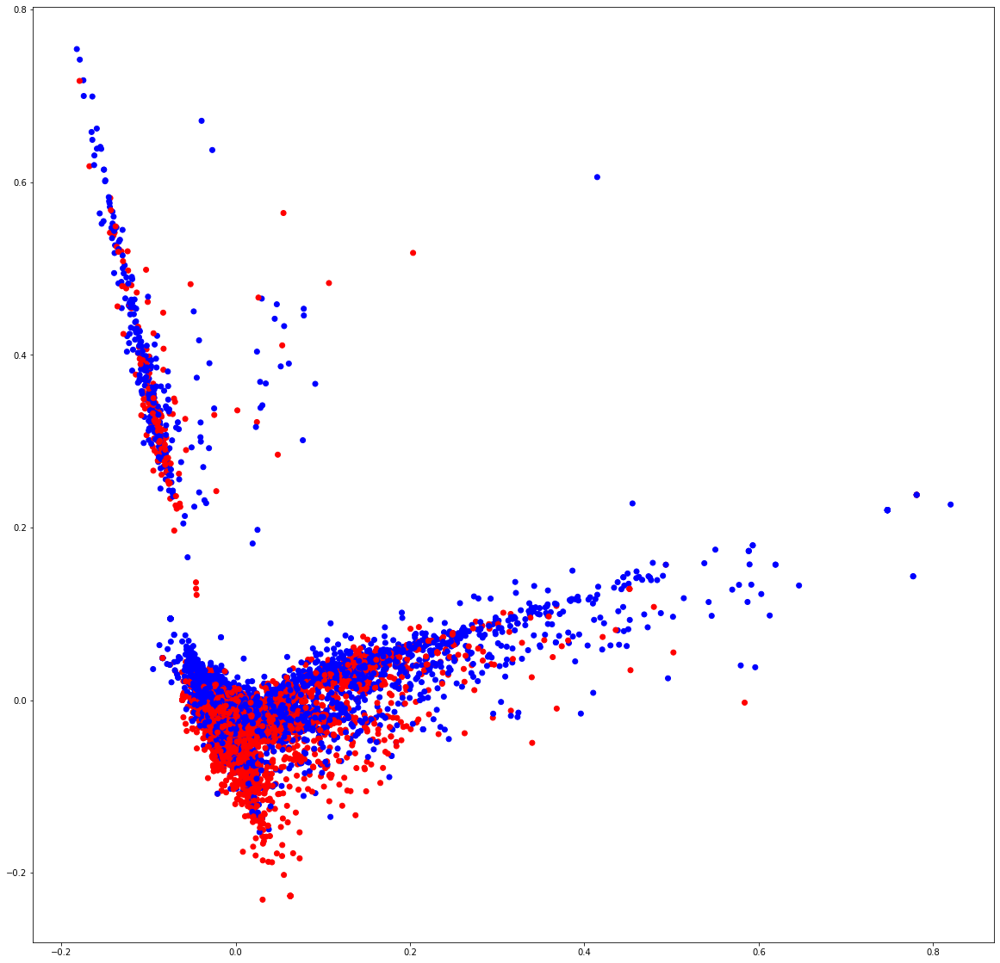

In [21]:

from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt

labels_dict = {'Negative':'red', 'Neutral':'gray', 'Positive':'blue'}

def convert_labels(label):
    return labels_dict[label]

first_K_targets = shuffled_df.head(K).label.apply(lambda x: convert_labels(x))


pipeline = Pipeline([
    ('vect', CountVectorizer()),
    ('tfidf', TfidfTransformer()),
])        
X = pipeline.fit_transform(first_K_tweets).todense()

pca = PCA(n_components=2).fit(X)
data2D = pca.transform(X)
plt.figure(figsize = (20, 20))
plt.scatter(data2D[:,0], data2D[:,1], c=first_K_targets)
plt.show()

# Training

### Naive Bayes

In [27]:
class ModelPipeline:
    def __init__(self, estimator=None, transformer=None, dim_reduction=None, verbose=False):
        self.transformer = transformer
        self.estimator = estimator
        self.dim_reduction = dim_reduction
        self.verbose = verbose

    def fit(self, X, Y):
        self.transformer.fit(X)
        X_train = self.transformer.transform(X)
        if self.dim_reduction != None:
            if self.verbose:
                print("dimension reduction")
            self.dim_reduction.fit(X_train)
            X_train = self.dim_reduction.transform(X_train)
        self.estimator.fit(X_train, Y)
    
    def predict(self, X):
        X_test = self.transformer.transform(X)
        if self.dim_reduction != None:
            X_test = self.dim_reduction.transform(X_test)
        return self.estimator.predict(X_test)
    
    def predict_proba(self, X):
        X_test = self.transformer.transform(X)
        return self.estimator.predict_proba(X_test)

In [30]:

from sklearn.feature_extraction.text import TfidfVectorizer
#from model import ModelPipeline
from sklearn.metrics import classification_report

from sklearn.naive_bayes import BernoulliNB

model = ModelPipeline(estimator=BernoulliNB(), transformer=vectorizer)

model.fit(X_train.tolist(), y_train.tolist())

AttributeError: 'list' object has no attribute 'lower'

In [ ]:
y_prediction = model.predict(X_test)
print(classification_report(y_test, y_prediction))